# Chuẩn hoá dữ liệu sentiment theo quý + EDA hiển thị trực tiếp trong Notebook

Notebook này làm các việc sau:

1. Đọc dữ liệu sentiment thô từ thư mục `raw_public_sentiment_data`
2. Làm sạch dữ liệu sentiment
3. Tổng hợp dữ liệu theo tháng và theo quý
4. Tạo quý thiếu và nội suy dữ liệu liên tục
5. Tùy chọn ghép với dữ liệu vĩ mô từ file `secondary_data_processed.csv`
6. Tạo bộ dữ liệu sẵn sàng cho mô hình hóa
7. Chuẩn hóa các biến số
8. Chạy EDA, **vừa lưu file ra output vừa hiển thị kết quả ngay trong notebook**
9. Hiển thị:
   - bảng thống kê mô tả
   - ma trận tương quan
   - kiểm định ADF/KPSS
   - scatter plots
   - decomposition plots
   - line plots cho các biến
   - tùy chọn hồi quy OLS sơ bộ

> Ghi chú: notebook này đã xử lý trường hợp cột thời gian trong file macro là `Unnamed: 0`.


## 1. Cấu hình đường dẫn và tuỳ chọn hiển thị

Bạn có thể sửa các biến bên dưới trước khi chạy.


In [1]:

from pathlib import Path

SENTIMENT_DIR = Path("raw_public_sentiment_data")
MACRO_FILE = Path("secondary_data_processed.csv")
MACRO_SHEET = None
OUTDIR = Path("cleaned_public_sentiment_quarterly_notebook")

# Nếu file macro đã có quá nhiều feature xử lý sẵn (lag, diff, scaled, ...)
# thì nên giữ lại bộ cột gốc để dữ liệu model-ready gọn hơn.
KEEP_ONLY_BASE_MACRO_COLUMNS = True
BASE_MACRO_COLUMNS = [
    "date",
    "gdp_raw",
    "inflation",
    "interest_rate",
    "fdi_pct_gdp",
    "investment_pct_gdp",
    "export_pct_gdp",
    "unemployment_rate",
    "gov_spending_pct_gdp",
]

# Hiển thị mọi line plot như file Python cũ.
# Nếu notebook quá nặng, đổi thành False để chỉ hiển thị một số biểu đồ chính.
DISPLAY_ALL_LINE_PLOTS = True

# Hiển thị decomposition plot trong notebook
DISPLAY_DECOMPOSITION_PLOTS = True

# Bật hồi quy OLS thăm dò ban đầu
RUN_BASELINE_OLS = False

OUTDIR.mkdir(parents=True, exist_ok=True)

print("SENTIMENT_DIR =", SENTIMENT_DIR.resolve())
print("MACRO_FILE =", MACRO_FILE.resolve())
print("OUTDIR =", OUTDIR.resolve())


SENTIMENT_DIR = /Users/TranAnh/Documents/Data_file_NCKH/raw_public_sentiment_data
MACRO_FILE = /Users/TranAnh/Documents/Data_file_NCKH/secondary_data_processed.csv
OUTDIR = /Users/TranAnh/Documents/Data_file_NCKH/cleaned_public_sentiment_quarterly_notebook


## 2. Import thư viện

In [2]:

from __future__ import annotations

import json
import math
import warnings
from pathlib import Path
from typing import Dict, List, Optional, Tuple

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display, Markdown
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose

try:
    import statsmodels.api as sm
except Exception:
    sm = None

pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 200)
pd.set_option("display.width", 200)
plt.rcParams["figure.figsize"] = (10, 5)
plt.rcParams["axes.grid"] = True


## 3. Hàm tiện ích

Cell này giữ logic gốc nhưng có một số vá quan trọng:

- fallback từ `.parquet` sang `.csv` nếu cần
- nhận diện `unnamed:_0`, `unnamed:_1`, ... và ánh xạ phù hợp
- hỗ trợ hiển thị plot trực tiếp trong notebook đồng thời vẫn lưu file


In [3]:

DEFAULT_SENTIMENT_RAW_CSV = "youtube_comments_sentiment_raw.csv"
DEFAULT_SENTIMENT_RAW_PARQUET = "youtube_comments_sentiment_raw.parquet"
DEFAULT_SENTIMENT_MONTHLY_CSV = "youtube_sentiment_monthly.csv"

RATIO_COLS = {
    "positive_ratio",
    "negative_ratio",
    "neutral_ratio",
}
COUNT_COLS = {
    "n_comments",
    "n_unique_authors",
    "like_sum",
}
NON_FEATURE_COLS = {
    "quarter",
    "month",
    "topic",
    "period",
    "date",
    "quarter_end",
    "month_end",
    "was_missing_period",
}


def safe_mkdir(path: Path) -> None:
    path.mkdir(parents=True, exist_ok=True)


def normalize_columns(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    new_cols = []
    for c in df.columns:
        s = str(c).strip().lower().replace(" ", "_").replace("-", "_").replace("/", "_")
        s = s.replace(":", "_")
        while "__" in s:
            s = s.replace("__", "_")
        new_cols.append(s)
    df.columns = new_cols

    # Vá cho file CSV có cột đầu tiên là Unnamed: 0 nhưng thực chất là cột thời gian
    unnamed_candidates = [c for c in df.columns if c.startswith("unnamed")]
    if "date" not in df.columns and len(unnamed_candidates) == 1:
        df = df.rename(columns={unnamed_candidates[0]: "date"})

    return df


def sentiment_label_from_score(x: float) -> str:
    if pd.isna(x):
        return "neutral"
    if x >= 0.05:
        return "positive"
    if x <= -0.05:
        return "negative"
    return "neutral"


def load_sentiment_raw(sentiment_dir: Path) -> pd.DataFrame:
    pq = sentiment_dir / DEFAULT_SENTIMENT_RAW_PARQUET
    csv = sentiment_dir / DEFAULT_SENTIMENT_RAW_CSV

    if pq.exists():
        try:
            df = pd.read_parquet(pq)
            return normalize_columns(df)
        except Exception as e:
            print(f"Không đọc được parquet, fallback sang csv. Lý do: {e}")

    if csv.exists():
        df = pd.read_csv(csv)
        return normalize_columns(df)

    raise FileNotFoundError(
        f"Không tìm thấy {DEFAULT_SENTIMENT_RAW_PARQUET} hoặc {DEFAULT_SENTIMENT_RAW_CSV} trong {sentiment_dir}"
    )


def clean_sentiment_raw(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()

    if "published_at" not in df.columns:
        raise ValueError("Thiếu cột 'published_at' trong dữ liệu sentiment thô.")

    df["published_at"] = pd.to_datetime(df["published_at"], errors="coerce", utc=True)
    df = df.dropna(subset=["published_at"]).reset_index(drop=True)

    if "text_anon" not in df.columns and "text_raw" in df.columns:
        df["text_anon"] = df["text_raw"].astype(str)

    if "text_anon" in df.columns:
        df["text_anon"] = df["text_anon"].astype(str).str.replace(r"\s+", " ", regex=True).str.strip()
        df = df[df["text_anon"].str.len() >= 5].copy()

    if "comment_id" in df.columns:
        dedup_cols = [c for c in ["platform", "comment_id"] if c in df.columns]
        if dedup_cols:
            df = df.drop_duplicates(subset=dedup_cols, keep="first")

    if "sentiment_score" in df.columns:
        df["sentiment_score"] = pd.to_numeric(df["sentiment_score"], errors="coerce")
    else:
        raise ValueError("Thiếu cột 'sentiment_score'. Hãy dùng file raw đã được chấm sentiment.")

    if "like_count" not in df.columns:
        df["like_count"] = 0
    df["like_count"] = pd.to_numeric(df["like_count"], errors="coerce").fillna(0)

    if "topic" not in df.columns:
        df["topic"] = "all"
    df["topic"] = df["topic"].fillna("all").astype(str)

    if "author_hash" not in df.columns:
        df["author_hash"] = np.nan

    if "sentiment_label" not in df.columns:
        df["sentiment_label"] = df["sentiment_score"].map(sentiment_label_from_score)
    else:
        df["sentiment_label"] = df["sentiment_label"].fillna(df["sentiment_score"].map(sentiment_label_from_score))

    df["published_at"] = df["published_at"].dt.tz_convert(None)
    df = df.sort_values("published_at").reset_index(drop=True)
    return df


def agg_one_group(g: pd.DataFrame) -> pd.Series:
    weights = g["like_count"].fillna(0).astype(float) + 1.0
    score = g["sentiment_score"].astype(float)

    out = {
        "n_comments": int(len(g)),
        "n_unique_authors": int(g["author_hash"].dropna().nunique()) if "author_hash" in g.columns else np.nan,
        "like_sum": float(g["like_count"].fillna(0).sum()),
        "like_mean": float(g["like_count"].fillna(0).mean()),
        "avg_sentiment": float(score.mean()),
        "median_sentiment": float(score.median()),
        "std_sentiment": float(score.std(ddof=1)) if len(g) > 1 else 0.0,
        "positive_ratio": float((g["sentiment_label"] == "positive").mean()),
        "negative_ratio": float((g["sentiment_label"] == "negative").mean()),
        "neutral_ratio": float((g["sentiment_label"] == "neutral").mean()),
        "net_sentiment": float((g["sentiment_label"] == "positive").mean() - (g["sentiment_label"] == "negative").mean()),
        "weighted_sentiment_like": float(np.average(score, weights=weights)) if len(g) else np.nan,
        "p10_sentiment": float(score.quantile(0.10)),
        "p90_sentiment": float(score.quantile(0.90)),
    }
    return pd.Series(out)


def aggregate_sentiment(df: pd.DataFrame, freq: str = "Q") -> pd.DataFrame:
    work = df.copy()
    if freq.upper().startswith("Q"):
        work["period"] = work["published_at"].dt.to_period("Q")
        period_col = "quarter"
    else:
        work["period"] = work["published_at"].dt.to_period("M")
        period_col = "month"

    grouped = work.groupby(["period", "topic"], observed=False, dropna=False)
    out = grouped.apply(agg_one_group).reset_index()
    out[period_col] = out["period"].astype(str)
    out = out.drop(columns=["period"]).sort_values([period_col, "topic"]).reset_index(drop=True)

    all_grouped = work.groupby([work["published_at"].dt.to_period("Q" if freq.upper().startswith("Q") else "M")], observed=False, dropna=False)
    all_out = all_grouped.apply(agg_one_group).reset_index()
    if freq.upper().startswith("Q"):
        all_out["quarter"] = all_out["published_at"].astype(str)
        all_out = all_out.drop(columns=["published_at"])
    else:
        all_out["month"] = all_out["published_at"].astype(str)
        all_out = all_out.drop(columns=["published_at"])
    all_out["topic"] = "all"

    out = pd.concat([out, all_out], ignore_index=True)
    out = out.sort_values([period_col, "topic"]).reset_index(drop=True)
    return out


def build_complete_period_index(periods: pd.Series, freq: str) -> pd.PeriodIndex:
    min_p = periods.min()
    max_p = periods.max()
    return pd.period_range(start=min_p, end=max_p, freq=freq)


def fill_missing_time_periods(df: pd.DataFrame, freq: str = "Q") -> pd.DataFrame:
    if df.empty:
        return df

    period_col = "quarter" if freq.upper().startswith("Q") else "month"
    period_freq = "Q" if freq.upper().startswith("Q") else "M"

    work = df.copy()
    work["period_obj"] = pd.PeriodIndex(work[period_col], freq=period_freq)

    topics = sorted(work["topic"].dropna().astype(str).unique())
    full_index = build_complete_period_index(work["period_obj"], period_freq)

    num_cols = [c for c in work.columns if c not in {period_col, "topic", "period_obj"}]
    continuous_cols = [c for c in num_cols if c not in COUNT_COLS]

    pieces = []
    for topic in topics:
        sub = work[work["topic"] == topic].copy().set_index("period_obj").sort_index()
        sub = sub.reindex(full_index)
        sub["topic"] = topic
        sub[period_col] = sub.index.astype(str)
        sub["was_missing_period"] = sub["n_comments"].isna().astype(int) if "n_comments" in sub.columns else 0

        for c in COUNT_COLS:
            if c in sub.columns:
                sub[c] = sub[c].fillna(0)

        for c in continuous_cols:
            if c in sub.columns:
                sub[c] = pd.to_numeric(sub[c], errors="coerce")
                sub[c] = sub[c].interpolate(method="linear", limit_direction="both")

        for c in RATIO_COLS:
            if c in sub.columns:
                sub[c] = sub[c].clip(0, 1)

        if {"positive_ratio", "negative_ratio"}.issubset(set(sub.columns)):
            sub["net_sentiment"] = sub["positive_ratio"] - sub["negative_ratio"]

        pieces.append(sub.reset_index(drop=True))

    out = pd.concat(pieces, ignore_index=True)
    return out[[period_col, "topic"] + [c for c in out.columns if c not in {period_col, "topic"}]]


def add_quarter_end(df: pd.DataFrame, period_col: str) -> pd.DataFrame:
    out = df.copy()
    if period_col == "quarter":
        out["quarter_end"] = pd.PeriodIndex(out[period_col], freq="Q").to_timestamp(how="end").normalize()
    else:
        out["month_end"] = pd.PeriodIndex(out[period_col], freq="M").to_timestamp(how="end").normalize()
    return out


def compute_ts_features(df: pd.DataFrame, date_col: str = "quarter_end") -> pd.DataFrame:
    out = df.copy().sort_values(date_col).reset_index(drop=True)
    numeric_cols = [c for c in out.columns if c not in NON_FEATURE_COLS and pd.api.types.is_numeric_dtype(out[c])]

    for c in numeric_cols:
        out[f"{c}_lag1"] = out[c].shift(1)
        out[f"{c}_lag4"] = out[c].shift(4)
        out[f"{c}_diff1"] = out[c].diff(1)
        out[f"{c}_diff4"] = out[c].diff(4)
        positive_mask = (out[c] > 0).all()
        if positive_mask:
            out[f"{c}_qoq_pct"] = out[c].pct_change(1)
            out[f"{c}_yoy_pct"] = out[c].pct_change(4)

        lower = c.lower()
        if "gdp" in lower and (out[c] > 0).all():
            out[f"log_{c}"] = np.log(out[c])

    return out


def infer_date_column(df: pd.DataFrame) -> str:
    candidates = [
        "date", "quarter_end", "month_end", "period", "quarter", "month", "time", "timestamp"
    ]
    for c in candidates:
        if c in df.columns:
            return c
    raise ValueError("Không tìm thấy cột thời gian. Hãy thêm một cột như date/quarter/month.")


def read_any_table(path: Path, sheet_name: Optional[str] = None) -> pd.DataFrame:
    if path.suffix.lower() in {".xlsx", ".xls"}:
        df = pd.read_excel(path, sheet_name=sheet_name)
    elif path.suffix.lower() == ".csv":
        df = pd.read_csv(path)
    elif path.suffix.lower() == ".parquet":
        df = pd.read_parquet(path)
    else:
        raise ValueError(f"Định dạng chưa hỗ trợ: {path.suffix}")
    return normalize_columns(df)


def infer_series_frequency(date_series: pd.Series) -> str:
    ds = pd.to_datetime(date_series, errors="coerce")
    ds = ds.dropna().sort_values().drop_duplicates()
    if len(ds) < 3:
        return "unknown"

    diffs = ds.diff().dropna().dt.days
    median_gap = diffs.median()
    if median_gap <= 40:
        return "monthly"
    if median_gap <= 120:
        return "quarterly"
    if median_gap <= 400:
        return "annual"
    return "unknown"


def parse_to_quarter_end(s: pd.Series) -> pd.Series:
    parsed = pd.to_datetime(s, errors="coerce")
    if parsed.notna().mean() > 0.8:
        return pd.PeriodIndex(parsed.dt.to_period("Q"), freq="Q").to_timestamp(how="end").normalize()

    s2 = s.astype(str).str.strip().str.upper()
    q_mask = s2.str.match(r"^\d{4}Q[1-4]$")
    if q_mask.all():
        return pd.PeriodIndex(s2, freq="Q").to_timestamp(how="end").normalize()

    warnings.warn("Không parse được hoàn toàn cột thời gian sang quý. Một số dòng có thể bị loại.")
    return pd.PeriodIndex(pd.to_datetime(s, errors="coerce").dt.to_period("Q"), freq="Q").to_timestamp(how="end").normalize()


def annual_to_quarterly_same_year(df: pd.DataFrame, date_col: str, value_cols: List[str]) -> pd.DataFrame:
    work = df.copy()
    work[date_col] = pd.to_datetime(work[date_col], errors="coerce")
    work = work.dropna(subset=[date_col])
    rows = []
    for _, r in work.iterrows():
        year = pd.Timestamp(r[date_col]).year
        for q in [1, 2, 3, 4]:
            d = pd.Period(f"{year}Q{q}", freq="Q").to_timestamp(how="end").normalize()
            row = {"quarter_end": d}
            for c in value_cols:
                row[c] = r[c]
            rows.append(row)
    return pd.DataFrame(rows)


def monthly_to_quarterly(df: pd.DataFrame, date_col: str, value_cols: List[str]) -> pd.DataFrame:
    work = df.copy()
    work[date_col] = pd.to_datetime(work[date_col], errors="coerce")
    work = work.dropna(subset=[date_col]).sort_values(date_col)
    work = work.set_index(date_col)
    out = work[value_cols].resample("Q").mean().reset_index().rename(columns={date_col: "quarter_end"})
    out["quarter_end"] = pd.to_datetime(out["quarter_end"]).dt.normalize()
    return out


def quarterly_to_quarterly(df: pd.DataFrame, date_col: str, value_cols: List[str]) -> pd.DataFrame:
    work = df.copy()
    work["quarter_end"] = parse_to_quarter_end(work[date_col])
    work = work.dropna(subset=["quarter_end"])
    out = work.groupby("quarter_end", as_index=False)[value_cols].mean()
    return out


def load_and_prepare_macro(macro_file: Path, sheet_name: Optional[str] = None, keep_only_base_macro_columns: bool = False) -> pd.DataFrame:
    raw = read_any_table(macro_file, sheet_name=sheet_name)

    if keep_only_base_macro_columns:
        keep = [c for c in BASE_MACRO_COLUMNS if c in raw.columns]
        if keep:
            raw = raw[keep].copy()

    date_col = infer_date_column(raw)
    freq = infer_series_frequency(raw[date_col])

    value_cols = [c for c in raw.columns if c != date_col and pd.api.types.is_numeric_dtype(raw[c])]
    if not value_cols:
        for c in raw.columns:
            if c != date_col:
                raw[c] = pd.to_numeric(raw[c], errors="coerce")
        value_cols = [c for c in raw.columns if c != date_col and pd.api.types.is_numeric_dtype(raw[c])]

    raw = raw[[date_col] + value_cols].copy()

    if freq == "annual":
        macro_q = annual_to_quarterly_same_year(raw, date_col, value_cols)
    elif freq == "monthly":
        macro_q = monthly_to_quarterly(raw, date_col, value_cols)
    else:
        macro_q = quarterly_to_quarterly(raw, date_col, value_cols)

    macro_q = macro_q.sort_values("quarter_end").drop_duplicates(subset=["quarter_end"]).reset_index(drop=True)

    for c in value_cols:
        lower = c.lower()
        if "gdp" in lower and (macro_q[c] > 0).all():
            macro_q[f"log_{c}"] = np.log(macro_q[c])

    inflation_candidates = [c for c in macro_q.columns if any(k in c.lower() for k in ["inflation", "cpi_inflation", "inflation_rate"])]
    rate_candidates = [c for c in macro_q.columns if any(k in c.lower() for k in ["interest_rate", "policy_rate", "lending_rate", "rate"]) and "real_" not in c.lower()]
    if inflation_candidates and rate_candidates:
        macro_q["real_interest_rate"] = macro_q[rate_candidates[0]] - macro_q[inflation_candidates[0]]

    return macro_q


def make_quarterly_model_ready(sent_q: pd.DataFrame, macro_q: Optional[pd.DataFrame]) -> pd.DataFrame:
    sent_all = sent_q[sent_q["topic"] == "all"].copy()
    sent_all = add_quarter_end(sent_all, "quarter")
    sent_all = sent_all.sort_values("quarter_end").reset_index(drop=True)

    if macro_q is None:
        merged = sent_all.copy()
    else:
        merged = pd.merge(macro_q, sent_all, on="quarter_end", how="outer").sort_values("quarter_end").reset_index(drop=True)
        if "quarter" not in merged.columns:
            merged["quarter"] = pd.PeriodIndex(merged["quarter_end"], freq="Q").astype(str)
        if "topic" not in merged.columns:
            merged["topic"] = "all"

    merged = merged.sort_values("quarter_end").reset_index(drop=True)

    num_cols = [c for c in merged.columns if c not in NON_FEATURE_COLS]
    for c in num_cols:
        merged[c] = pd.to_numeric(merged[c], errors="coerce")

    for c in num_cols:
        merged[c] = merged[c].interpolate(method="linear", limit_direction="both")

    merged = compute_ts_features(merged, date_col="quarter_end")
    return merged


def standardize_numeric(df: pd.DataFrame, exclude_cols: Optional[List[str]] = None) -> Tuple[pd.DataFrame, pd.DataFrame]:
    exclude_cols = set(exclude_cols or []) | NON_FEATURE_COLS
    out = df.copy()
    num_cols = [c for c in out.columns if c not in exclude_cols and pd.api.types.is_numeric_dtype(out[c])]

    scaler = StandardScaler()
    fit_df = out[num_cols].copy()
    fit_df = fit_df.replace([np.inf, -np.inf], np.nan)
    fill_values = fit_df.mean(numeric_only=True)
    fit_df = fit_df.fillna(fill_values)

    scaled = scaler.fit_transform(fit_df)
    scaled_df = pd.DataFrame(scaled, columns=[f"z_{c}" for c in num_cols], index=out.index)

    scaler_info = pd.DataFrame({
        "feature": num_cols,
        "mean": scaler.mean_,
        "scale": scaler.scale_,
    })
    out = pd.concat([out, scaled_df], axis=1)
    return out, scaler_info


def stationarity_tests(series: pd.Series) -> Dict[str, float]:
    s = pd.to_numeric(series, errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    if len(s) < 8:
        return {
            "n_obs": len(s),
            "adf_stat": np.nan,
            "adf_pvalue": np.nan,
            "kpss_stat": np.nan,
            "kpss_pvalue": np.nan,
            "is_stationary_adf_5pct": np.nan,
            "is_stationary_kpss_5pct": np.nan,
        }

    try:
        adf_stat, adf_p, _, _, _, _ = adfuller(s, autolag="AIC")
    except Exception:
        adf_stat, adf_p = np.nan, np.nan

    try:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            kpss_stat, kpss_p, _, _ = kpss(s, regression="c", nlags="auto")
    except Exception:
        kpss_stat, kpss_p = np.nan, np.nan

    return {
        "n_obs": len(s),
        "adf_stat": adf_stat,
        "adf_pvalue": adf_p,
        "kpss_stat": kpss_stat,
        "kpss_pvalue": kpss_p,
        "is_stationary_adf_5pct": bool(adf_p < 0.05) if pd.notna(adf_p) else np.nan,
        "is_stationary_kpss_5pct": bool(kpss_p > 0.05) if pd.notna(kpss_p) else np.nan,
    }


def plot_line_inline(df: pd.DataFrame, x: str, y: str, outpath: Optional[Path] = None, title: Optional[str] = None) -> None:
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(df[x], df[y], marker="o")
    ax.set_title(title or y)
    ax.set_xlabel(x)
    ax.set_ylabel(y)
    ax.grid(True, alpha=0.25)
    fig.tight_layout()
    if outpath is not None:
        fig.savefig(outpath, dpi=180, bbox_inches="tight")
    plt.show()
    plt.close(fig)


def plot_scatter_inline(df: pd.DataFrame, x: str, y: str, outpath: Optional[Path] = None, title: Optional[str] = None) -> None:
    valid = df[[x, y]].dropna()
    if valid.empty:
        print(f"Bỏ qua scatter {y} vs {x} vì không có dữ liệu hợp lệ.")
        return
    fig, ax = plt.subplots(figsize=(6, 5))
    ax.scatter(valid[x], valid[y], alpha=0.75)
    ax.set_title(title or f"{y} vs {x}")
    ax.set_xlabel(x)
    ax.set_ylabel(y)
    ax.grid(True, alpha=0.25)
    fig.tight_layout()
    if outpath is not None:
        fig.savefig(outpath, dpi=180, bbox_inches="tight")
    plt.show()
    plt.close(fig)


def run_decomposition_inline(df: pd.DataFrame, date_col: str, cols: List[str], outdir: Path, period: int = 4, display_plots: bool = True) -> pd.DataFrame:
    rows = []
    for c in cols:
        s = df[[date_col, c]].dropna().copy()
        if len(s) < max(8, period * 2):
            print(f"Bỏ qua decomposition cho {c}: quá ít quan sát.")
            continue
        s = s.set_index(date_col)[c].astype(float)
        try:
            res = seasonal_decompose(s, model="additive", period=period, extrapolate_trend="freq")
        except Exception as e:
            print(f"Không decomposition được {c}: {e}")
            continue

        fig = res.plot()
        fig.set_size_inches(10, 8)
        fig.tight_layout()
        fig.savefig(outdir / f"decompose_{c}.png", dpi=180, bbox_inches="tight")
        if display_plots:
            plt.show()
        plt.close(fig)

        comp = pd.DataFrame({
            date_col: s.index,
            "observed": res.observed,
            "trend": res.trend,
            "seasonal": res.seasonal,
            "resid": res.resid,
        })
        comp.to_csv(outdir / f"decompose_{c}.csv", index=False, encoding="utf-8-sig")
        display(Markdown(f"**Decomposition components for `{c}`**"))
        display(comp.head(12))
        rows.append({"column": c, "period": period, "n_obs": len(s)})
    return pd.DataFrame(rows)


def run_optional_baseline_ols(df: pd.DataFrame, outdir: Path) -> Optional[Tuple[pd.DataFrame, str]]:
    if sm is None:
        return None

    work = df.copy()
    gdp_candidates = [c for c in work.columns if "gdp" in c.lower() and c.endswith("_yoy_pct")]
    inf_candidates = [c for c in work.columns if any(k in c.lower() for k in ["inflation", "cpi"]) and c.endswith("_yoy_pct")]
    rate_candidates = [c for c in work.columns if any(k in c.lower() for k in ["interest_rate", "real_interest_rate", "policy_rate"]) and not c.startswith("z_")]
    sent_candidates = [c for c in work.columns if c in ["avg_sentiment", "net_sentiment", "weighted_sentiment_like"]]

    if not gdp_candidates:
        print("Không tìm thấy biến GDP growth dạng *_yoy_pct cho OLS.")
        return None
    y_col = gdp_candidates[0]

    x_cols = []
    if rate_candidates:
        x_cols.append(rate_candidates[0])
    if inf_candidates:
        x_cols.append(inf_candidates[0])
    if sent_candidates:
        x_cols.append(sent_candidates[0])
    if not x_cols:
        print("Không đủ biến giải thích để chạy OLS.")
        return None

    reg = work[[y_col] + x_cols].dropna().copy()
    if len(reg) < 8:
        print("Không đủ quan sát để chạy OLS.")
        return None

    X = sm.add_constant(reg[x_cols])
    y = reg[y_col]
    model = sm.OLS(y, X).fit()

    coef = pd.DataFrame({
        "term": model.params.index,
        "coef": model.params.values,
        "pvalue": model.pvalues.values,
        "tvalue": model.tvalues.values,
    })
    coef.to_csv(outdir / "baseline_ols_coefficients.csv", index=False, encoding="utf-8-sig")

    summary_text = model.summary().as_text()
    with open(outdir / "baseline_ols_summary.txt", "w", encoding="utf-8") as f:
        f.write(summary_text)

    return coef, summary_text


## 4. Đọc dữ liệu sentiment thô và xem nhanh cấu trúc

In [4]:

raw = load_sentiment_raw(SENTIMENT_DIR)

display(Markdown("### Kích thước dữ liệu sentiment thô"))
print(raw.shape)

display(Markdown("### 10 dòng đầu"))
display(raw.head(10))

display(Markdown("### Danh sách cột"))
display(pd.DataFrame({"column": raw.columns}))


### Kích thước dữ liệu sentiment thô

(12066, 17)


### 10 dòng đầu

,platform,topic,query,video_id,comment_id,parent_id,is_reply,published_at,like_count,author_hash,text_raw,text_anon,text_for_sentiment,sentiment_score,polarity,subjectivity,sentiment_label
0,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgwW5kezWvhbJRVN2o54AaABAg,None,False,2019-07-05 11:08:26+00:00,30,837e9d4858c1fca817ba2a3a55e6ffcb1e770a3d2dc2a8...,Đồng tiền có giá trị thấp - không có nghĩa là ...,Đồng tiền có giá trị thấp - không có nghĩa là ...,Đồng tiền có giá trị thấp - không có nghĩa là ...,0.0000,0.0000,None,neutral
1,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgxOf1CYdZ-juHdswWt4AaABAg,None,False,2019-07-05 11:09:06+00:00,51,915034124a989da22d61a29984888aa116c8031bcab16c...,Mình dân Kinh tế cho nên rất thích những video...,Mình dân Kinh tế cho nên rất thích những video...,Mình dân Kinh tế cho nên rất thích những video...,0.0000,0.0000,None,neutral
2,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,Ugz09bVz0dM_Y-wivF54AaABAg,None,False,2019-07-05 11:20:37+00:00,1,f2a240fa9592ca698995d6112b6fdef8a3109aee11b185...,Tiền vn cũ giờ có giá gì ko a,Tiền vn cũ giờ có giá gì ko a,Tiền vn cũ giờ có giá gì ko a,0.0000,0.0000,None,neutral
3,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,Ugxy9vOlWjpAp5HDXyp4AaABAg,None,False,2019-07-05 11:26:33+00:00,432,ec98778a1ad5ce77f903fca664d3ce1d310ac21f240473...,Video vậy xem còn biết cái này cái kia . Còn m...,Video vậy xem còn biết cái này cái kia . Còn m...,Video vậy xem còn biết cái này cái kia . Còn m...,-0.8555,-0.8555,None,negative
4,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgwVfn9wX-d3EzZd_q14AaABAg,None,False,2019-07-05 11:28:54+00:00,1,a32c7f6488c57f5ae35d02830b0455b70fe4e115c948b6...,làm thêm nhiều video nữa nhé bạn,làm thêm nhiều video nữa nhé bạn,làm thêm nhiều video nữa nhé bạn,0.0000,0.0000,None,neutral
5,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgxlyPAcVAipKYs4YQJ4AaABAg,None,False,2019-07-05 11:33:08+00:00,2,8cf49aa375441589b48ed65be201d1d2a231a9eb53afe5...,hãy còn cao hơn đồng đo la của Zimbabwe nhiều....,hãy còn cao hơn đồng đo la của Zimbabwe nhiều....,hãy còn cao hơn đồng đo la của Zimbabwe nhiều....,0.0000,0.0000,None,neutral
6,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgyCDM-oKXiZnQK1JRR4AaABAg,None,False,2019-07-05 11:34:24+00:00,56,a32c7f6488c57f5ae35d02830b0455b70fe4e115c948b6...,tai sao lại đường sắt cát linh lại đối với hàn...,tai sao lại đường sắt cát linh lại đối với hàn...,tai sao lại đường sắt cát linh lại đối với hàn...,0.0000,0.0000,None,neutral
7,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgwW5kezWvhbJRVN2o54AaABAg.8x-bNkPLDPF8x-eRagDeZo,UgwW5kezWvhbJRVN2o54AaABAg,True,2019-07-05 11:35:10+00:00,3,4f8f3f69cd69f6a02ad17ec5d0a001ad18b9a002f2ab3d...,ad làm video công tâm quá .,ad làm video công tâm quá .,ad làm video công tâm quá .,0.0000,0.0000,None,neutral
8,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgzugBWrXZWAq9Psvrx4AaABAg,None,False,2019-07-05 11:36:38+00:00,1,7d5ea191a8854892ca3220c13117a9917c84176df24c7c...,Nên nhớ tiền VN bắt đầu từ số 100 chứ k phải số 1,Nên nhớ tiền VN bắt đầu từ số 100 chứ k phải số 1,Nên nhớ tiền VN bắt đầu từ số 100 chứ k phải số 1,0.0000,0.0000,None,neutral
9,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgwVfn9wX-d3EzZd_q14AaABAg.8x-dijCENnb8x-fO55oc-F,UgwVfn9wX-d3EzZd_q14AaABAg,True,2019-07-05 11:43:25+00:00,0,837e9d4858c1fca817ba2a3a55e6ffcb1e770a3d2dc2a8...,Cảm ơm bạn đã theo dõi nha,Cảm ơm bạn đã theo dõi nha,Cảm ơm bạn đã theo dõi nha,0.0000,0.0000,None,neutral


### Danh sách cột

,column
0,platform
1,topic
2,query
3,video_id
4,comment_id
5,parent_id
6,is_reply
7,published_at
8,like_count
9,author_hash


## 5. Làm sạch dữ liệu sentiment và lưu output

In [5]:

raw_clean = clean_sentiment_raw(raw)
raw_clean.to_csv(OUTDIR / "sentiment_raw_cleaned.csv", index=False, encoding="utf-8-sig")

display(Markdown("### Kích thước sau làm sạch"))
print(raw_clean.shape)

display(Markdown("### 10 dòng đầu sau làm sạch"))
display(raw_clean.head(10))

display(Markdown("### Phân bố topic"))
display(raw_clean["topic"].value_counts(dropna=False).to_frame("count"))

display(Markdown("### Phân bố sentiment_label"))
display(raw_clean["sentiment_label"].value_counts(dropna=False).to_frame("count"))


### Kích thước sau làm sạch

(12066, 17)


### 10 dòng đầu sau làm sạch

,platform,topic,query,video_id,comment_id,parent_id,is_reply,published_at,like_count,author_hash,text_raw,text_anon,text_for_sentiment,sentiment_score,polarity,subjectivity,sentiment_label
0,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgwW5kezWvhbJRVN2o54AaABAg,None,False,2019-07-05 11:08:26,30,837e9d4858c1fca817ba2a3a55e6ffcb1e770a3d2dc2a8...,Đồng tiền có giá trị thấp - không có nghĩa là ...,Đồng tiền có giá trị thấp - không có nghĩa là ...,Đồng tiền có giá trị thấp - không có nghĩa là ...,0.0000,0.0000,None,neutral
1,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgxOf1CYdZ-juHdswWt4AaABAg,None,False,2019-07-05 11:09:06,51,915034124a989da22d61a29984888aa116c8031bcab16c...,Mình dân Kinh tế cho nên rất thích những video...,Mình dân Kinh tế cho nên rất thích những video...,Mình dân Kinh tế cho nên rất thích những video...,0.0000,0.0000,None,neutral
2,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,Ugz09bVz0dM_Y-wivF54AaABAg,None,False,2019-07-05 11:20:37,1,f2a240fa9592ca698995d6112b6fdef8a3109aee11b185...,Tiền vn cũ giờ có giá gì ko a,Tiền vn cũ giờ có giá gì ko a,Tiền vn cũ giờ có giá gì ko a,0.0000,0.0000,None,neutral
3,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,Ugxy9vOlWjpAp5HDXyp4AaABAg,None,False,2019-07-05 11:26:33,432,ec98778a1ad5ce77f903fca664d3ce1d310ac21f240473...,Video vậy xem còn biết cái này cái kia . Còn m...,Video vậy xem còn biết cái này cái kia . Còn m...,Video vậy xem còn biết cái này cái kia . Còn m...,-0.8555,-0.8555,None,negative
4,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgwVfn9wX-d3EzZd_q14AaABAg,None,False,2019-07-05 11:28:54,1,a32c7f6488c57f5ae35d02830b0455b70fe4e115c948b6...,làm thêm nhiều video nữa nhé bạn,làm thêm nhiều video nữa nhé bạn,làm thêm nhiều video nữa nhé bạn,0.0000,0.0000,None,neutral
5,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgxlyPAcVAipKYs4YQJ4AaABAg,None,False,2019-07-05 11:33:08,2,8cf49aa375441589b48ed65be201d1d2a231a9eb53afe5...,hãy còn cao hơn đồng đo la của Zimbabwe nhiều....,hãy còn cao hơn đồng đo la của Zimbabwe nhiều....,hãy còn cao hơn đồng đo la của Zimbabwe nhiều....,0.0000,0.0000,None,neutral
6,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgyCDM-oKXiZnQK1JRR4AaABAg,None,False,2019-07-05 11:34:24,56,a32c7f6488c57f5ae35d02830b0455b70fe4e115c948b6...,tai sao lại đường sắt cát linh lại đối với hàn...,tai sao lại đường sắt cát linh lại đối với hàn...,tai sao lại đường sắt cát linh lại đối với hàn...,0.0000,0.0000,None,neutral
7,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgwW5kezWvhbJRVN2o54AaABAg.8x-bNkPLDPF8x-eRagDeZo,UgwW5kezWvhbJRVN2o54AaABAg,True,2019-07-05 11:35:10,3,4f8f3f69cd69f6a02ad17ec5d0a001ad18b9a002f2ab3d...,ad làm video công tâm quá .,ad làm video công tâm quá .,ad làm video công tâm quá .,0.0000,0.0000,None,neutral
8,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgzugBWrXZWAq9Psvrx4AaABAg,None,False,2019-07-05 11:36:38,1,7d5ea191a8854892ca3220c13117a9917c84176df24c7c...,Nên nhớ tiền VN bắt đầu từ số 100 chứ k phải số 1,Nên nhớ tiền VN bắt đầu từ số 100 chứ k phải số 1,Nên nhớ tiền VN bắt đầu từ số 100 chứ k phải số 1,0.0000,0.0000,None,neutral
9,youtube,inflation,"""lạm phát"" Việt Nam",IXlI9e3lQEI,UgwVfn9wX-d3EzZd_q14AaABAg.8x-dijCENnb8x-fO55oc-F,UgwVfn9wX-d3EzZd_q14AaABAg,True,2019-07-05 11:43:25,0,837e9d4858c1fca817ba2a3a55e6ffcb1e770a3d2dc2a8...,Cảm ơm bạn đã theo dõi nha,Cảm ơm bạn đã theo dõi nha,Cảm ơm bạn đã theo dõi nha,0.0000,0.0000,None,neutral


### Phân bố topic

,count
topic,
economic_growth,7225
inflation,4841


### Phân bố sentiment_label

,count
sentiment_label,
neutral,8274
positive,2318
negative,1474


## 6. Tổng hợp theo tháng

In [6]:

monthly = aggregate_sentiment(raw_clean, freq="M")
monthly = fill_missing_time_periods(monthly, freq="M")
monthly = add_quarter_end(monthly, "month")
monthly.to_csv(OUTDIR / "sentiment_monthly_cleaned.csv", index=False, encoding="utf-8-sig")

display(Markdown("### Dữ liệu sentiment theo tháng"))
display(monthly.head(20))

display(Markdown("### Số lượng bản ghi theo topic"))
display(monthly.groupby("topic").size().to_frame("n_rows"))


/var/folders/1z/3cvp7s3j1c55s1mbrcngrz3w0000gn/T/ipykernel_16196/2914446366.py:160: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  out = grouped.apply(agg_one_group).reset_index()


### Dữ liệu sentiment theo tháng

,month,topic,n_comments,n_unique_authors,like_sum,like_mean,avg_sentiment,median_sentiment,std_sentiment,positive_ratio,negative_ratio,neutral_ratio,net_sentiment,weighted_sentiment_like,p10_sentiment,p90_sentiment,was_missing_period,month_end
0,2019-07,all,3054.0,2062.0,9337.0,3.057302,0.028897,0.0,0.200956,0.090701,0.037001,0.872299,0.053700,0.009376,0.0,0.00000,0,2019-07-31
1,2019-08,all,510.0,388.0,1896.0,3.717647,0.036242,0.0,0.185193,0.092157,0.025490,0.882353,0.066667,0.116801,0.0,0.00000,0,2019-08-31
2,2019-09,all,194.0,156.0,594.0,3.061856,0.022416,0.0,0.208704,0.082474,0.041237,0.876289,0.041237,0.019932,0.0,0.00000,0,2019-09-30
3,2019-10,all,178.0,143.0,135.0,0.758427,0.037405,0.0,0.197880,0.078652,0.022472,0.898876,0.056180,0.046005,0.0,0.00000,0,2019-10-31
4,2019-11,all,89.0,75.0,30.0,0.337079,-0.008743,0.0,0.149307,0.056180,0.056180,0.887640,0.000000,0.026413,0.0,0.00000,0,2019-11-30
5,2019-12,all,85.0,76.0,174.0,2.047059,0.021159,0.0,0.228108,0.105882,0.058824,0.835294,0.047059,-0.004954,0.0,0.12138,0,2019-12-31
6,2020-01,all,112.0,94.0,137.0,1.223214,-0.017917,0.0,0.173952,0.026786,0.053571,0.919643,-0.026786,0.045748,0.0,0.00000,0,2020-01-31
7,2020-02,all,88.0,77.0,52.0,0.590909,0.022269,0.0,0.143708,0.090909,0.034091,0.875000,0.056818,0.020552,0.0,0.00000,0,2020-02-29
8,2020-03,all,50.0,47.0,34.0,0.680000,0.019756,0.0,0.197155,0.060000,0.040000,0.900000,0.020000,0.011760,0.0,0.00000,0,2020-03-31
9,2020-04,all,44.0,38.0,28.0,0.636364,0.066580,0.0,0.207592,0.113636,0.000000,0.886364,0.113636,0.050783,0.0,0.20720,0,2020-04-30


### Số lượng bản ghi theo topic

,n_rows
topic,
all,81
economic_growth,81
inflation,81


## 7. Tổng hợp theo quý

In [7]:

quarterly = aggregate_sentiment(raw_clean, freq="Q")
quarterly = fill_missing_time_periods(quarterly, freq="Q")
quarterly = add_quarter_end(quarterly, "quarter")
quarterly.to_csv(OUTDIR / "sentiment_quarterly_cleaned_by_topic.csv", index=False, encoding="utf-8-sig")

display(Markdown("### Dữ liệu sentiment theo quý"))
display(quarterly.head(20))

display(Markdown("### Số lượng bản ghi theo topic"))
display(quarterly.groupby("topic").size().to_frame("n_rows"))


/var/folders/1z/3cvp7s3j1c55s1mbrcngrz3w0000gn/T/ipykernel_16196/2914446366.py:160: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  out = grouped.apply(agg_one_group).reset_index()


### Dữ liệu sentiment theo quý

,quarter,topic,n_comments,n_unique_authors,like_sum,like_mean,avg_sentiment,median_sentiment,std_sentiment,positive_ratio,negative_ratio,neutral_ratio,net_sentiment,weighted_sentiment_like,p10_sentiment,p90_sentiment,was_missing_period,quarter_end
0,2019Q3,all,3758.0,2566.0,11827.0,3.147153,0.029559,0.0,0.199272,0.090474,0.035657,0.873869,0.054816,0.026494,0.00000,0.00000,0,2019-09-30
1,2019Q4,all,352.0,291.0,339.0,0.963068,0.021814,0.0,0.195313,0.079545,0.039773,0.880682,0.039773,0.023530,0.00000,0.00000,0,2019-12-31
2,2020Q1,all,250.0,218.0,223.0,0.892000,0.003763,0.0,0.169522,0.056000,0.044000,0.900000,0.012000,0.032254,0.00000,0.00000,0,2020-03-31
3,2020Q2,all,109.0,97.0,51.0,0.467890,0.055161,0.0,0.218812,0.110092,0.018349,0.871560,0.091743,0.085141,0.00000,0.29600,0,2020-06-30
4,2020Q3,all,162.0,135.0,47.0,0.290123,0.036823,0.0,0.184584,0.080247,0.018519,0.901235,0.061728,0.034559,0.00000,0.00000,0,2020-09-30
5,2020Q4,all,89.0,77.0,16.0,0.179775,0.057629,0.0,0.212121,0.089888,0.011236,0.898876,0.078652,0.037571,0.00000,0.00000,0,2020-12-31
6,2021Q1,all,14.0,11.0,1.0,0.071429,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,0.00000,0,2021-03-31
7,2021Q2,all,27.0,24.0,1.0,0.037037,-0.008889,0.0,0.219118,0.111111,0.074074,0.814815,0.037037,-0.008571,0.00000,0.03088,0,2021-06-30
8,2021Q3,all,9.0,8.0,0.0,0.000000,0.032889,0.0,0.098667,0.111111,0.000000,0.888889,0.111111,0.032889,0.00000,0.05920,0,2021-09-30
9,2021Q4,all,10.0,8.0,0.0,0.000000,0.136280,0.0,0.315800,0.200000,0.000000,0.800000,0.200000,0.136280,0.00000,0.45892,0,2021-12-31


### Số lượng bản ghi theo topic

,n_rows
topic,
all,27
economic_growth,27
inflation,27


## 8. Đọc và chuẩn hoá dữ liệu vĩ mô (tuỳ chọn)

Nếu `MACRO_FILE` tồn tại thì notebook sẽ:
- đọc file
- chuẩn hóa tên cột
- tự nhận diện cột thời gian
- đưa dữ liệu về mức quý
- tạo `real_interest_rate` nếu đủ biến


In [8]:

macro_q = None

if MACRO_FILE.exists():
    macro_q = load_and_prepare_macro(
        MACRO_FILE,
        sheet_name=MACRO_SHEET,
        keep_only_base_macro_columns=KEEP_ONLY_BASE_MACRO_COLUMNS,
    )
    macro_q.to_csv(OUTDIR / "macro_quarterly_prepared.csv", index=False, encoding="utf-8-sig")

    display(Markdown("### Dữ liệu macro đã chuẩn hoá về quý"))
    print(macro_q.shape)
    display(macro_q.head(20))

    display(Markdown("### Danh sách cột macro"))
    display(pd.DataFrame({"column": macro_q.columns}))
else:
    print(f"Không tìm thấy file macro: {MACRO_FILE}")


### Dữ liệu macro đã chuẩn hoá về quý

(120, 15)


,quarter_end,gdp_raw,inflation,interest_rate,fdi_pct_gdp,investment_pct_gdp,export_pct_gdp,unemployment_rate,gov_spending_pct_gdp,log_gdp_raw,log_fdi_pct_gdp,log_investment_pct_gdp,log_export_pct_gdp,log_gov_spending_pct_gdp,real_interest_rate
0,1995-06-30,21.703,7.527,24.370,8.864,27.381,34.799,1.949,8.228,3.077450,2.181998,3.309849,3.549589,2.107543,16.843
1,1995-09-30,22.681,6.914,22.957,9.145,27.620,36.808,1.943,8.269,3.121528,2.213207,3.318540,3.605715,2.112514,16.043
2,1995-12-31,23.669,6.295,21.529,9.429,27.861,38.838,1.936,8.311,3.164166,2.243790,3.327228,3.659399,2.117580,15.234
3,1996-03-31,24.657,5.675,20.100,9.713,28.103,40.868,1.930,8.353,3.205061,2.273465,3.335876,3.710347,2.122621,14.425
4,1996-06-30,25.201,5.062,18.687,9.354,28.152,41.424,2.164,8.297,3.226884,2.235804,3.337618,3.723860,2.115894,13.625
5,1996-09-30,25.745,4.449,17.274,8.996,28.201,41.979,2.397,8.242,3.248240,2.196780,3.339357,3.737169,2.109243,12.825
6,1996-12-31,26.294,3.829,15.845,8.633,28.250,42.541,2.634,8.187,3.269341,2.155592,3.341093,3.750468,2.102548,12.016
7,1997-03-31,26.844,3.210,14.417,8.270,28.300,43.103,2.870,8.131,3.290042,2.112635,3.342862,3.763593,2.095684,11.207
8,1997-06-30,26.934,4.210,14.413,7.745,28.485,43.533,2.727,8.006,3.293389,2.047047,3.349378,3.773519,2.080191,10.203
9,1997-09-30,27.025,5.221,14.408,7.214,28.672,43.968,2.582,7.879,3.296762,1.976024,3.355921,3.783462,2.064201,9.187


### Danh sách cột macro

,column
0,quarter_end
1,gdp_raw
2,inflation
3,interest_rate
4,fdi_pct_gdp
5,investment_pct_gdp
6,export_pct_gdp
7,unemployment_rate
8,gov_spending_pct_gdp
9,log_gdp_raw


## 9. Ghép sentiment với macro, tạo feature chuỗi thời gian, rồi chuẩn hoá số liệu

In [9]:

model_df = make_quarterly_model_ready(quarterly, macro_q)
model_df, scaler_info = standardize_numeric(model_df)

model_df.to_csv(OUTDIR / "model_ready_quarterly_with_scaled.csv", index=False, encoding="utf-8-sig")
scaler_info.to_csv(OUTDIR / "scaler_parameters.csv", index=False, encoding="utf-8-sig")

display(Markdown("### Model-ready quarterly data"))
print(model_df.shape)
display(model_df.head(20))

display(Markdown("### Tham số scaler"))
display(scaler_info.head(30))


/var/folders/1z/3cvp7s3j1c55s1mbrcngrz3w0000gn/T/ipykernel_16196/2914446366.py:245: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  out[f"{c}_lag1"] = out[c].shift(1)
/var/folders/1z/3cvp7s3j1c55s1mbrcngrz3w0000gn/T/ipykernel_16196/2914446366.py:246: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  out[f"{c}_lag4"] = out[c].shift(4)
/var/folders/1z/3cvp7s3j1c55s1mbrcngrz3w0000gn/T/ipykernel_16196/2914446366.py:247: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, wh

### Model-ready quarterly data

(124, 354)


,quarter_end,gdp_raw,inflation,interest_rate,fdi_pct_gdp,investment_pct_gdp,export_pct_gdp,unemployment_rate,gov_spending_pct_gdp,log_gdp_raw,log_fdi_pct_gdp,log_investment_pct_gdp,log_export_pct_gdp,log_gov_spending_pct_gdp,real_interest_rate,quarter,topic,n_comments,n_unique_authors,like_sum,like_mean,avg_sentiment,median_sentiment,std_sentiment,positive_ratio,negative_ratio,neutral_ratio,net_sentiment,weighted_sentiment_like,p10_sentiment,p90_sentiment,was_missing_period,gdp_raw_lag1,gdp_raw_lag4,gdp_raw_diff1,gdp_raw_diff4,gdp_raw_qoq_pct,gdp_raw_yoy_pct,inflation_lag1,inflation_lag4,inflation_diff1,inflation_diff4,interest_rate_lag1,interest_rate_lag4,interest_rate_diff1,interest_rate_diff4,interest_rate_qoq_pct,interest_rate_yoy_pct,fdi_pct_gdp_lag1,fdi_pct_gdp_lag4,fdi_pct_gdp_diff1,fdi_pct_gdp_diff4,fdi_pct_gdp_qoq_pct,fdi_pct_gdp_yoy_pct,investment_pct_gdp_lag1,investment_pct_gdp_lag4,investment_pct_gdp_diff1,investment_pct_gdp_diff4,investment_pct_gdp_qoq_pct,investment_pct_gdp_yoy_pct,export_pct_gdp_lag1,export_pct_gdp_lag4,export_pct_gdp_diff1,export_pct_gdp_diff4,export_pct_gdp_qoq_pct,export_pct_gdp_yoy_pct,unemployment_rate_lag1,unemployment_rate_lag4,unemployment_rate_diff1,unemployment_rate_diff4,unemployment_rate_qoq_pct,unemployment_rate_yoy_pct,gov_spending_pct_gdp_lag1,gov_spending_pct_gdp_lag4,gov_spending_pct_gdp_diff1,gov_spending_pct_gdp_diff4,gov_spending_pct_gdp_qoq_pct,gov_spending_pct_gdp_yoy_pct,log_gdp_raw_lag1,log_gdp_raw_lag4,log_gdp_raw_diff1,log_gdp_raw_diff4,log_gdp_raw_qoq_pct,log_gdp_raw_yoy_pct,log_log_gdp_raw,log_fdi_pct_gdp_lag1,log_fdi_pct_gdp_lag4,log_fdi_pct_gdp_diff1,log_fdi_pct_gdp_diff4,log_fdi_pct_gdp_qoq_pct,log_fdi_pct_gdp_yoy_pct,log_log_fdi_pct_gdp,log_investment_pct_gdp_lag1,log_investment_pct_gdp_lag4,log_investment_pct_gdp_diff1,log_investment_pct_gdp_diff4,log_investment_pct_gdp_qoq_pct,log_investment_pct_gdp_yoy_pct,log_log_investment_pct_gdp,log_export_pct_gdp_lag1,...,z_log_gdp_raw_lag4,z_log_gdp_raw_diff1,z_log_gdp_raw_diff4,z_log_gdp_raw_qoq_pct,z_log_gdp_raw_yoy_pct,z_log_log_gdp_raw,z_log_fdi_pct_gdp_lag1,z_log_fdi_pct_gdp_lag4,z_log_fdi_pct_gdp_diff1,z_log_fdi_pct_gdp_diff4,z_log_fdi_pct_gdp_qoq_pct,z_log_fdi_pct_gdp_yoy_pct,z_log_log_fdi_pct_gdp,z_log_investment_pct_gdp_lag1,z_log_investment_pct_gdp_lag4,z_log_investment_pct_gdp_diff1,z_log_investment_pct_gdp_diff4,z_log_investment_pct_gdp_qoq_pct,z_log_investment_pct_gdp_yoy_pct,z_log_log_investment_pct_gdp,z_log_export_pct_gdp_lag1,z_log_export_pct_gdp_lag4,z_log_export_pct_gdp_diff1,z_log_export_pct_gdp_diff4,z_log_export_pct_gdp_qoq_pct,z_log_export_pct_gdp_yoy_pct,z_log_log_export_pct_gdp,z_log_gov_spending_pct_gdp_lag1,z_log_gov_spending_pct_gdp_lag4,z_log_gov_spending_pct_gdp_diff1,z_log_gov_spending_pct_gdp_diff4,z_log_gov_spending_pct_gdp_qoq_pct,z_log_gov_spending_pct_gdp_yoy_pct,z_log_log_gov_spending_pct_gdp,z_real_interest_rate_lag1,z_real_interest_rate_lag4,z_real_interest_rate_diff1,z_real_interest_rate_diff4,z_n_comments_lag1,z_n_comments_lag4,z_n_comments_diff1,z_n_comments_diff4,z_n_comments_qoq_pct,z_n_comments_yoy_pct,z_n_unique_authors_lag1,z_n_unique_authors_lag4,z_n_unique_authors_diff1,z_n_unique_authors_diff4,z_n_unique_authors_qoq_pct,z_n_unique_authors_yoy_pct,z_like_sum_lag1,z_like_sum_lag4,z_like_sum_diff1,z_like_sum_diff4,z_like_mean_lag1,z_like_mean_lag4,z_like_mean_diff1,z_like_mean_diff4,z_avg_sentiment_lag1,z_avg_sentiment_lag4,z_avg_sentiment_diff1,z_avg_sentiment_diff4,z_median_sentiment_lag1,z_median_sentiment_lag4,z_median_sentiment_diff1,z_median_sentiment_diff4,z_std_sentiment_lag1,z_std_sentiment_lag4,z_std_sentiment_diff1,z_std_sentiment_diff4,z_positive_ratio_lag1,z_positive_ratio_lag4,z_positive_ratio_diff1,z_positive_ratio_diff4,z_negative_ratio_lag1,z_negative_ratio_lag4,z_negative_ratio_diff1,z_negative_ratio_diff4,z_neutral_ratio_lag1,z_neutral_ratio_lag4,z_neutral_ratio_diff1,z_neutral_ratio_diff4,z_neutral_ratio_qoq_pct,z_neutral_ratio_yoy_pct,z_net_sentiment_lag1

### Tham số scaler

,feature,mean,scale
0,gdp_raw,192.565008,157.725896
1,inflation,5.556395,4.407000
2,interest_rate,10.981685,3.378778
3,fdi_pct_gdp,5.141524,1.687097
4,investment_pct_gdp,32.181234,2.803269
5,export_pct_gdp,68.398669,16.021519
6,unemployment_rate,1.850435,0.440285
7,gov_spending_pct_gdp,8.265935,1.787814
8,log_gdp_raw,4.799548,1.051095
9,log_fdi_pct_gdp,1.593693,0.280879


## 10. Tạo bảng EDA và hiển thị trực tiếp trong notebook

In [10]:

EDA_DIR = OUTDIR / "eda"
PLOTS_DIR = EDA_DIR / "plots"
DECOMP_DIR = EDA_DIR / "decomposition"

safe_mkdir(EDA_DIR)
safe_mkdir(PLOTS_DIR)
safe_mkdir(DECOMP_DIR)

model_df_sorted = model_df.sort_values("quarter_end").reset_index(drop=True)
model_df_sorted.to_csv(EDA_DIR / "model_ready_quarterly.csv", index=False, encoding="utf-8-sig")

desc = model_df_sorted.describe(include="all").transpose()
desc.to_csv(EDA_DIR / "eda_descriptive_stats.csv", encoding="utf-8-sig")

num_cols = [c for c in model_df_sorted.columns if c not in NON_FEATURE_COLS and pd.api.types.is_numeric_dtype(model_df_sorted[c])]
corr = model_df_sorted[num_cols].corr(method="pearson")
corr.to_csv(EDA_DIR / "eda_correlation_matrix.csv", encoding="utf-8-sig")

stationarity_rows = []
for c in num_cols:
    r = stationarity_tests(model_df_sorted[c])
    r["column"] = c
    stationarity_rows.append(r)

stationarity_df = pd.DataFrame(stationarity_rows)
stationarity_df.to_csv(EDA_DIR / "stationarity_tests.csv", index=False, encoding="utf-8-sig")

display(Markdown("### Thống kê mô tả"))
display(desc)

display(Markdown("### Ma trận tương quan Pearson"))
display(corr)

display(Markdown("### Kiểm định tính dừng (ADF và KPSS)"))
display(stationarity_df.sort_values(["adf_pvalue", "kpss_pvalue"], na_position="last"))


### Thống kê mô tả

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
quarter_end,124,NaN,NaN,NaN,2010-11-14 16:38:42.580645120,1995-06-30 00:00:00,2003-03-08 12:00:00,2010-11-15 00:00:00,2018-07-23 00:00:00,2026-03-31 00:00:00,NaN
gdp_raw,124.0,NaN,NaN,NaN,192.565008,21.703,39.27,162.994,317.6,519.035,158.36576
inflation,124.0,NaN,NaN,NaN,5.556395,-1.71,3.1085,3.99,7.6385,23.115,4.424879
interest_rate,124.0,NaN,NaN,NaN,10.981685,6.96,8.2155,10.372,12.4465,24.37,3.392485
fdi_pct_gdp,124.0,NaN,NaN,NaN,5.141524,3.39,4.191,4.386,5.04725,9.713,1.693941
...,...,...,...,...,...,...,...,...,...,...,...
z_p10_sentiment_diff4,124.0,NaN,NaN,NaN,-0.0,-6.098678,0.180685,0.180685,0.180685,0.948613,1.004057
z_p90_sentiment_lag1,124.0,NaN,NaN,NaN,-0.0,-0.351962,-0.351962,-0.351962,-0.351962,3.6053,1.004057
z_p90_sentiment_lag4,124.0,NaN,NaN,NaN,0.0,-0.31638,-0.31638,-0.31638,-0.31638,4.068268,1.004057
z_p90_sentiment_diff1,124.0,NaN,NaN,NaN,-0.0,-5.194273,-0.071139,-0.071139,-0.071139,6.614096,1.004057


### Ma trận tương quan Pearson

,gdp_raw,inflation,interest_rate,fdi_pct_gdp,investment_pct_gdp,export_pct_gdp,unemployment_rate,gov_spending_pct_gdp,log_gdp_raw,log_fdi_pct_gdp,log_investment_pct_gdp,log_export_pct_gdp,log_gov_spending_pct_gdp,real_interest_rate,n_comments,n_unique_authors,like_sum,like_mean,avg_sentiment,median_sentiment,std_sentiment,positive_ratio,negative_ratio,neutral_ratio,net_sentiment,weighted_sentiment_like,p10_sentiment,p90_sentiment,gdp_raw_lag1,gdp_raw_lag4,gdp_raw_diff1,gdp_raw_diff4,gdp_raw_qoq_pct,gdp_raw_yoy_pct,inflation_lag1,inflation_lag4,inflation_diff1,inflation_diff4,interest_rate_lag1,interest_rate_lag4,interest_rate_diff1,interest_rate_diff4,interest_rate_qoq_pct,interest_rate_yoy_pct,fdi_pct_gdp_lag1,fdi_pct_gdp_lag4,fdi_pct_gdp_diff1,fdi_pct_gdp_diff4,fdi_pct_gdp_qoq_pct,fdi_pct_gdp_yoy_pct,investment_pct_gdp_lag1,investment_pct_gdp_lag4,investment_pct_gdp_diff1,investment_pct_gdp_diff4,investment_pct_gdp_qoq_pct,investment_pct_gdp_yoy_pct,export_pct_gdp_lag1,export_pct_gdp_lag4,export_pct_gdp_diff1,export_pct_gdp_diff4,export_pct_gdp_qoq_pct,export_pct_gdp_yoy_pct,unemployment_rate_lag1,unemployment_rate_lag4,unemployment_rate_diff1,unemployment_rate_diff4,unemployment_rate_qoq_pct,unemployment_rate_yoy_pct,gov_spending_pct_gdp_lag1,gov_spending_pct_gdp_lag4,gov_spending_pct_gdp_diff1,gov_spending_pct_gdp_diff4,gov_spending_pct_gdp_qoq_pct,gov_spending_pct_gdp_yoy_pct,log_gdp_raw_lag1,log_gdp_raw_lag4,log_gdp_raw_diff1,log_gdp_raw_diff4,log_gdp_raw_qoq_pct,log_gdp_raw_yoy_pct,log_log_gdp_raw,log_fdi_pct_gdp_lag1,log_fdi_pct_gdp_lag4,log_fdi_pct_gdp_diff1,log_fdi_pct_gdp_diff4,log_fdi_pct_gdp_qoq_pct,log_fdi_pct_gdp_yoy_pct,log_log_fdi_pct_gdp,log_investment_pct_gdp_lag1,log_investment_pct_gdp_lag4,log_investment_pct_gdp_diff1,log_investment_pct_gdp_diff4,log_investment_pct_gdp_qoq_pct,log_investment_pct_gdp_yoy_pct,log_log_investment_pct_gdp,log_export_pct_gdp_lag1,log_export_pct_gdp_lag4,log_export_pct_gdp_diff1,log_export_pct_gdp_diff4,log_export_pct_gdp_qoq_pct,...,z_log_gdp_raw_lag4,z_log_gdp_raw_diff1,z_log_gdp_raw_diff4,z_log_gdp_raw_qoq_pct,z_log_gdp_raw_yoy_pct,z_log_log_gdp_raw,z_log_fdi_pct_gdp_lag1,z_log_fdi_pct_gdp_lag4,z_log_fdi_pct_gdp_diff1,z_log_fdi_pct_gdp_diff4,z_log_fdi_pct_gdp_qoq_pct,z_log_fdi_pct_gdp_yoy_pct,z_log_log_fdi_pct_gdp,z_log_investment_pct_gdp_lag1,z_log_investment_pct_gdp_lag4,z_log_investment_pct_gdp_diff1,z_log_investment_pct_gdp_diff4,z_log_investment_pct_gdp_qoq_pct,z_log_investment_pct_gdp_yoy_pct,z_log_log_investment_pct_gdp,z_log_export_pct_gdp_lag1,z_log_export_pct_gdp_lag4,z_log_export_pct_gdp_diff1,z_log_export_pct_gdp_diff4,z_log_export_pct_gdp_qoq_pct,z_log_export_pct_gdp_yoy_pct,z_log_log_export_pct_gdp,z_log_gov_spending_pct_gdp_lag1,z_log_gov_spending_pct_gdp_lag4,z_log_gov_spending_pct_gdp_diff1,z_log_gov_spending_pct_gdp_diff4,z_log_gov_spending_pct_gdp_qoq_pct,z_log_gov_spending_pct_gdp_yoy_pct,z_log_log_gov_spending_pct_gdp,z_real_interest_rate_lag1,z_real_interest_rate_lag4,z_real_interest_rate_diff1,z_real_interest_rate_diff4,z_n_comments_lag1,z_n_comments_lag4,z_n_comments_diff1,z_n_comments_diff4,z_n_comments_qoq_pct,z_n_comments_yoy_pct,z_n_unique_authors_lag1,z_n_unique_authors_lag4,z_n_unique_authors_diff1,z_n_unique_authors_diff4,z_n_unique_authors_qoq_pct,z_n_unique_authors_yoy_pct,z_like_sum_lag1,z_like_sum_lag4,z_like_sum_diff1,z_like_sum_diff4,z_like_mean_lag1,z_like_mean_lag4,z_like_mean_diff1,z_like_mean_diff4,z_avg_sentiment_lag1,z_avg_sentiment_lag4,z_avg_sentiment_diff1,z_avg_sentiment_diff4,z_median_sentiment_lag1,z_median_sentiment_lag4,z_median_sentiment_diff1,z_median_sentiment_diff4,z_std_sentiment_lag1,z_std_sentiment_lag4,z_std_sentiment_diff1,z_std_sentiment_diff4,z_positive_ratio_lag1,z_positive_ratio_lag4,z_positive_ratio_diff1,z_positive_ratio_diff4,z_negative_ratio_lag1,z_negative_ratio_lag4,z_negative_ratio_diff1,z_negative_ratio_diff4,z_neutral_ratio_lag1,z_neutral_ratio_lag4,z_neutral_ratio_diff1,z_neutral_ratio_diff4,z_neutral_ra

### Kiểm định tính dừng (ADF và KPSS)

,n_obs,adf_stat,adf_pvalue,kpss_stat,kpss_pvalue,is_stationary_adf_5pct,is_stationary_kpss_5pct,column
117,123,-100.795325,0.000000e+00,0.308429,0.1,True,True,n_comments_qoq_pct
123,123,-80.547237,0.000000e+00,0.318339,0.1,True,True,n_unique_authors_qoq_pct
290,124,-14.784150,2.221905e-27,0.143534,0.1,True,True,z_n_comments_diff1
115,123,-14.723158,2.731868e-27,0.144701,0.1,True,True,n_comments_diff1
298,124,-13.100578,1.713253e-24,0.315772,0.1,True,True,z_n_unique_authors_qoq_pct
...,...,...,...,...,...,...,...,...
194,124,NaN,NaN,NaN,NaN,NaN,NaN,z_median_sentiment
312,124,NaN,NaN,NaN,NaN,NaN,NaN,z_median_sentiment_lag1
313,124,NaN,NaN,NaN,NaN,NaN,NaN,z_median_sentiment_lag4
314,124,NaN,NaN,NaN,NaN,NaN,NaN,z_median_sentiment_diff1


## 11. Hiển thị line plots trực tiếp trong notebook và đồng thời lưu ra thư mục `eda/plots`

- Nếu `DISPLAY_ALL_LINE_PLOTS = True`, notebook sẽ hiển thị line plot cho **mọi biến số** như code Python cũ.
- Nếu notebook quá nặng, đổi biến này thành `False` ở cell cấu hình đầu tiên.


### Line plot: `gdp_raw`

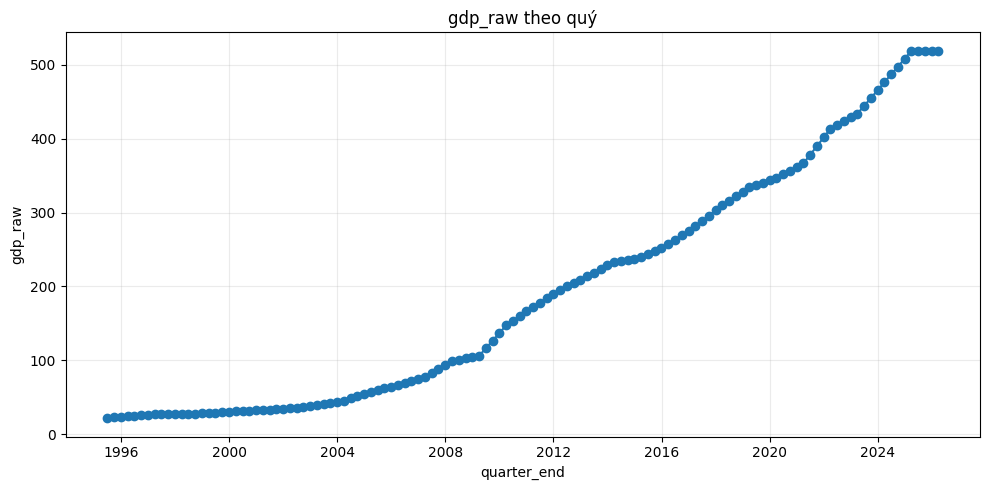

### Line plot: `inflation`

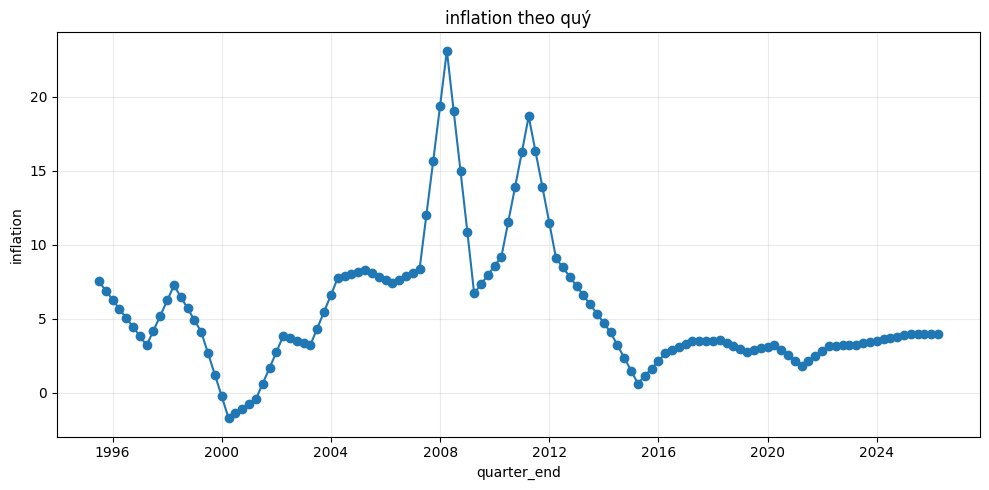

### Line plot: `interest_rate`

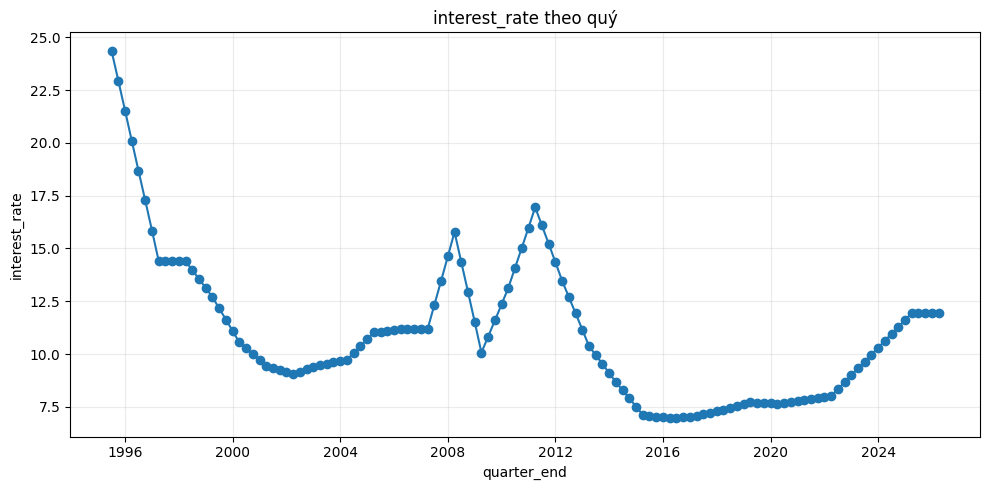

### Line plot: `fdi_pct_gdp`

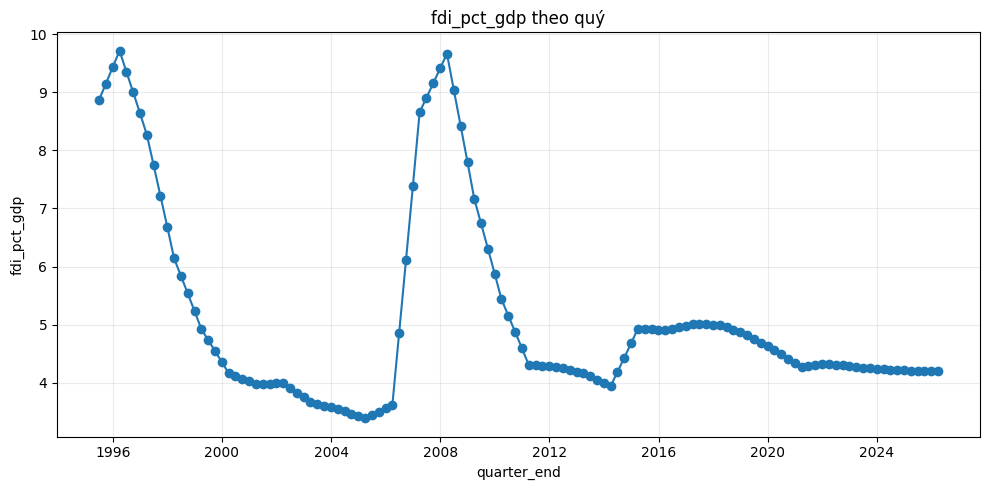

### Line plot: `investment_pct_gdp`

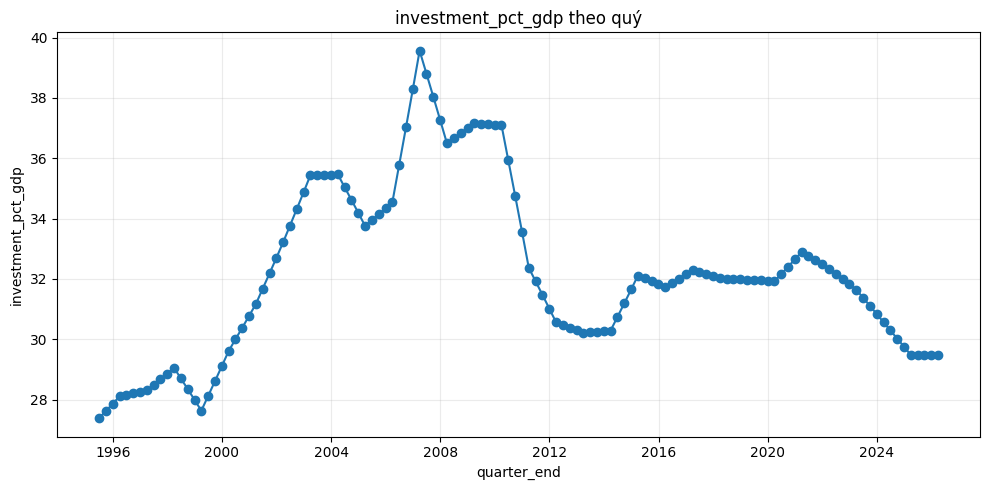

### Line plot: `export_pct_gdp`

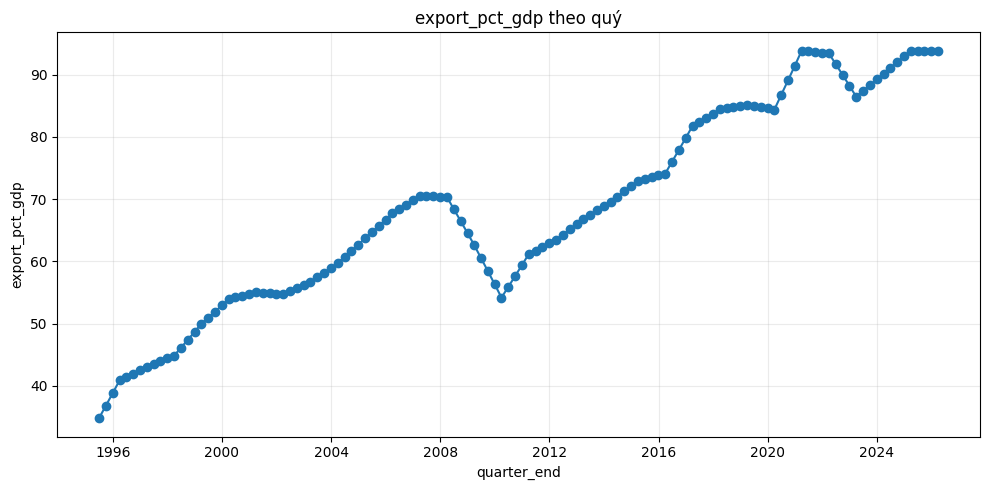

### Line plot: `unemployment_rate`

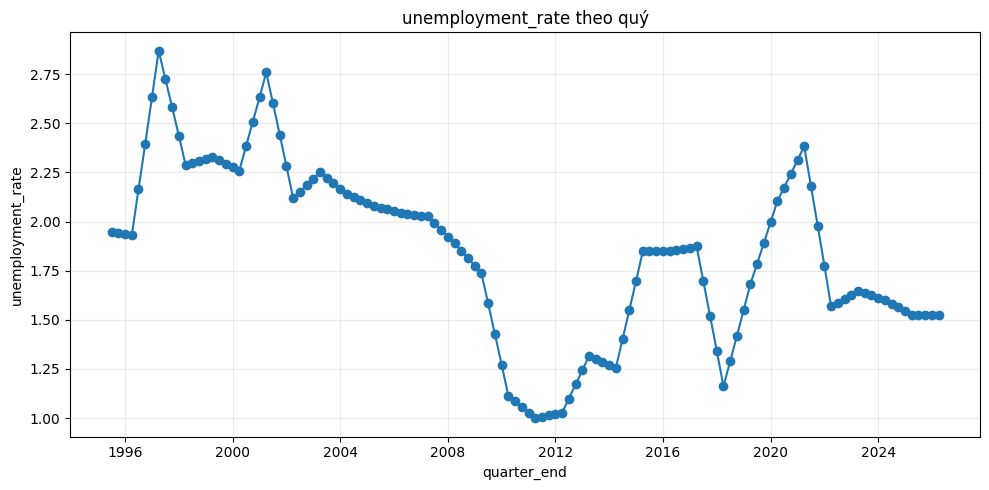

### Line plot: `gov_spending_pct_gdp`

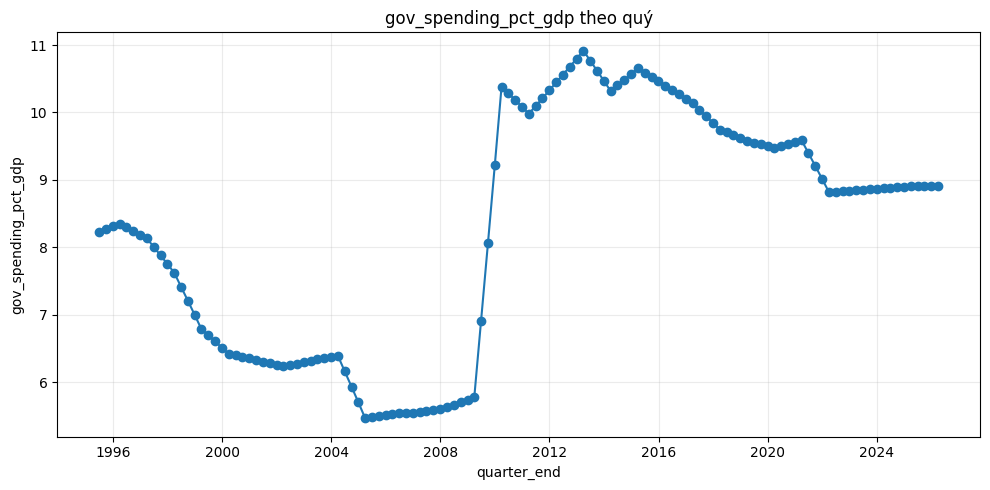

### Line plot: `log_gdp_raw`

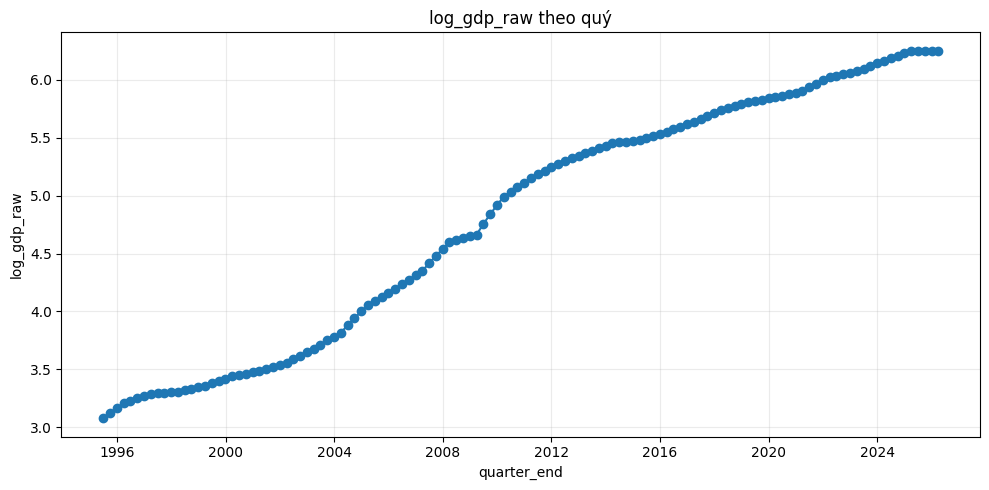

### Line plot: `log_fdi_pct_gdp`

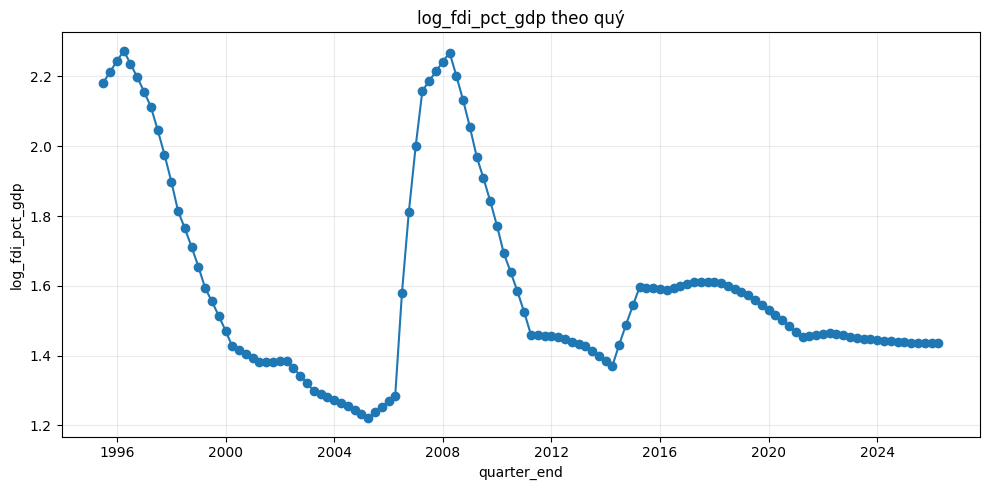

### Line plot: `log_investment_pct_gdp`

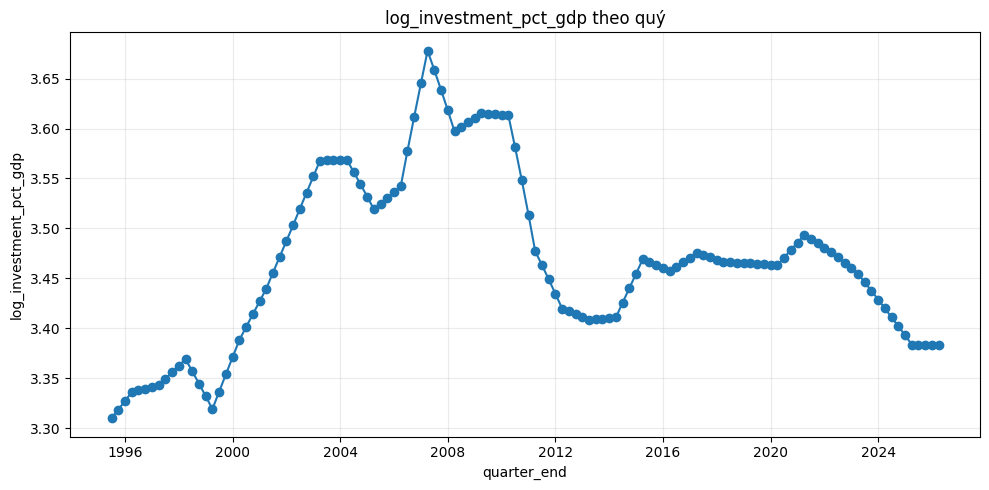

### Line plot: `log_export_pct_gdp`

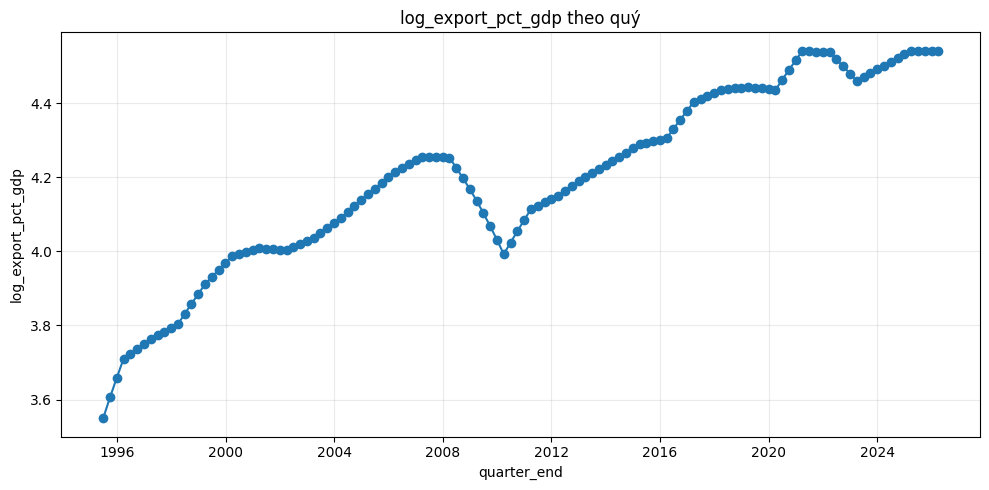

### Line plot: `log_gov_spending_pct_gdp`

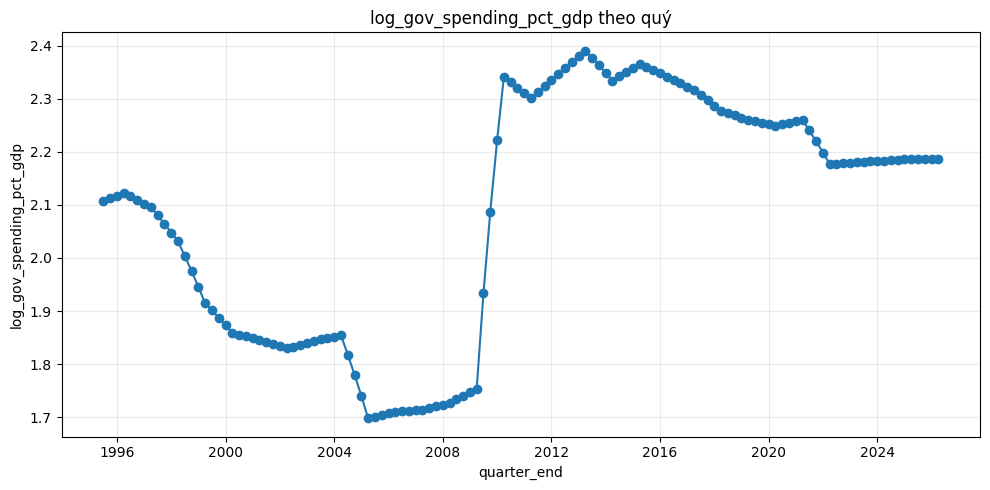

### Line plot: `real_interest_rate`

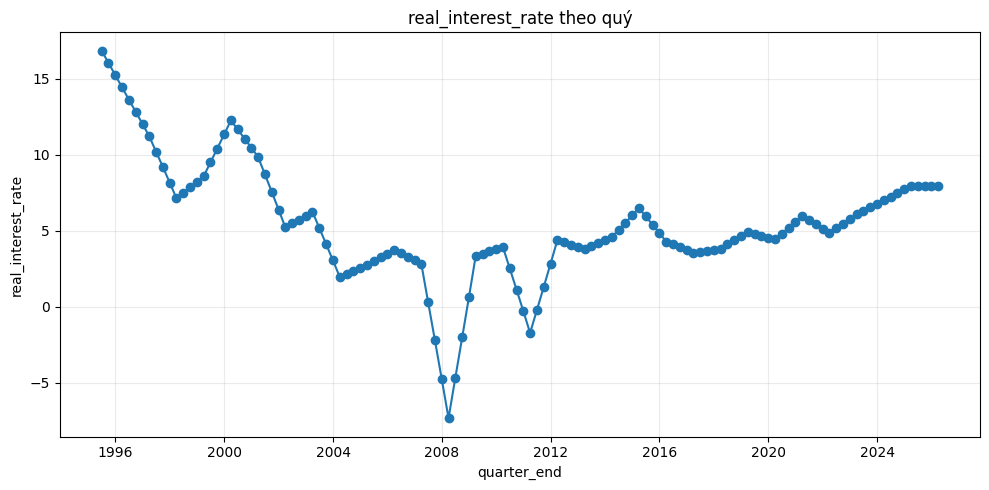

### Line plot: `n_comments`

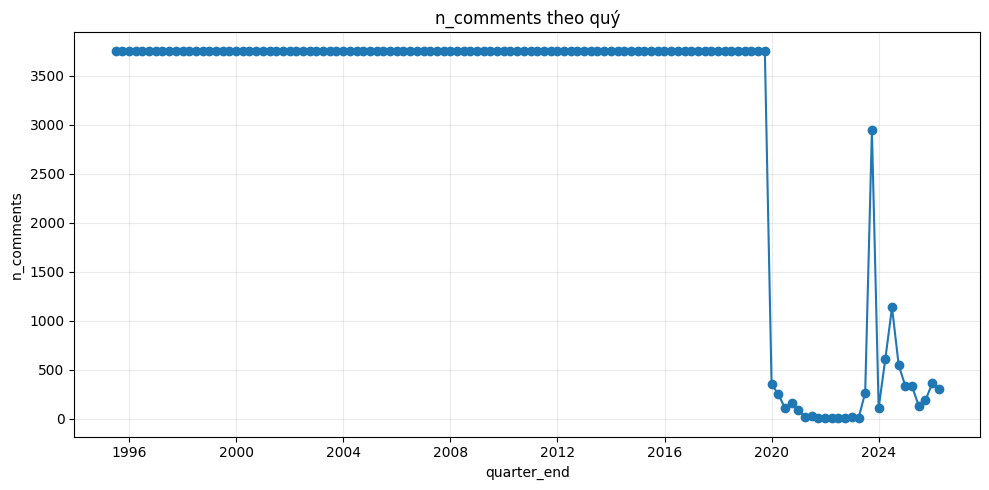

### Line plot: `n_unique_authors`

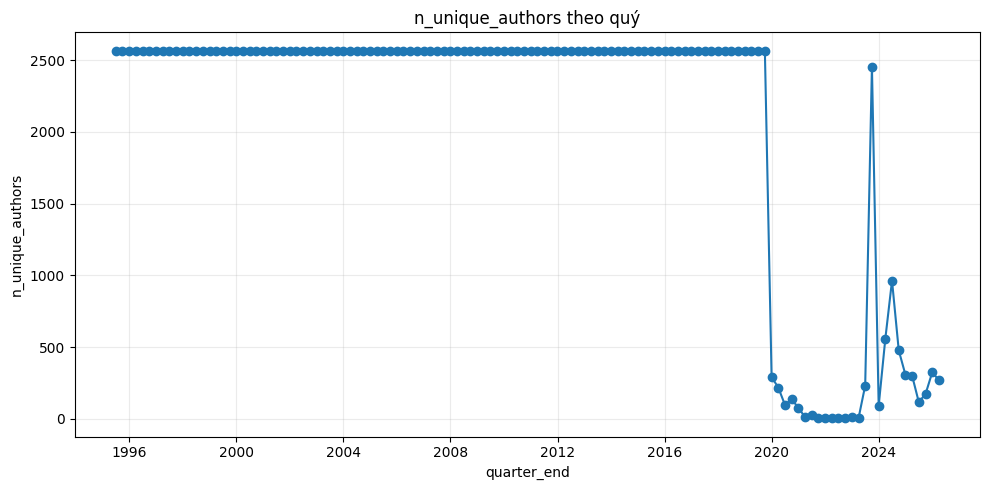

### Line plot: `like_sum`

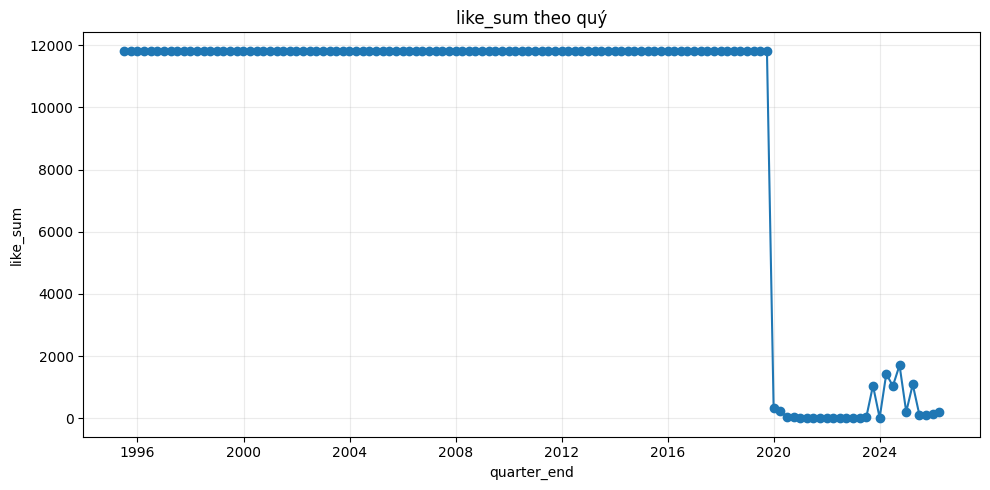

### Line plot: `like_mean`

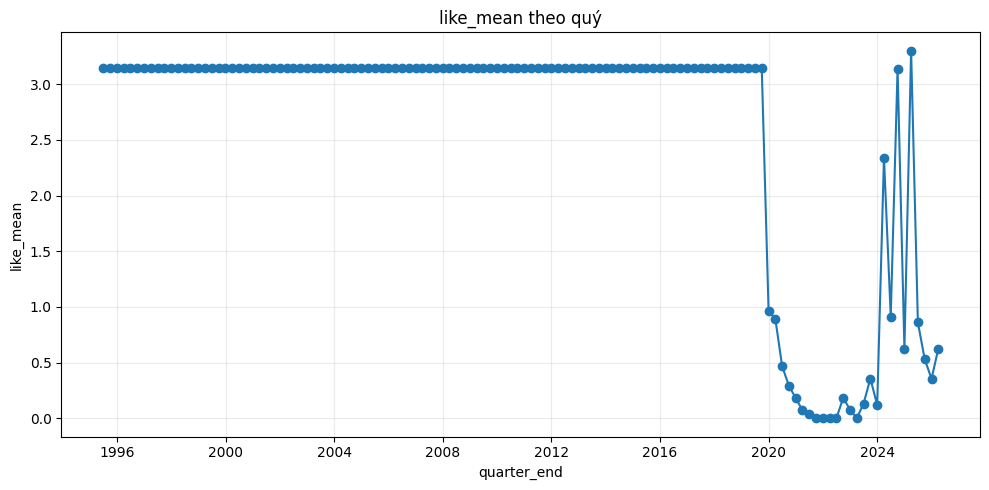

### Line plot: `avg_sentiment`

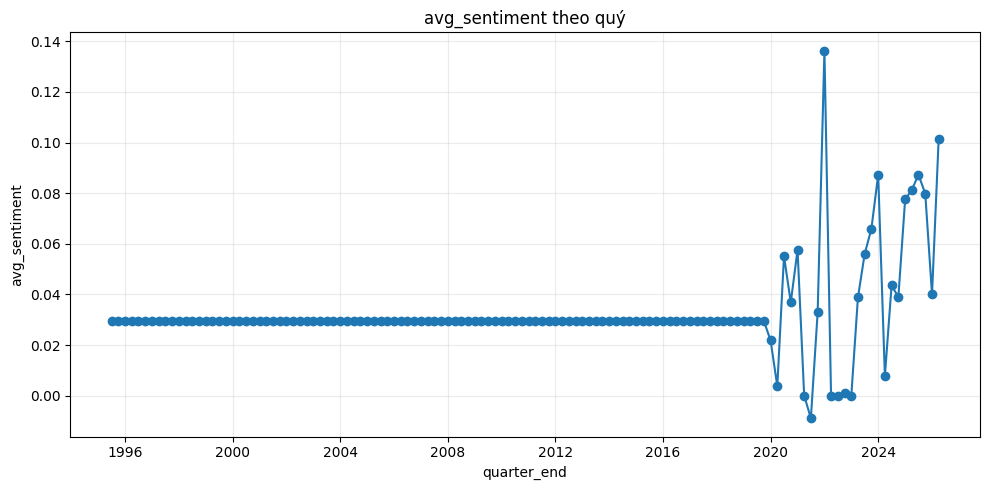

### Line plot: `median_sentiment`

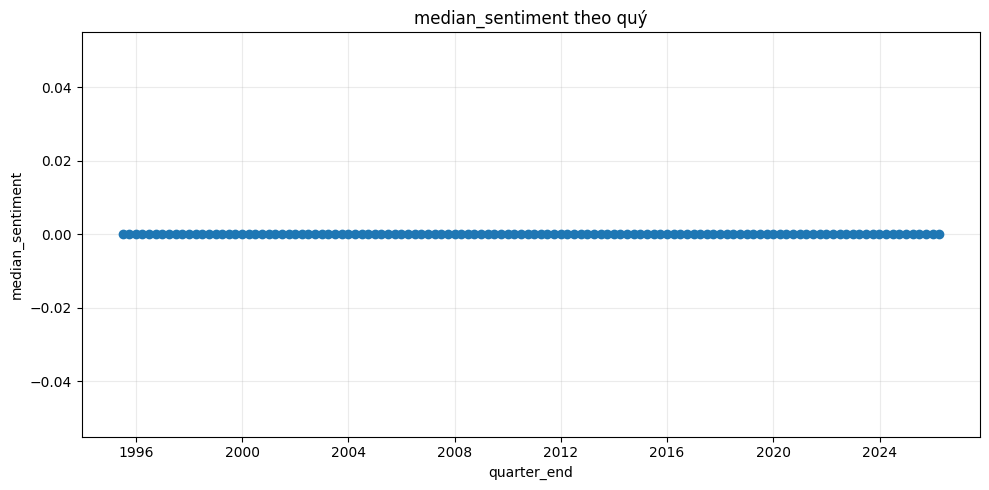

### Line plot: `std_sentiment`

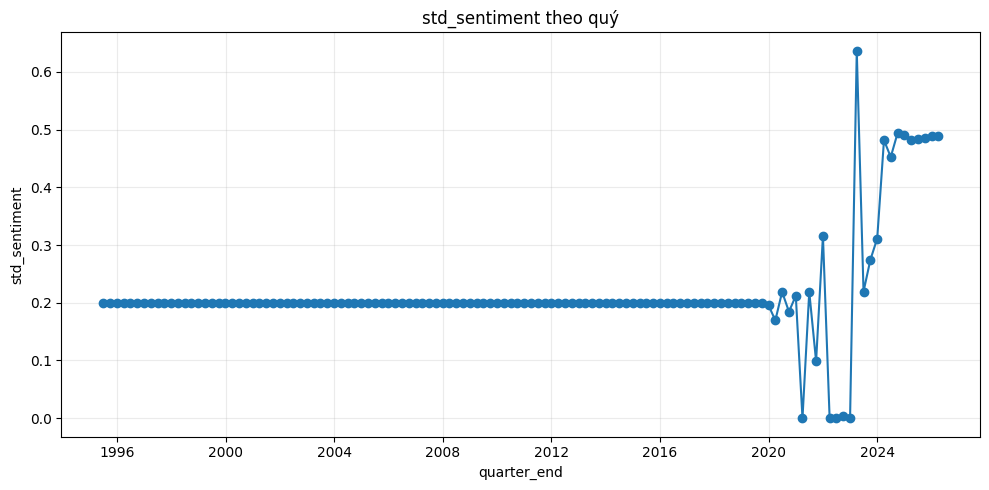

### Line plot: `positive_ratio`

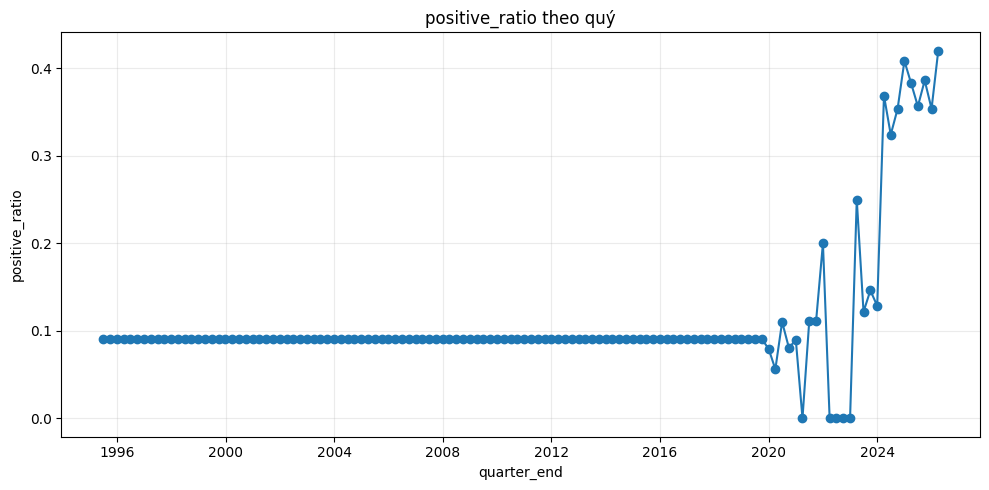

### Line plot: `negative_ratio`

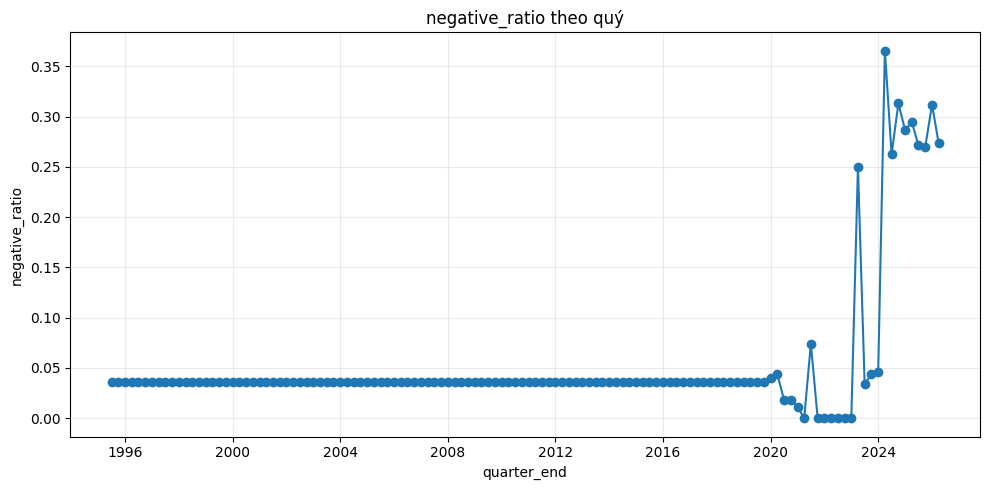

### Line plot: `neutral_ratio`

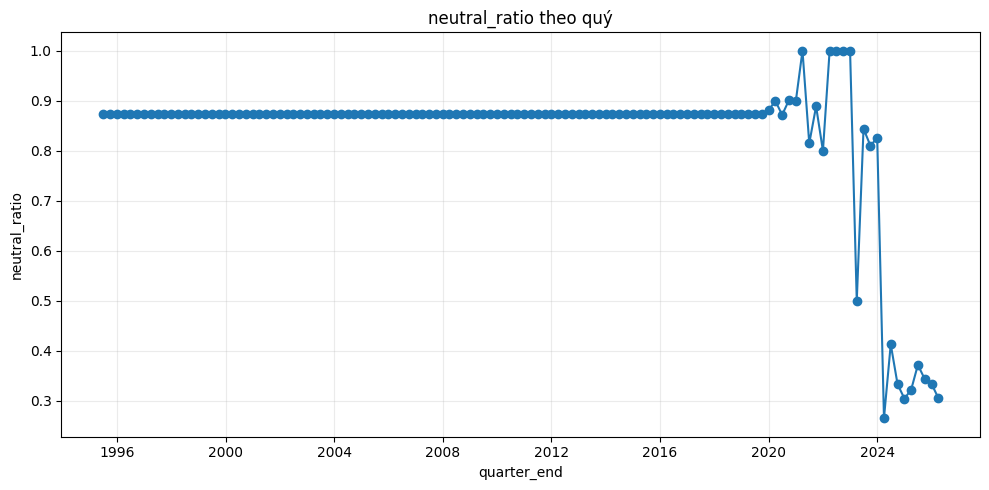

### Line plot: `net_sentiment`

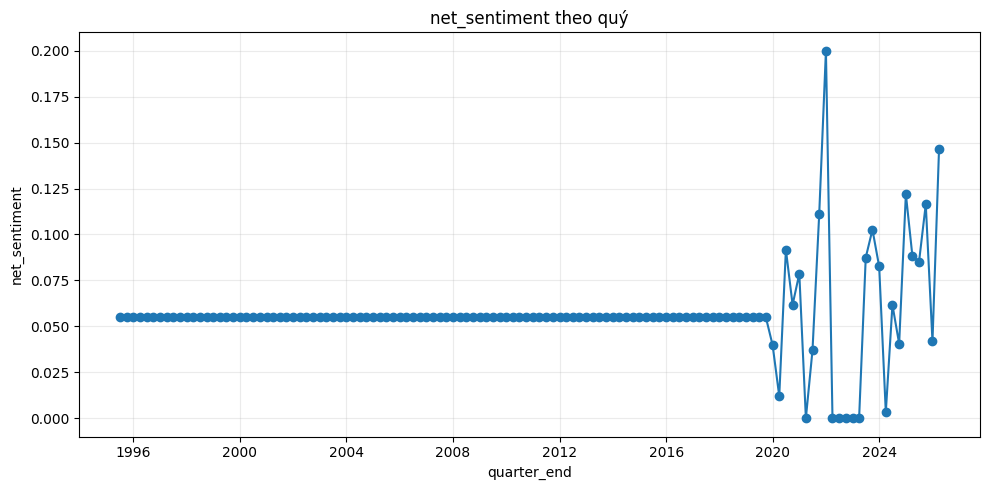

### Line plot: `weighted_sentiment_like`

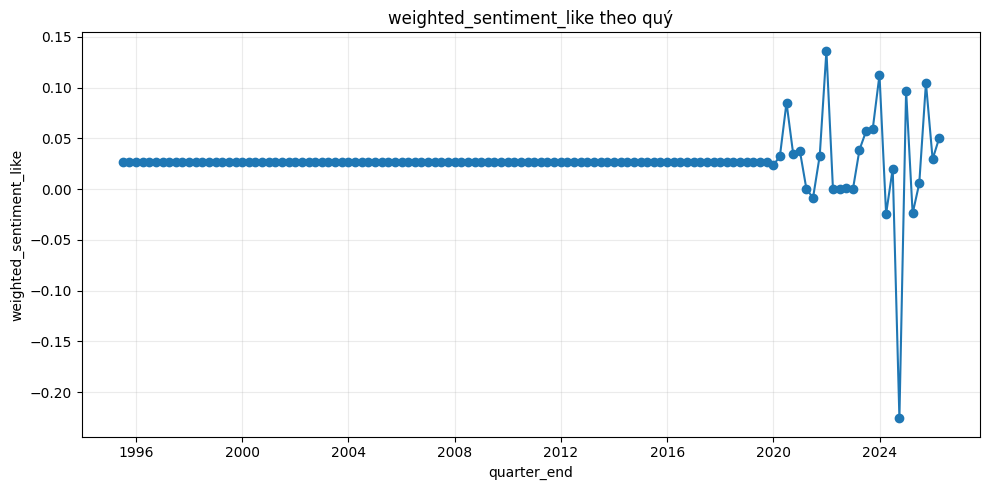

### Line plot: `p10_sentiment`

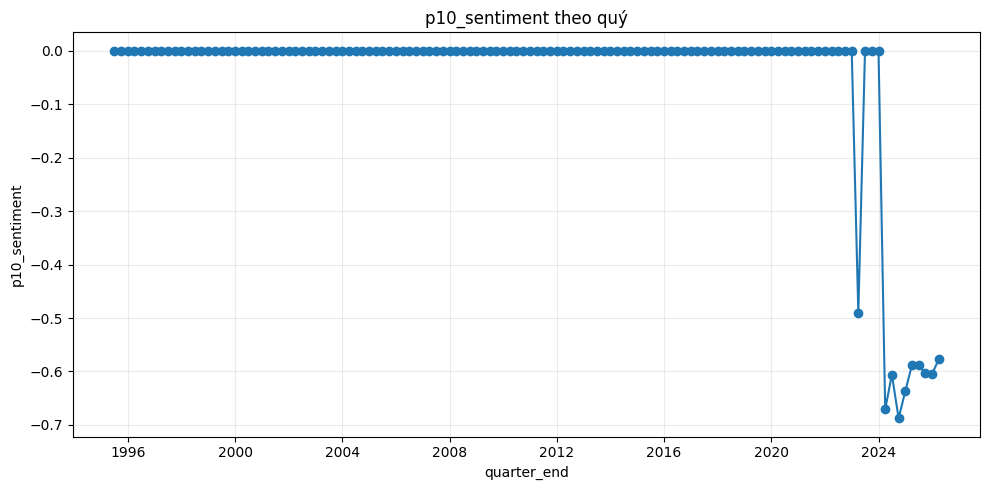

### Line plot: `p90_sentiment`

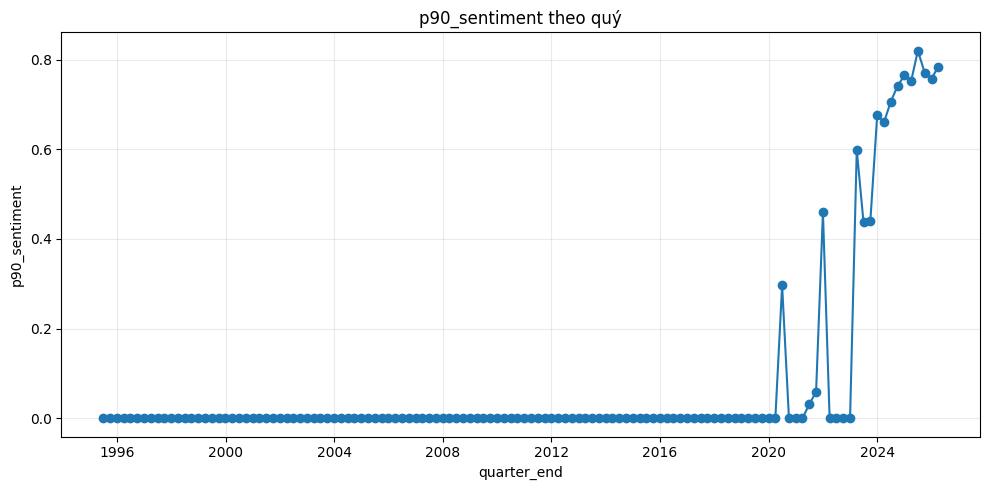

### Line plot: `gdp_raw_lag1`

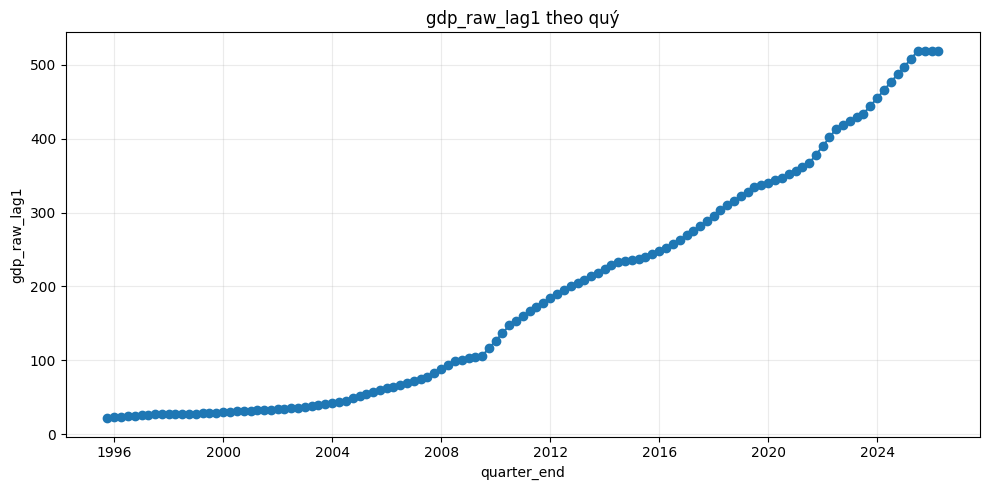

### Line plot: `gdp_raw_lag4`

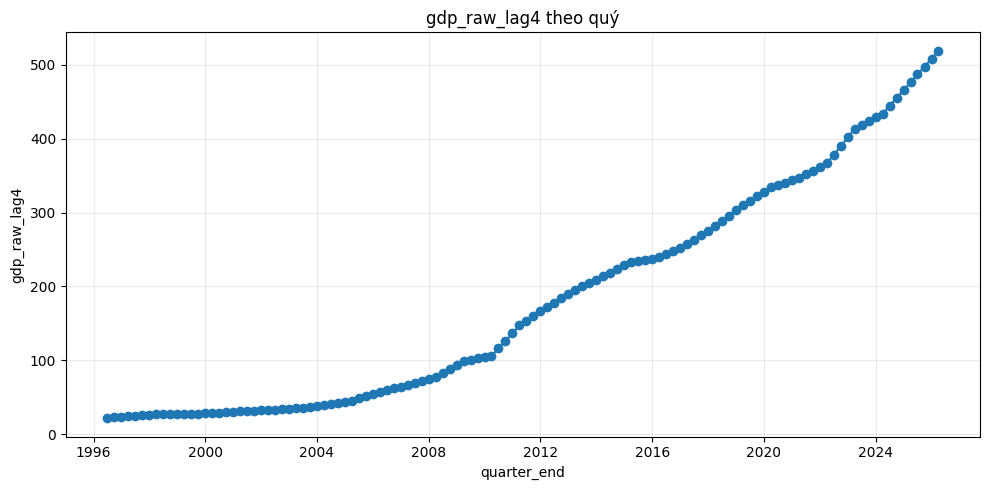

### Line plot: `gdp_raw_diff1`

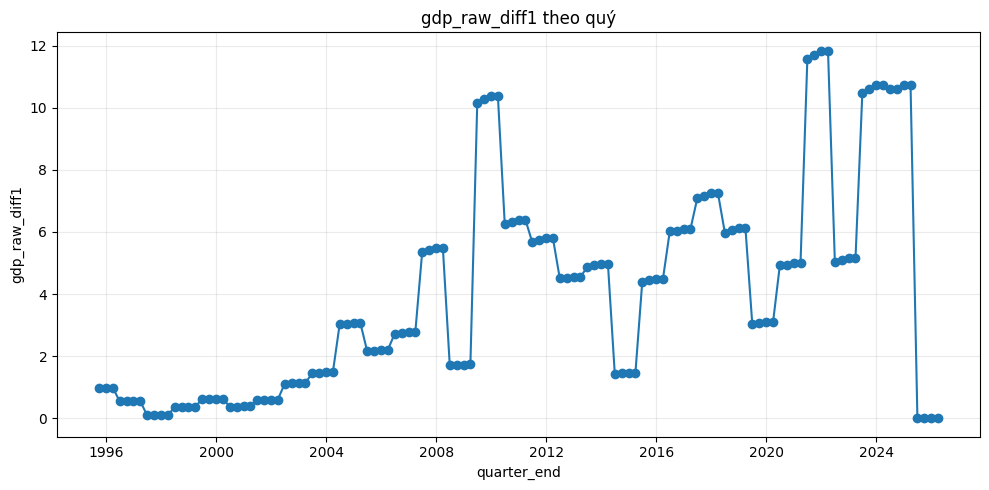

### Line plot: `gdp_raw_diff4`

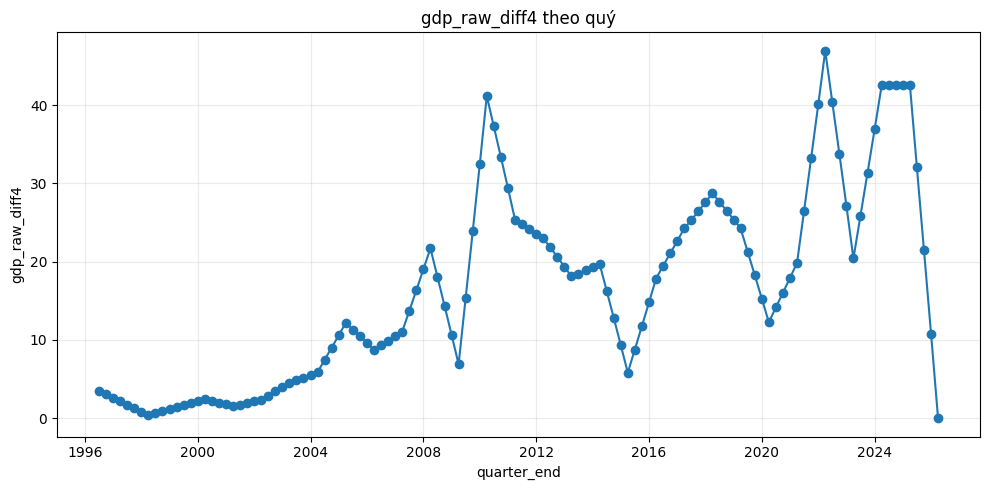

### Line plot: `gdp_raw_qoq_pct`

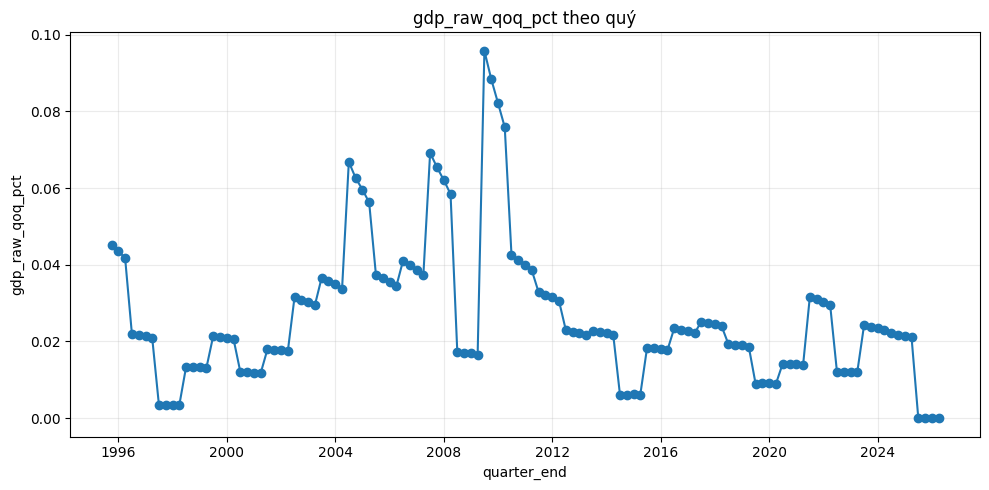

### Line plot: `gdp_raw_yoy_pct`

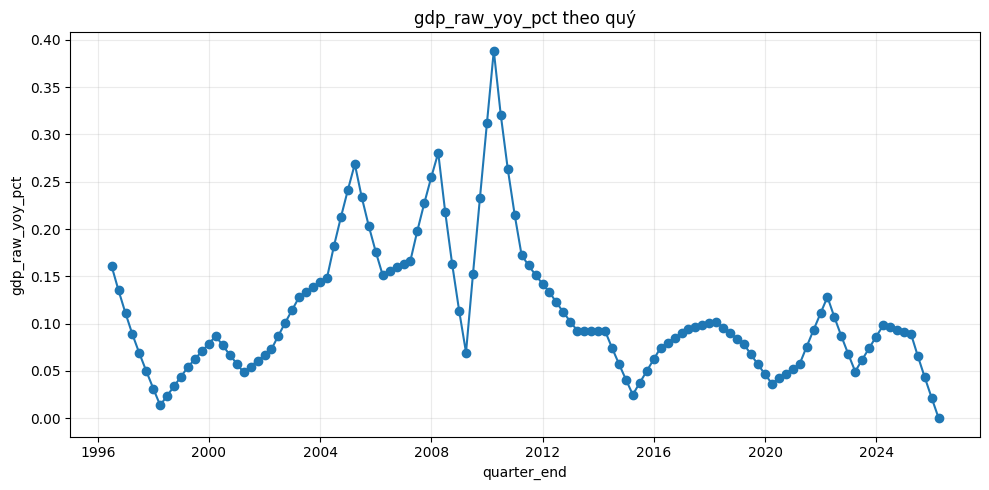

### Line plot: `inflation_lag1`

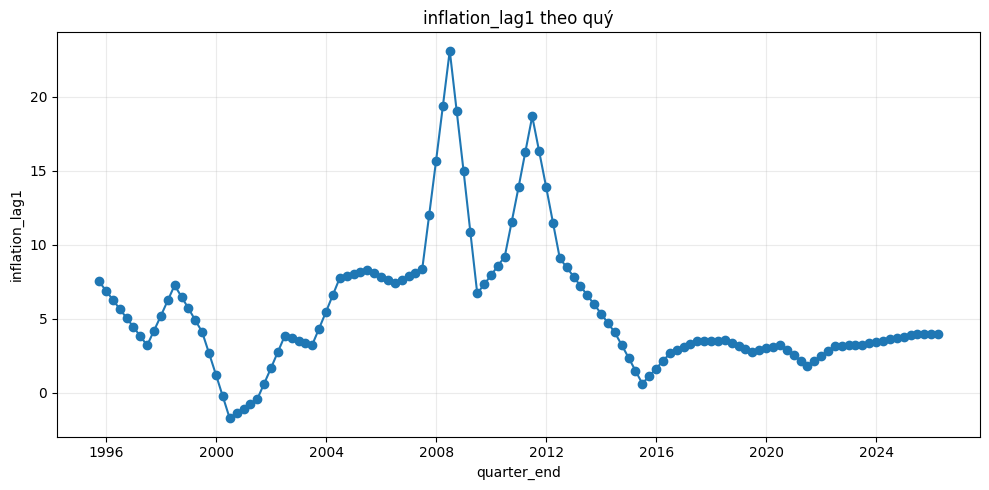

### Line plot: `inflation_lag4`

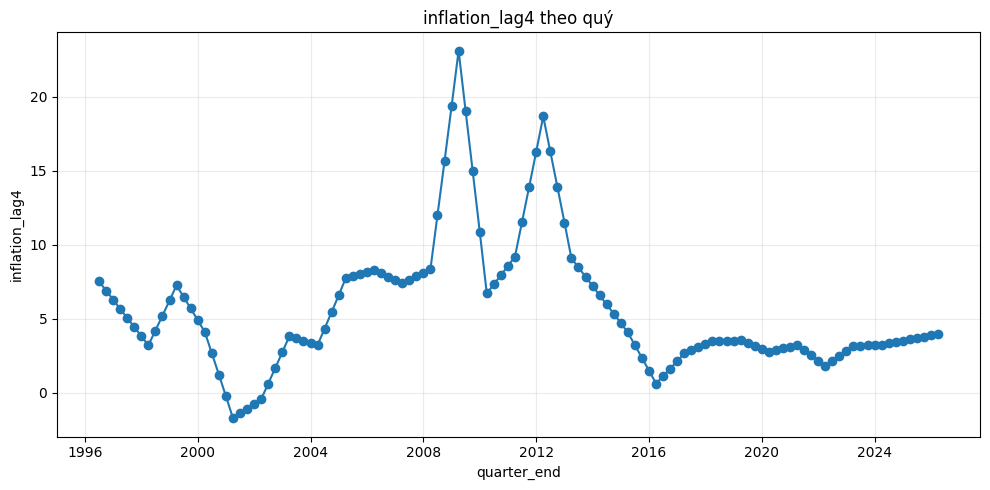

### Line plot: `inflation_diff1`

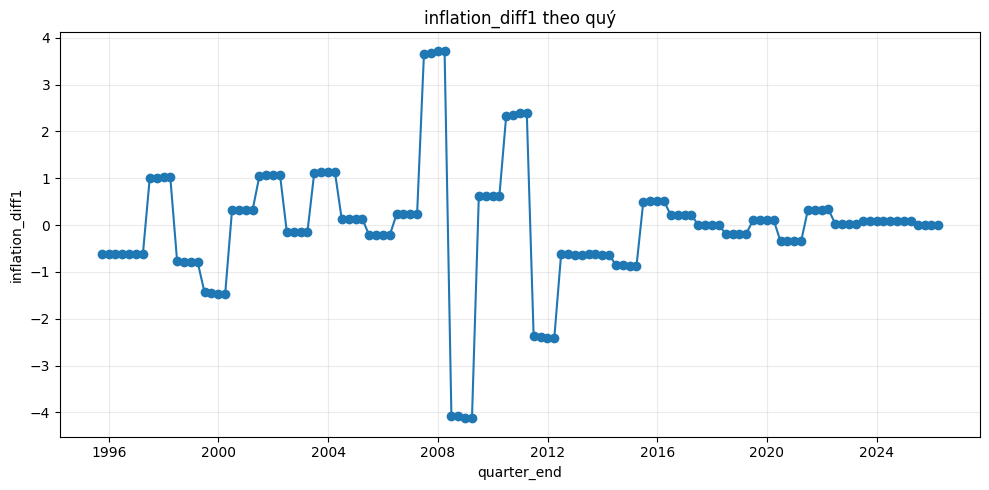

### Line plot: `inflation_diff4`

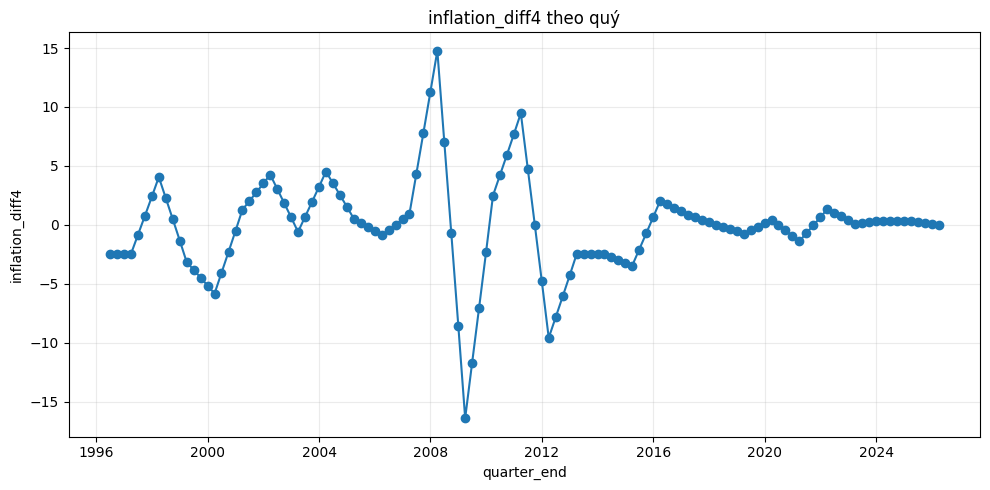

### Line plot: `interest_rate_lag1`

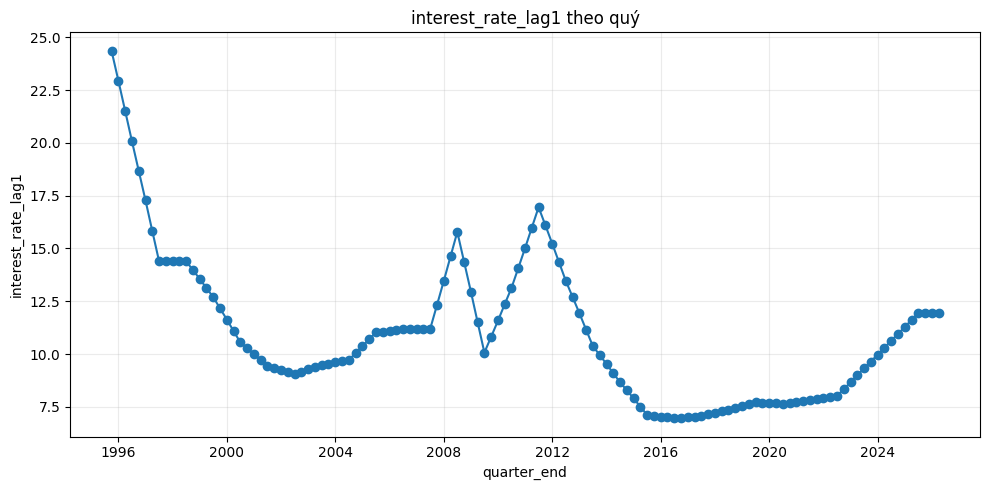

### Line plot: `interest_rate_lag4`

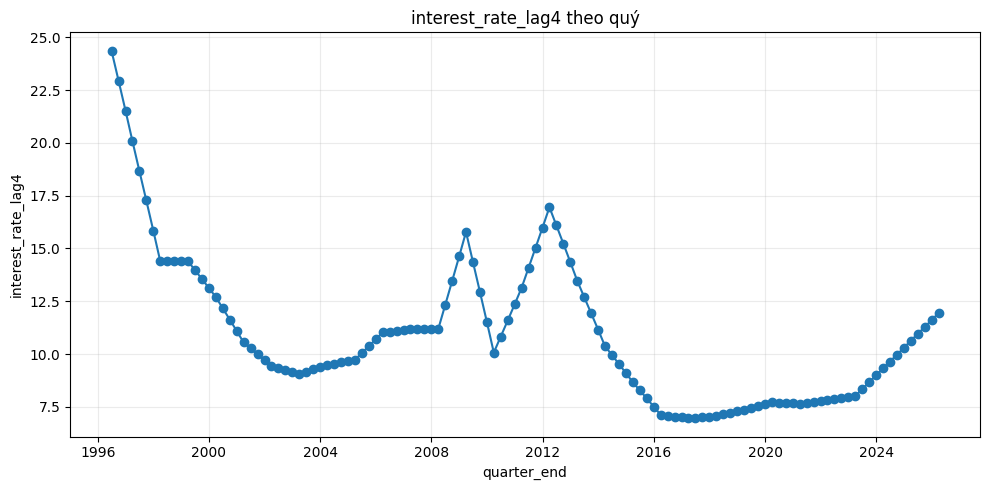

### Line plot: `interest_rate_diff1`

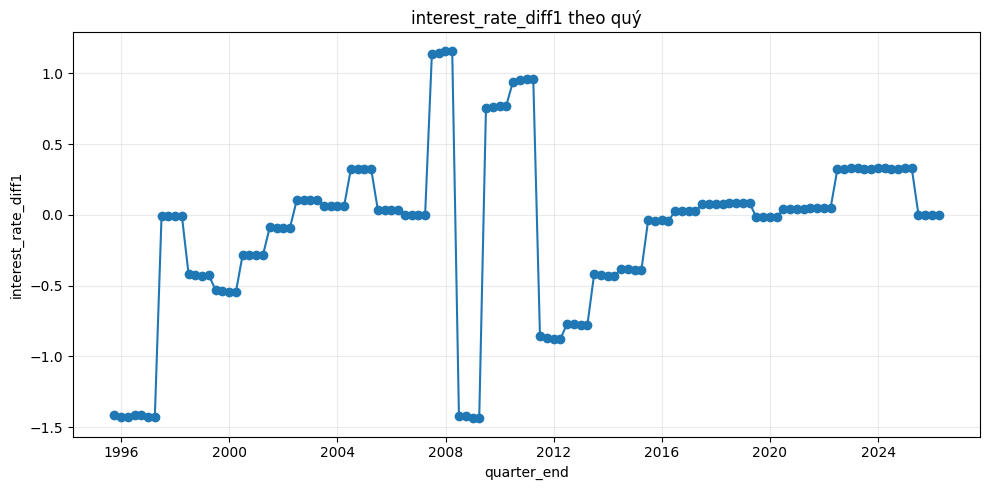

### Line plot: `interest_rate_diff4`

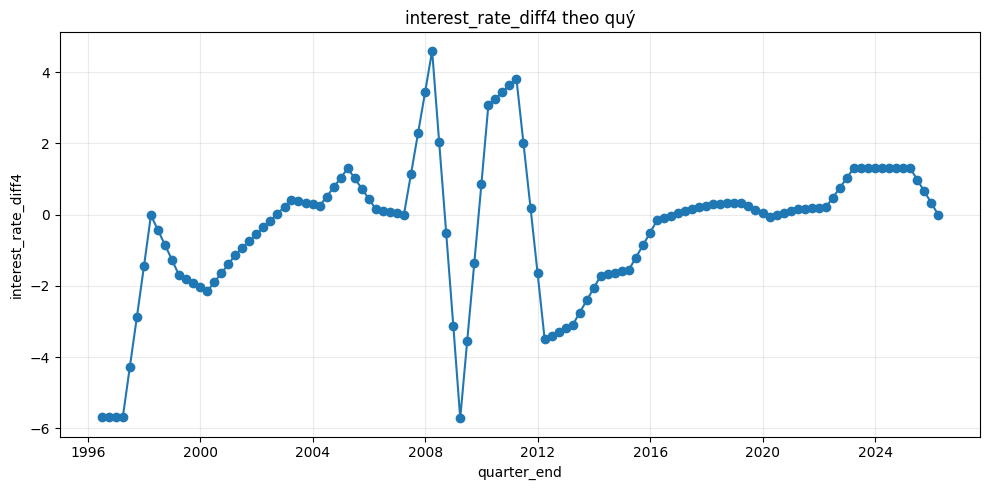

### Line plot: `interest_rate_qoq_pct`

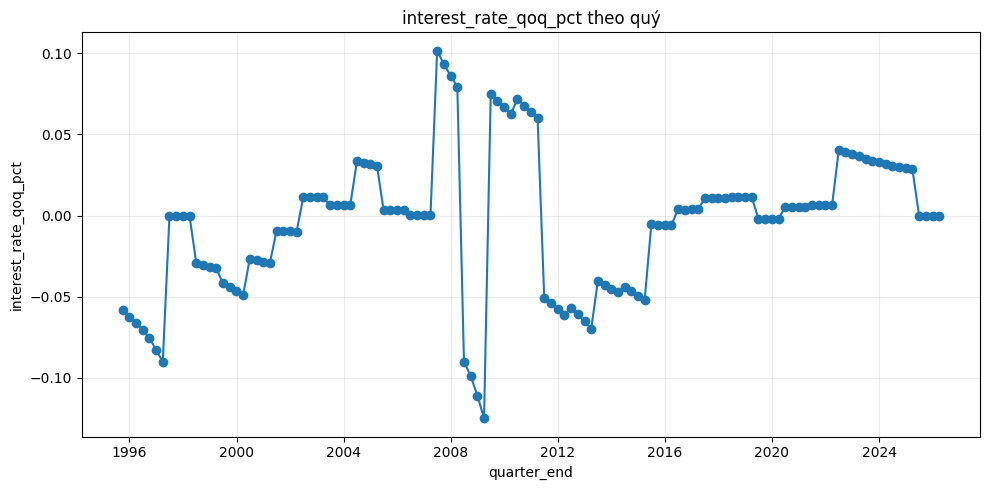

### Line plot: `interest_rate_yoy_pct`

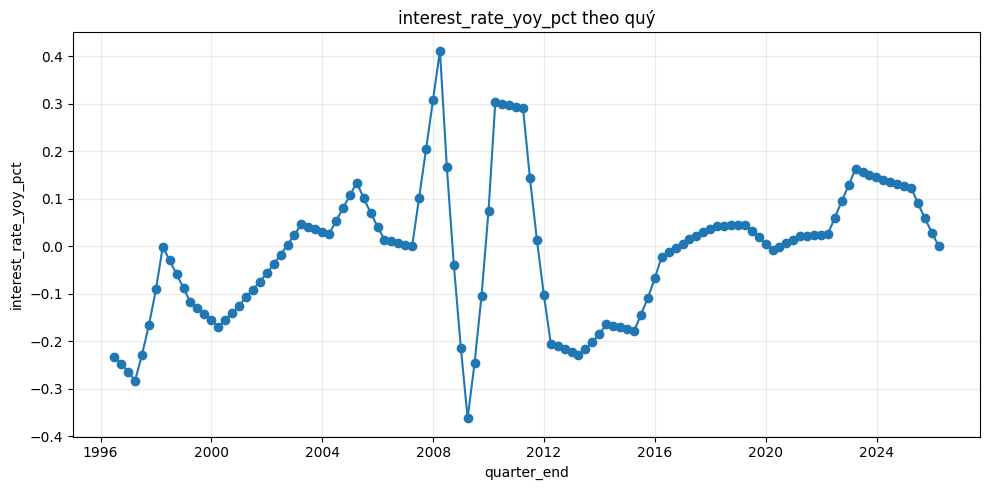

### Line plot: `fdi_pct_gdp_lag1`

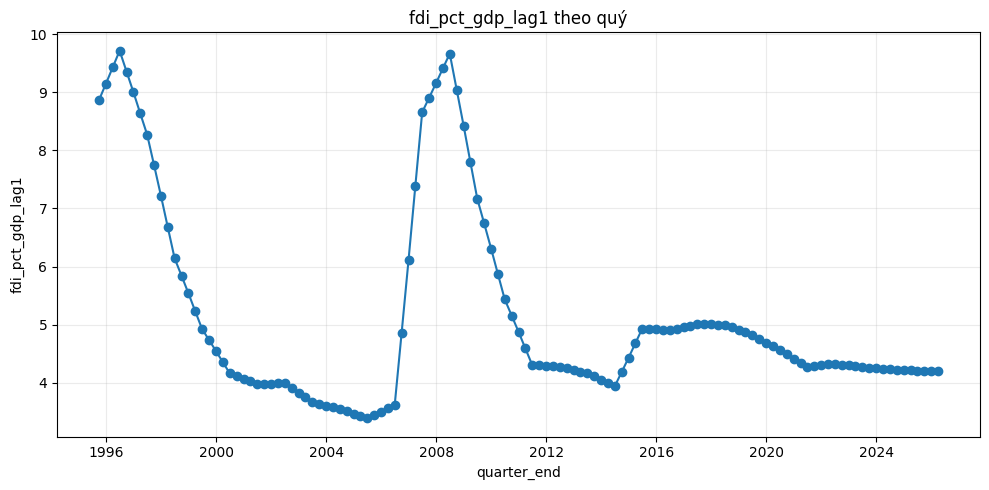

### Line plot: `fdi_pct_gdp_lag4`

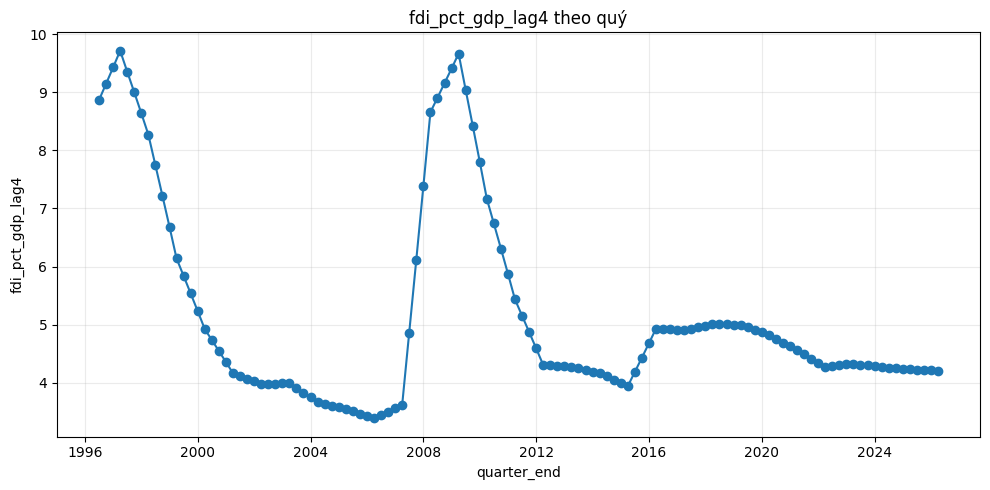

### Line plot: `fdi_pct_gdp_diff1`

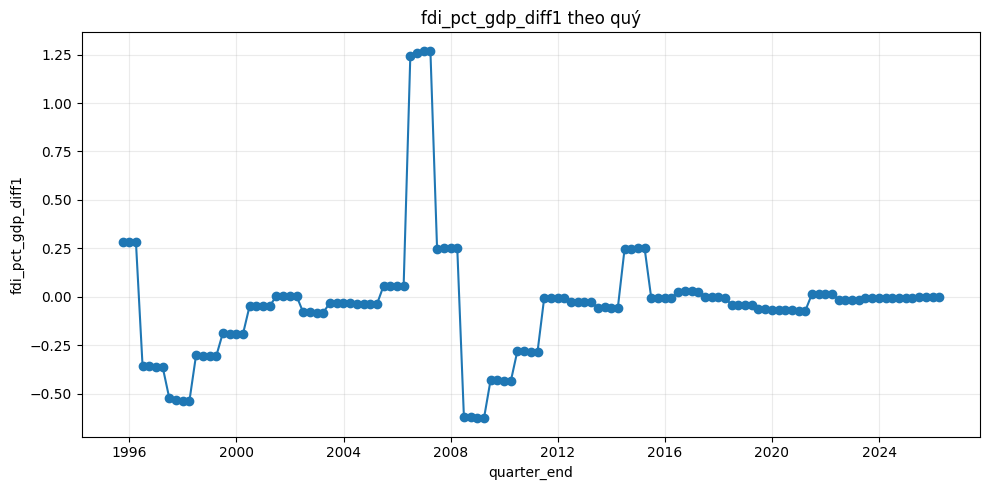

### Line plot: `fdi_pct_gdp_diff4`

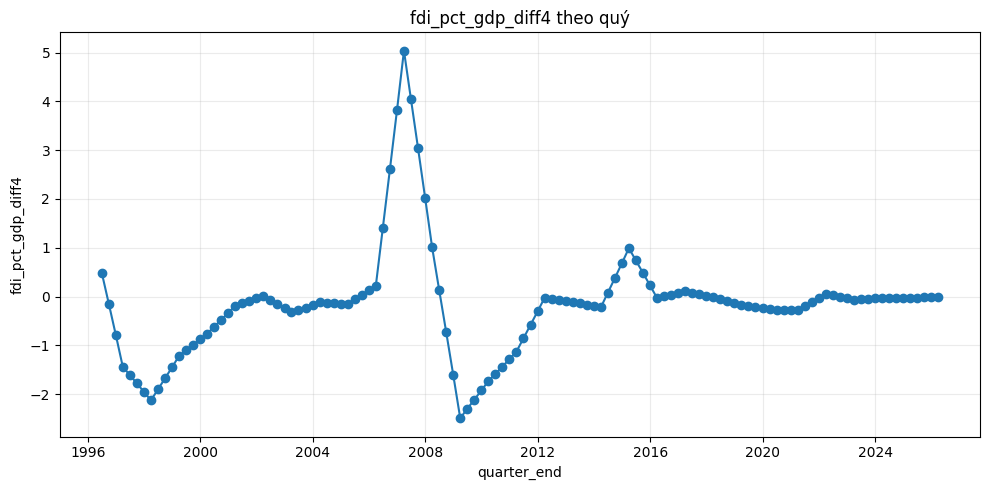

### Line plot: `fdi_pct_gdp_qoq_pct`

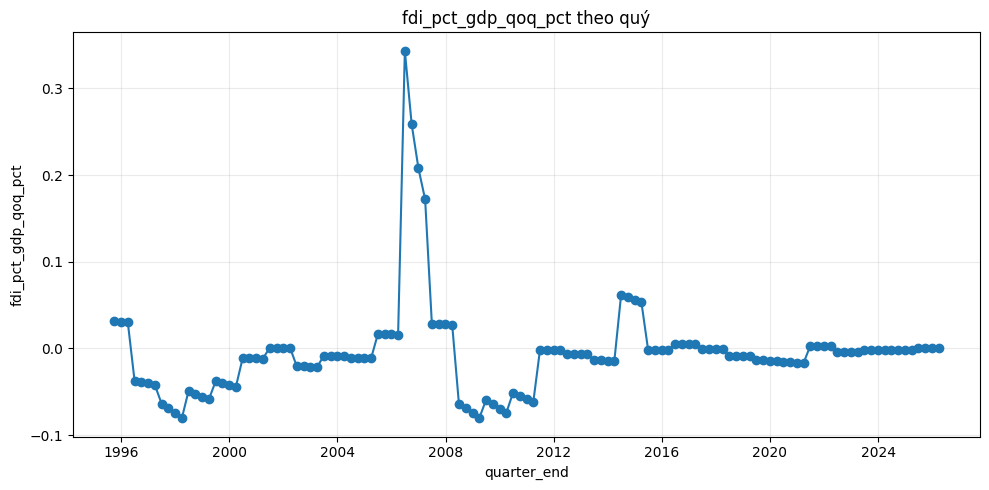

### Line plot: `fdi_pct_gdp_yoy_pct`

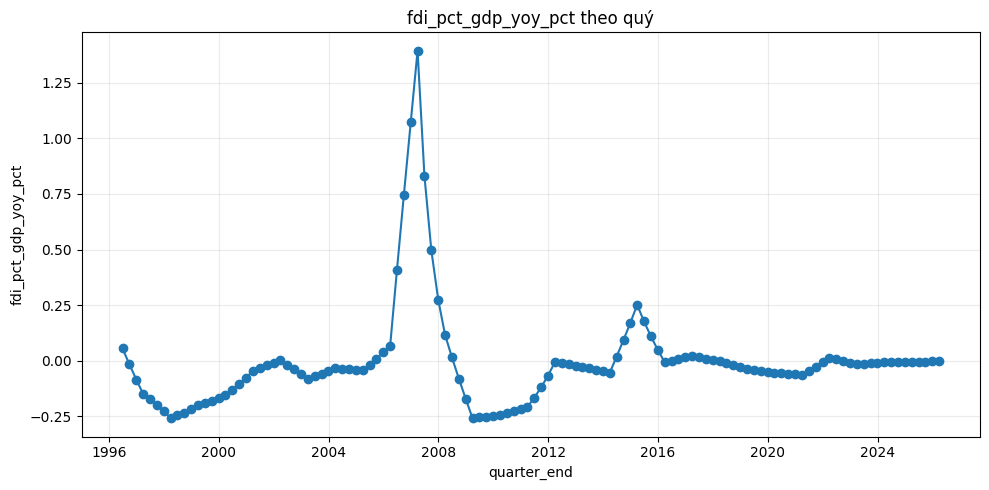

### Line plot: `investment_pct_gdp_lag1`

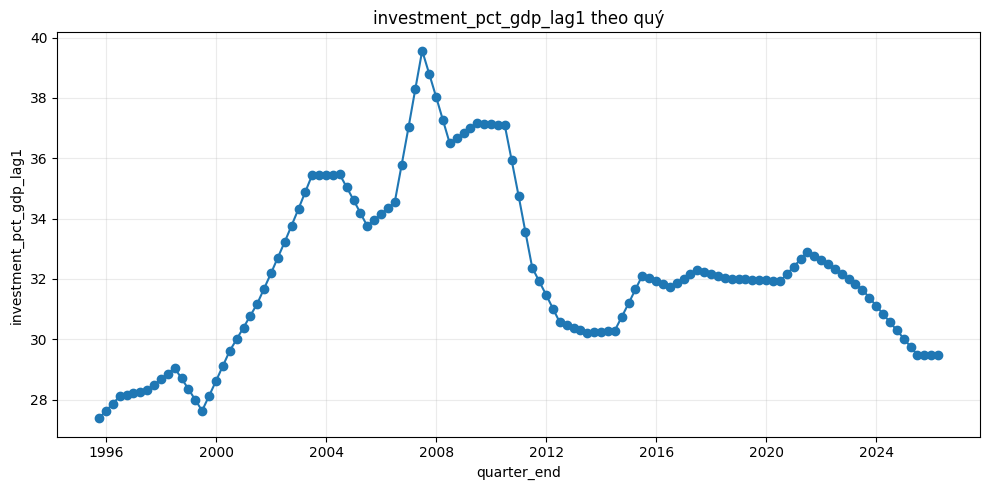

### Line plot: `investment_pct_gdp_lag4`

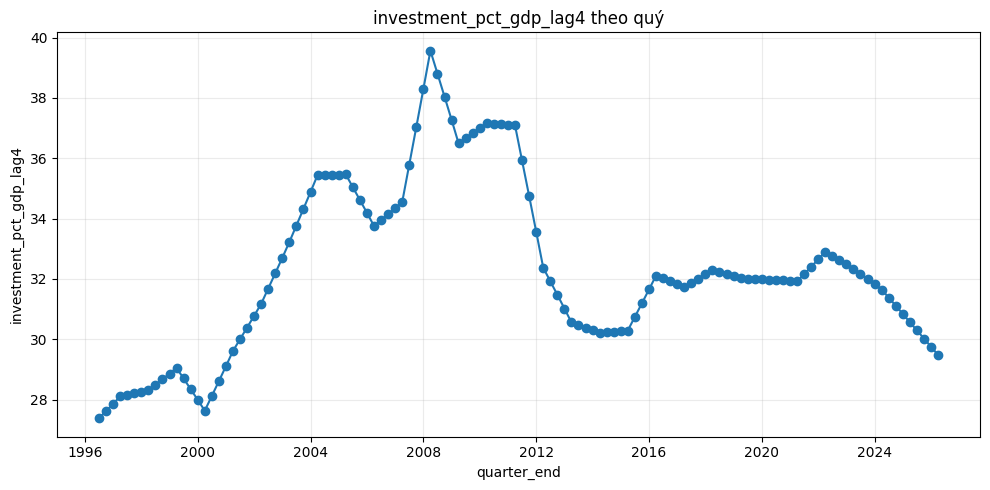

### Line plot: `investment_pct_gdp_diff1`

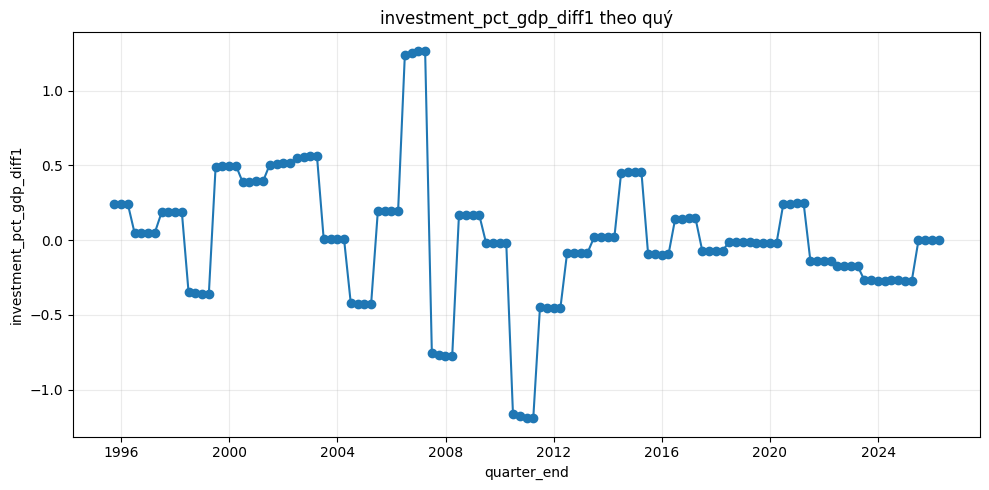

### Line plot: `investment_pct_gdp_diff4`

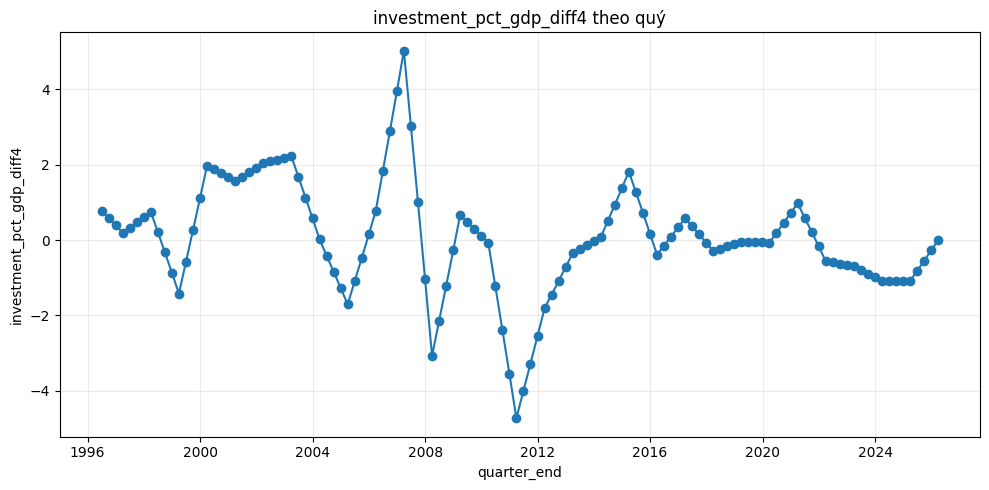

### Line plot: `investment_pct_gdp_qoq_pct`

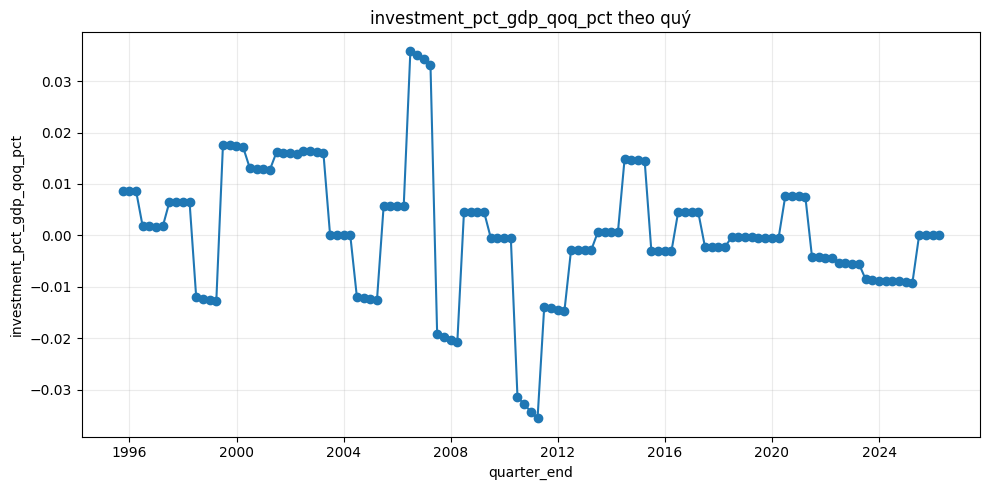

### Line plot: `investment_pct_gdp_yoy_pct`

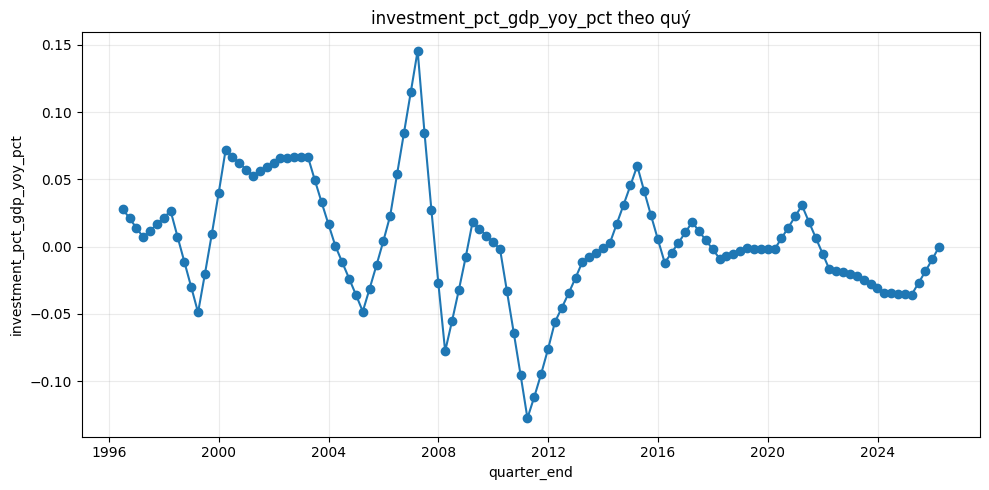

### Line plot: `export_pct_gdp_lag1`

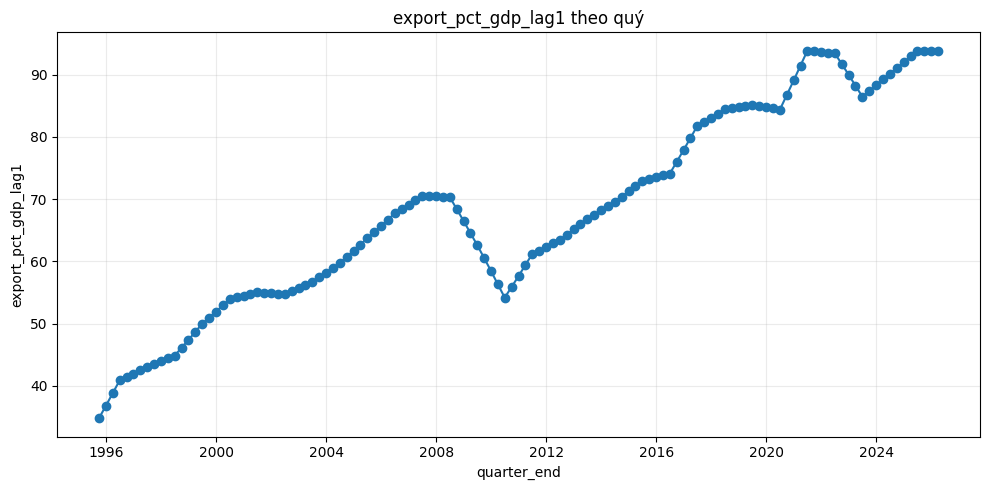

### Line plot: `export_pct_gdp_lag4`

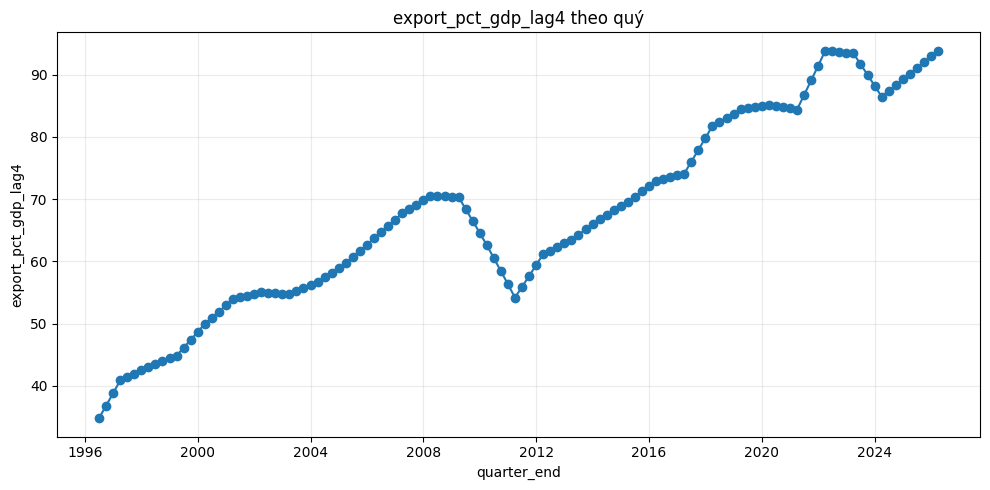

### Line plot: `export_pct_gdp_diff1`

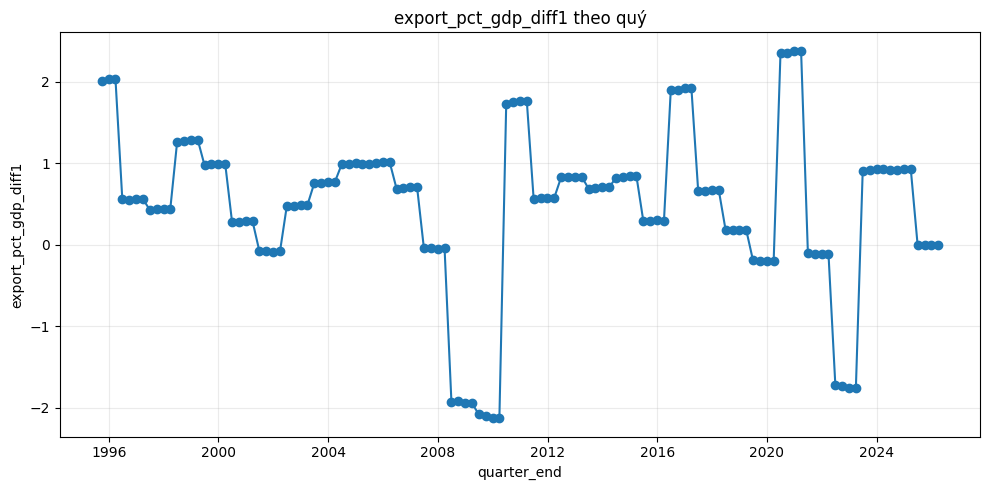

### Line plot: `export_pct_gdp_diff4`

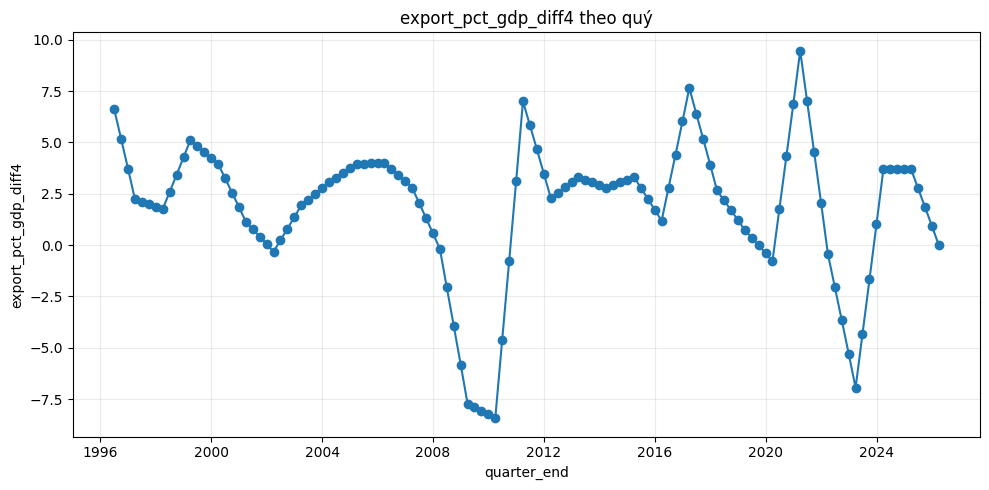

### Line plot: `export_pct_gdp_qoq_pct`

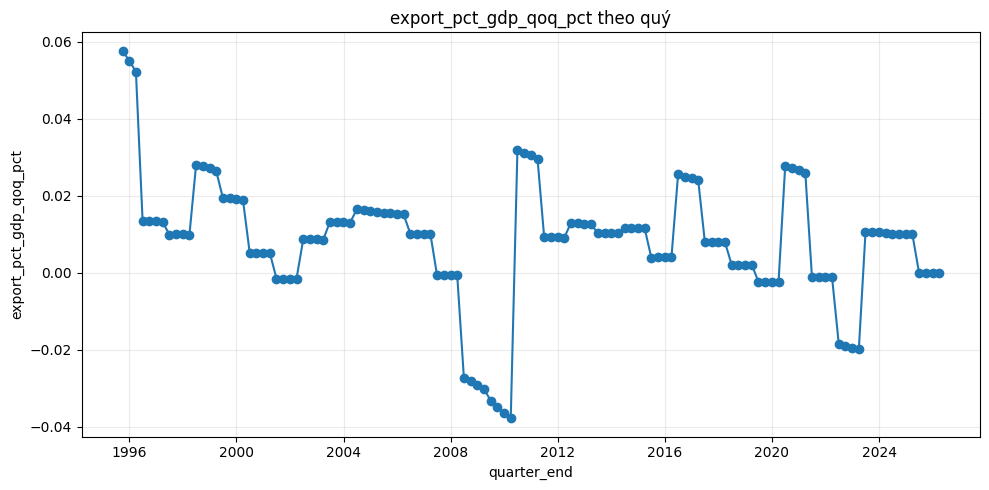

### Line plot: `export_pct_gdp_yoy_pct`

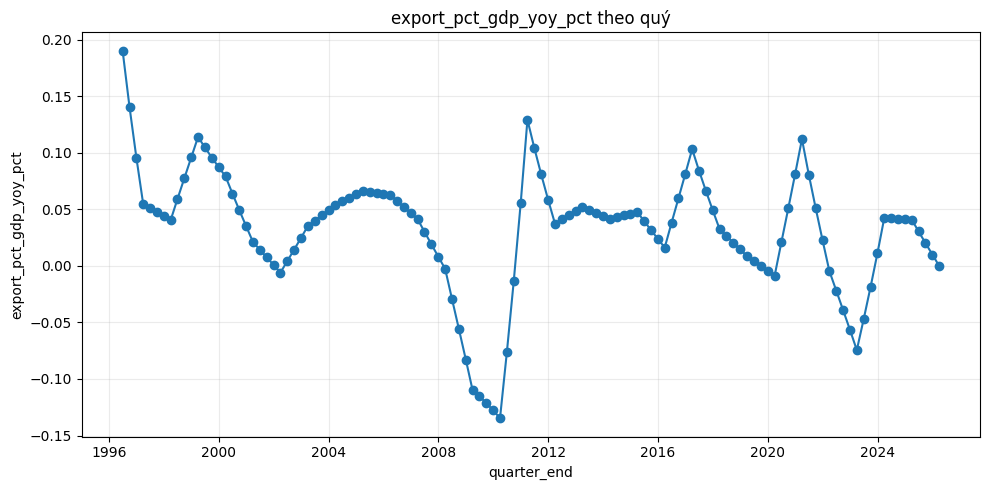

### Line plot: `unemployment_rate_lag1`

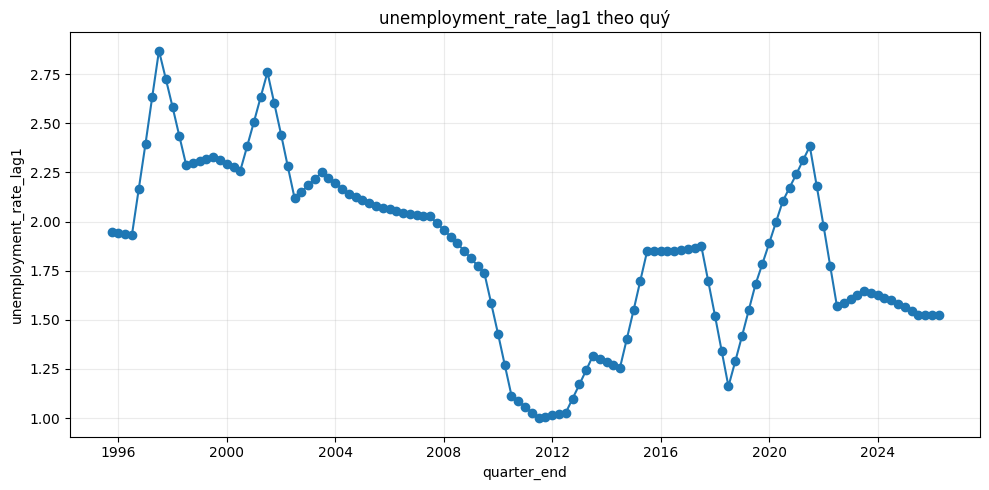

### Line plot: `unemployment_rate_lag4`

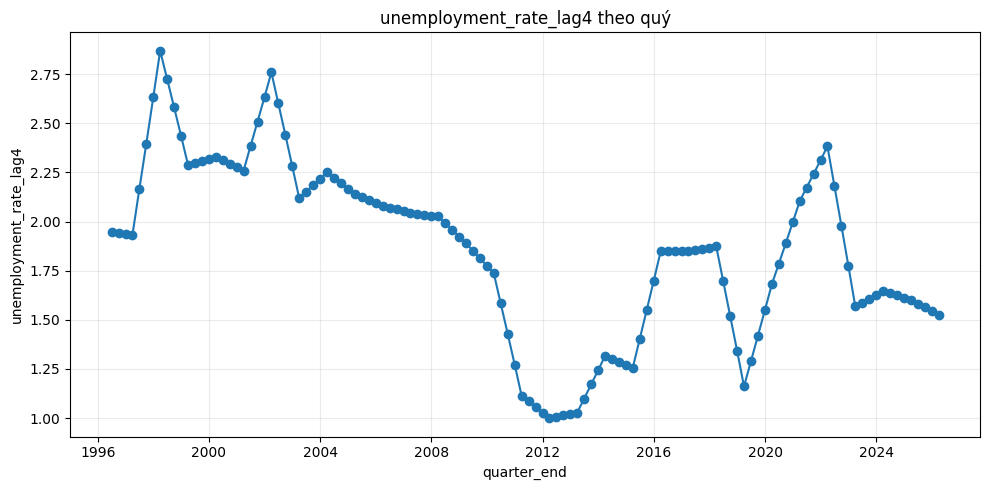

### Line plot: `unemployment_rate_diff1`

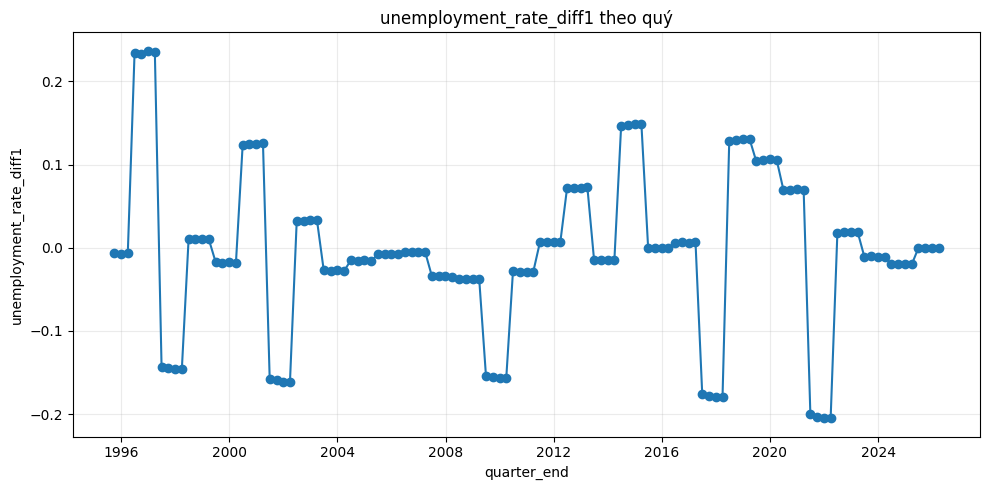

### Line plot: `unemployment_rate_diff4`

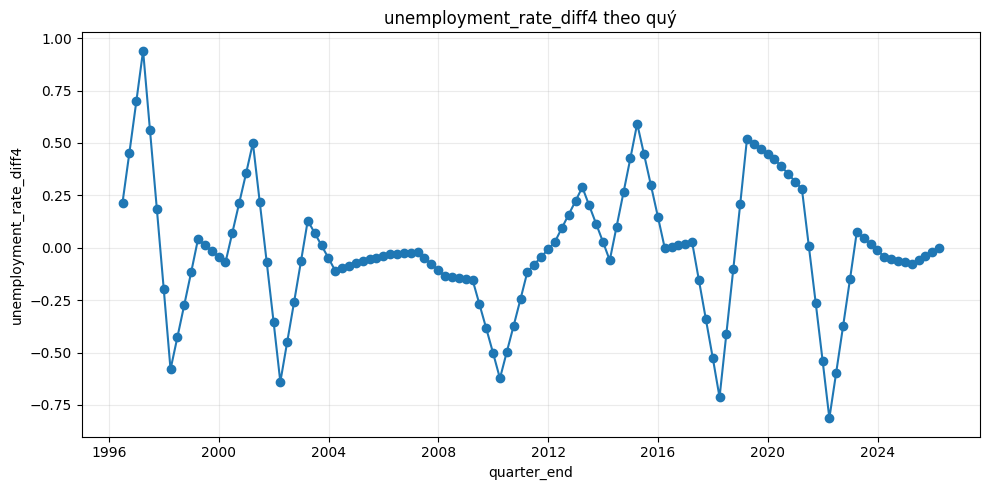

### Line plot: `unemployment_rate_qoq_pct`

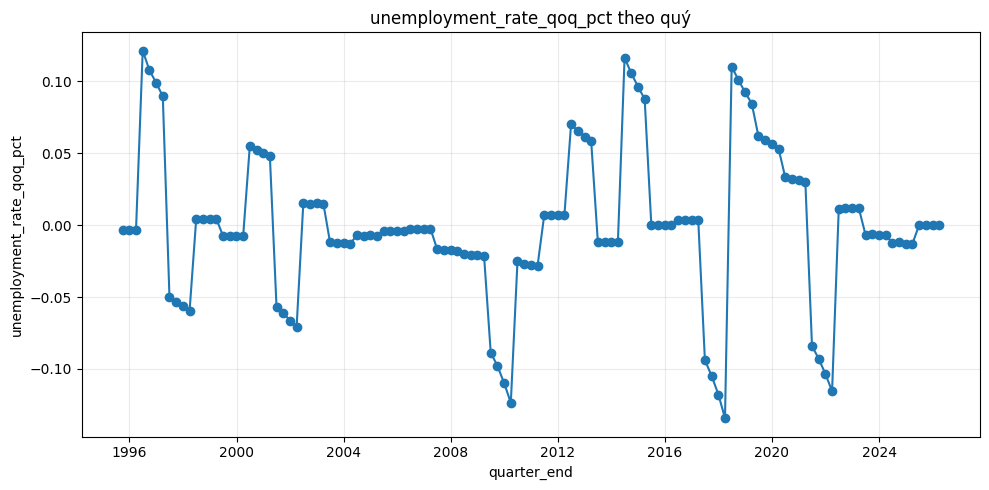

### Line plot: `unemployment_rate_yoy_pct`

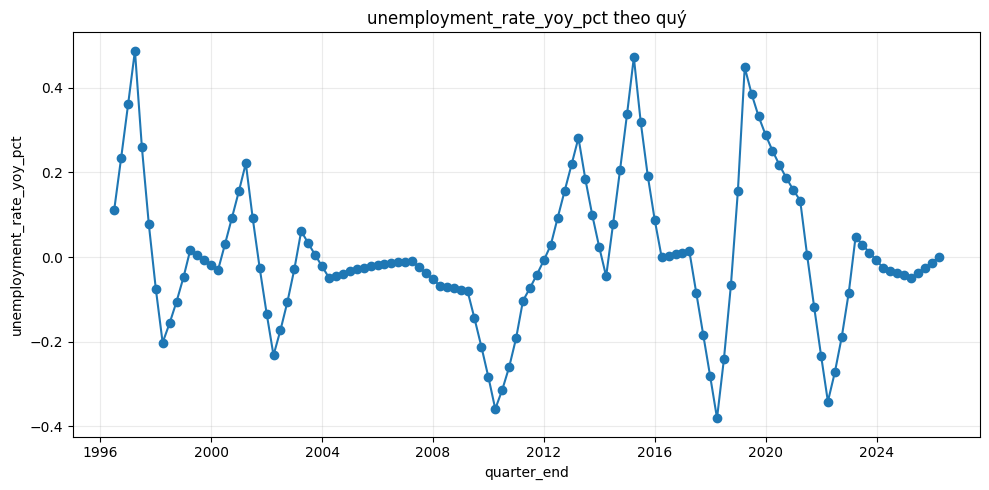

### Line plot: `gov_spending_pct_gdp_lag1`

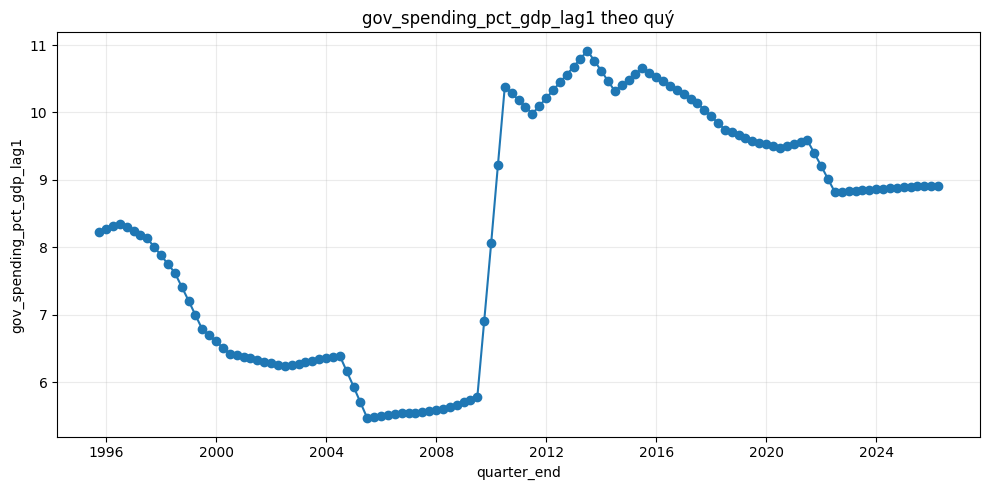

### Line plot: `gov_spending_pct_gdp_lag4`

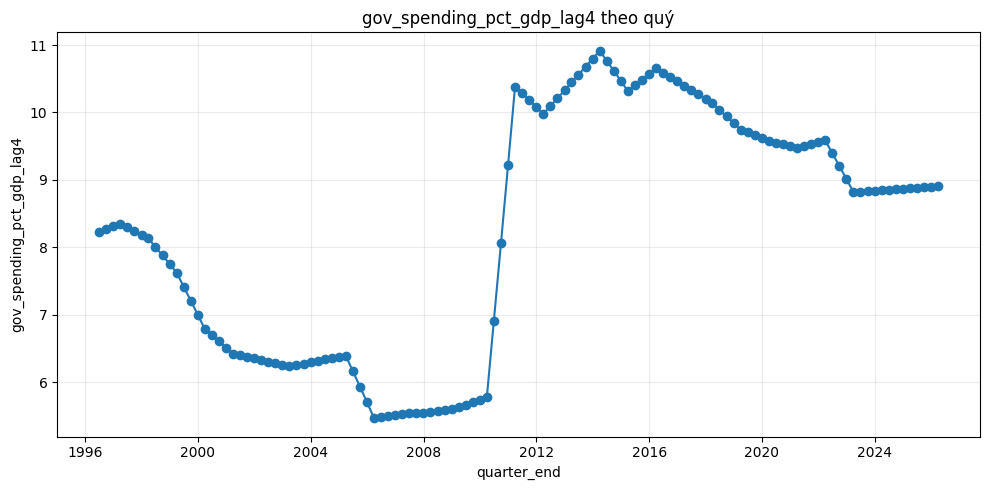

### Line plot: `gov_spending_pct_gdp_diff1`

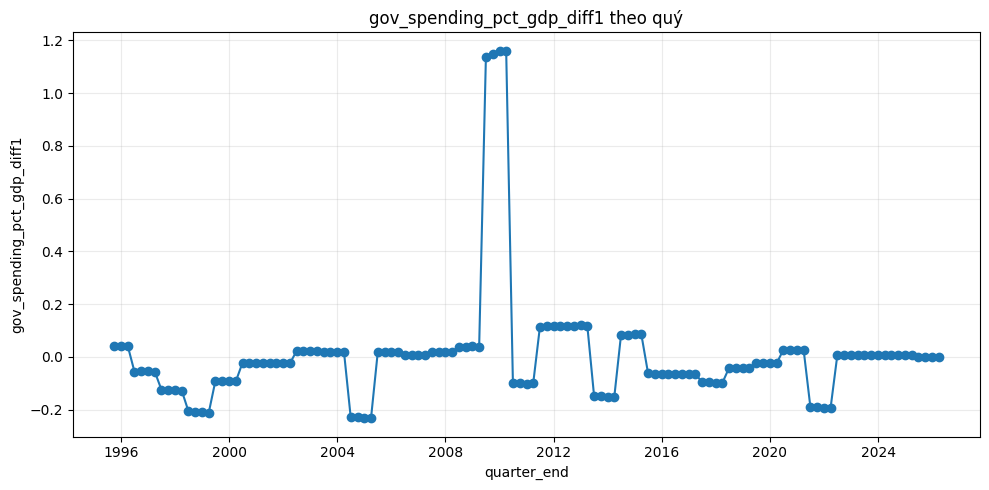

### Line plot: `gov_spending_pct_gdp_diff4`

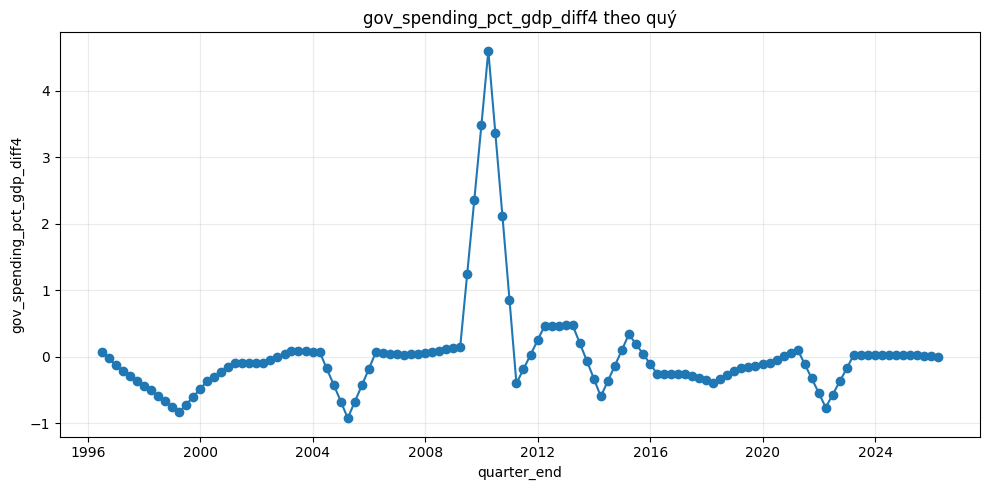

### Line plot: `gov_spending_pct_gdp_qoq_pct`

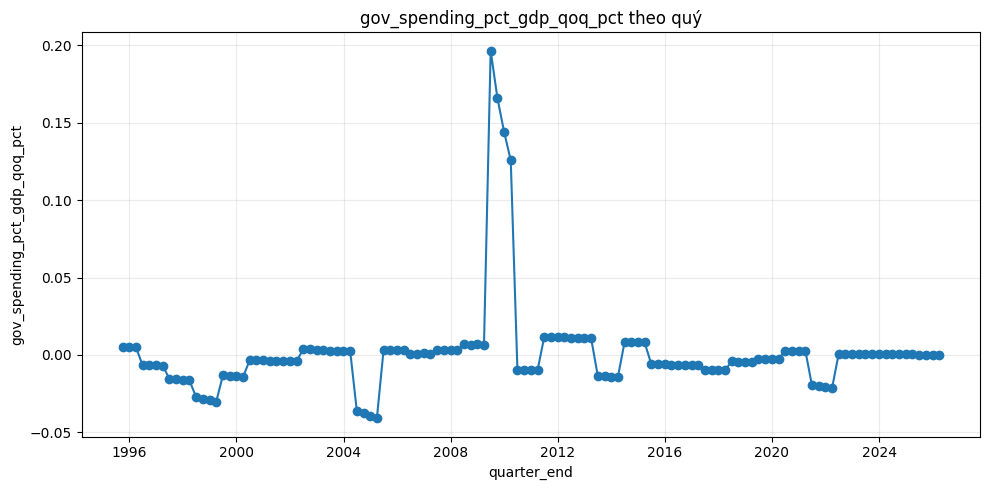

### Line plot: `gov_spending_pct_gdp_yoy_pct`

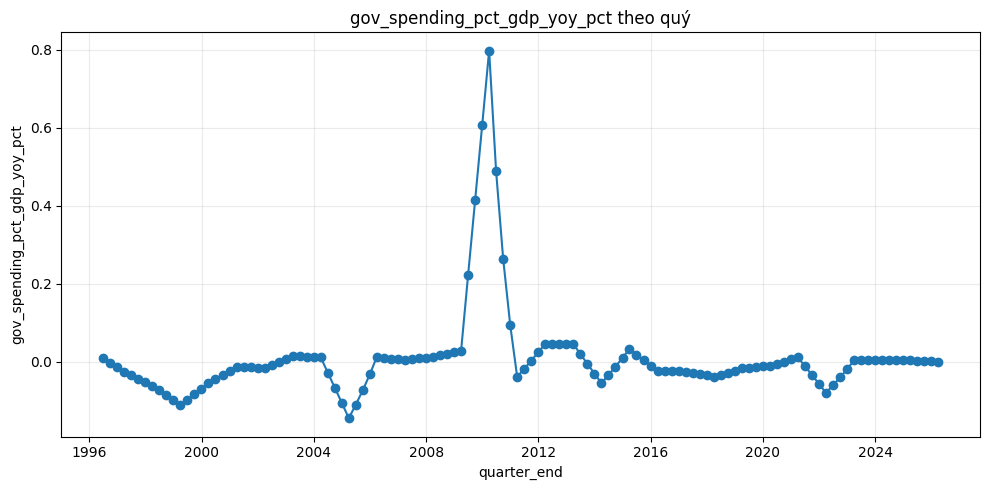

### Line plot: `log_gdp_raw_lag1`

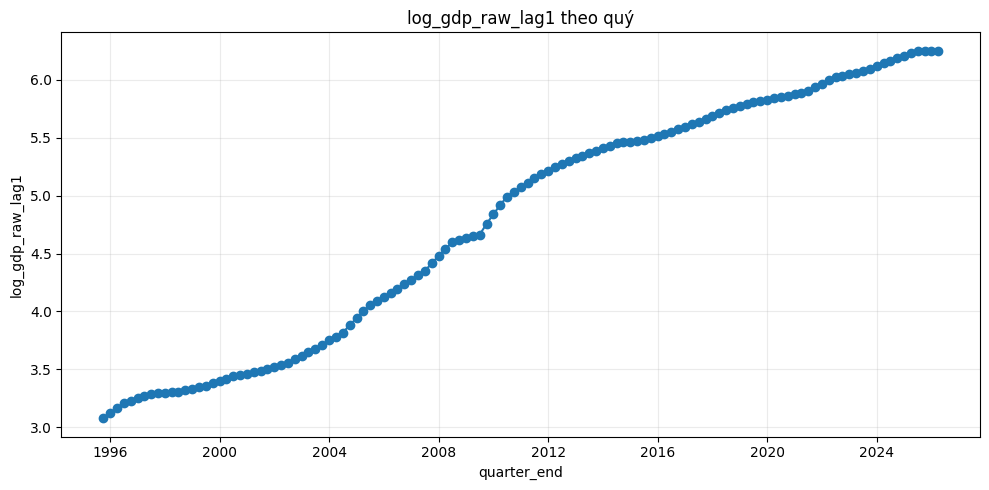

### Line plot: `log_gdp_raw_lag4`

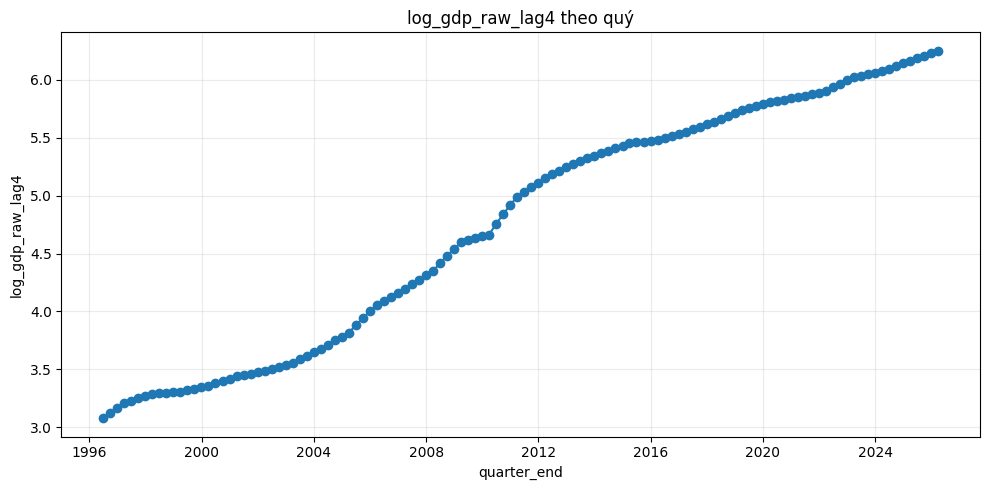

### Line plot: `log_gdp_raw_diff1`

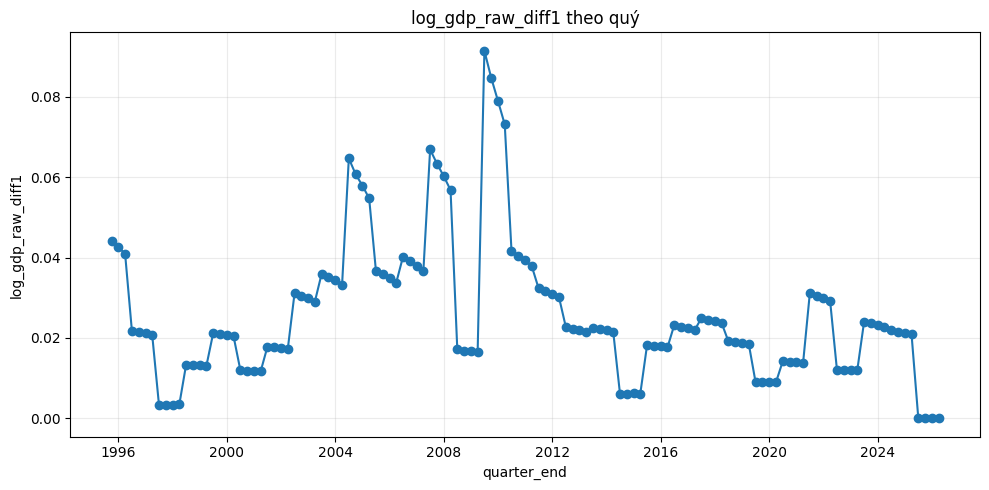

### Line plot: `log_gdp_raw_diff4`

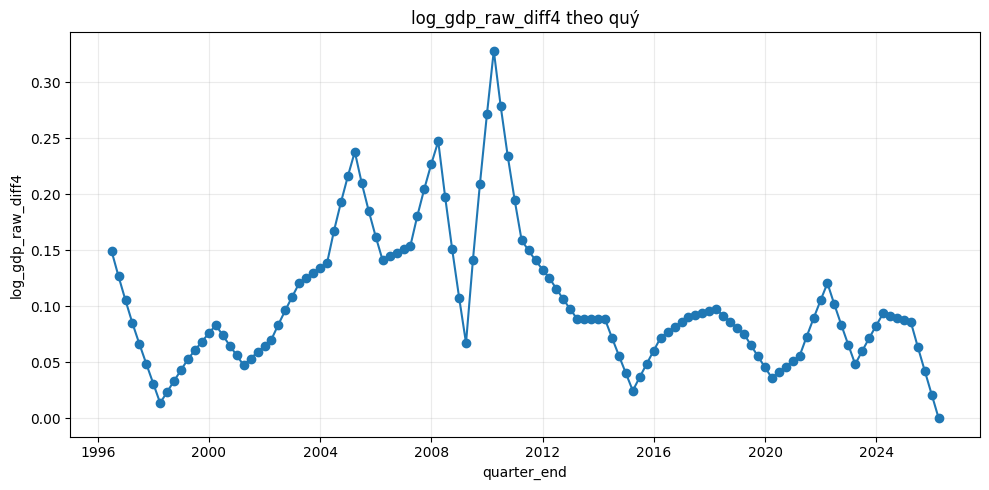

### Line plot: `log_gdp_raw_qoq_pct`

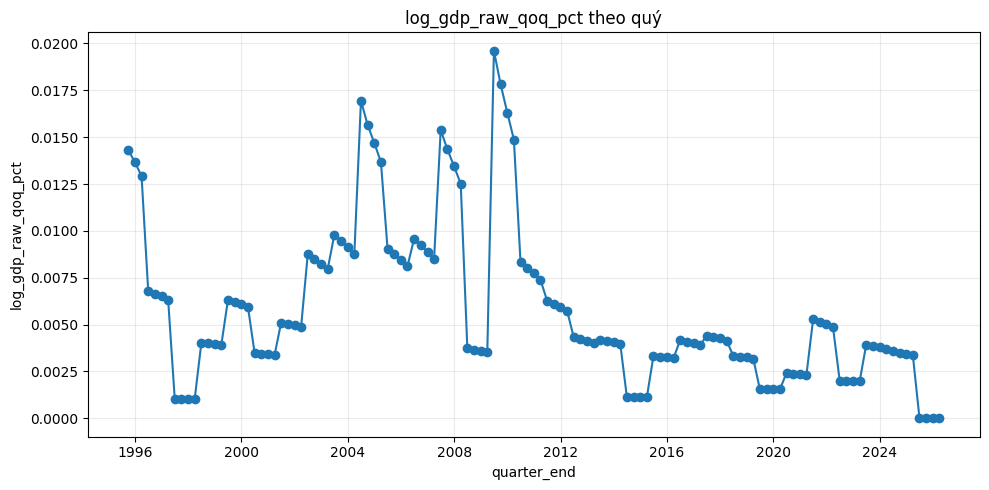

### Line plot: `log_gdp_raw_yoy_pct`

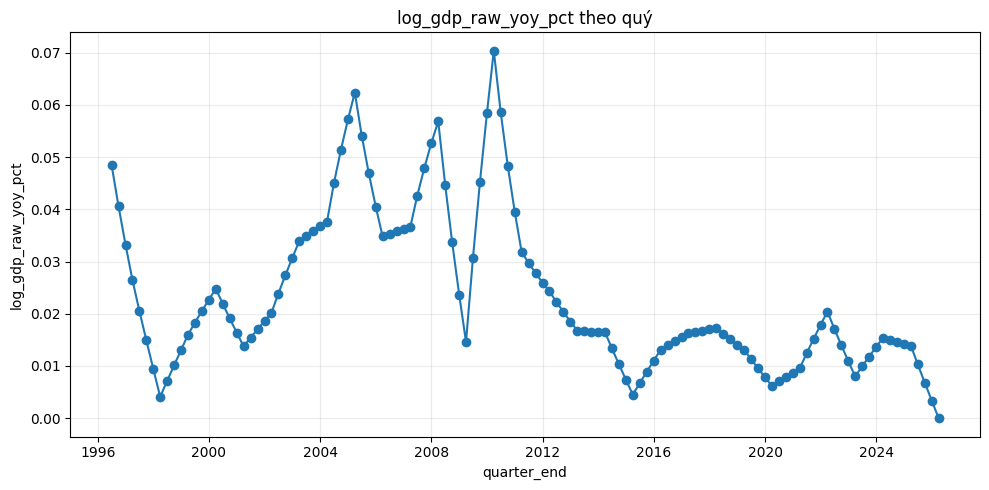

### Line plot: `log_log_gdp_raw`

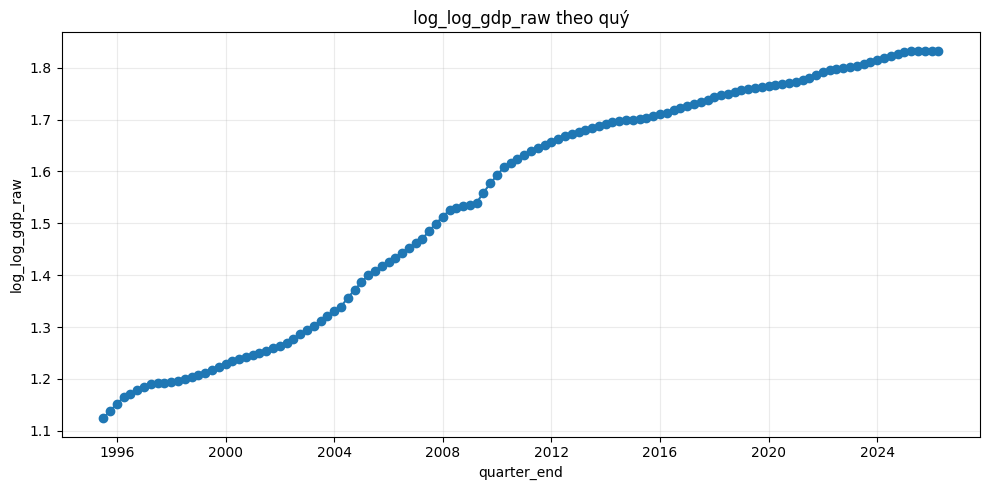

### Line plot: `log_fdi_pct_gdp_lag1`

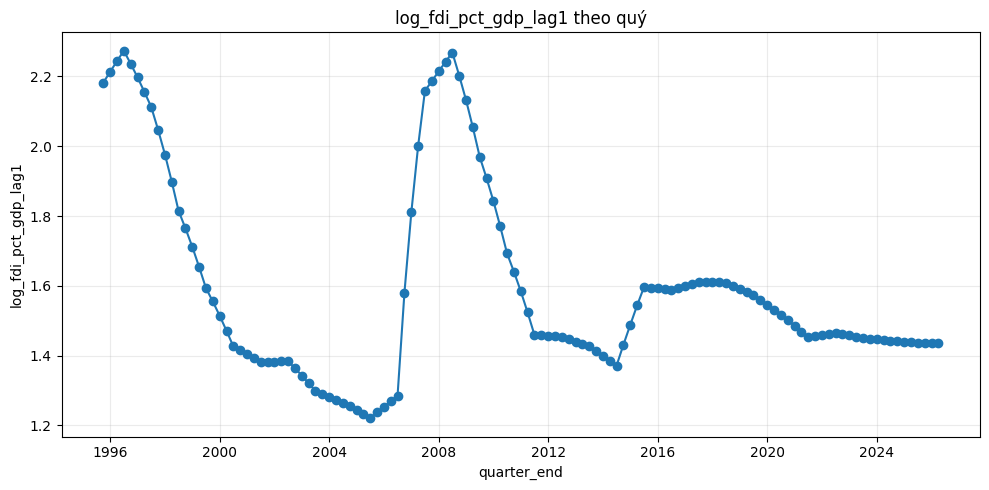

### Line plot: `log_fdi_pct_gdp_lag4`

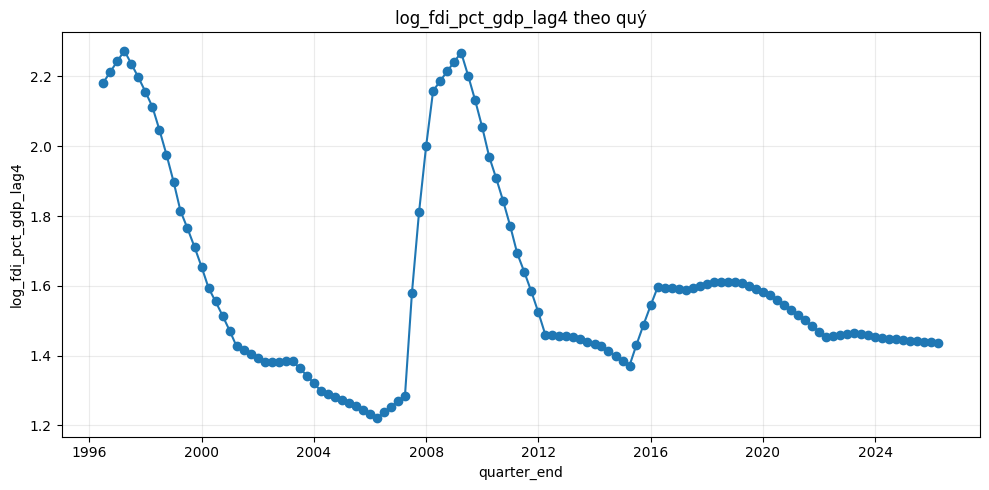

### Line plot: `log_fdi_pct_gdp_diff1`

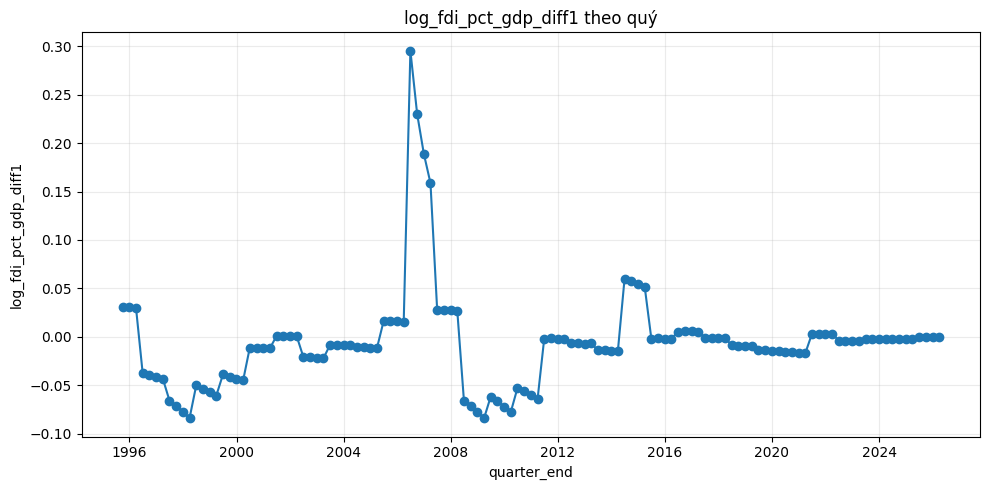

### Line plot: `log_fdi_pct_gdp_diff4`

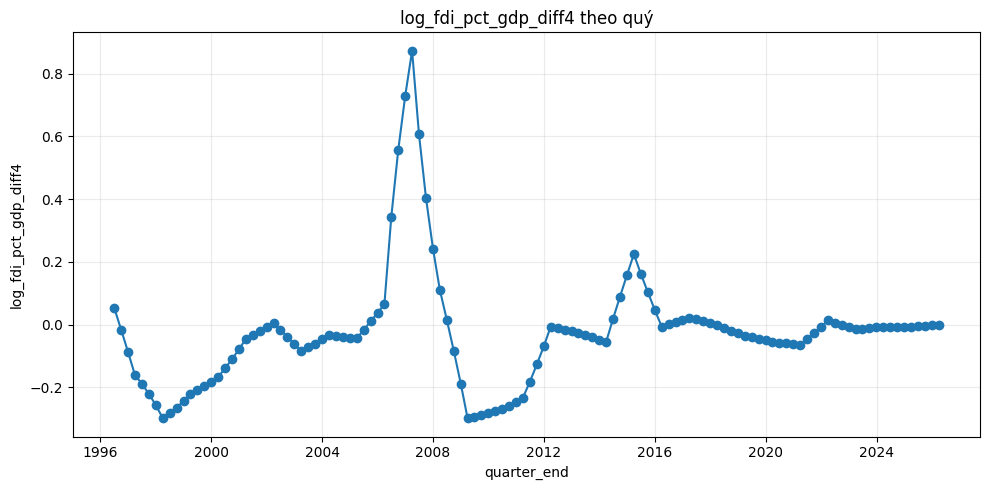

### Line plot: `log_fdi_pct_gdp_qoq_pct`

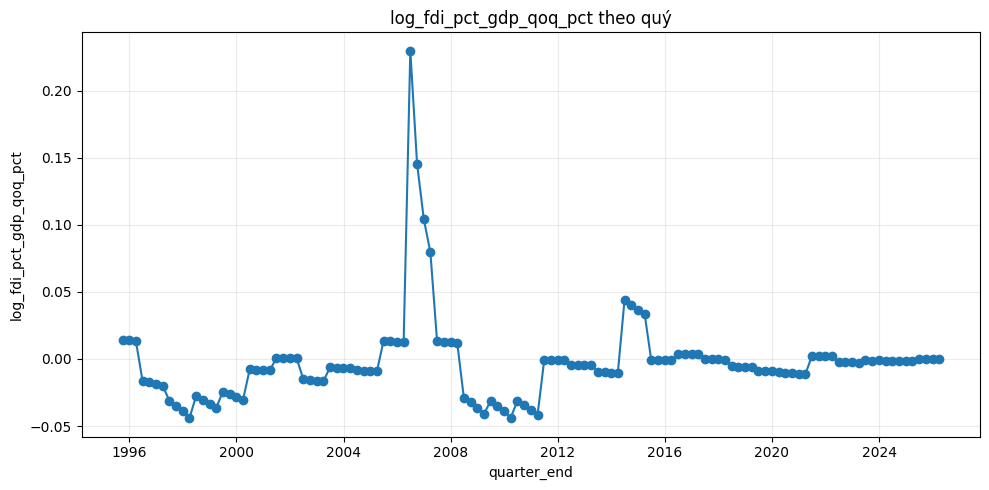

### Line plot: `log_fdi_pct_gdp_yoy_pct`

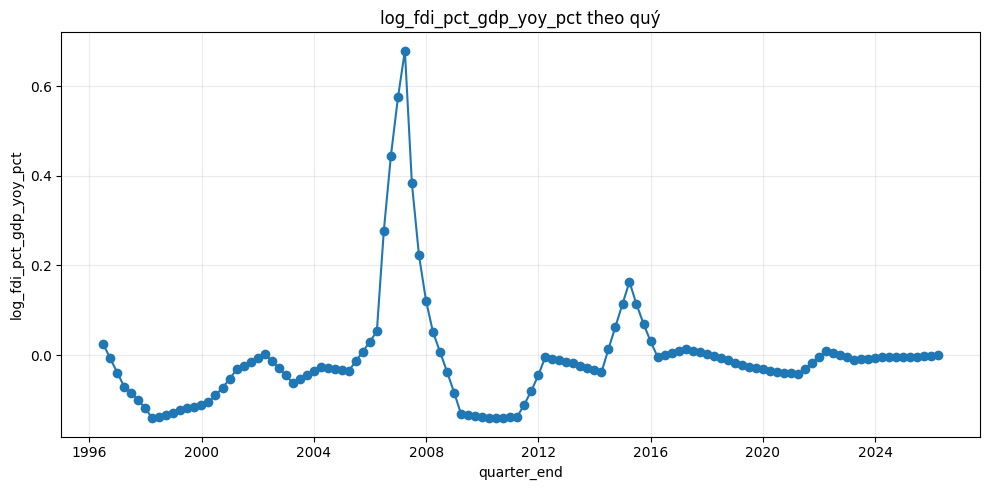

### Line plot: `log_log_fdi_pct_gdp`

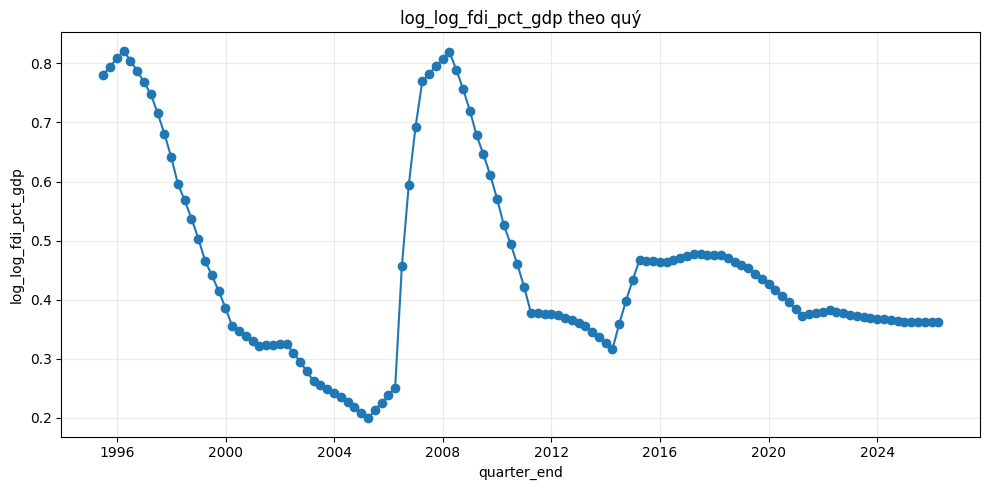

### Line plot: `log_investment_pct_gdp_lag1`

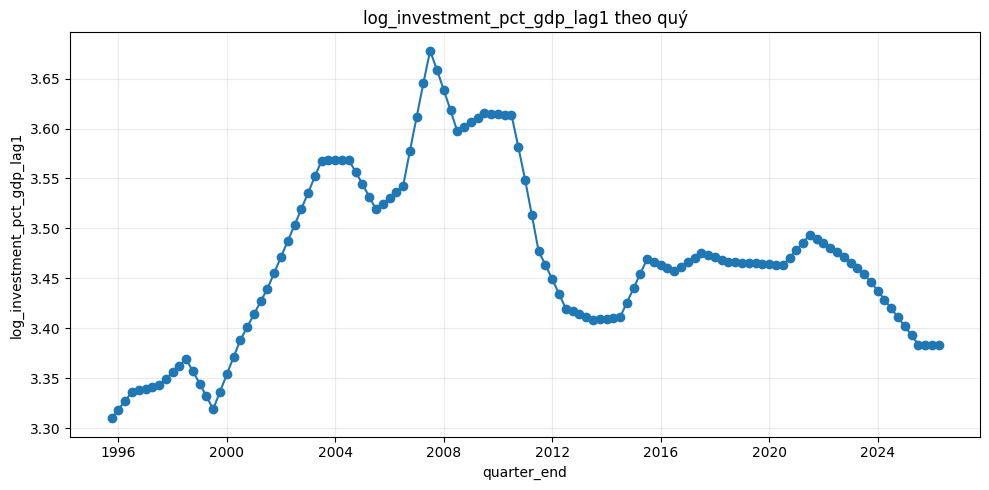

### Line plot: `log_investment_pct_gdp_lag4`

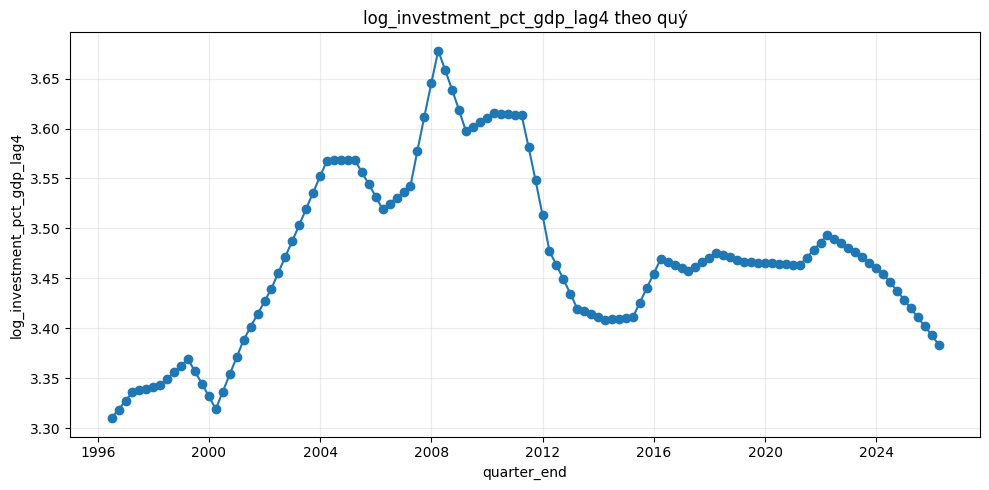

### Line plot: `log_investment_pct_gdp_diff1`

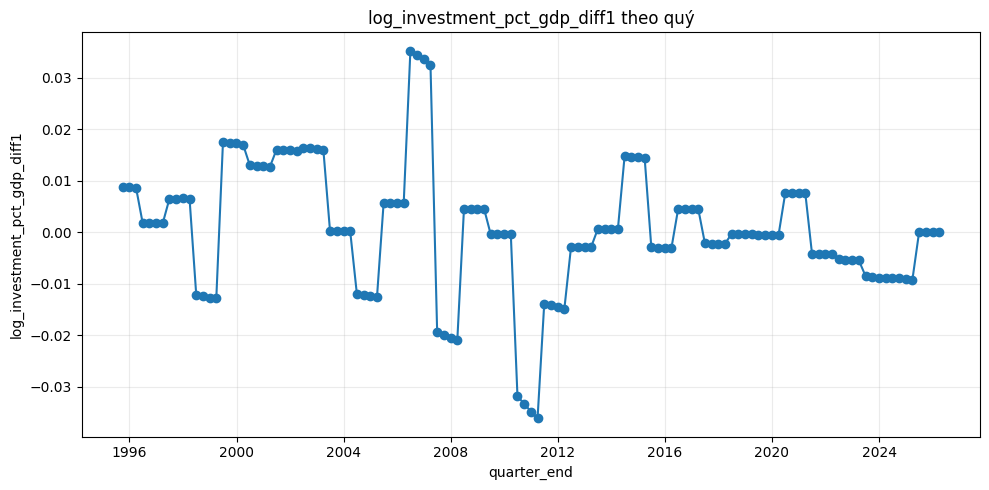

### Line plot: `log_investment_pct_gdp_diff4`

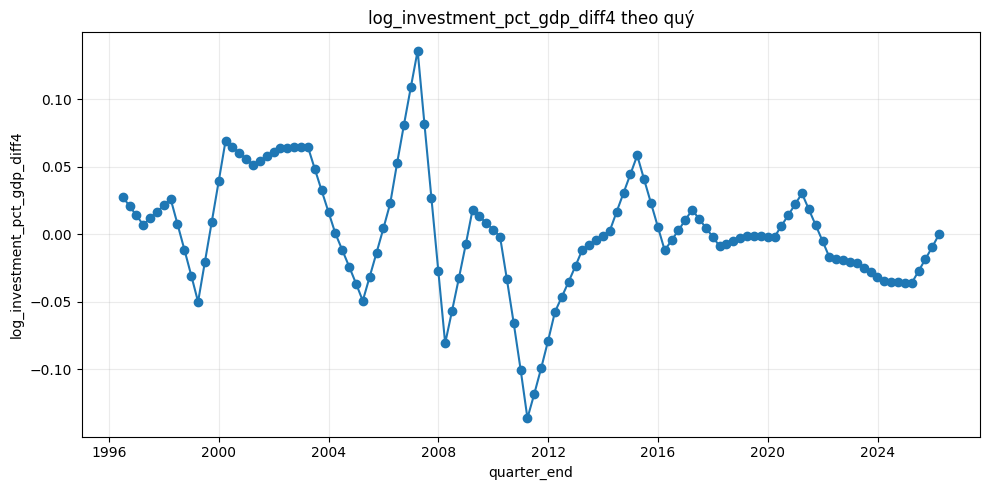

### Line plot: `log_investment_pct_gdp_qoq_pct`

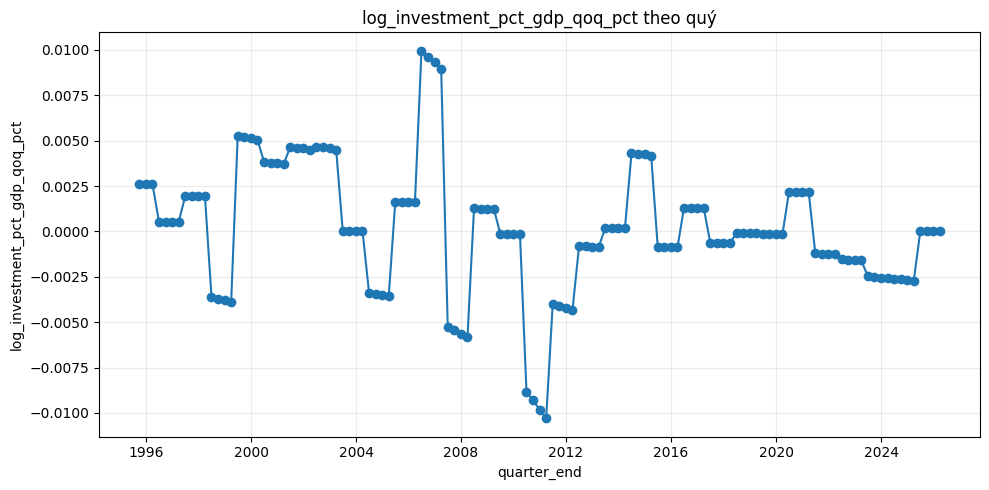

### Line plot: `log_investment_pct_gdp_yoy_pct`

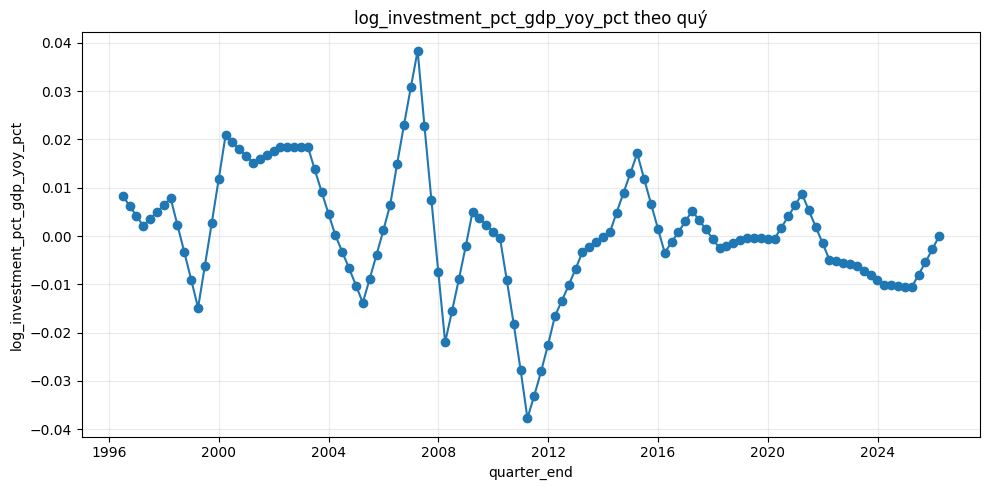

### Line plot: `log_log_investment_pct_gdp`

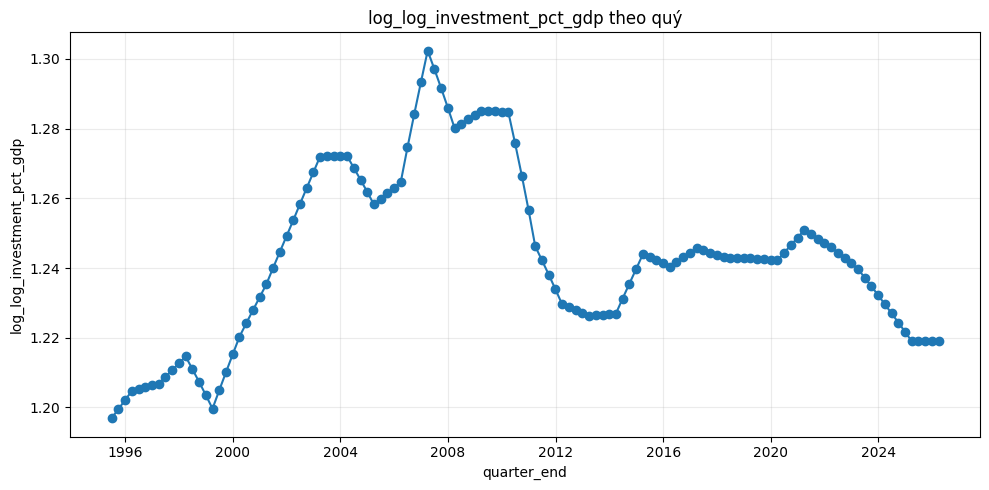

### Line plot: `log_export_pct_gdp_lag1`

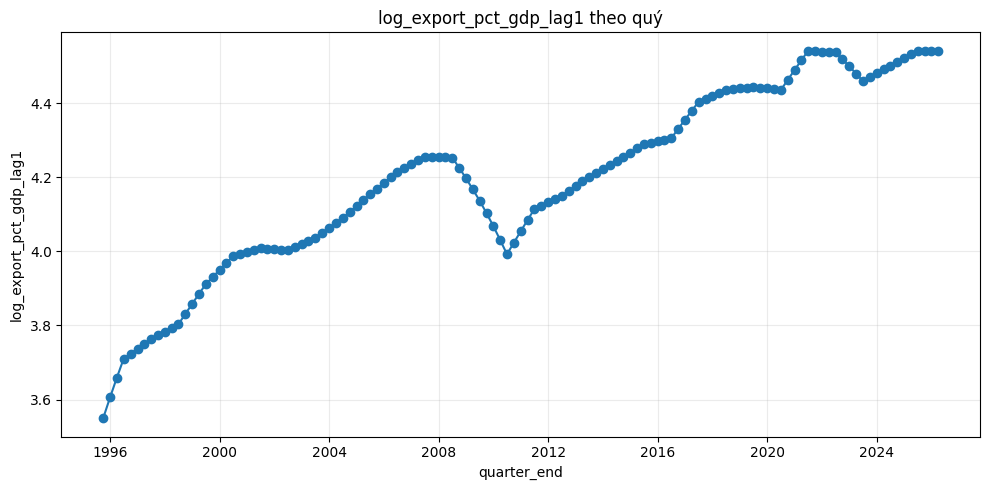

### Line plot: `log_export_pct_gdp_lag4`

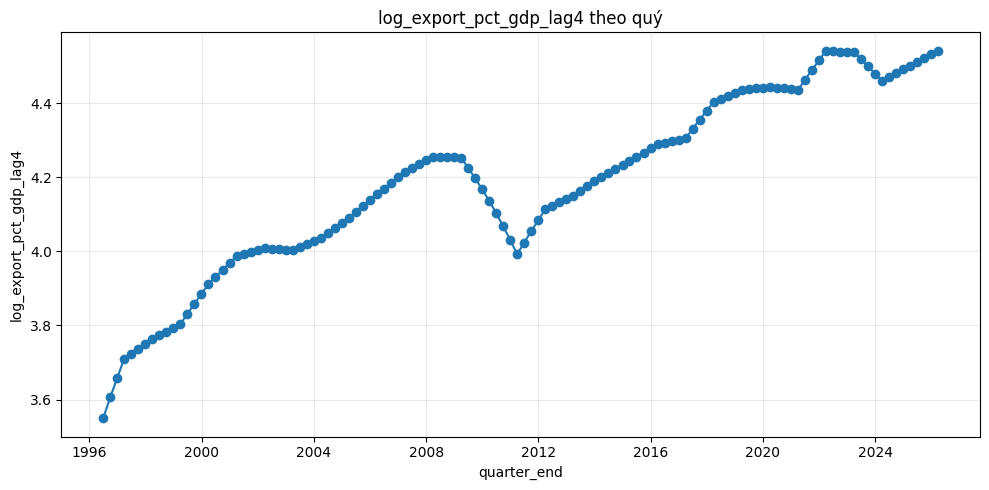

### Line plot: `log_export_pct_gdp_diff1`

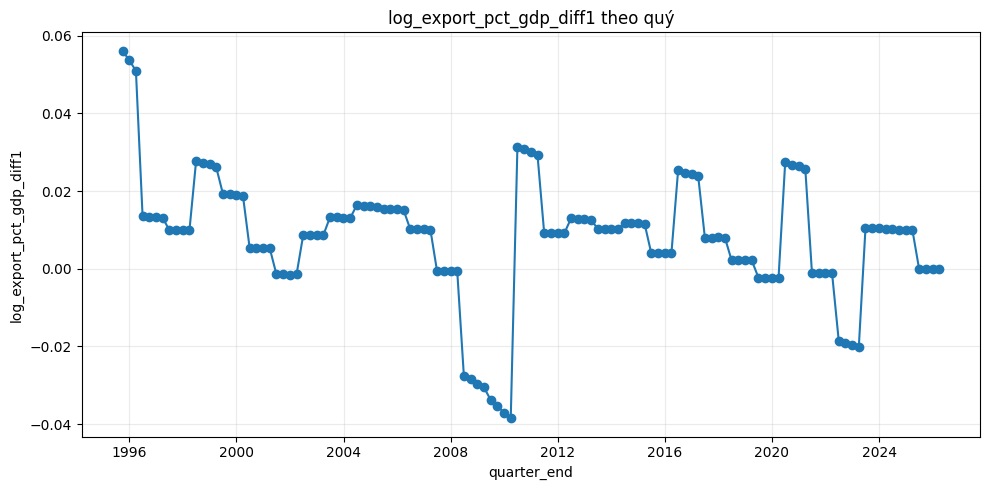

### Line plot: `log_export_pct_gdp_diff4`

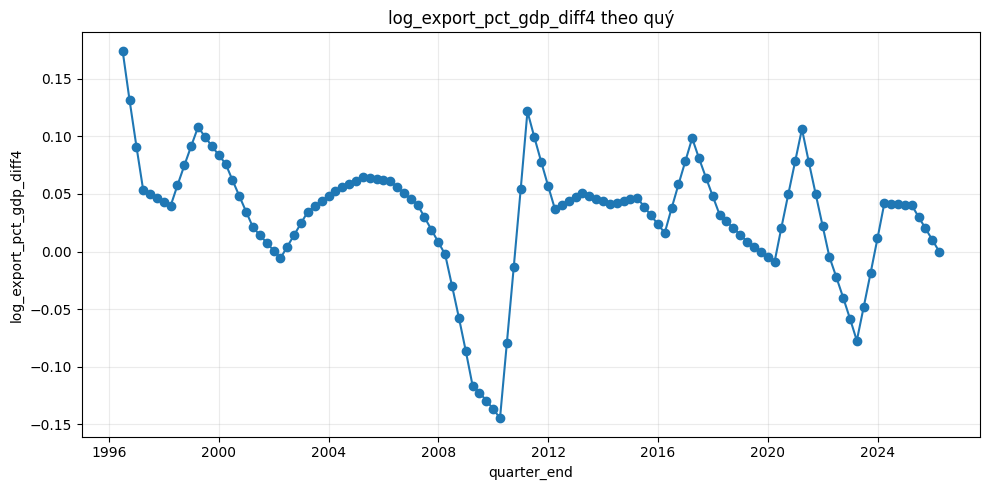

### Line plot: `log_export_pct_gdp_qoq_pct`

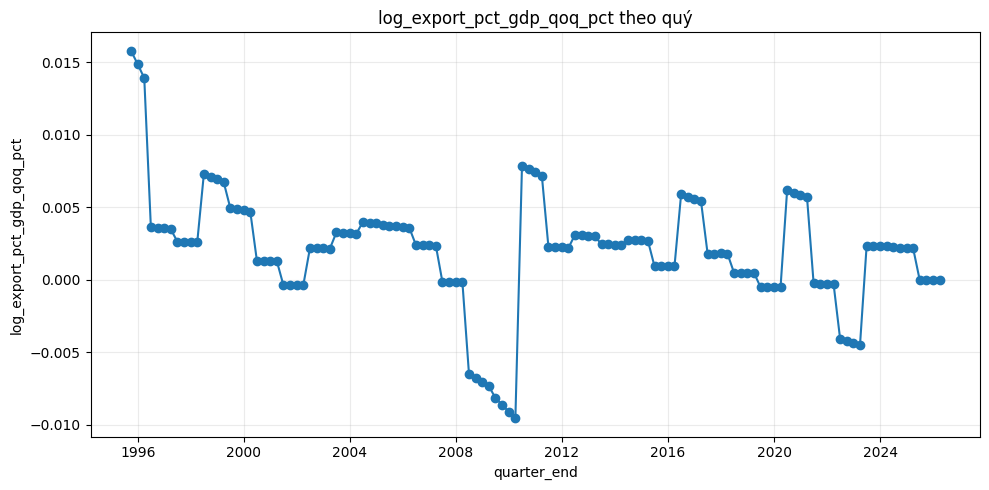

### Line plot: `log_export_pct_gdp_yoy_pct`

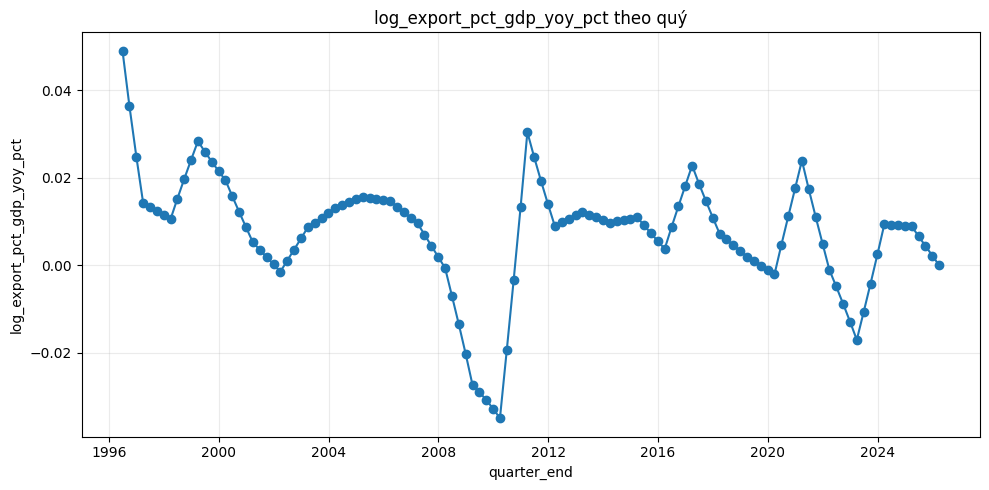

### Line plot: `log_log_export_pct_gdp`

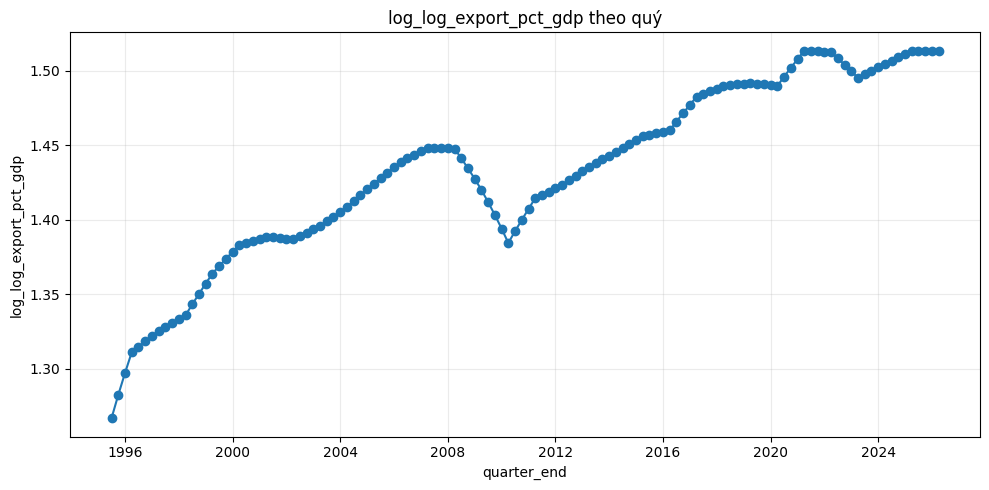

### Line plot: `log_gov_spending_pct_gdp_lag1`

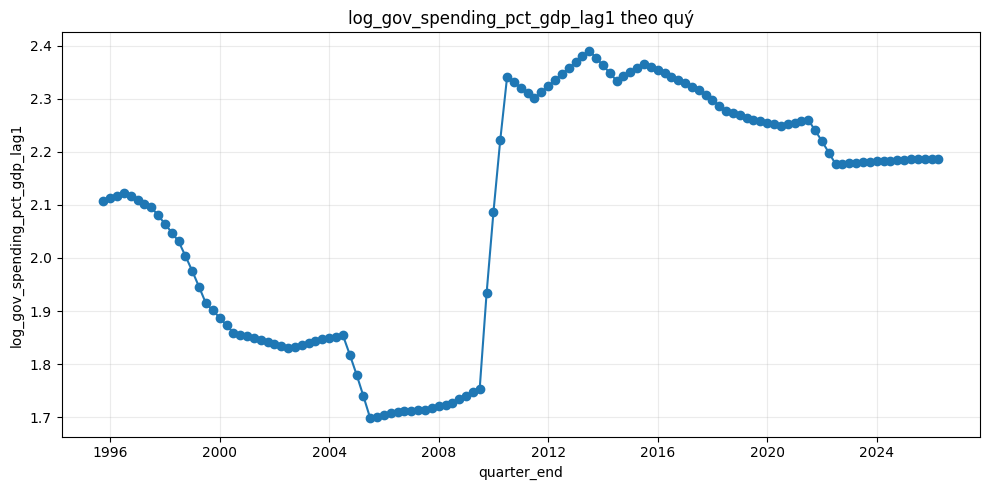

### Line plot: `log_gov_spending_pct_gdp_lag4`

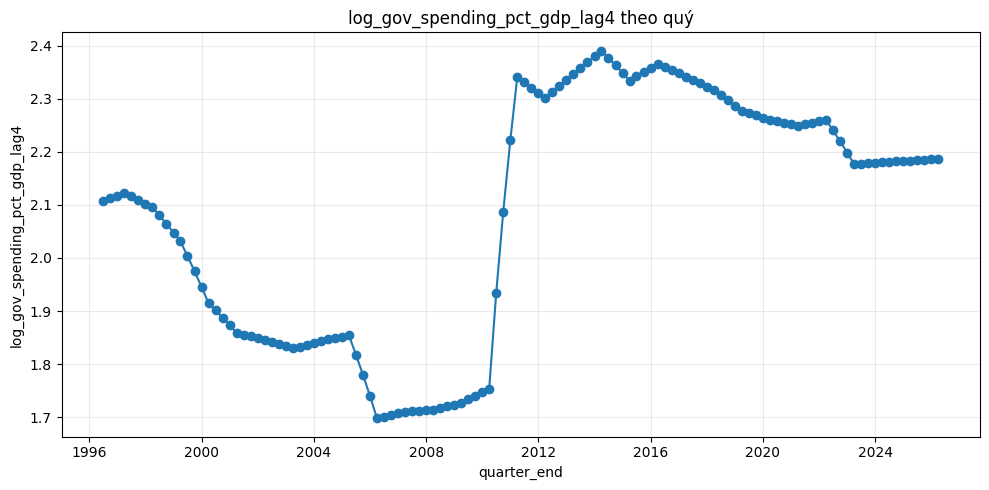

### Line plot: `log_gov_spending_pct_gdp_diff1`

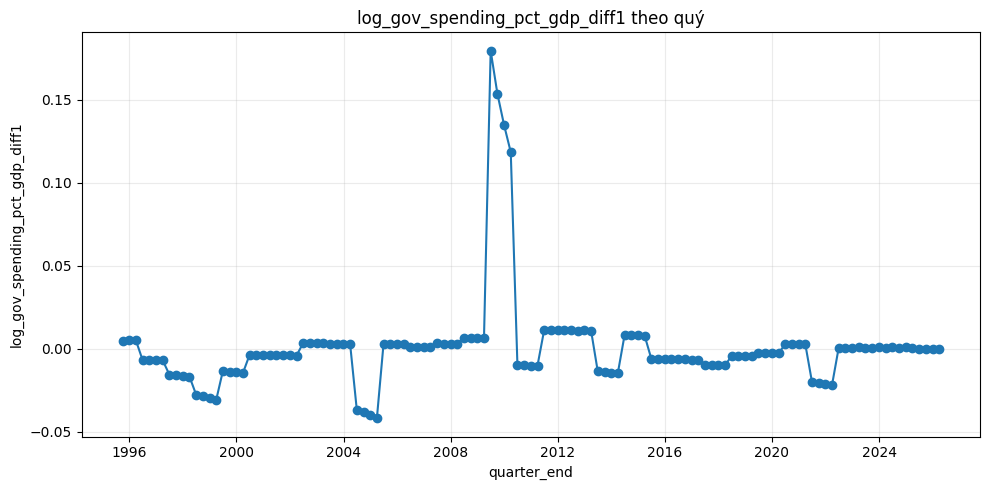

### Line plot: `log_gov_spending_pct_gdp_diff4`

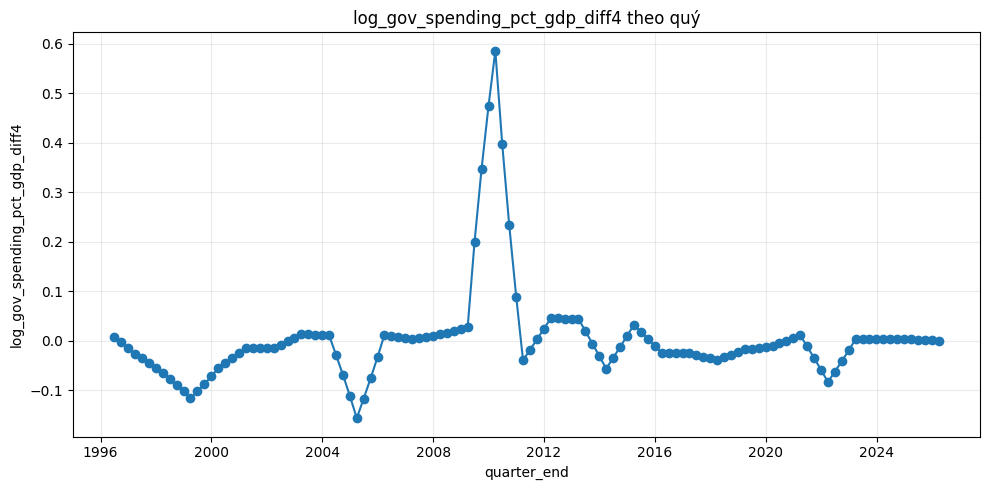

### Line plot: `log_gov_spending_pct_gdp_qoq_pct`

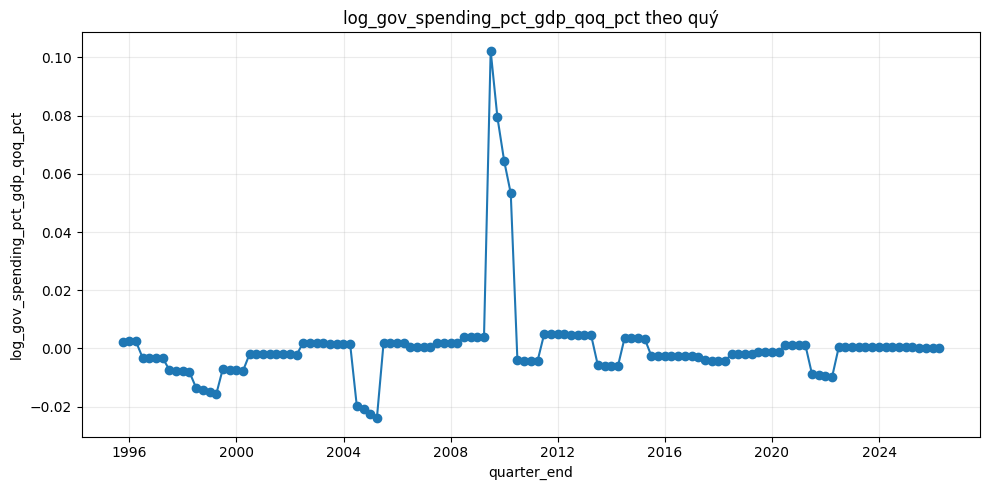

### Line plot: `log_gov_spending_pct_gdp_yoy_pct`

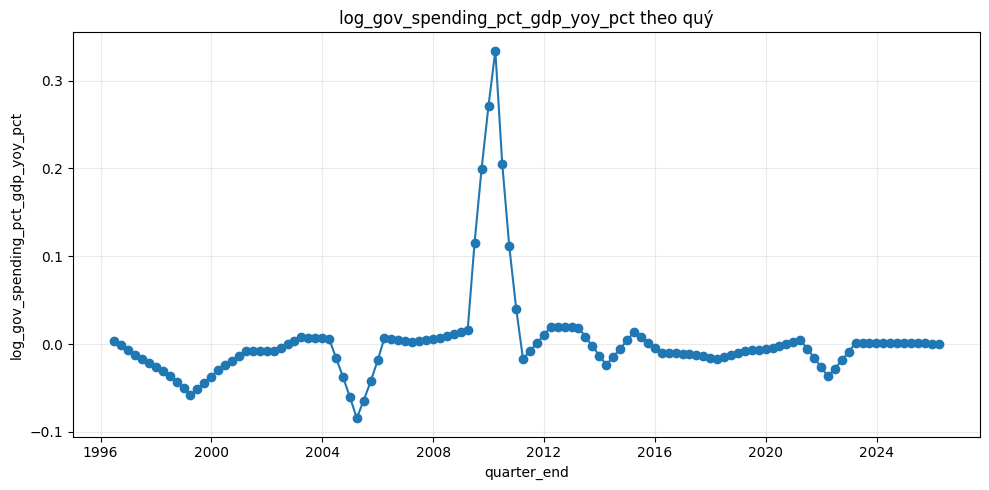

### Line plot: `log_log_gov_spending_pct_gdp`

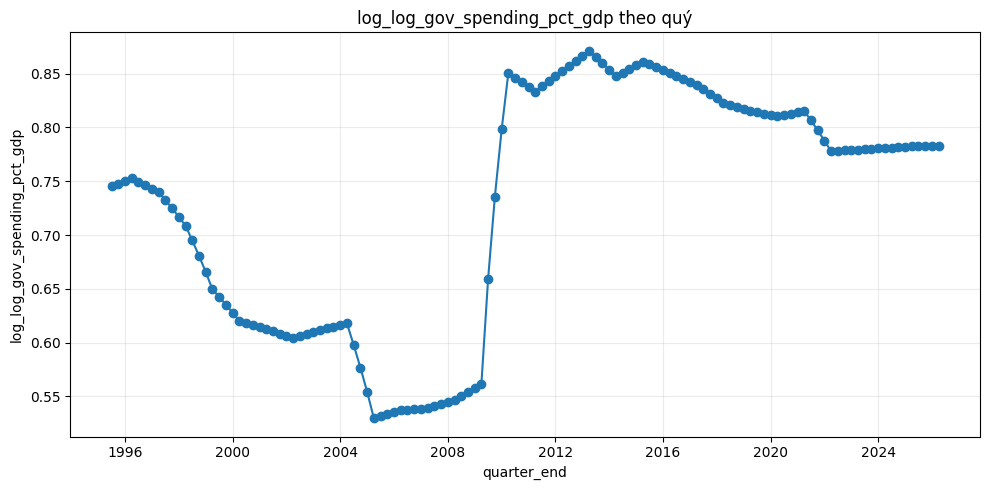

### Line plot: `real_interest_rate_lag1`

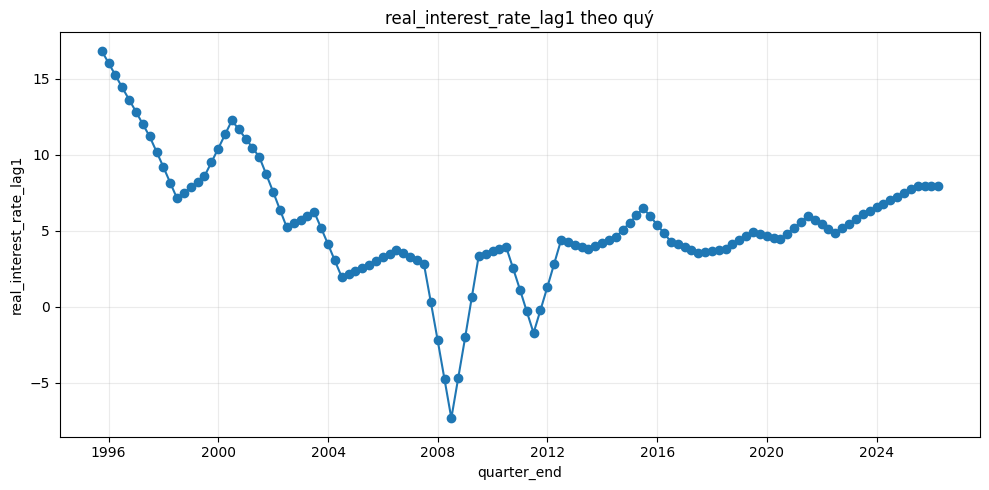

### Line plot: `real_interest_rate_lag4`

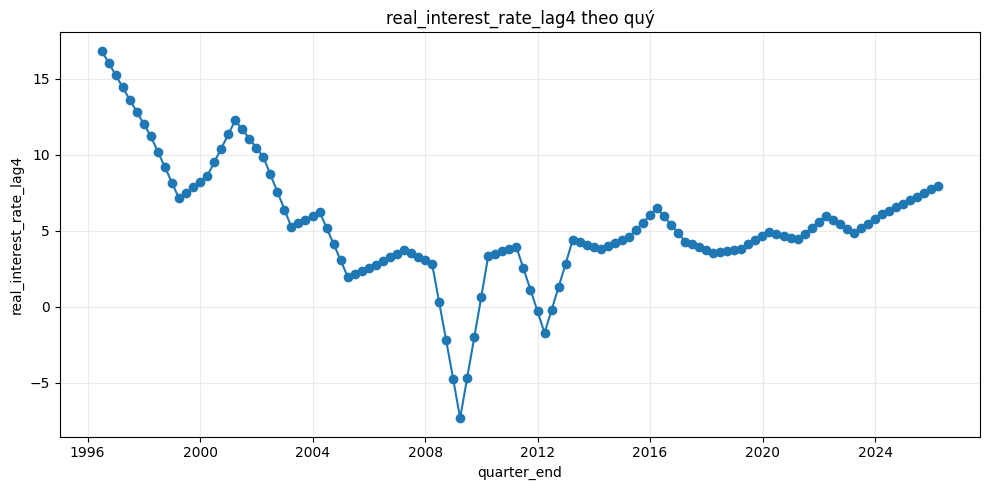

### Line plot: `real_interest_rate_diff1`

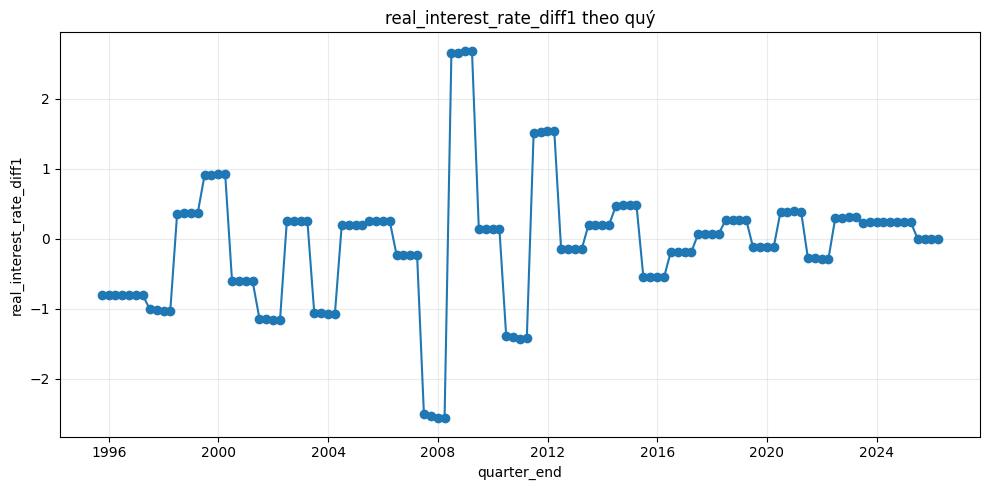

### Line plot: `real_interest_rate_diff4`

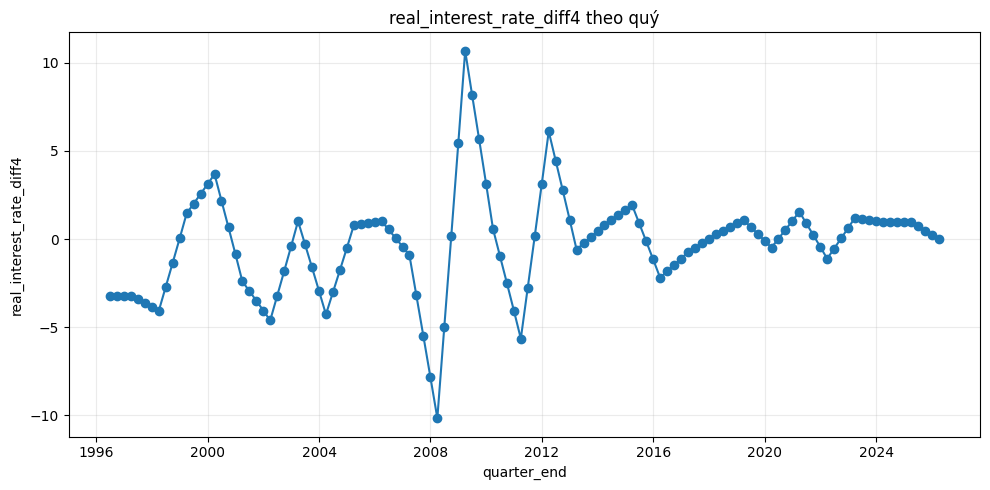

### Line plot: `n_comments_lag1`

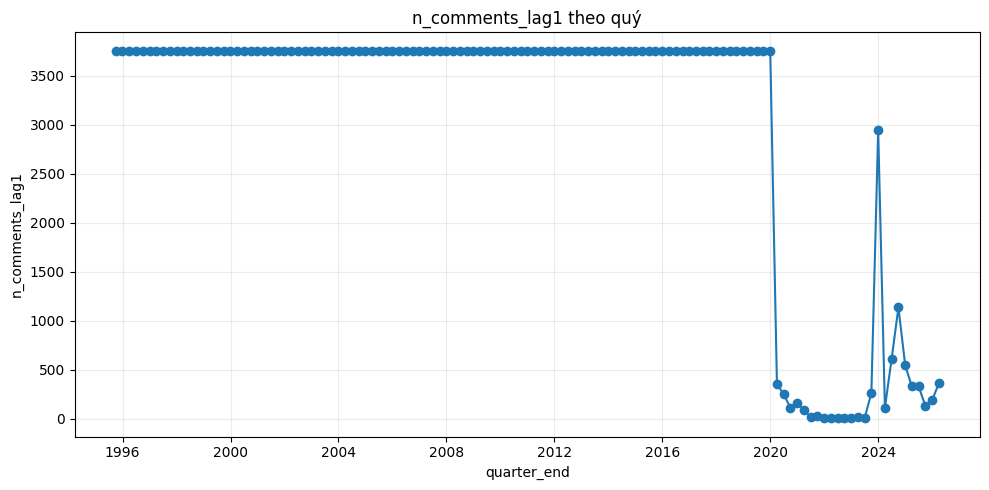

### Line plot: `n_comments_lag4`

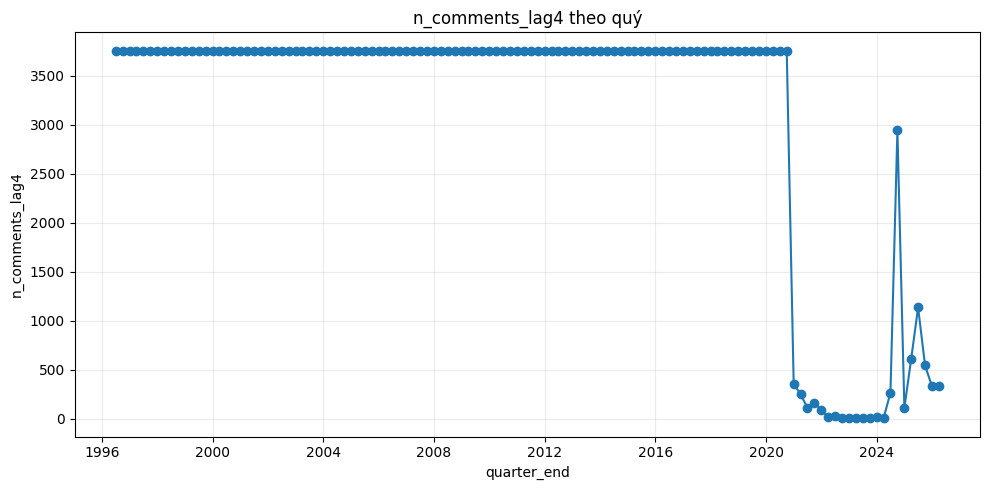

### Line plot: `n_comments_diff1`

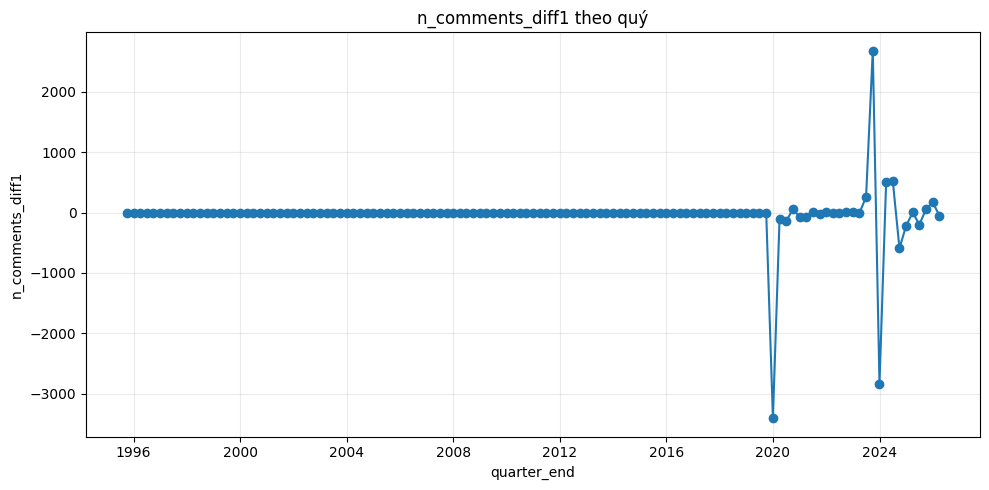

### Line plot: `n_comments_diff4`

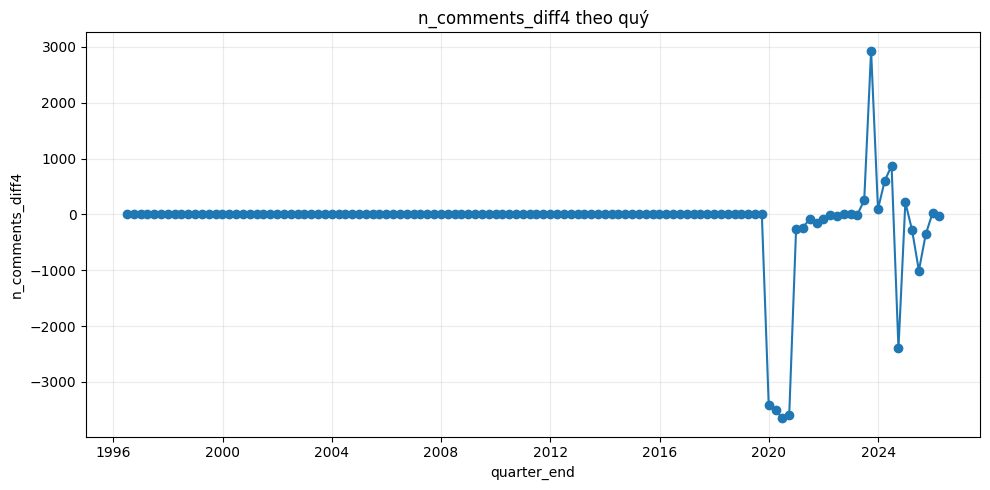

### Line plot: `n_comments_qoq_pct`

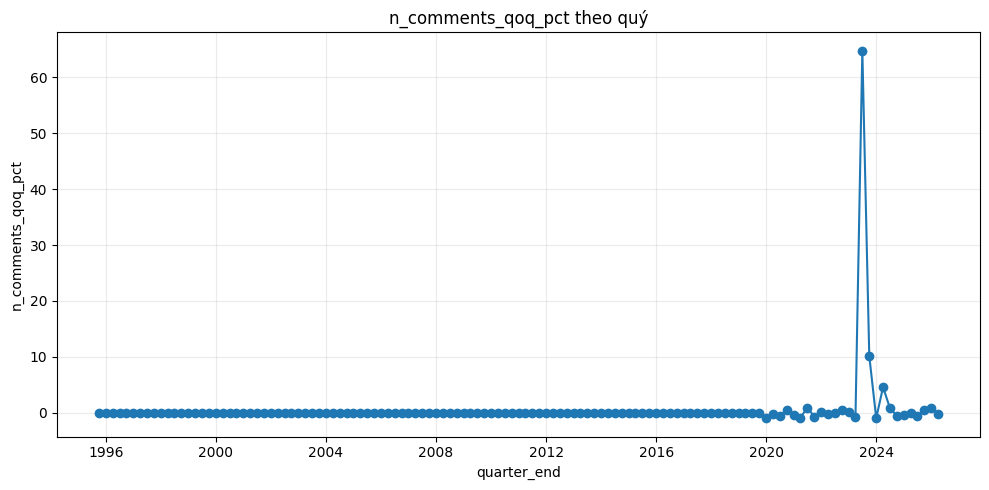

### Line plot: `n_comments_yoy_pct`

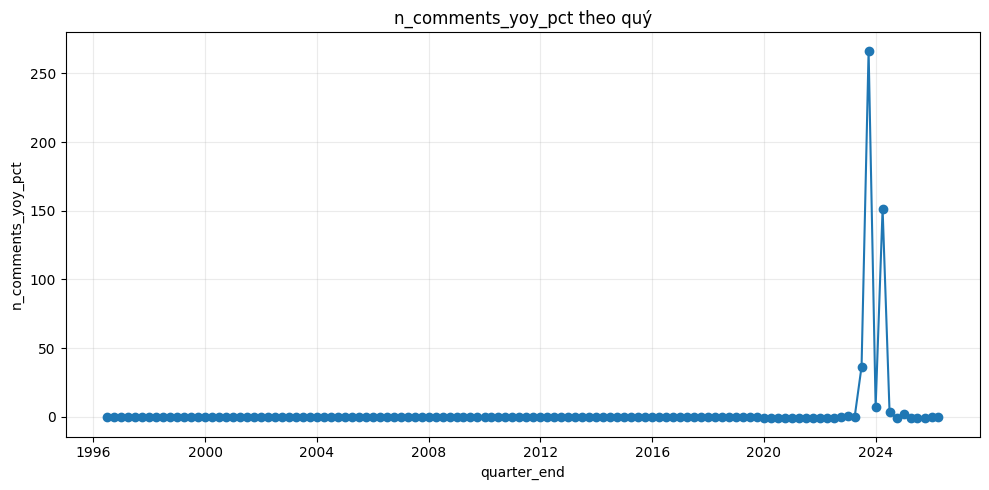

### Line plot: `n_unique_authors_lag1`

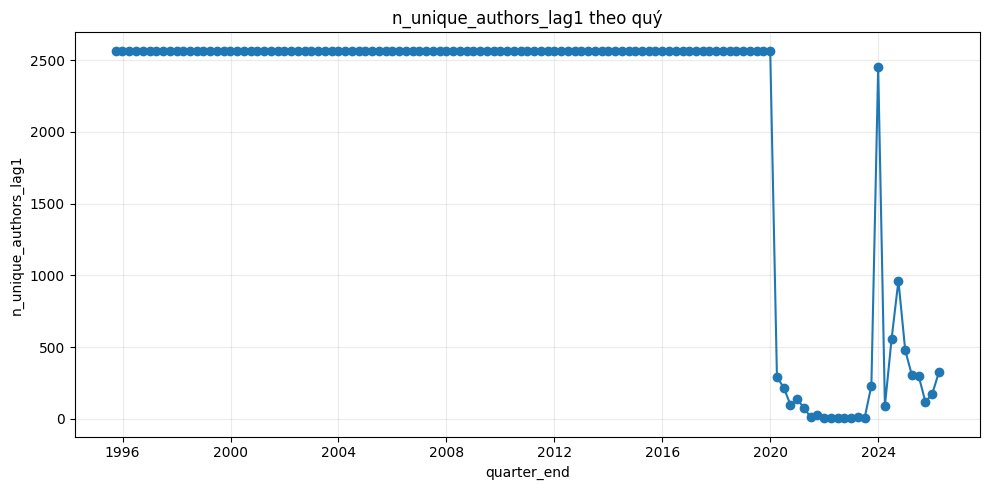

### Line plot: `n_unique_authors_lag4`

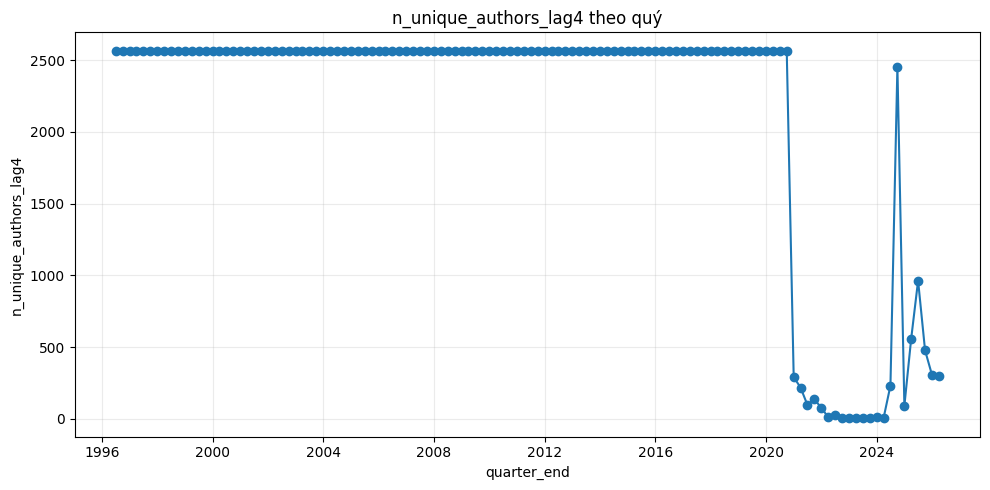

### Line plot: `n_unique_authors_diff1`

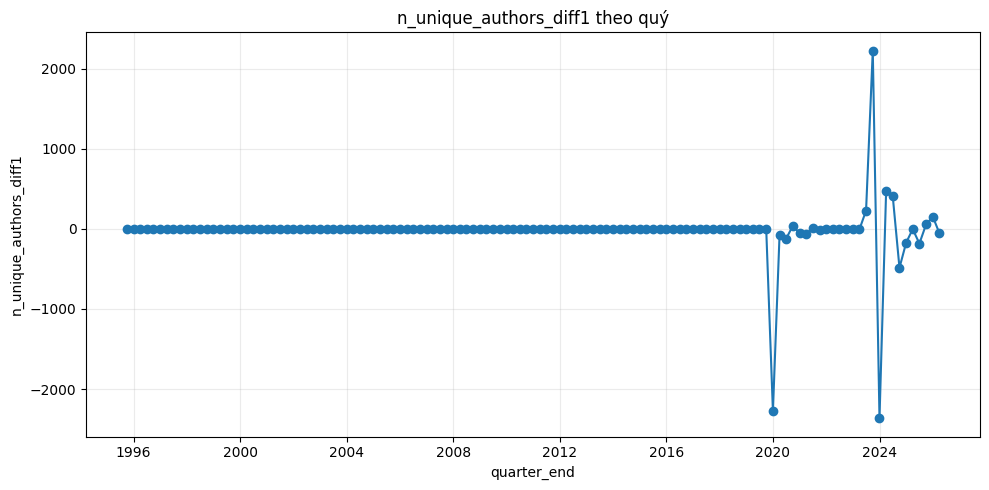

### Line plot: `n_unique_authors_diff4`

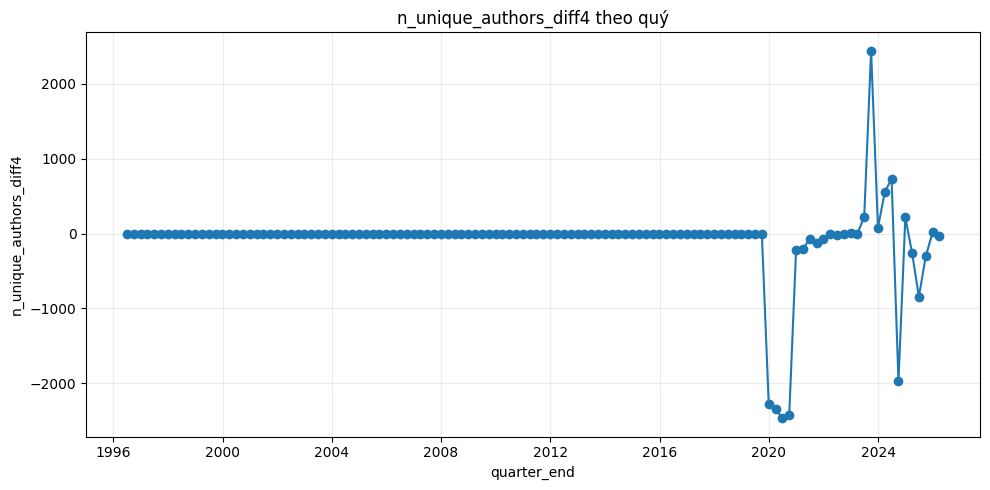

### Line plot: `n_unique_authors_qoq_pct`

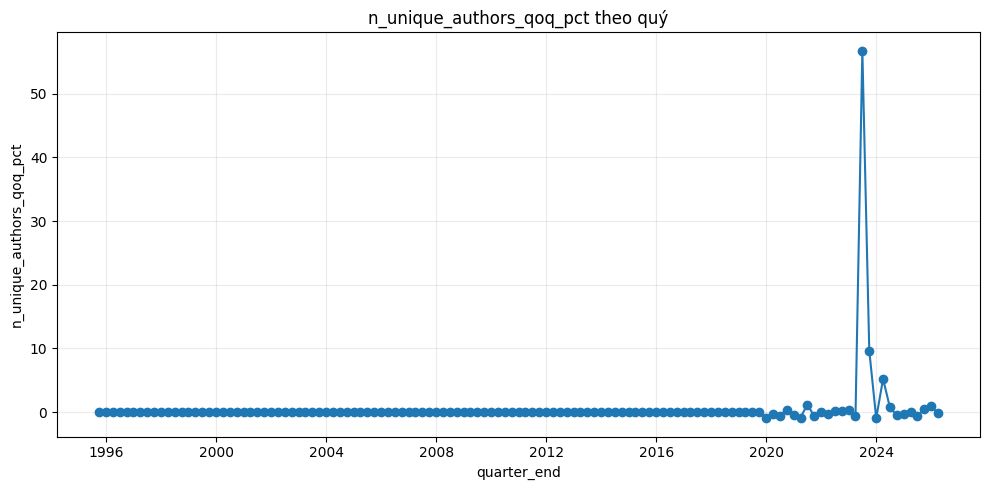

### Line plot: `n_unique_authors_yoy_pct`

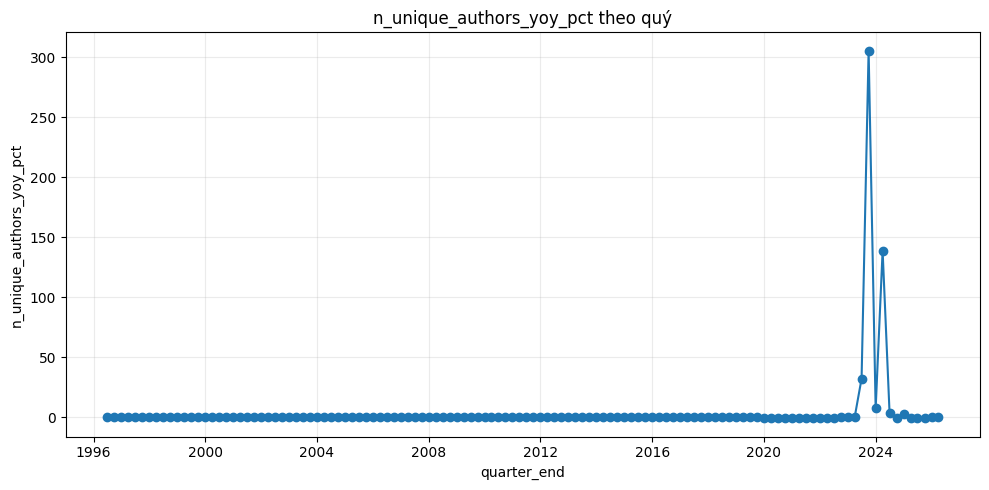

### Line plot: `like_sum_lag1`

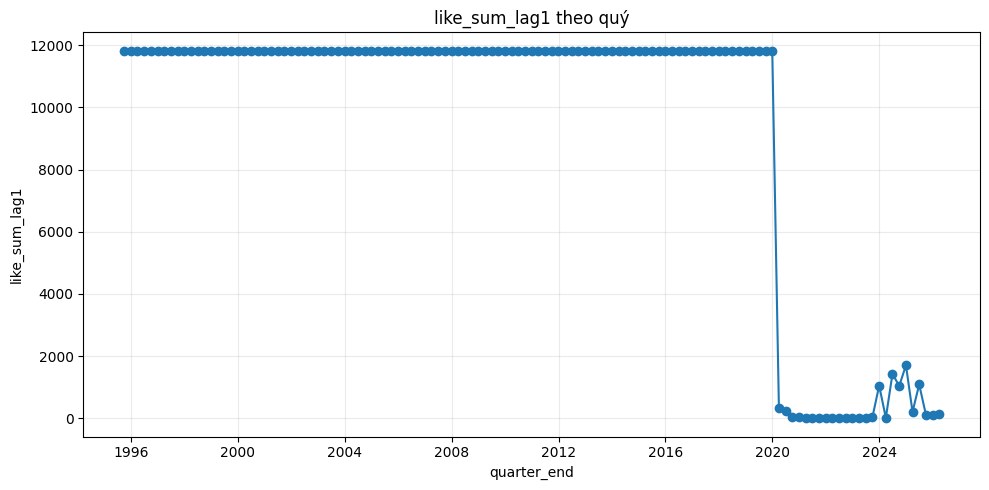

### Line plot: `like_sum_lag4`

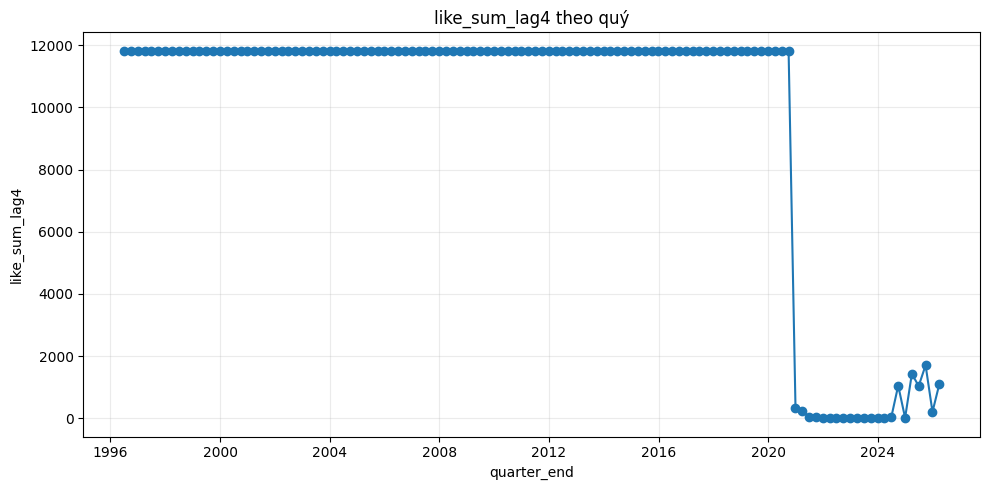

### Line plot: `like_sum_diff1`

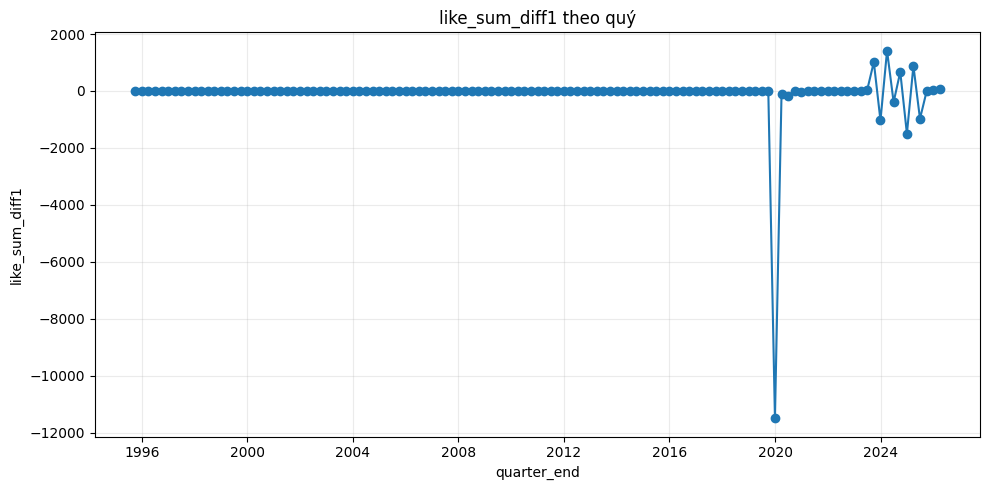

### Line plot: `like_sum_diff4`

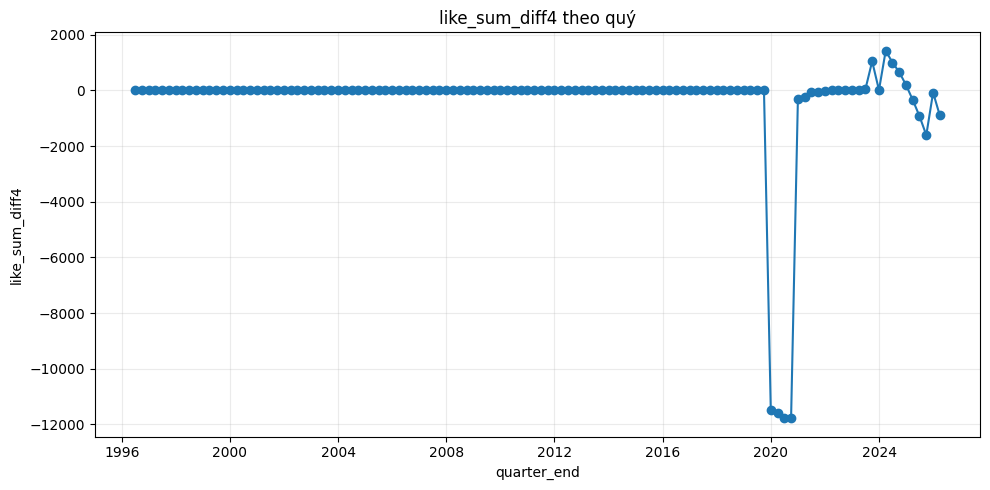

### Line plot: `like_mean_lag1`

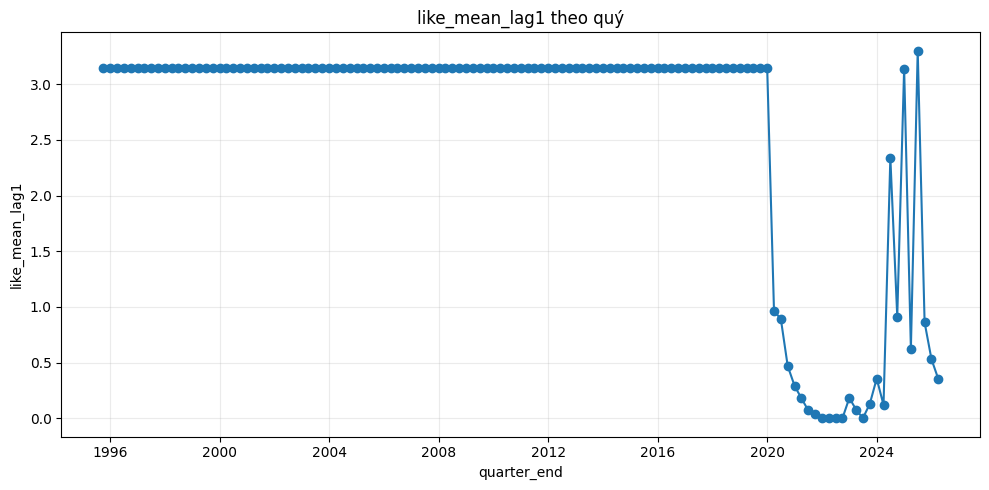

### Line plot: `like_mean_lag4`

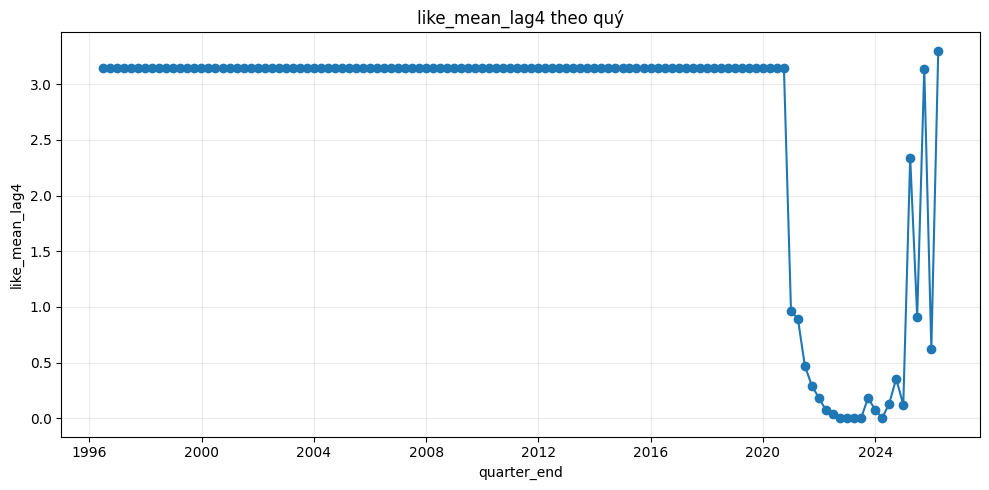

### Line plot: `like_mean_diff1`

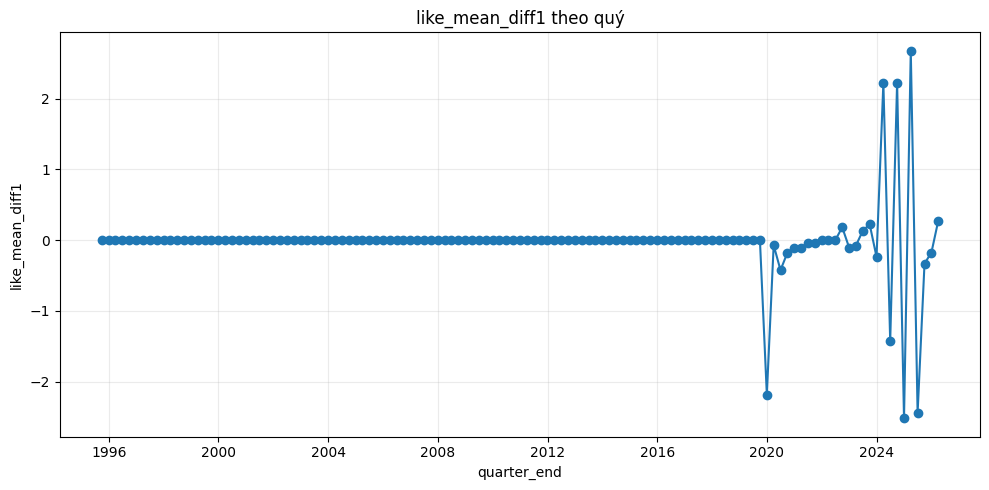

### Line plot: `like_mean_diff4`

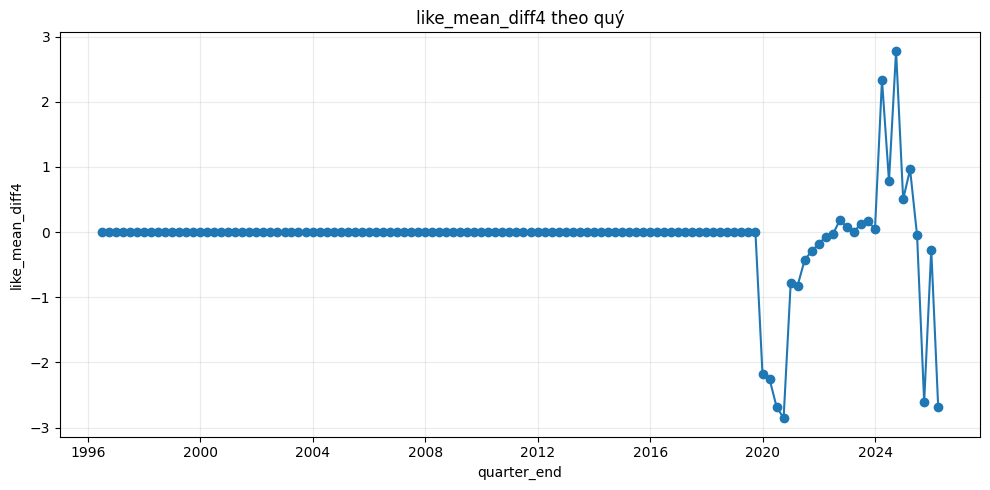

### Line plot: `avg_sentiment_lag1`

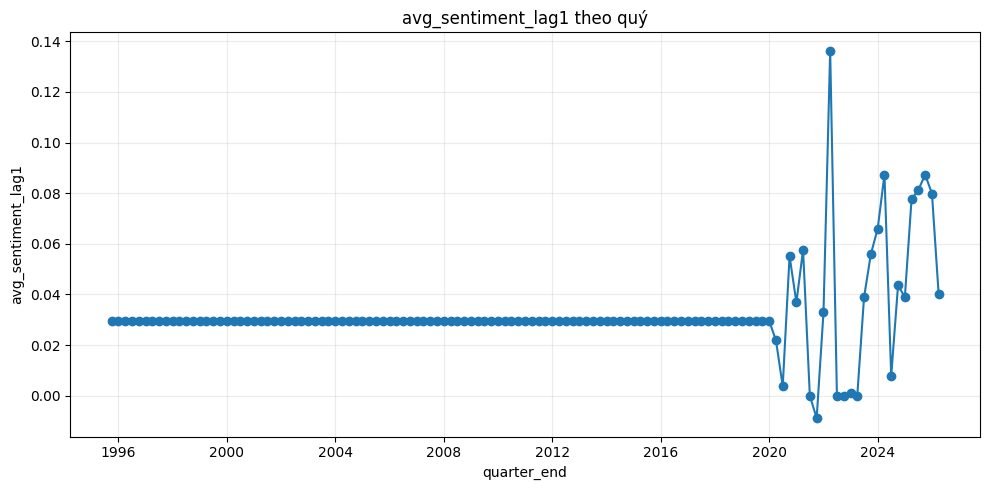

### Line plot: `avg_sentiment_lag4`

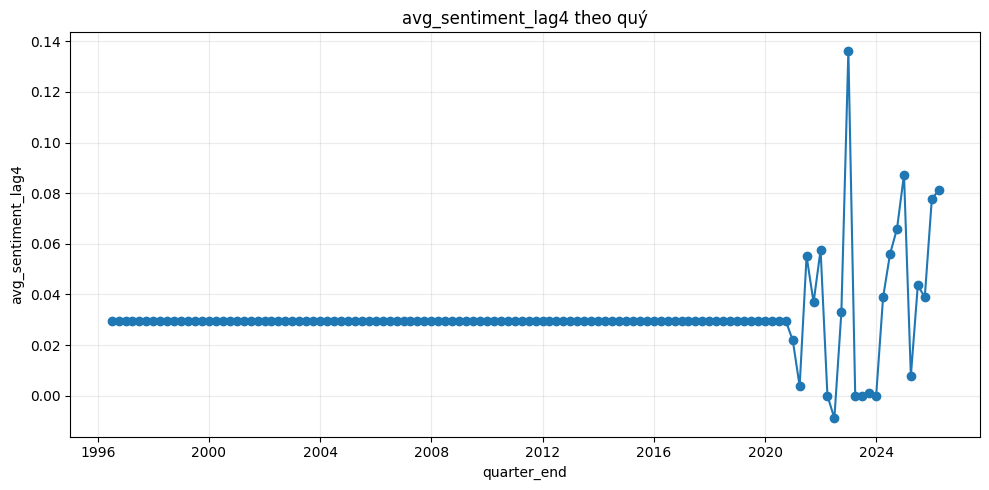

### Line plot: `avg_sentiment_diff1`

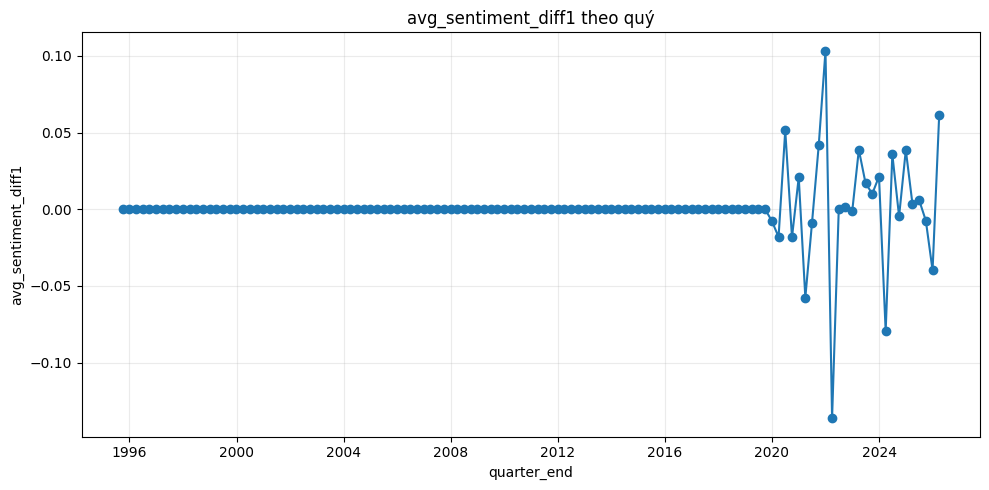

### Line plot: `avg_sentiment_diff4`

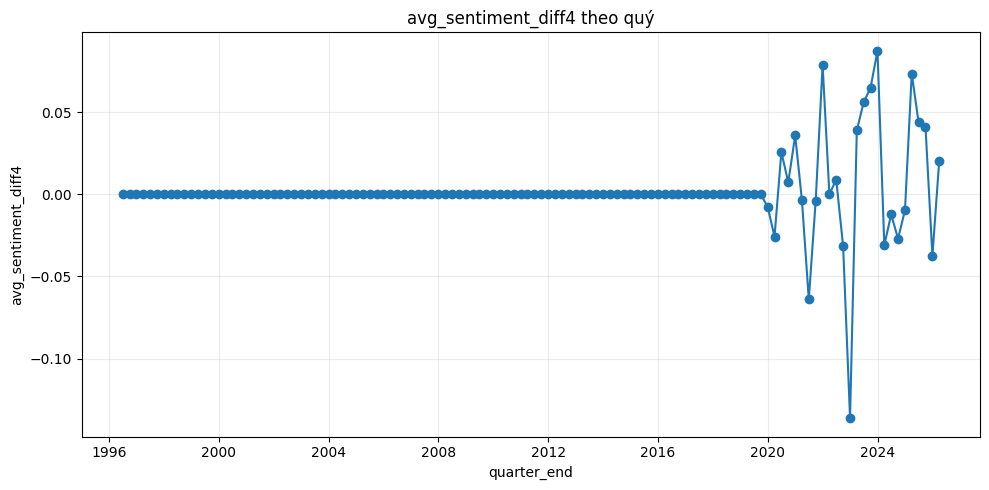

### Line plot: `median_sentiment_lag1`

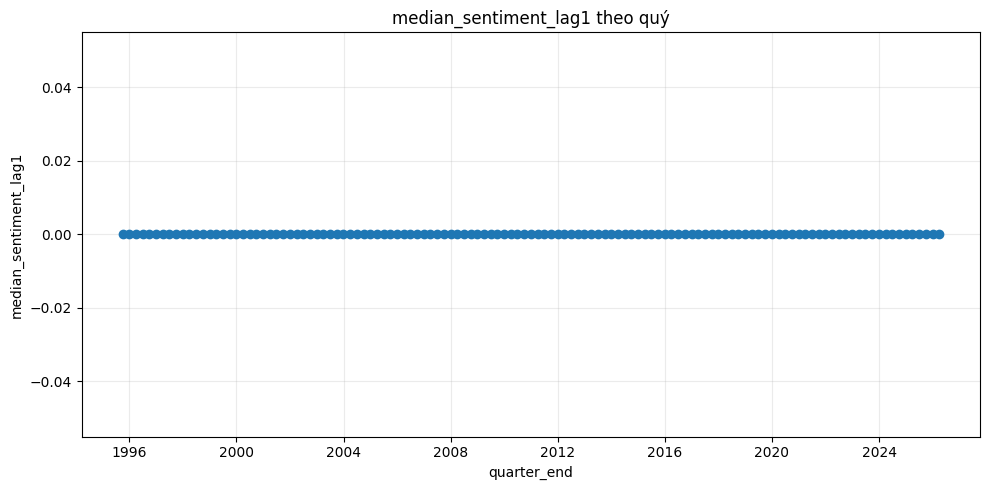

### Line plot: `median_sentiment_lag4`

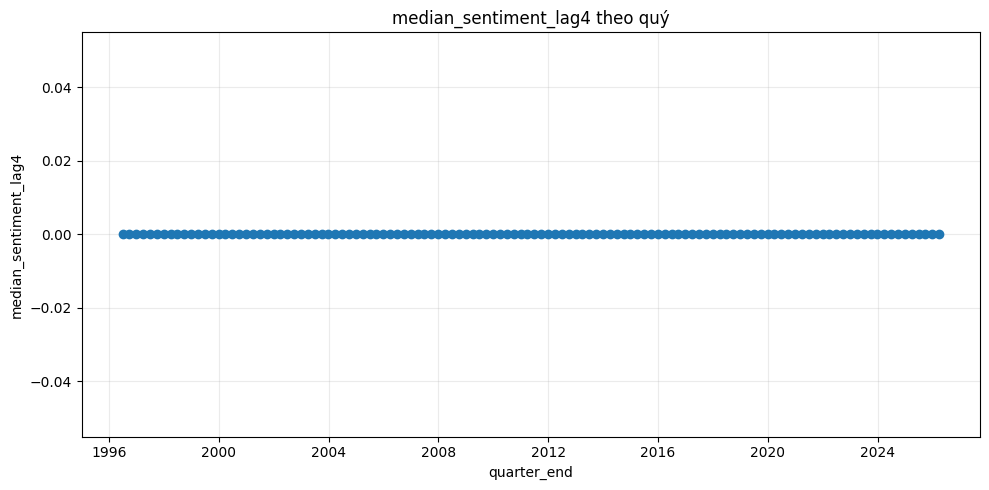

### Line plot: `median_sentiment_diff1`

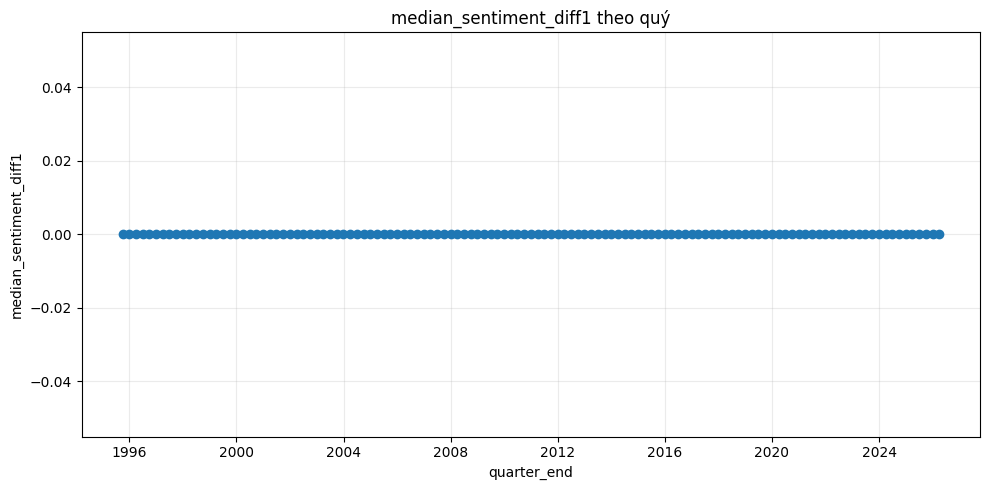

### Line plot: `median_sentiment_diff4`

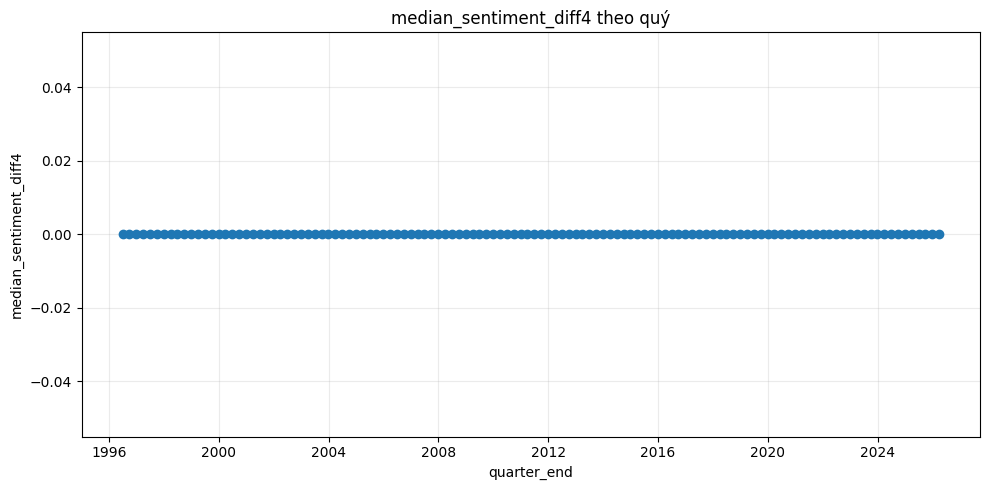

### Line plot: `std_sentiment_lag1`

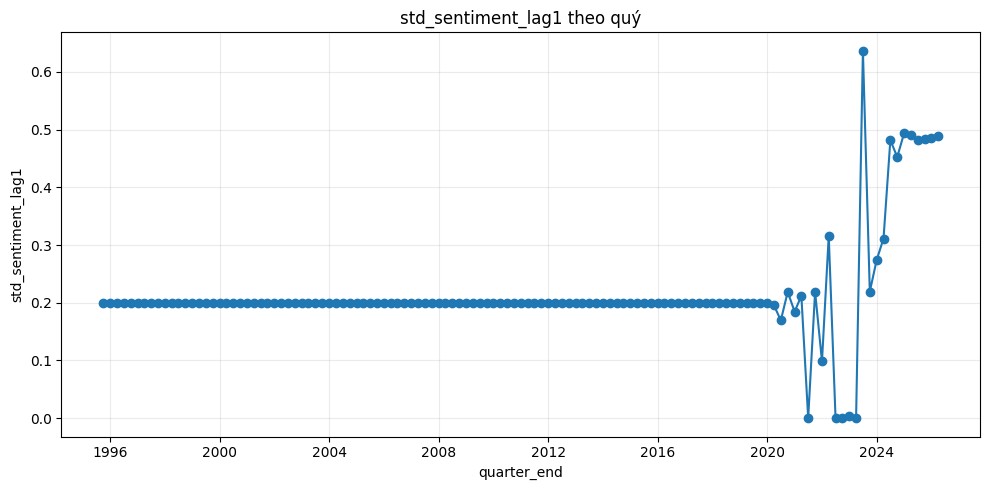

### Line plot: `std_sentiment_lag4`

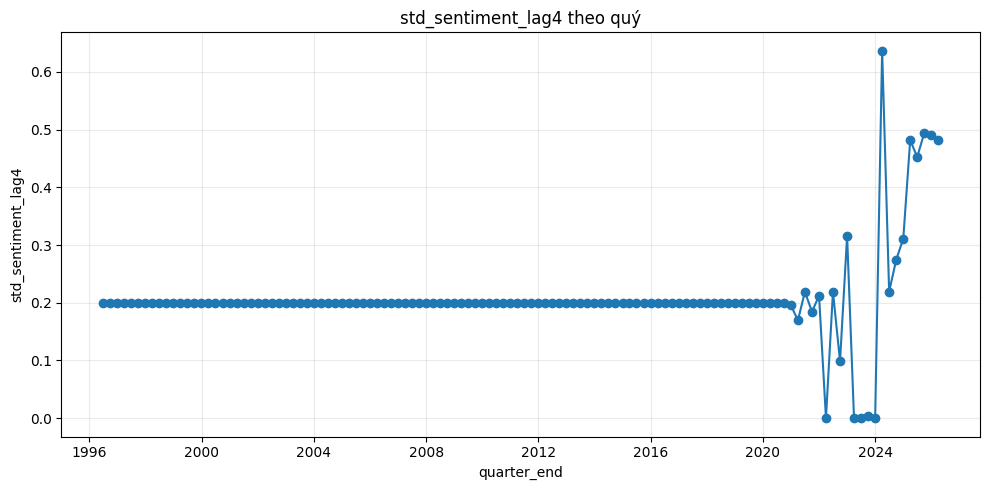

### Line plot: `std_sentiment_diff1`

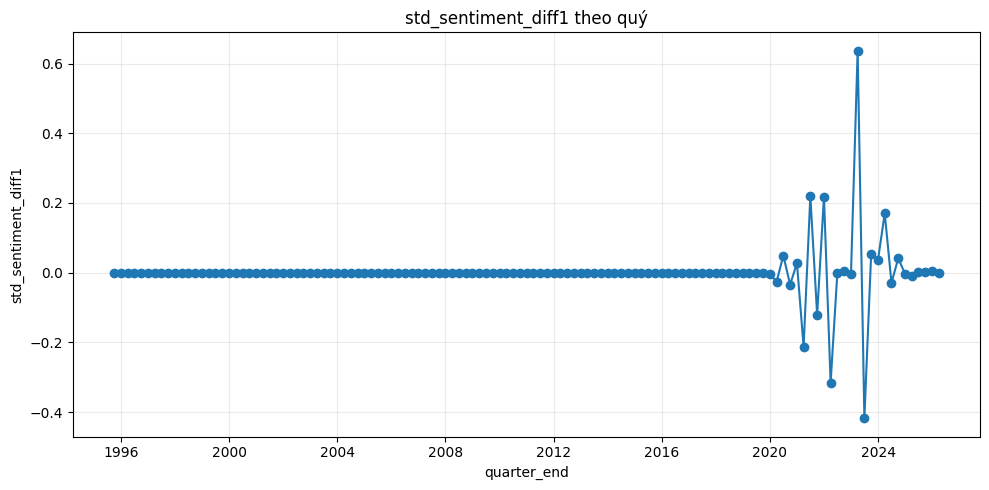

### Line plot: `std_sentiment_diff4`

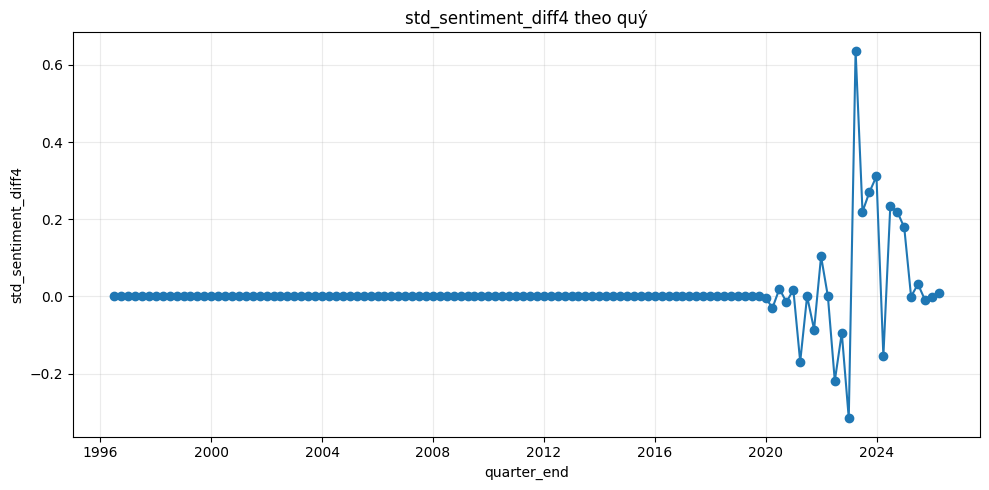

### Line plot: `positive_ratio_lag1`

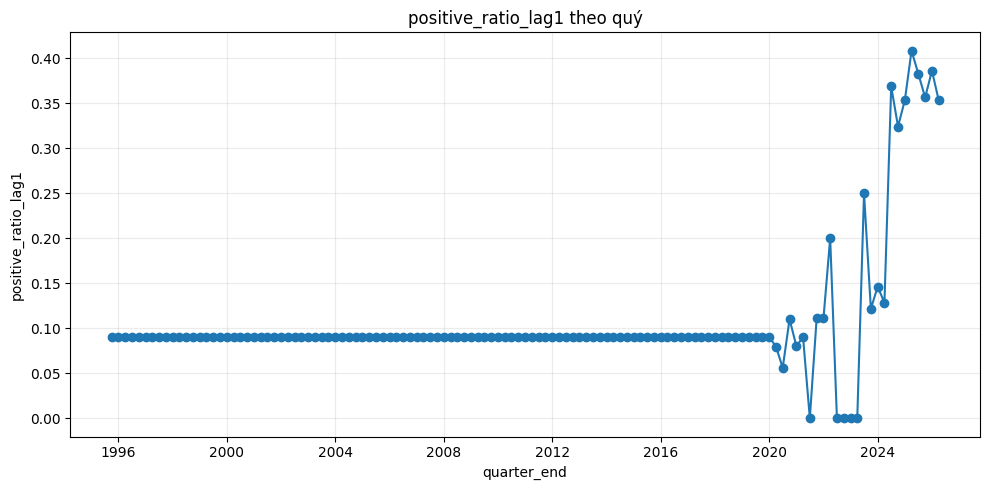

### Line plot: `positive_ratio_lag4`

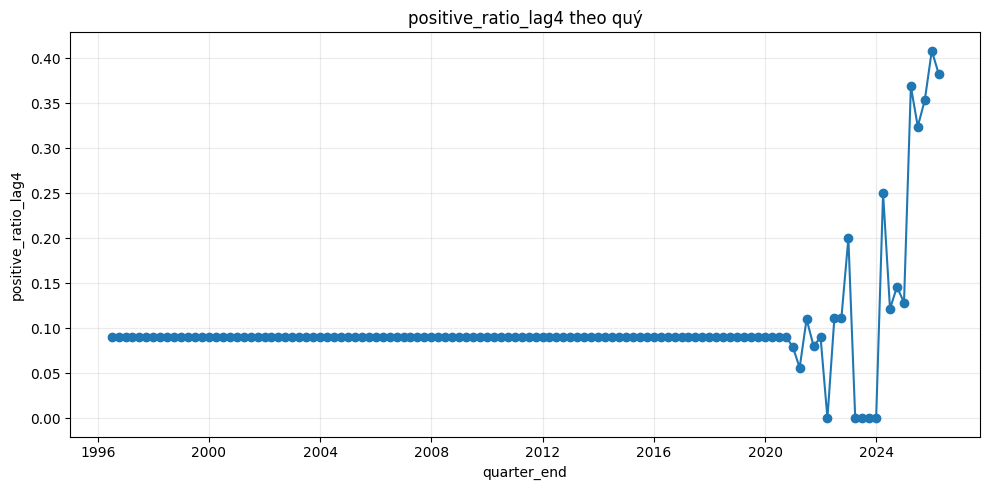

### Line plot: `positive_ratio_diff1`

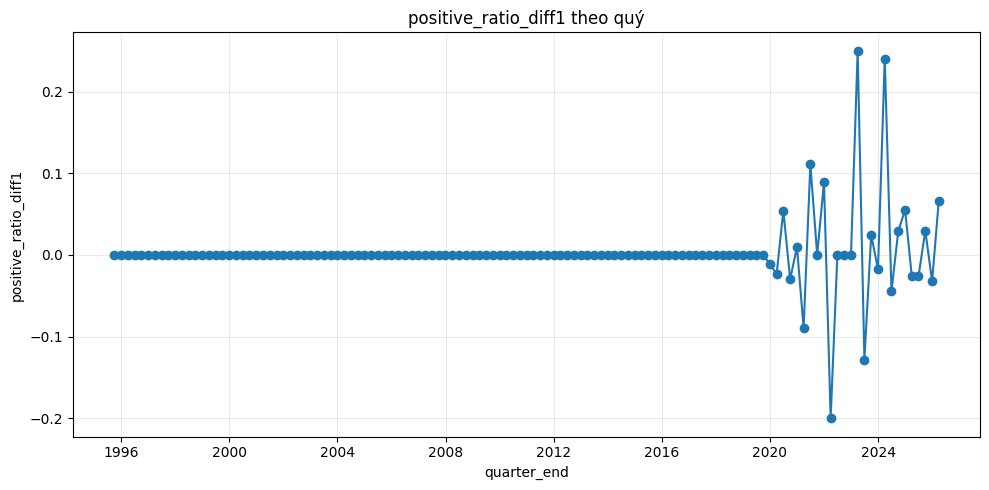

### Line plot: `positive_ratio_diff4`

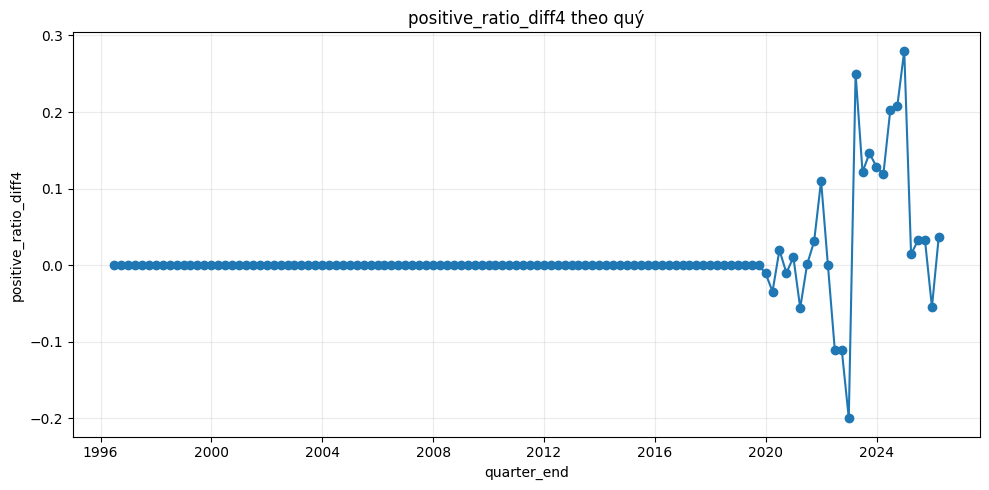

### Line plot: `negative_ratio_lag1`

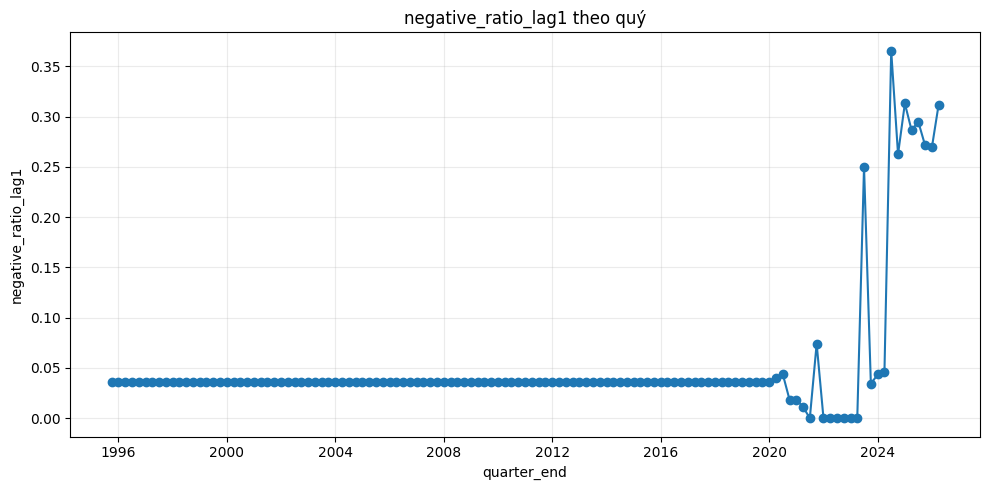

### Line plot: `negative_ratio_lag4`

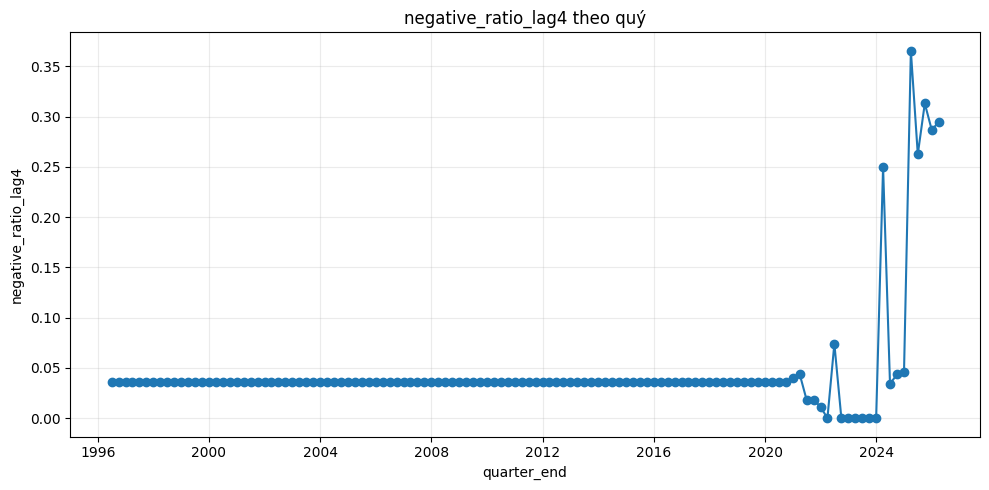

### Line plot: `negative_ratio_diff1`

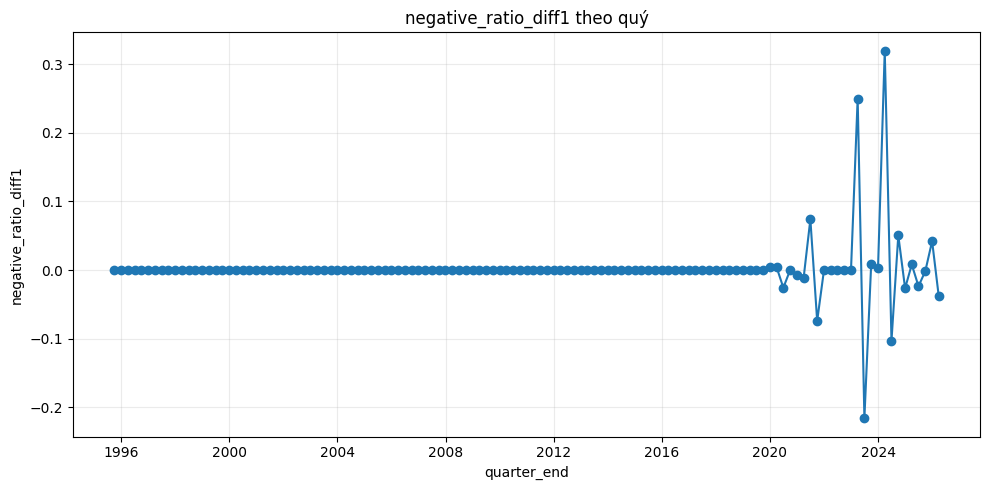

### Line plot: `negative_ratio_diff4`

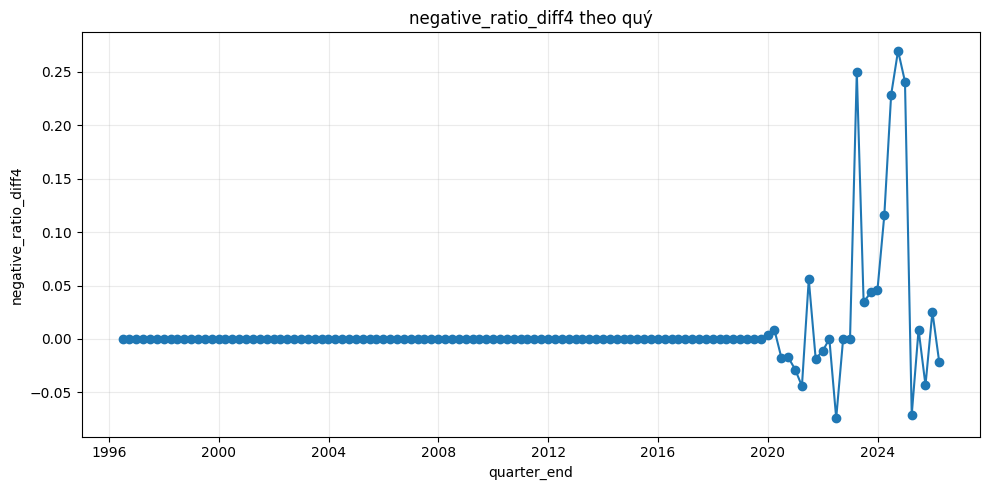

### Line plot: `neutral_ratio_lag1`

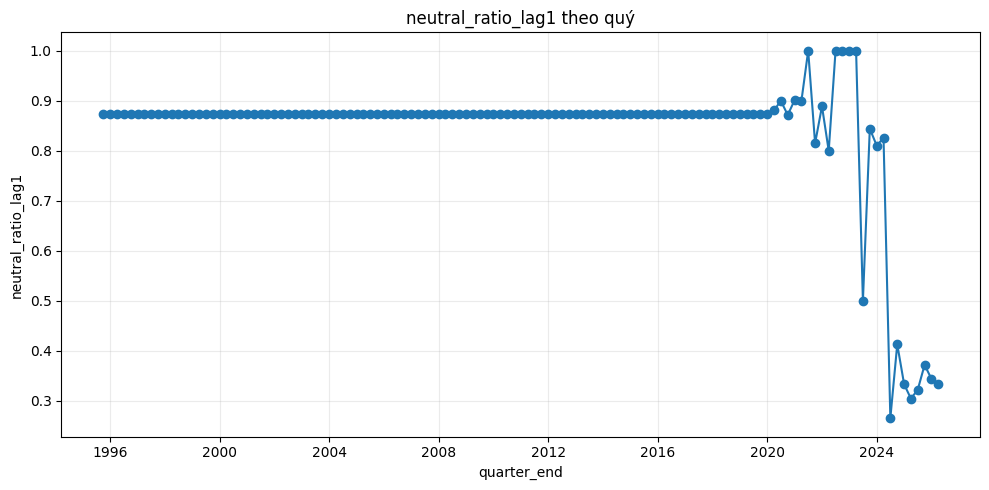

### Line plot: `neutral_ratio_lag4`

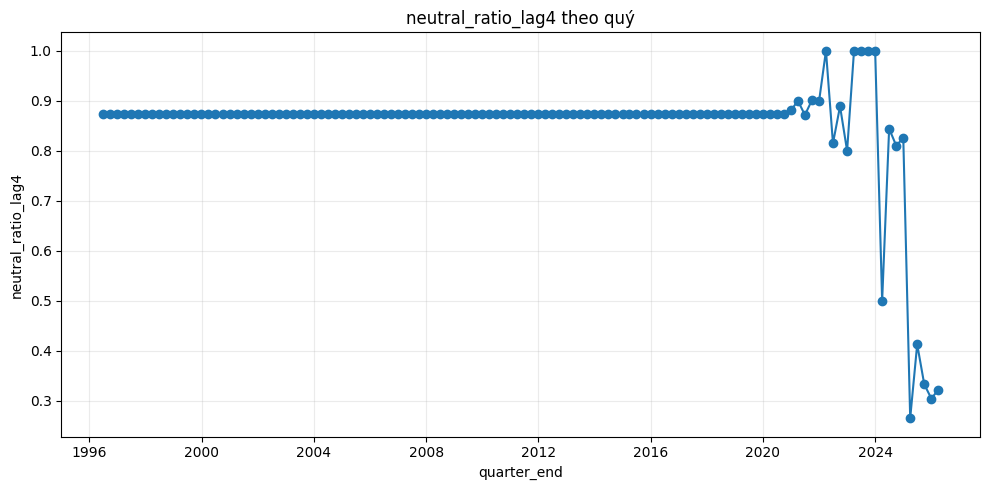

### Line plot: `neutral_ratio_diff1`

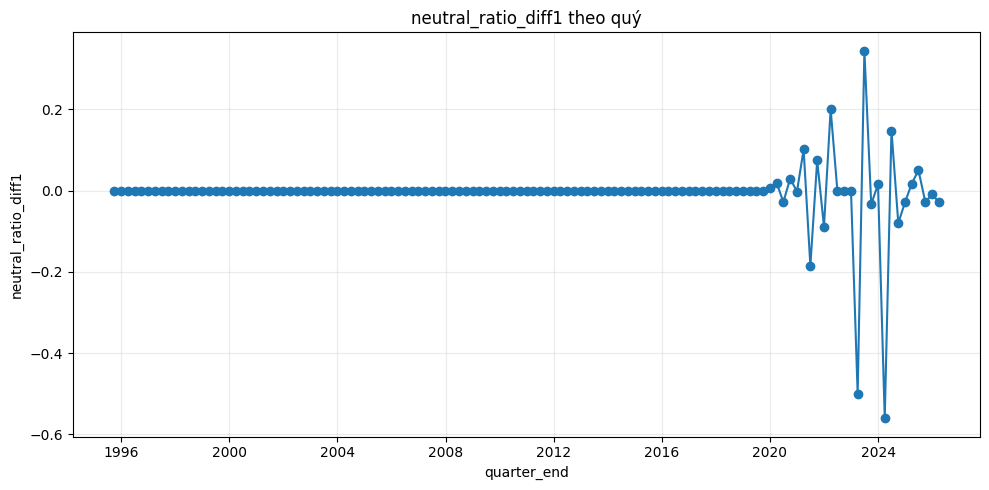

### Line plot: `neutral_ratio_diff4`

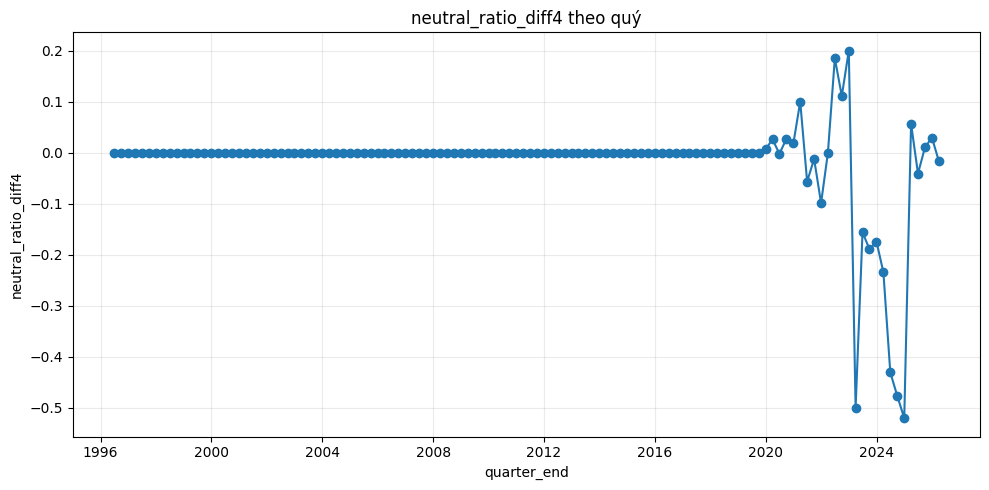

### Line plot: `neutral_ratio_qoq_pct`

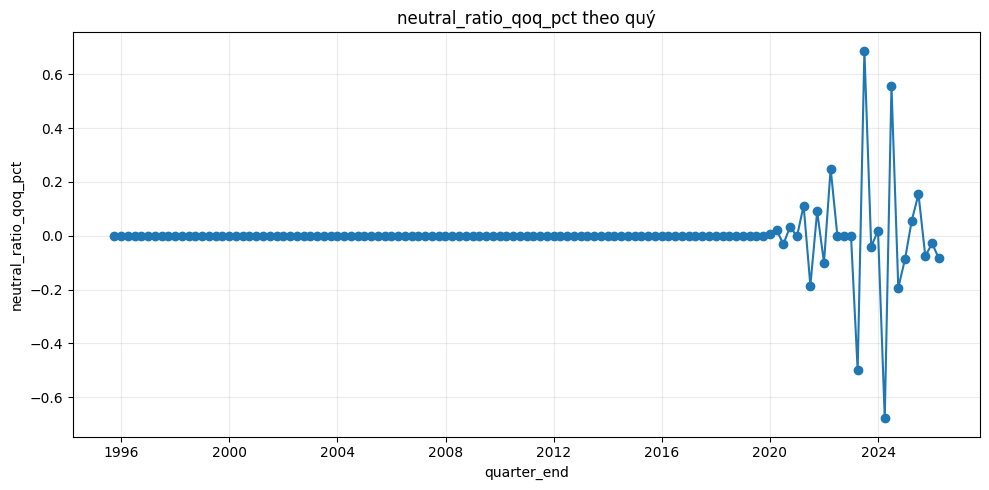

### Line plot: `neutral_ratio_yoy_pct`

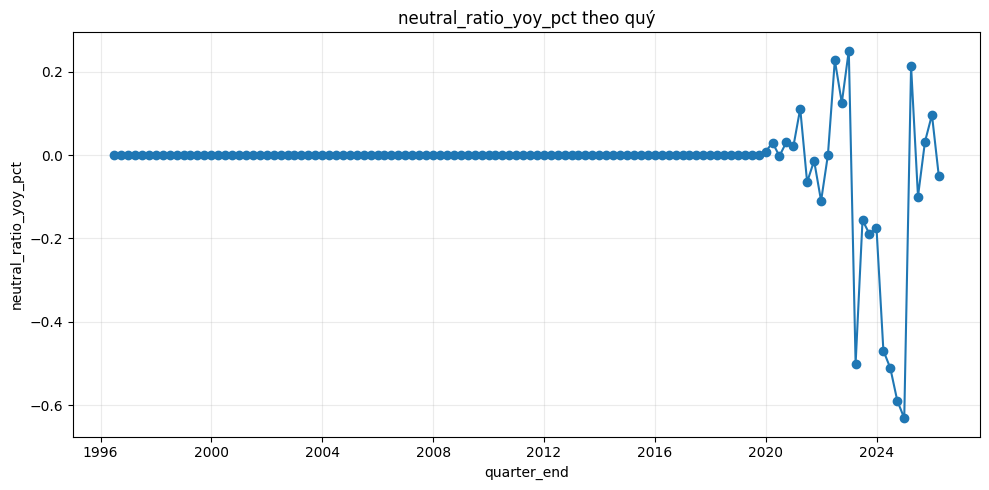

### Line plot: `net_sentiment_lag1`

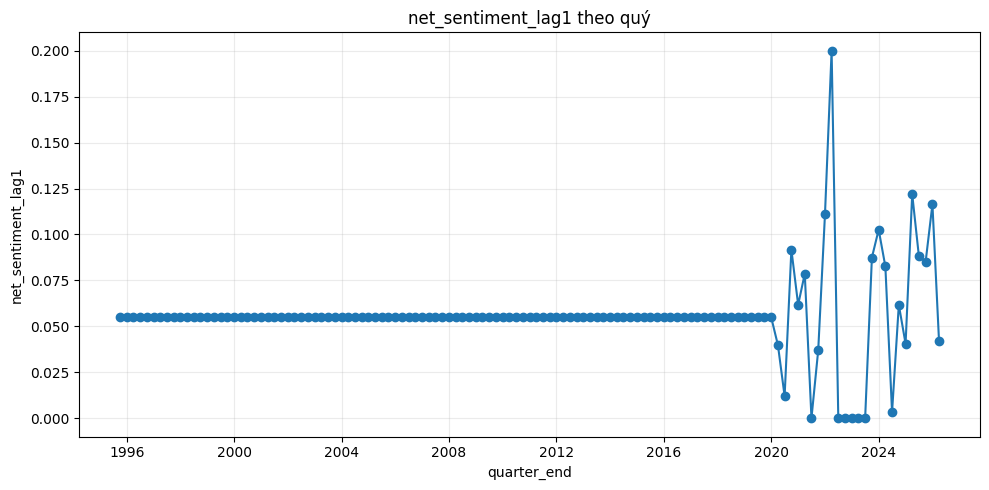

### Line plot: `net_sentiment_lag4`

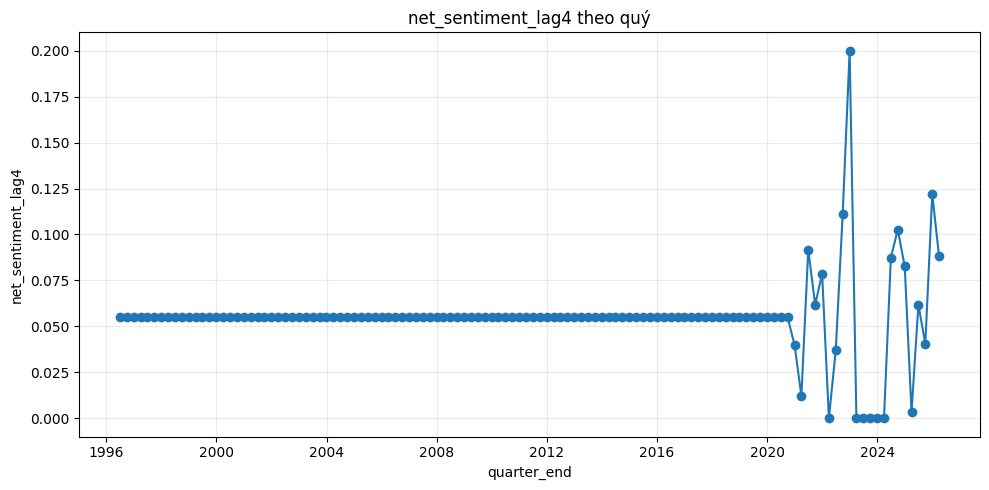

### Line plot: `net_sentiment_diff1`

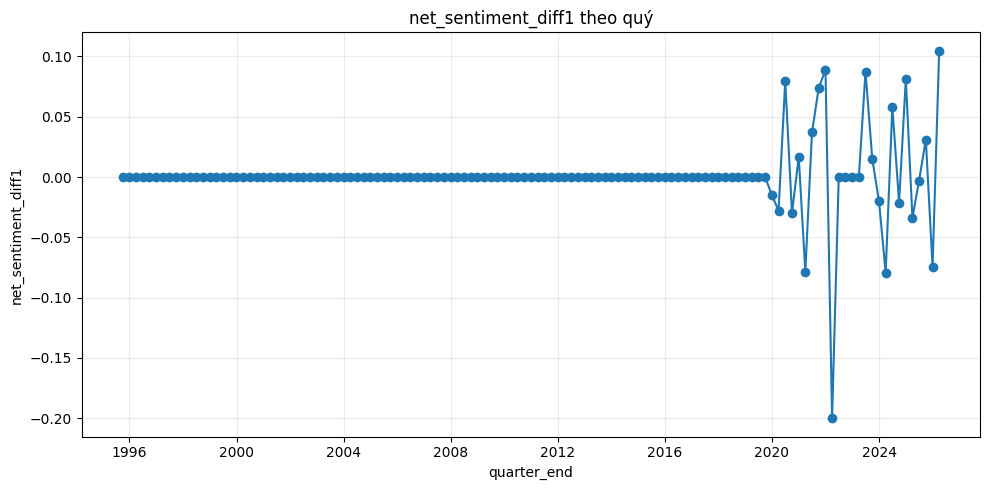

### Line plot: `net_sentiment_diff4`

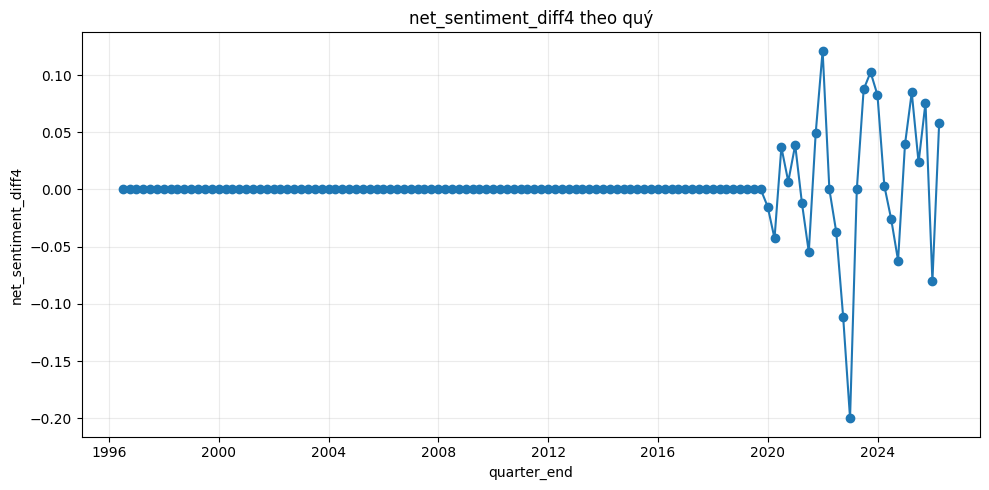

### Line plot: `weighted_sentiment_like_lag1`

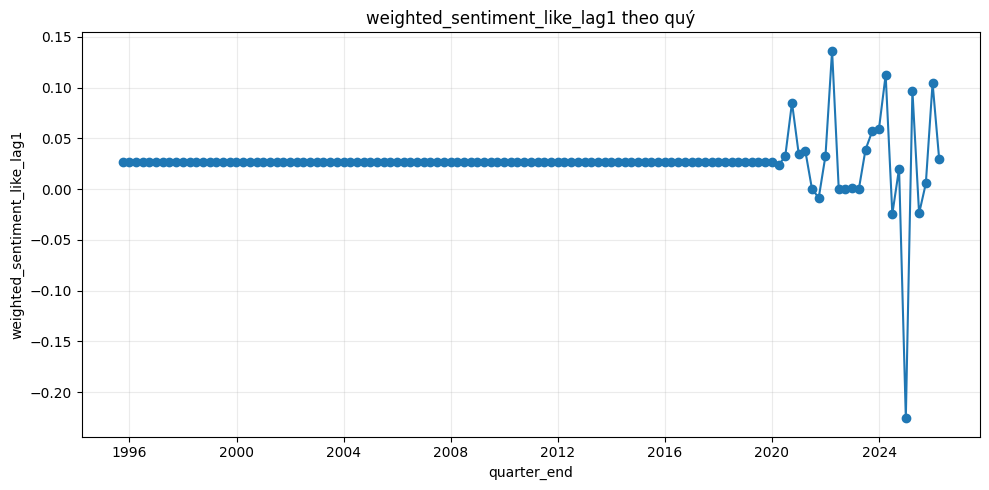

### Line plot: `weighted_sentiment_like_lag4`

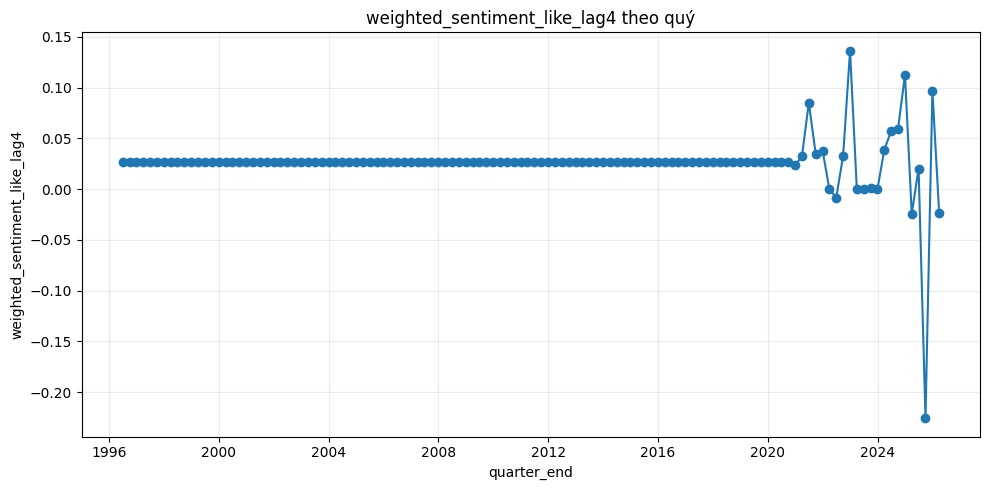

### Line plot: `weighted_sentiment_like_diff1`

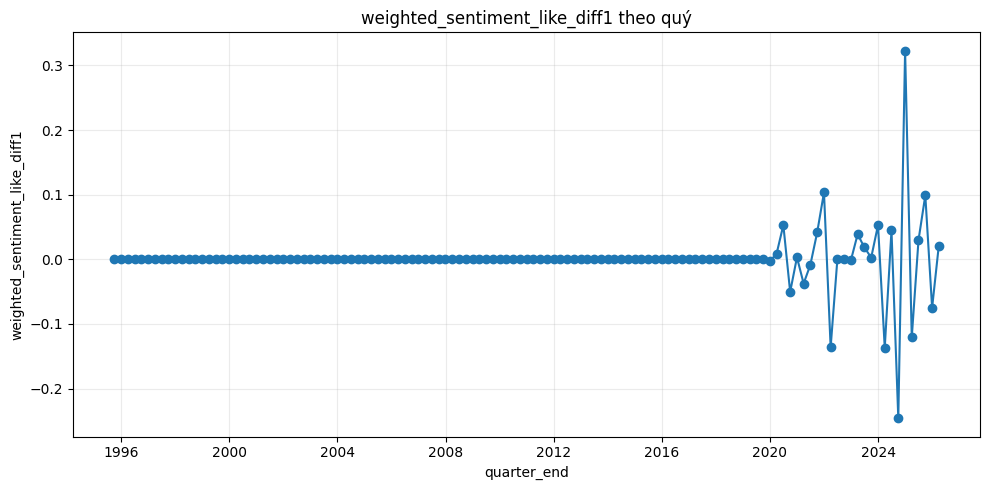

### Line plot: `weighted_sentiment_like_diff4`

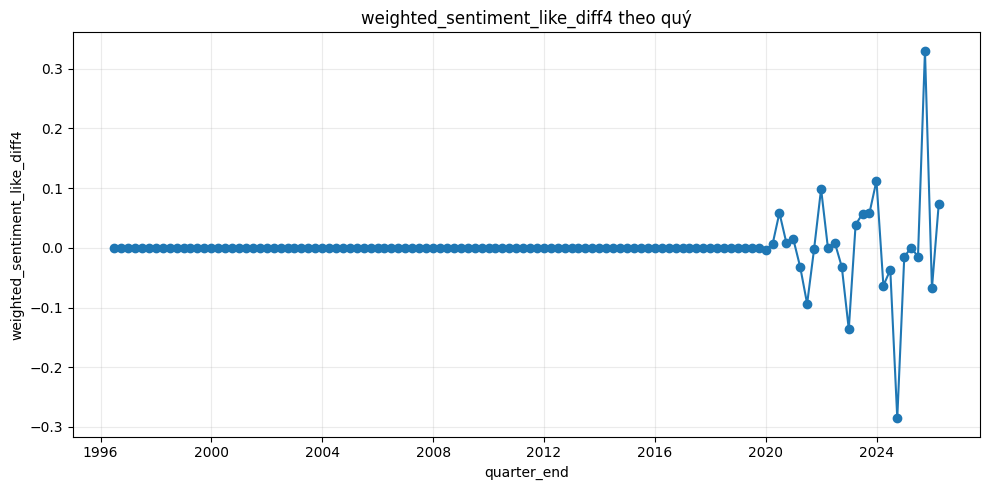

### Line plot: `p10_sentiment_lag1`

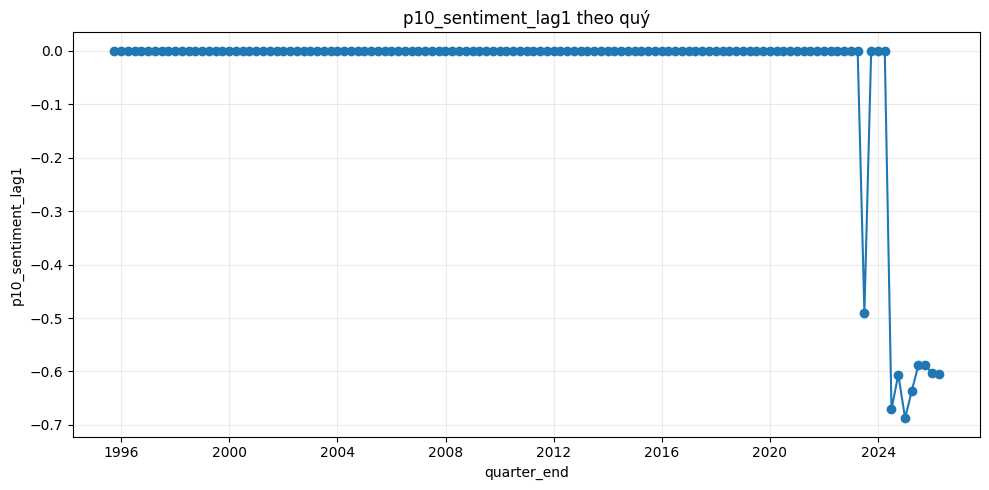

### Line plot: `p10_sentiment_lag4`

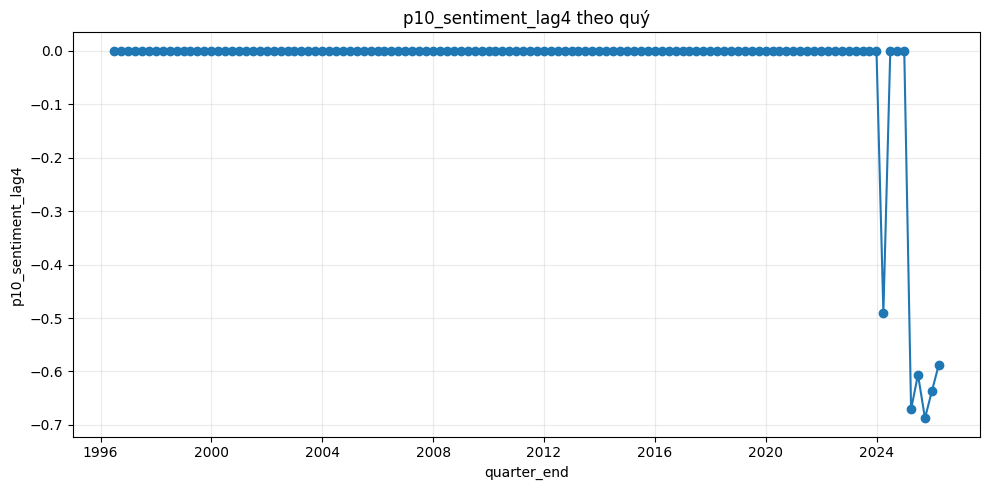

### Line plot: `p10_sentiment_diff1`

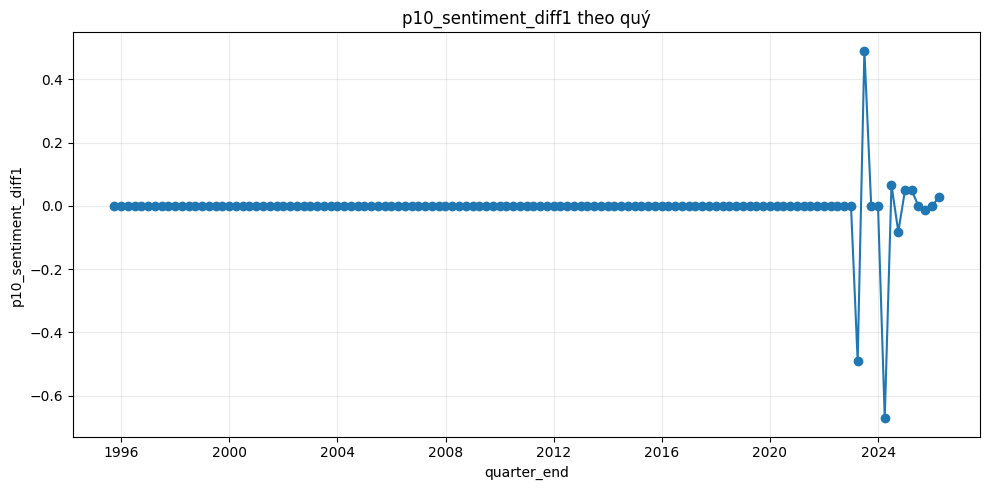

### Line plot: `p10_sentiment_diff4`

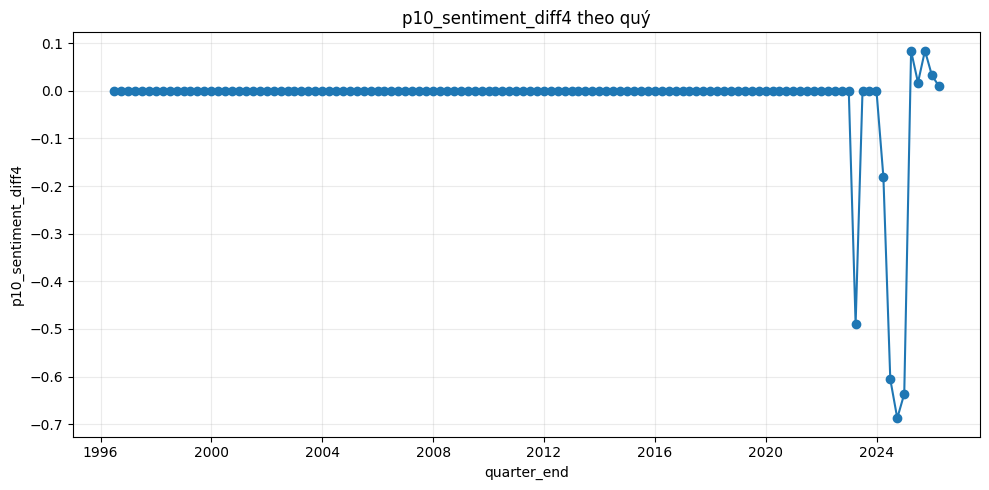

### Line plot: `p90_sentiment_lag1`

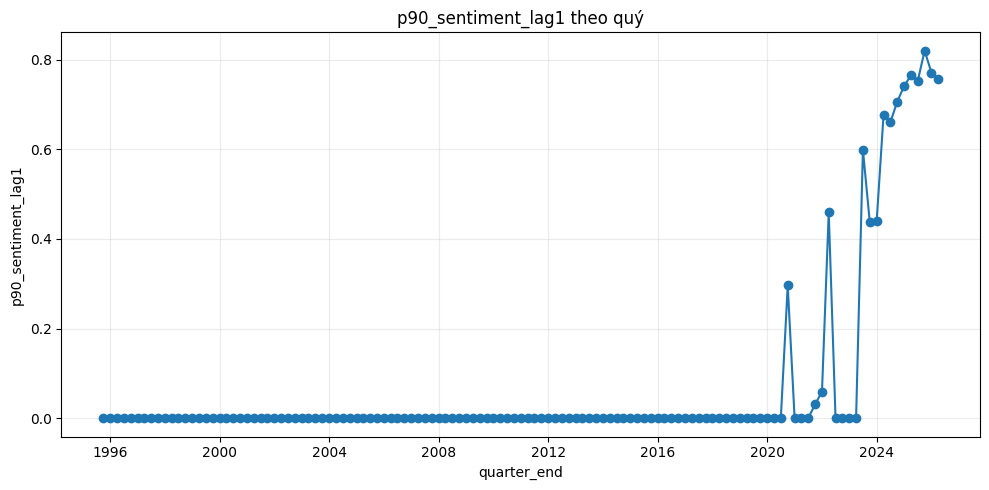

### Line plot: `p90_sentiment_lag4`

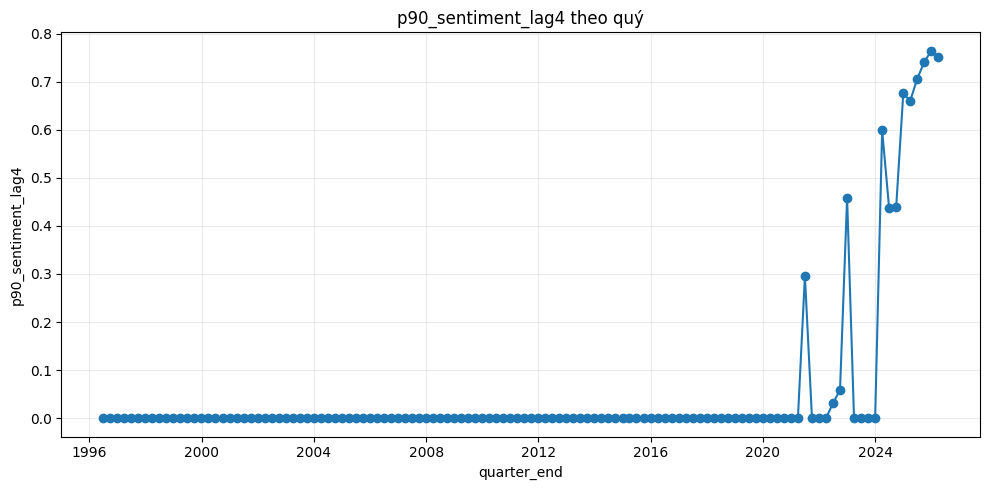

### Line plot: `p90_sentiment_diff1`

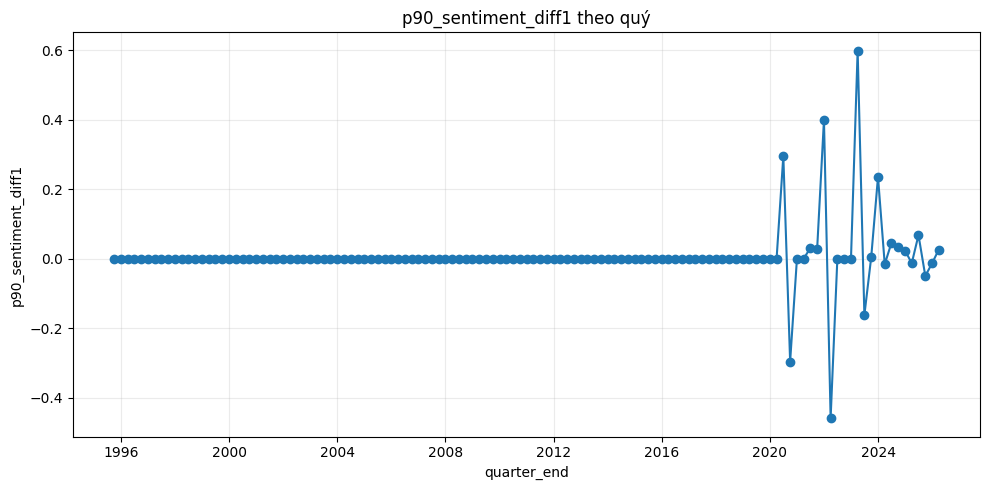

### Line plot: `p90_sentiment_diff4`

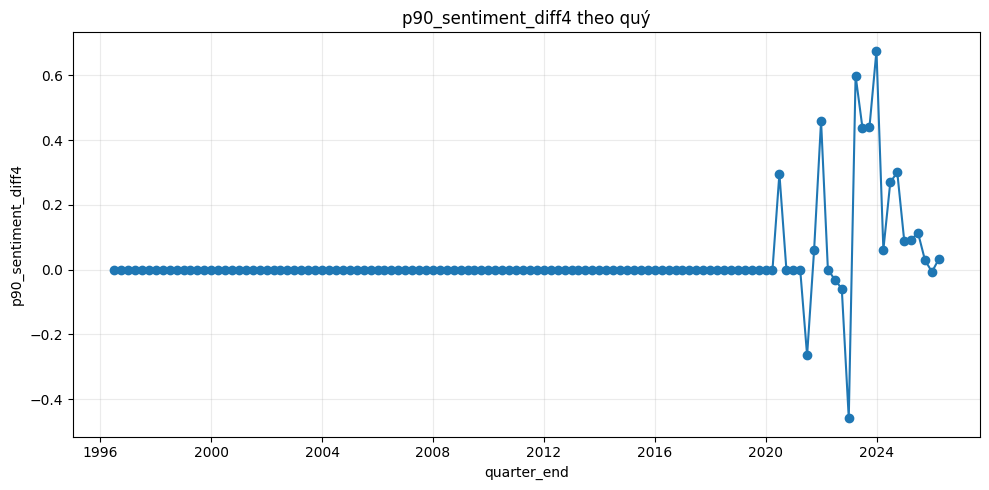

### Line plot: `z_gdp_raw`

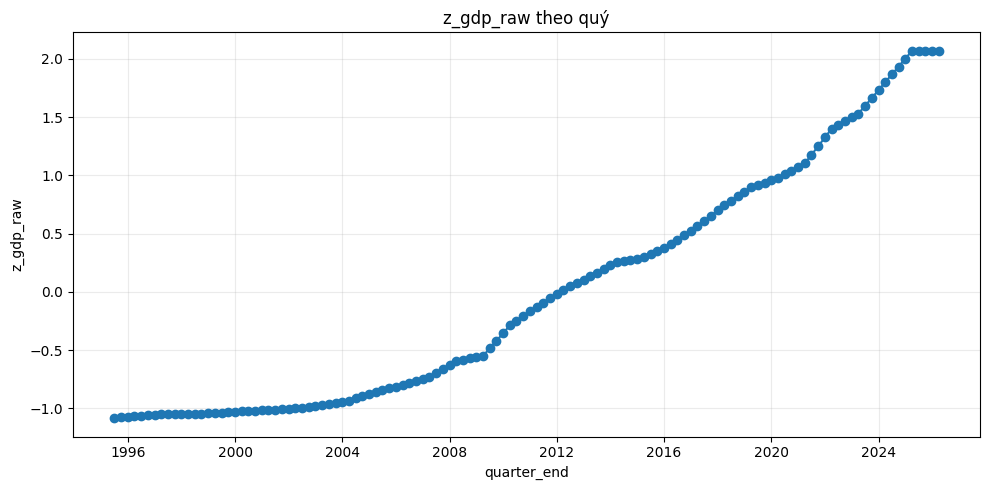

### Line plot: `z_inflation`

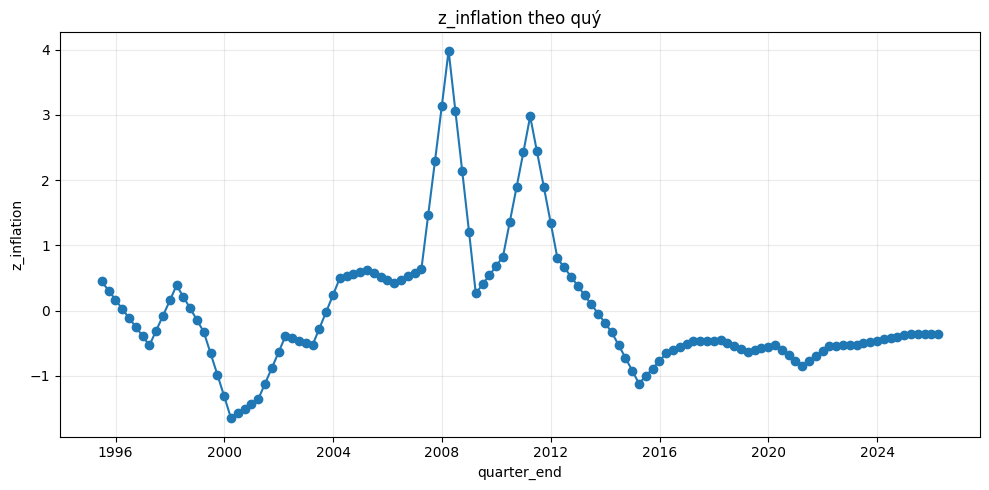

### Line plot: `z_interest_rate`

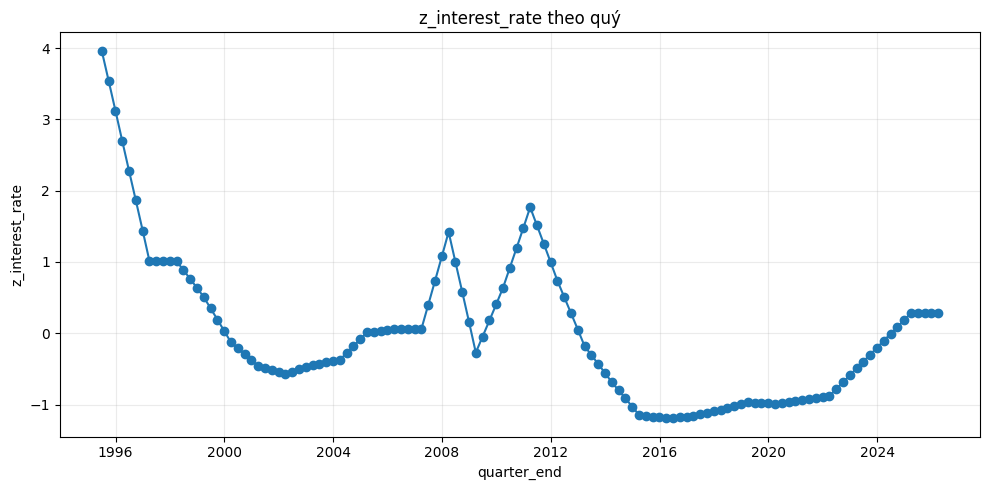

### Line plot: `z_fdi_pct_gdp`

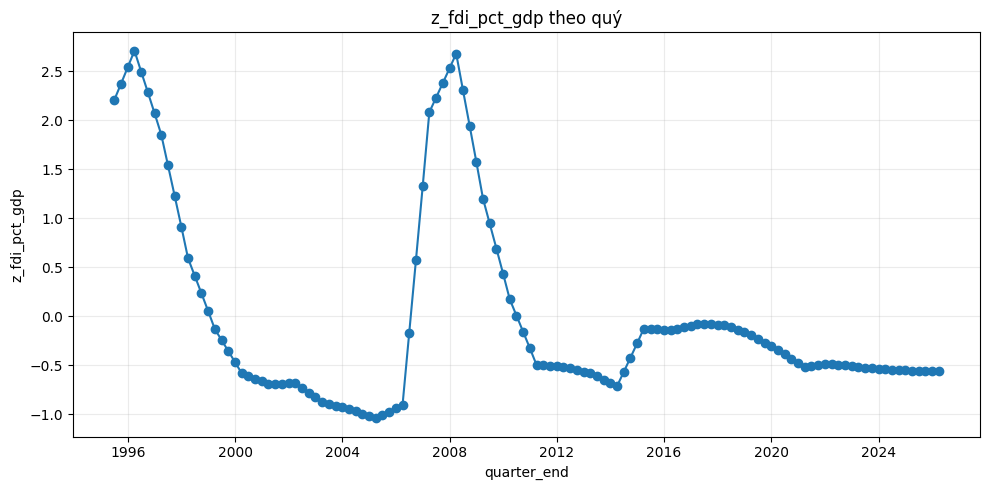

### Line plot: `z_investment_pct_gdp`

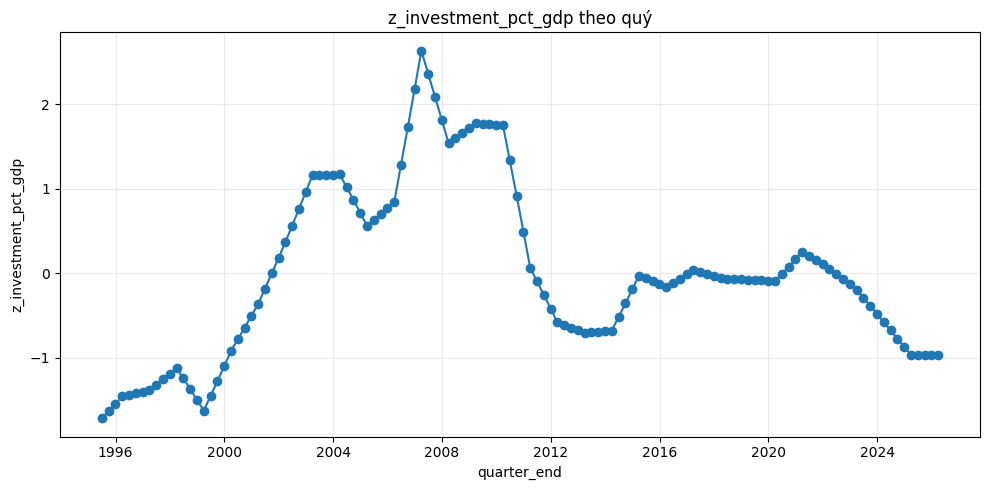

### Line plot: `z_export_pct_gdp`

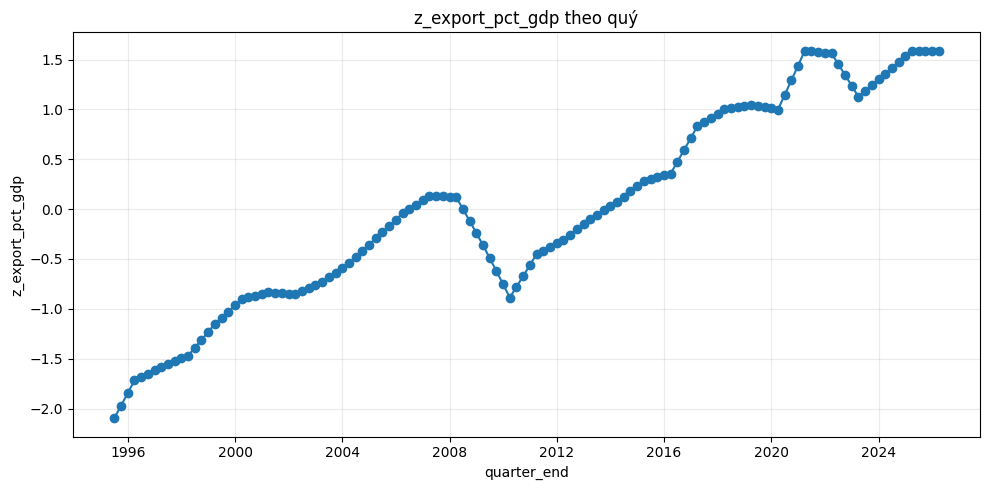

### Line plot: `z_unemployment_rate`

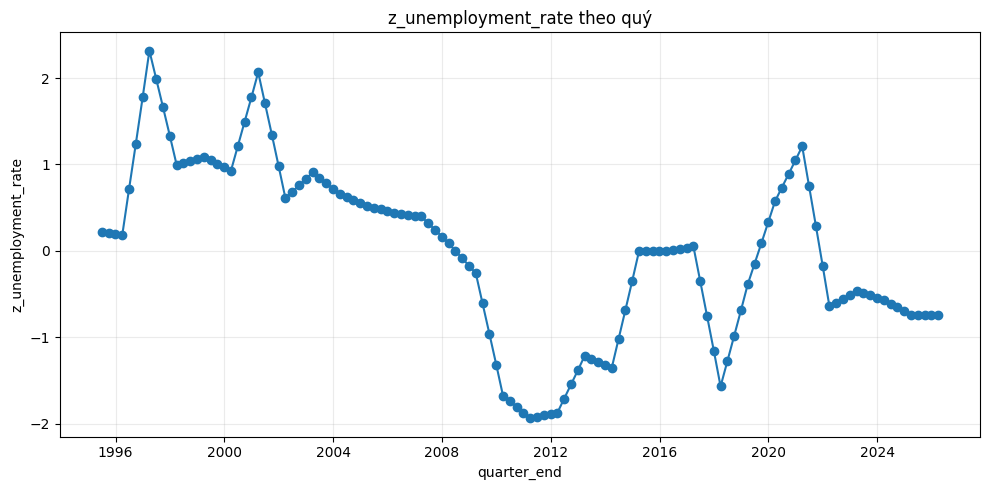

### Line plot: `z_gov_spending_pct_gdp`

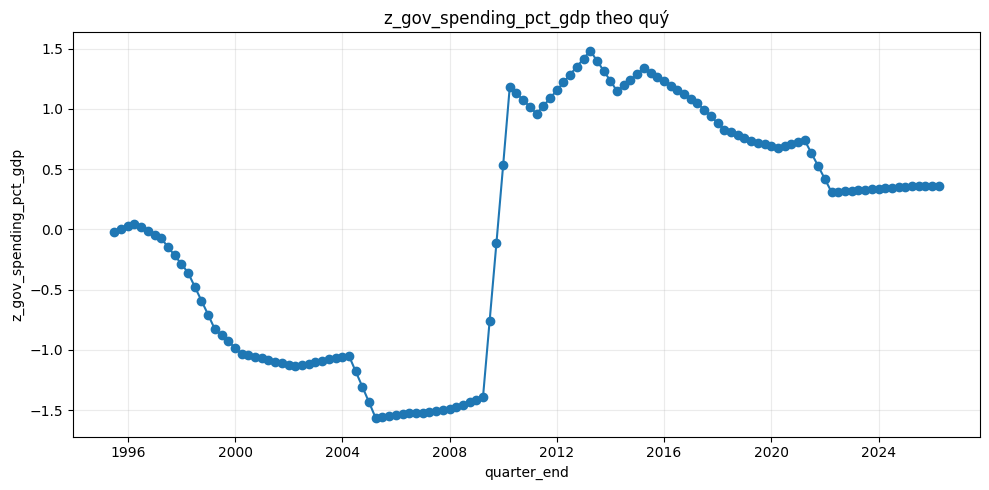

### Line plot: `z_log_gdp_raw`

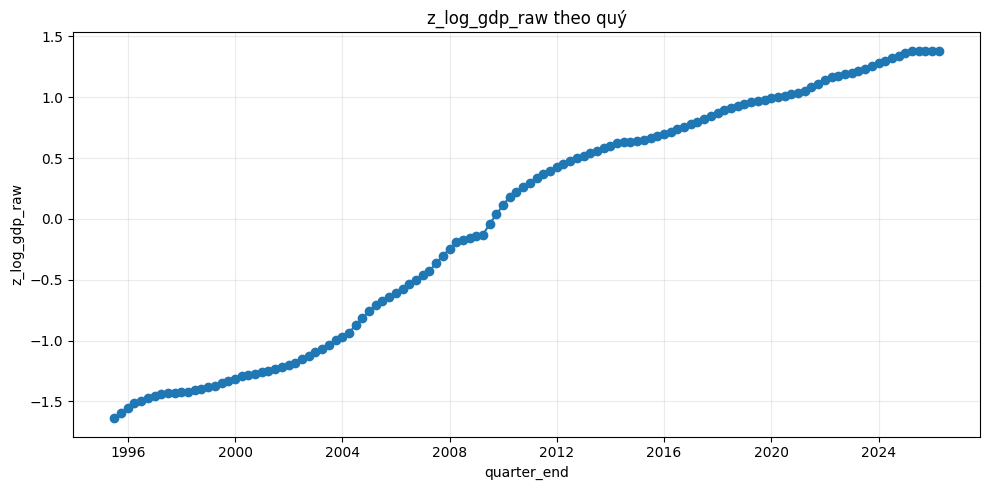

### Line plot: `z_log_fdi_pct_gdp`

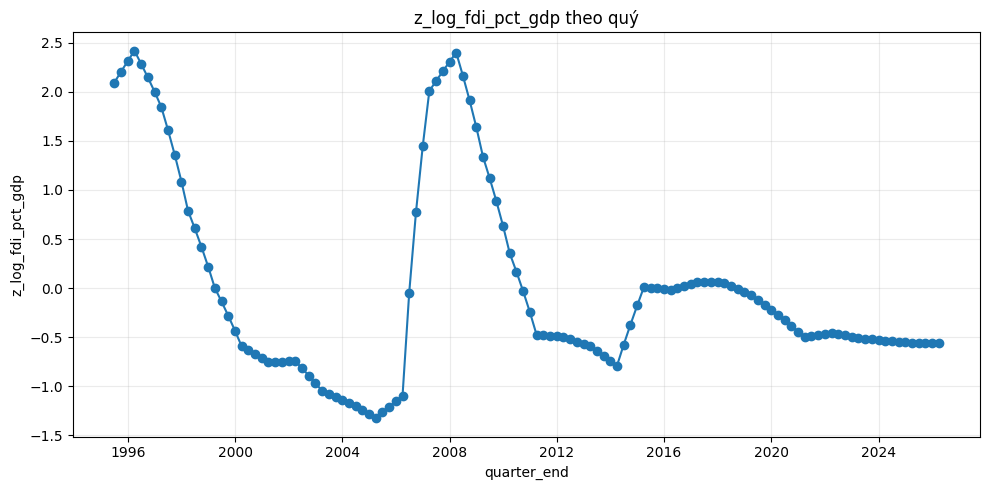

### Line plot: `z_log_investment_pct_gdp`

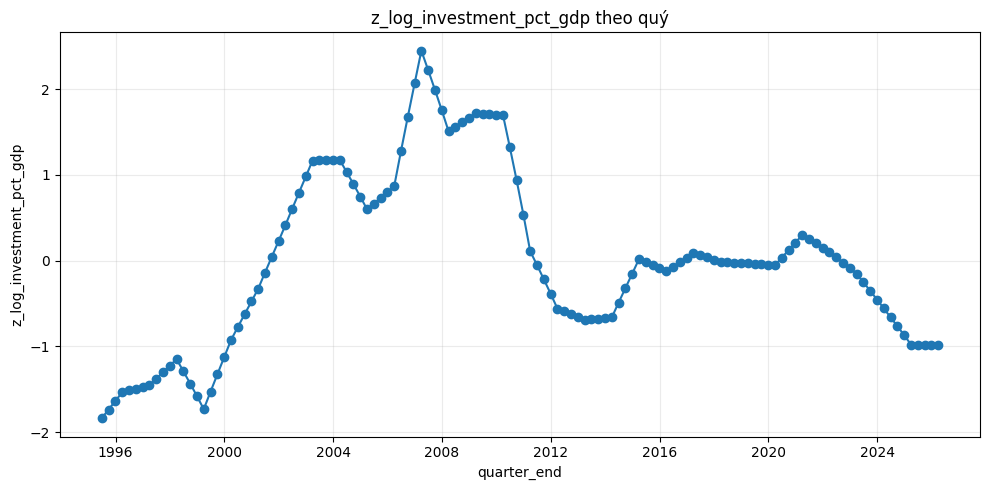

### Line plot: `z_log_export_pct_gdp`

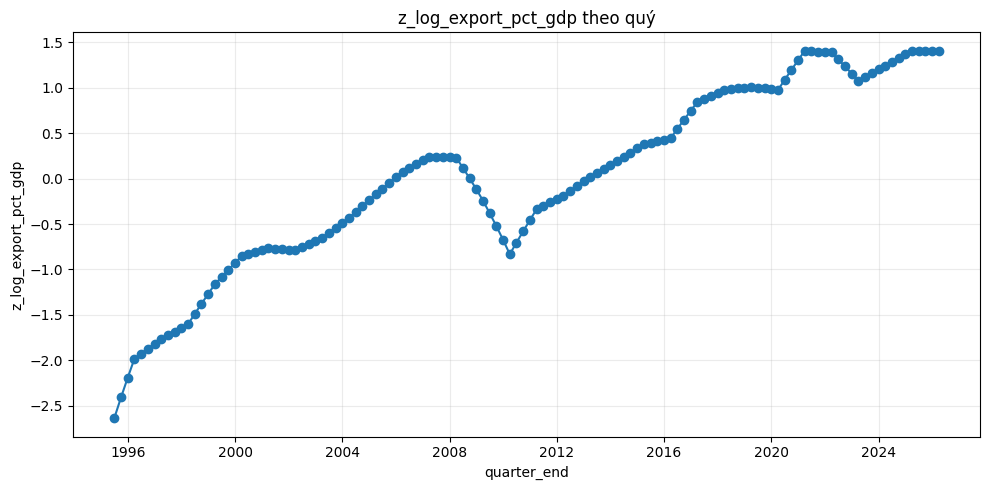

### Line plot: `z_log_gov_spending_pct_gdp`

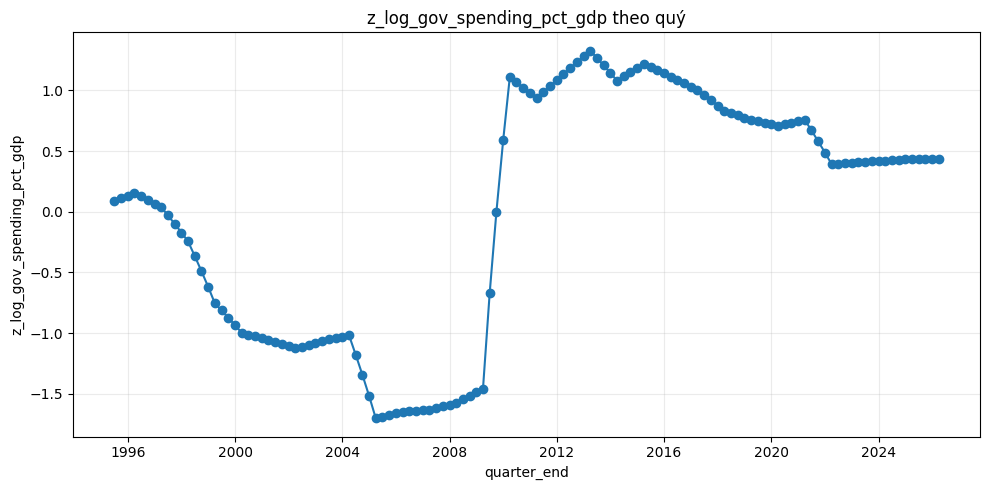

### Line plot: `z_real_interest_rate`

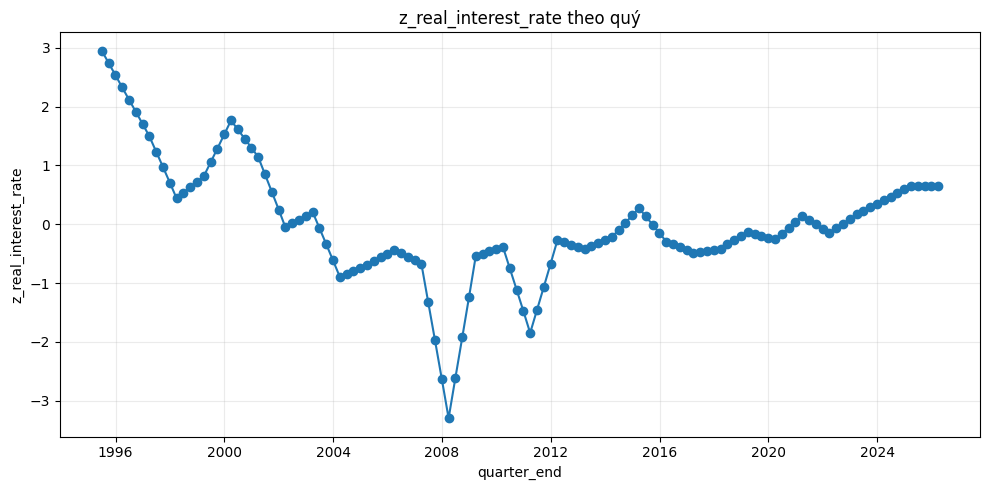

### Line plot: `z_n_comments`

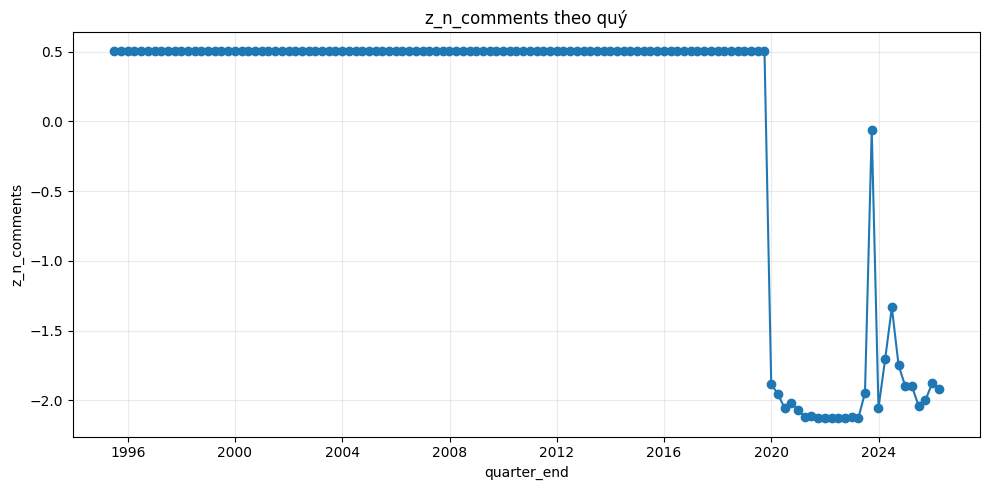

### Line plot: `z_n_unique_authors`

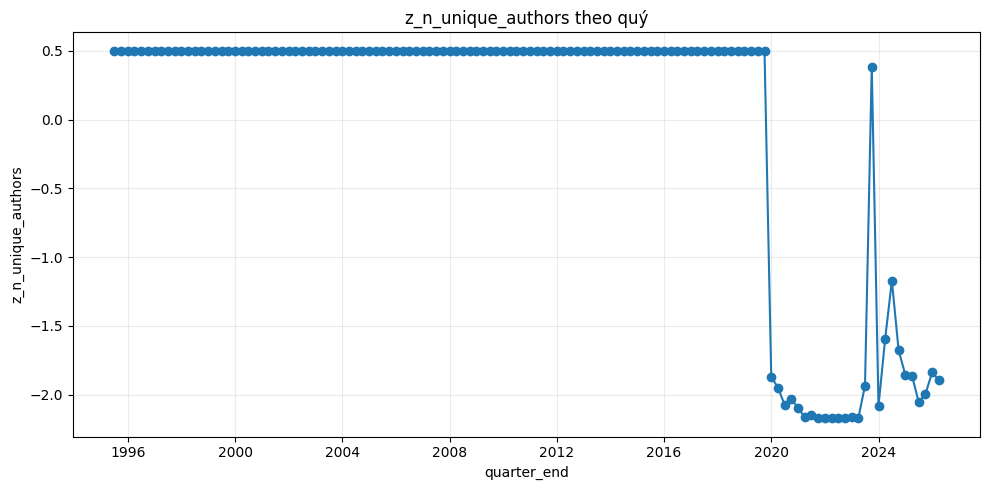

### Line plot: `z_like_sum`

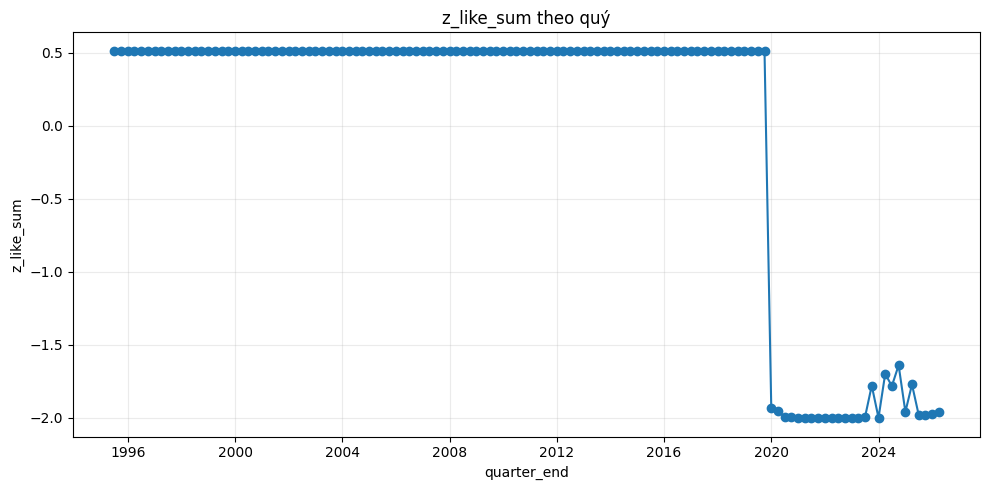

### Line plot: `z_like_mean`

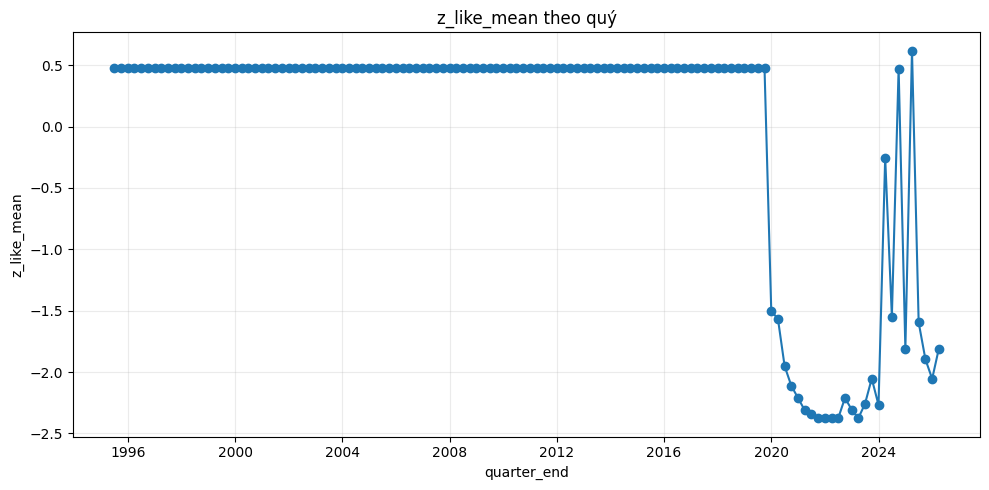

### Line plot: `z_avg_sentiment`

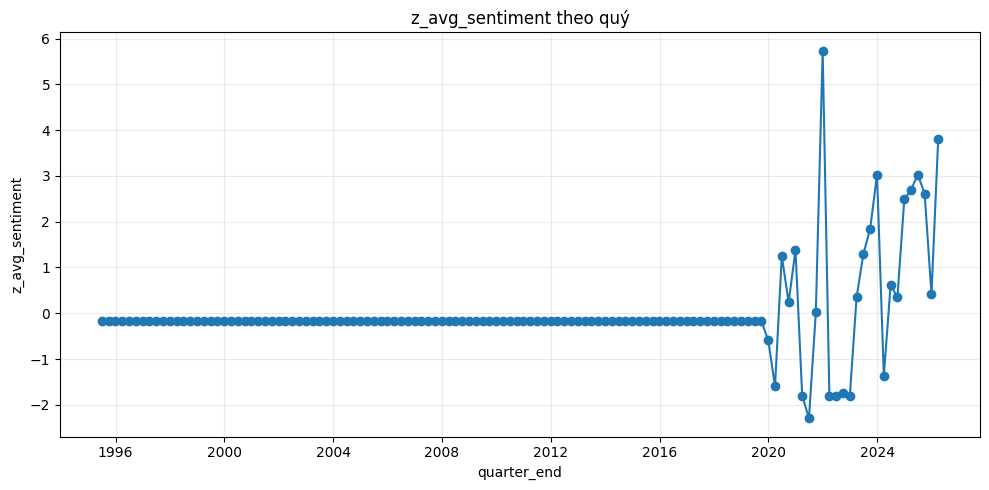

### Line plot: `z_median_sentiment`

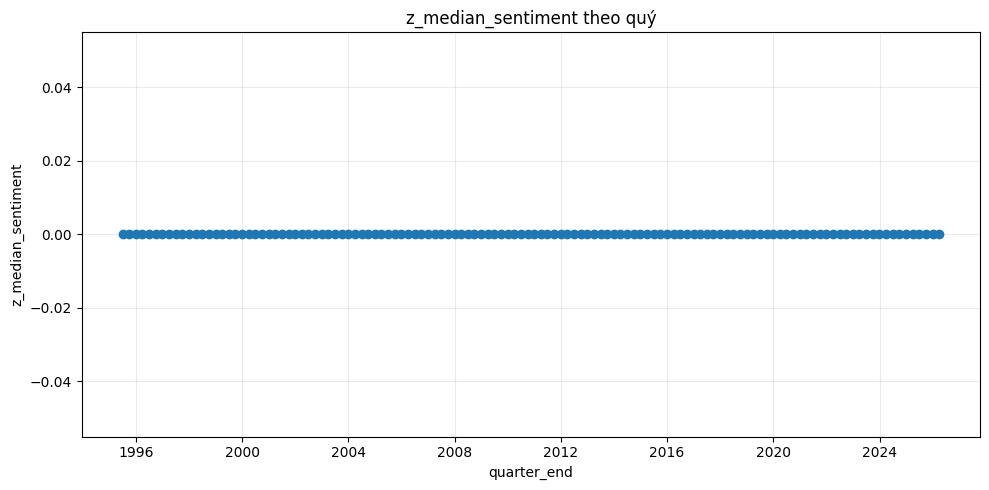

### Line plot: `z_std_sentiment`

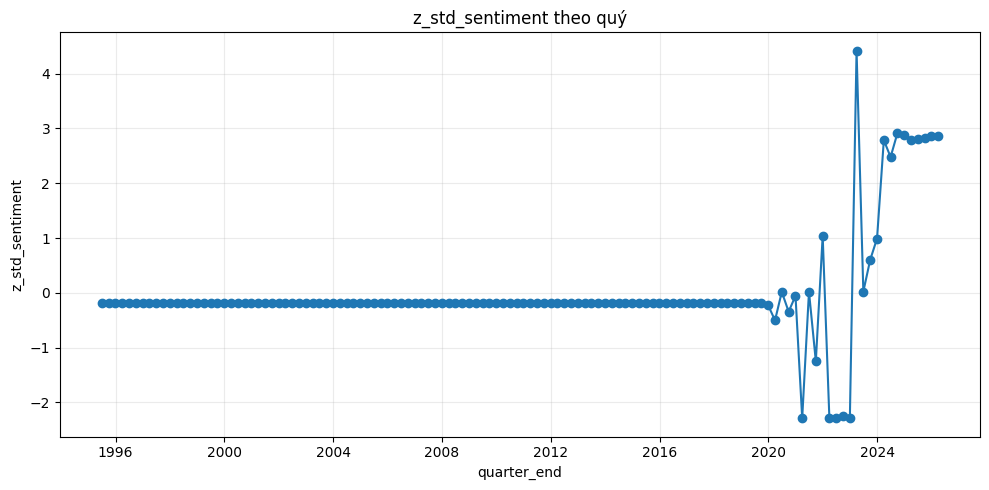

### Line plot: `z_positive_ratio`

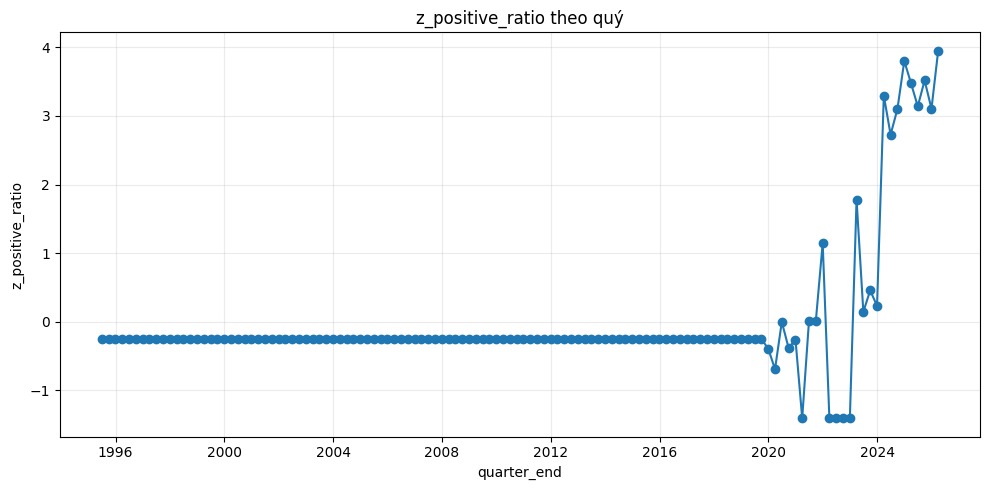

### Line plot: `z_negative_ratio`

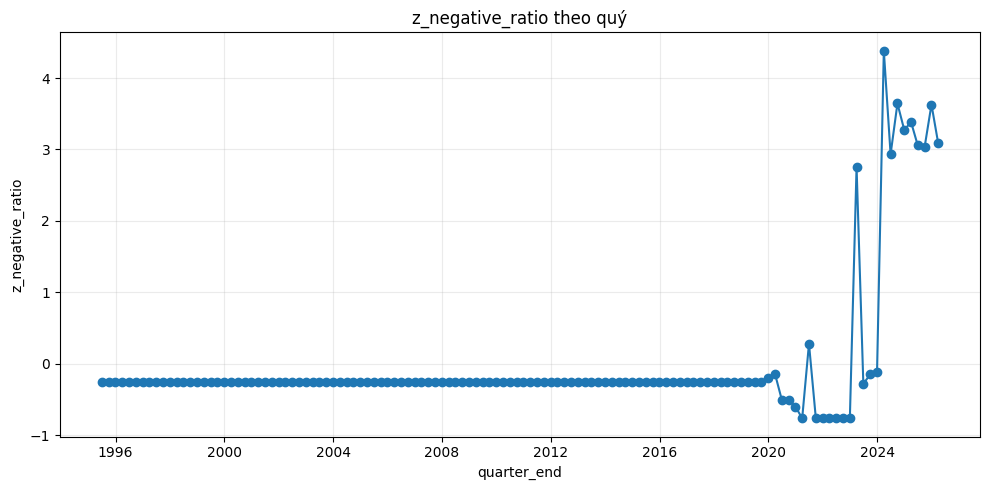

### Line plot: `z_neutral_ratio`

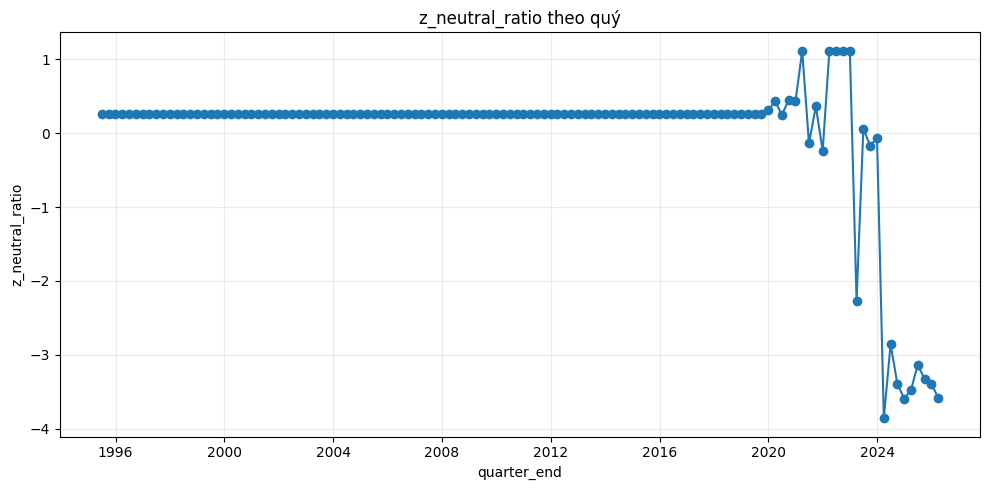

### Line plot: `z_net_sentiment`

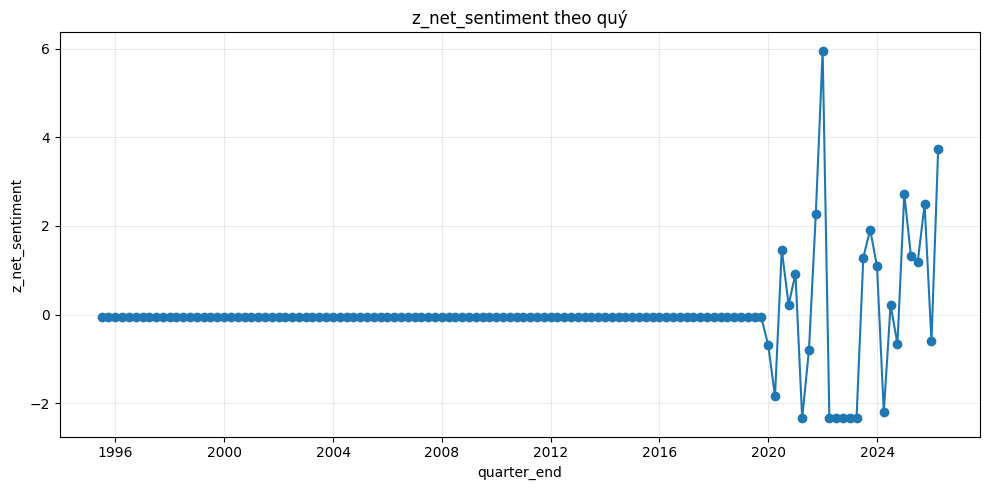

### Line plot: `z_weighted_sentiment_like`

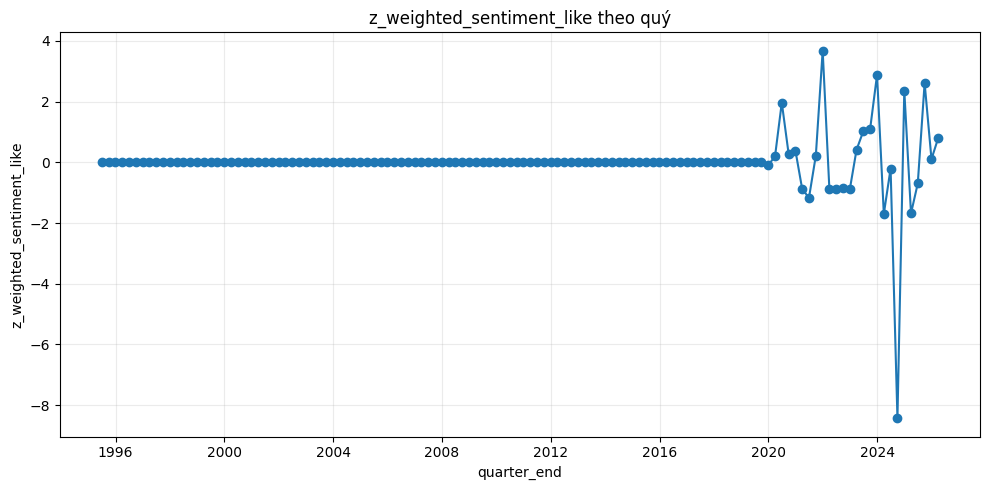

### Line plot: `z_p10_sentiment`

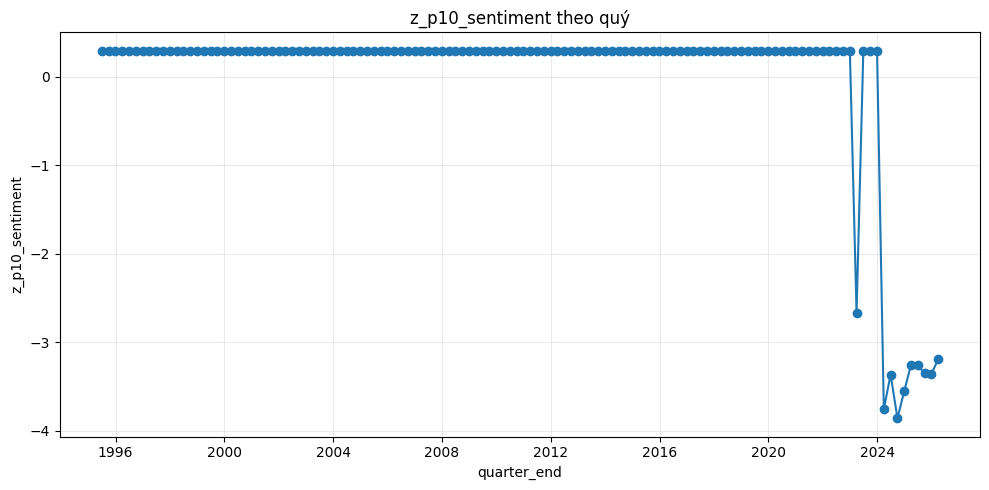

### Line plot: `z_p90_sentiment`

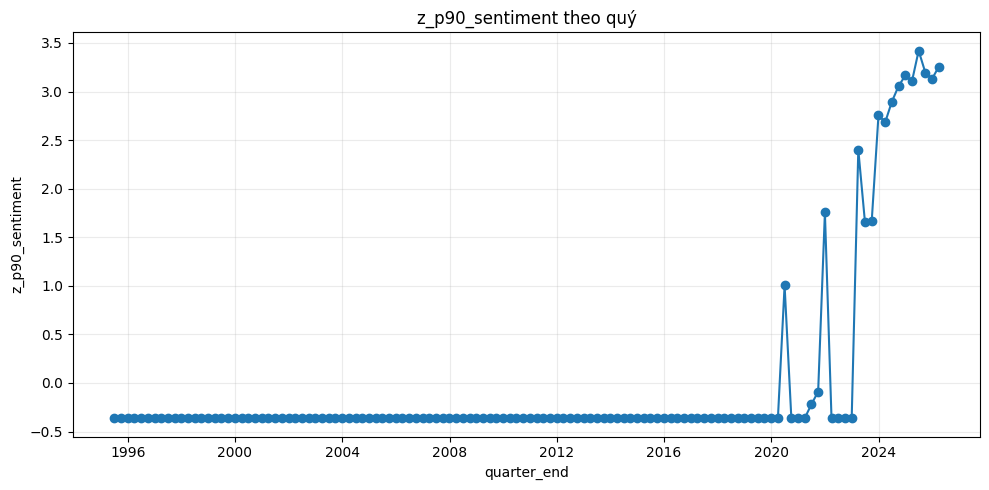

### Line plot: `z_gdp_raw_lag1`

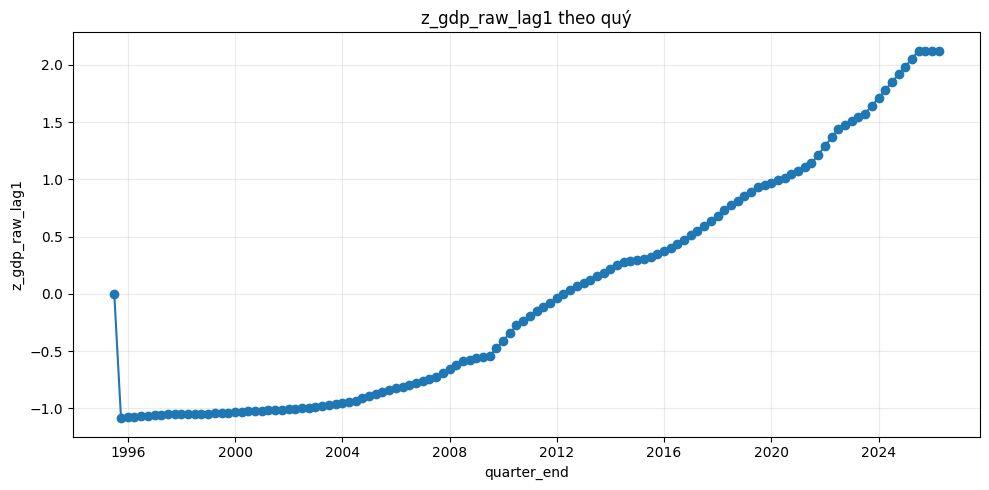

### Line plot: `z_gdp_raw_lag4`

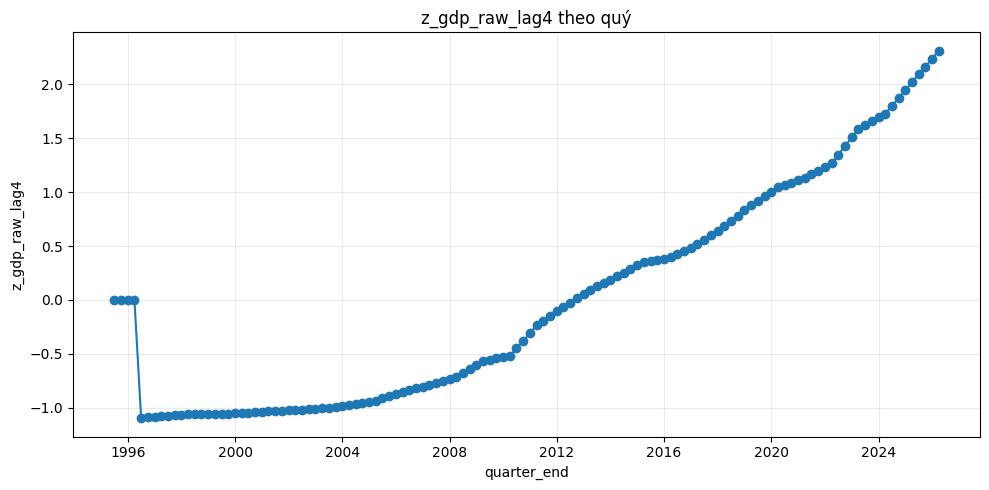

### Line plot: `z_gdp_raw_diff1`

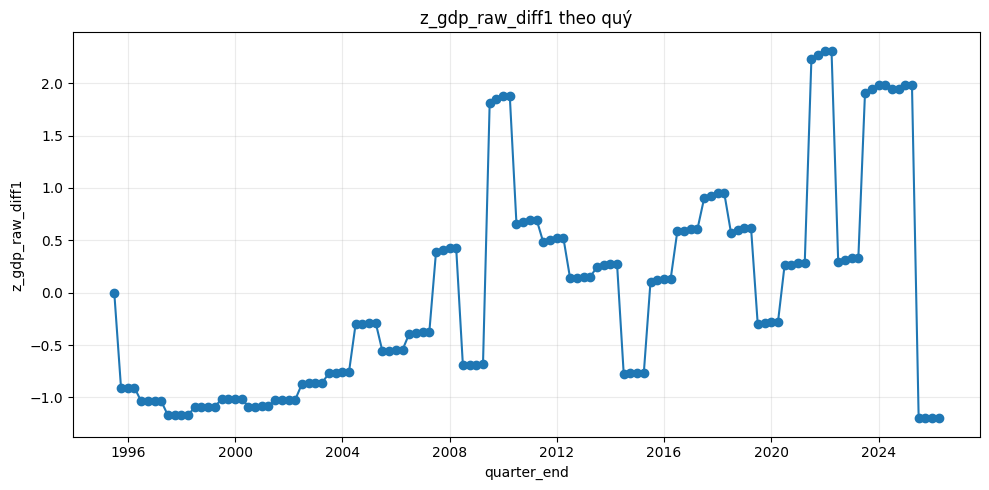

### Line plot: `z_gdp_raw_diff4`

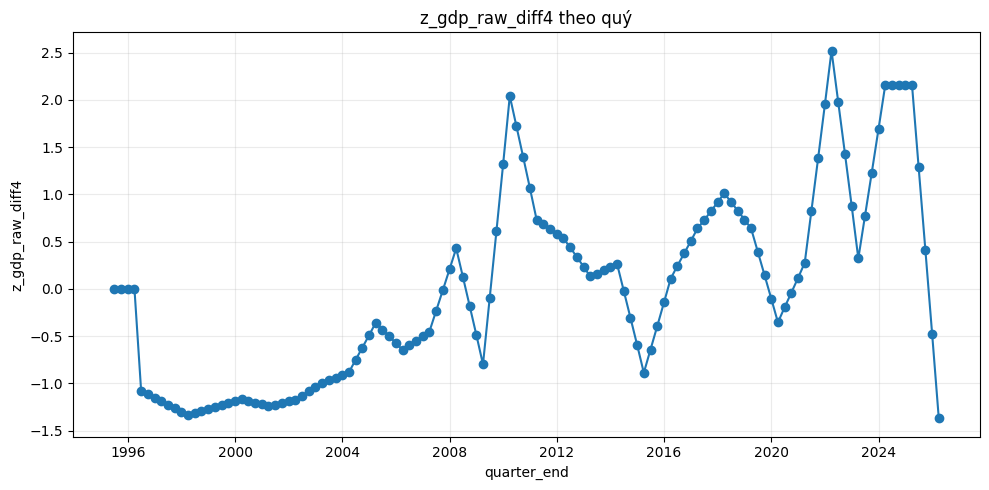

### Line plot: `z_gdp_raw_qoq_pct`

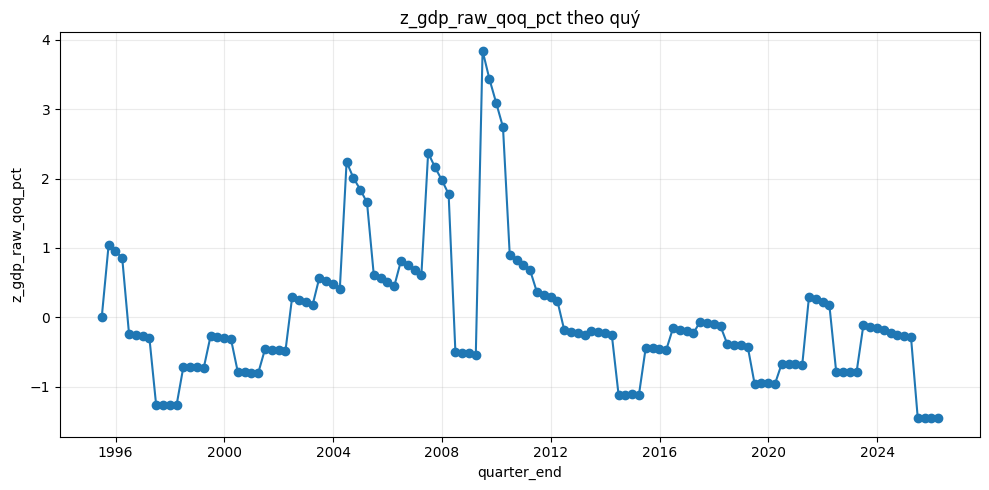

### Line plot: `z_gdp_raw_yoy_pct`

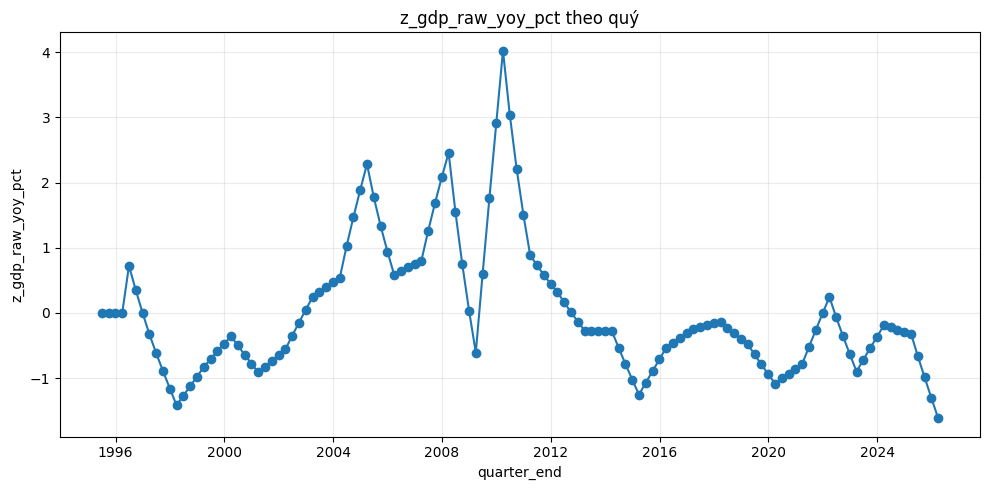

### Line plot: `z_inflation_lag1`

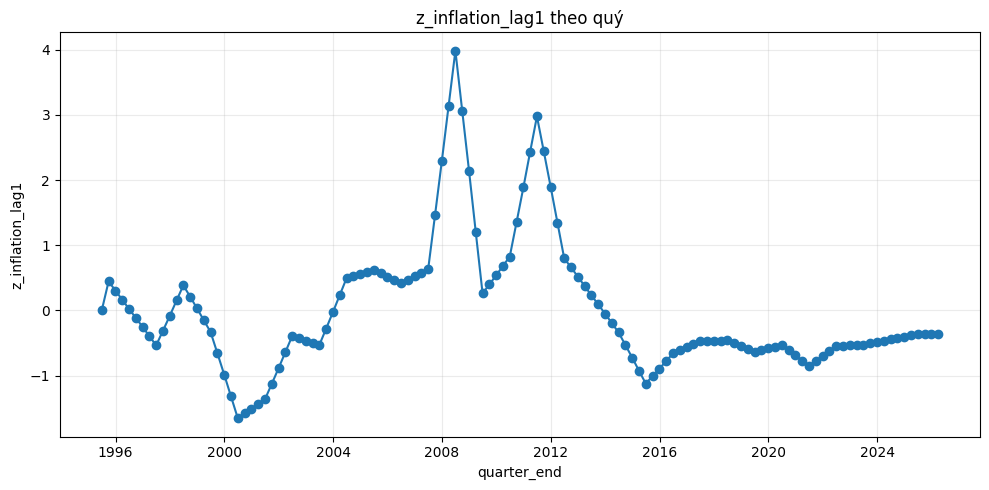

### Line plot: `z_inflation_lag4`

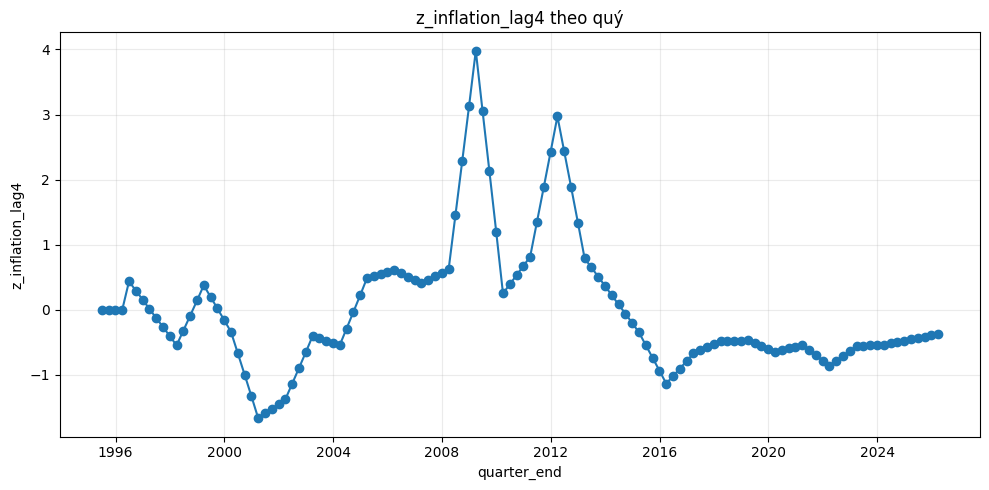

### Line plot: `z_inflation_diff1`

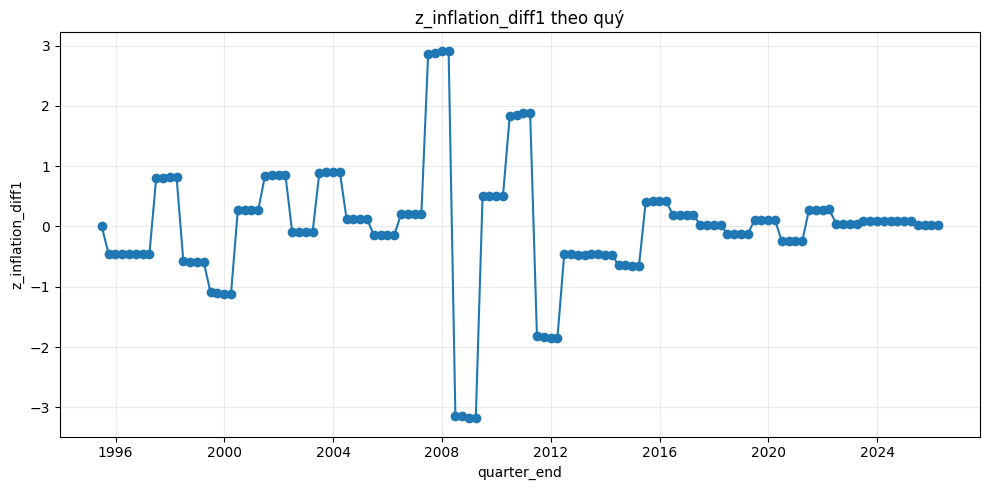

### Line plot: `z_inflation_diff4`

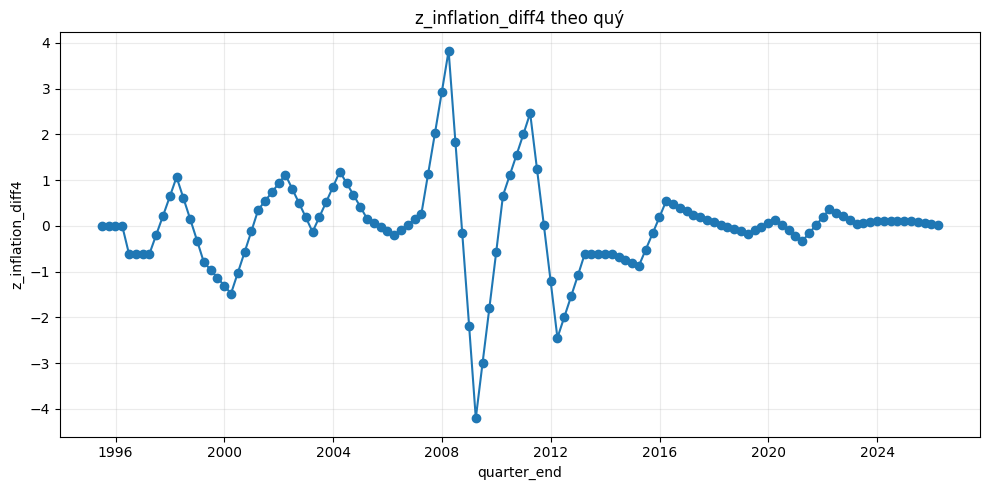

### Line plot: `z_interest_rate_lag1`

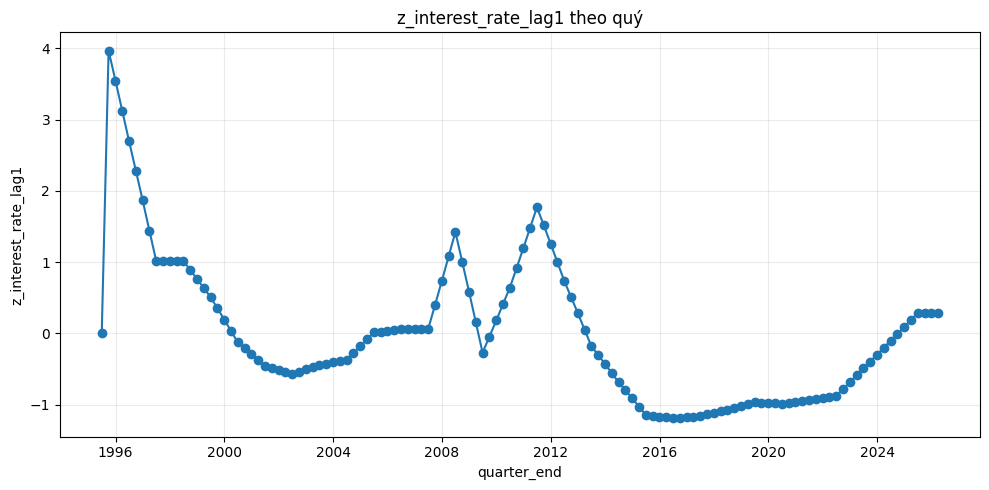

### Line plot: `z_interest_rate_lag4`

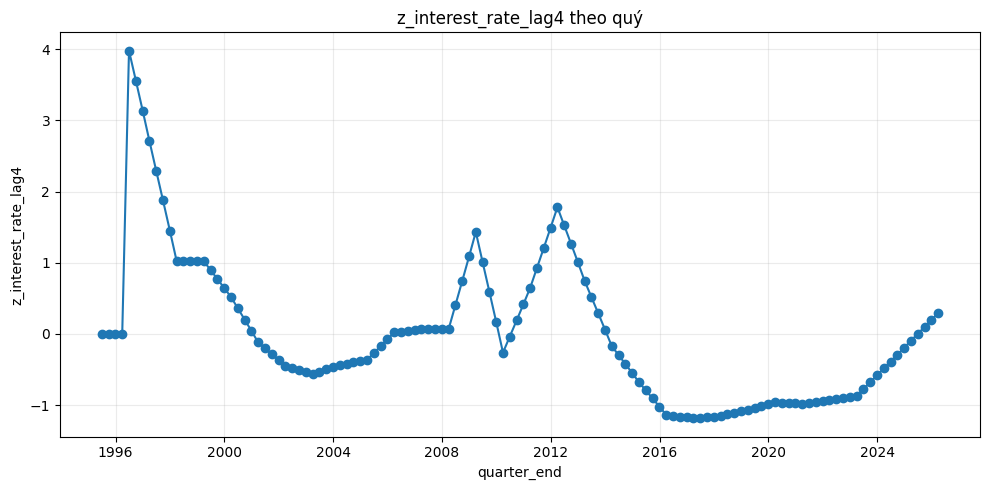

### Line plot: `z_interest_rate_diff1`

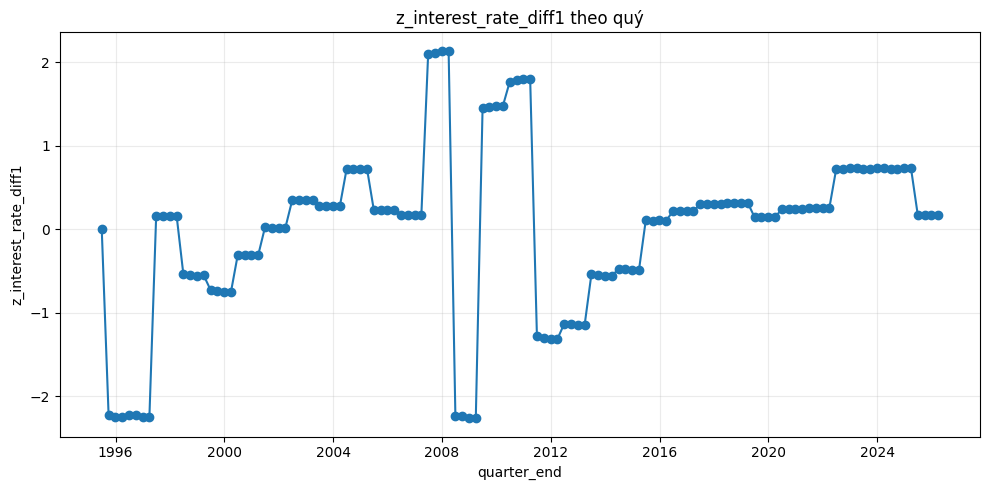

### Line plot: `z_interest_rate_diff4`

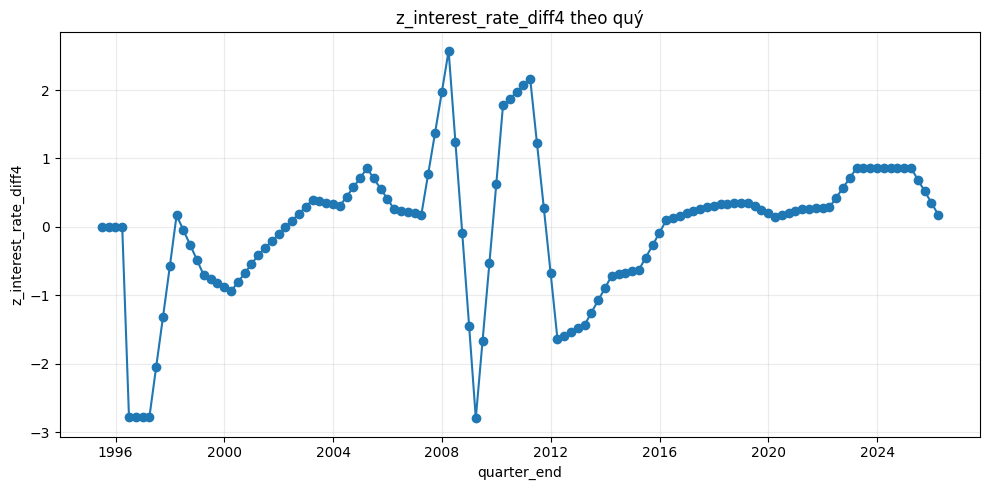

### Line plot: `z_interest_rate_qoq_pct`

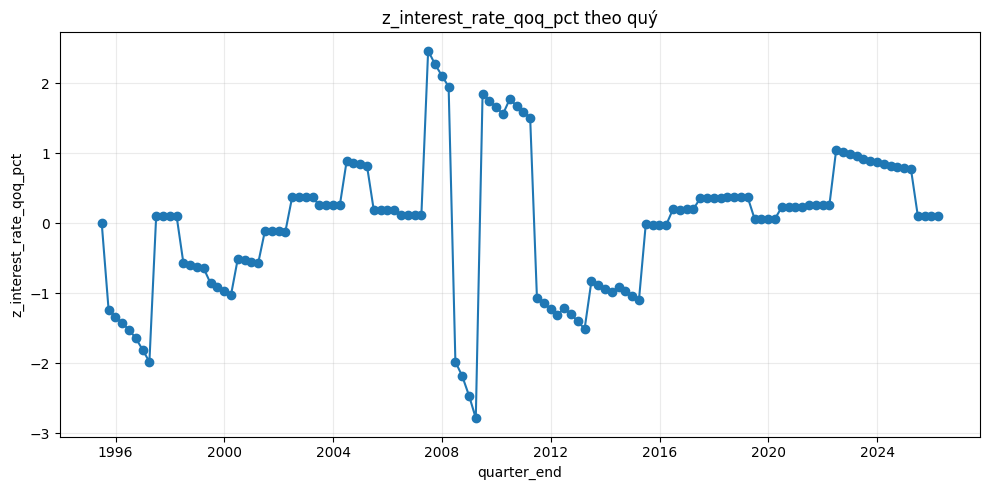

### Line plot: `z_interest_rate_yoy_pct`

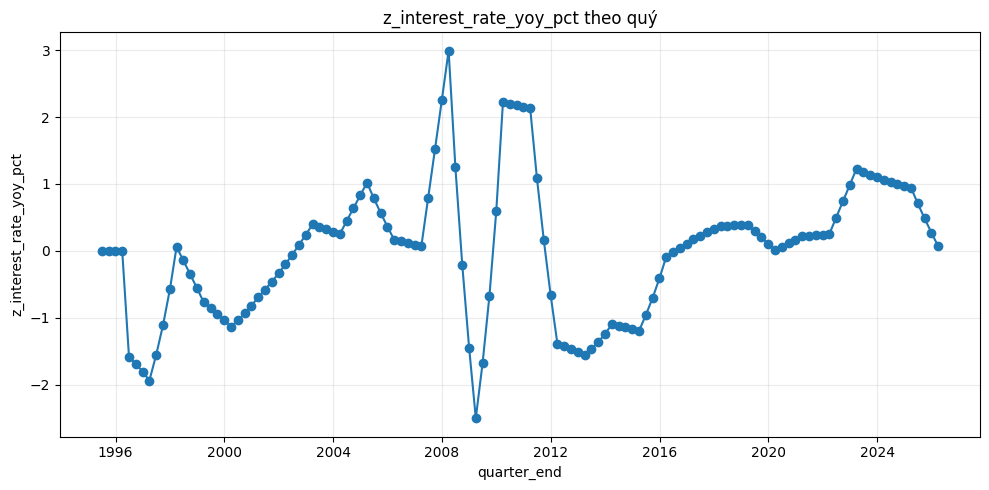

### Line plot: `z_fdi_pct_gdp_lag1`

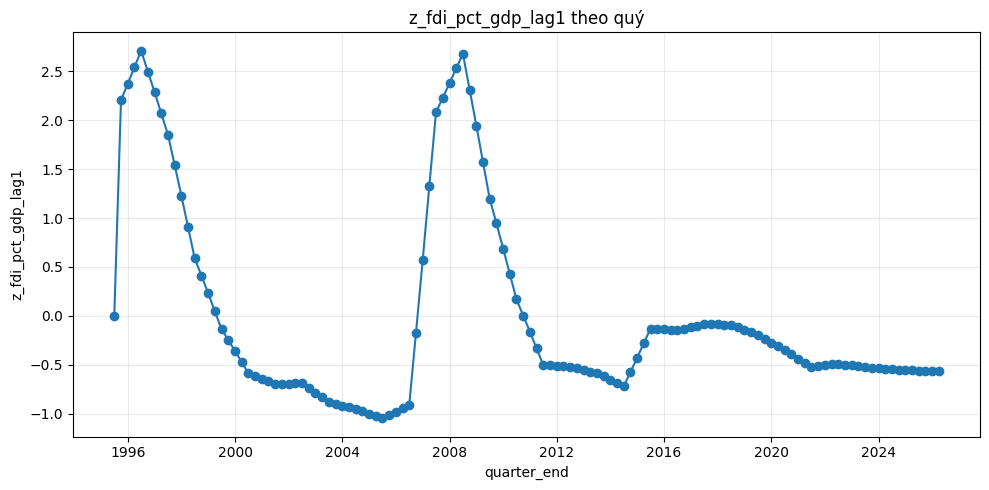

### Line plot: `z_fdi_pct_gdp_lag4`

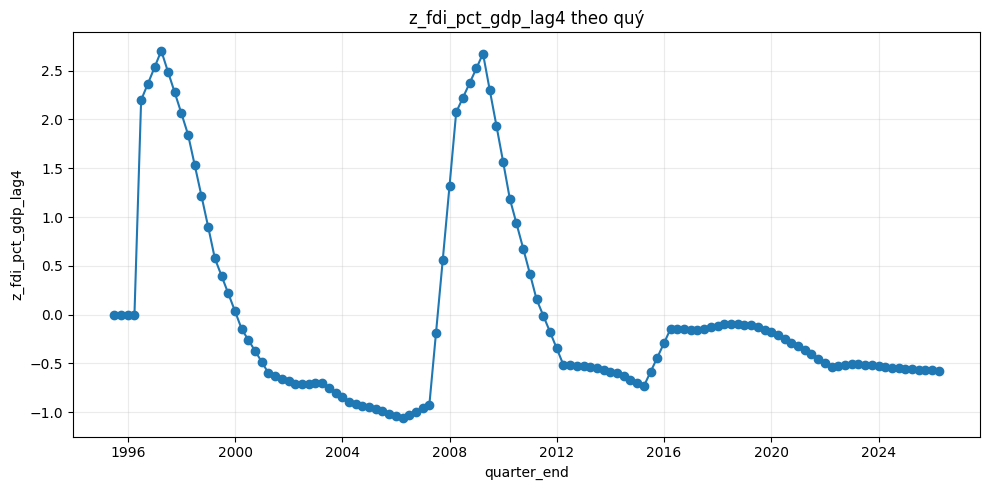

### Line plot: `z_fdi_pct_gdp_diff1`

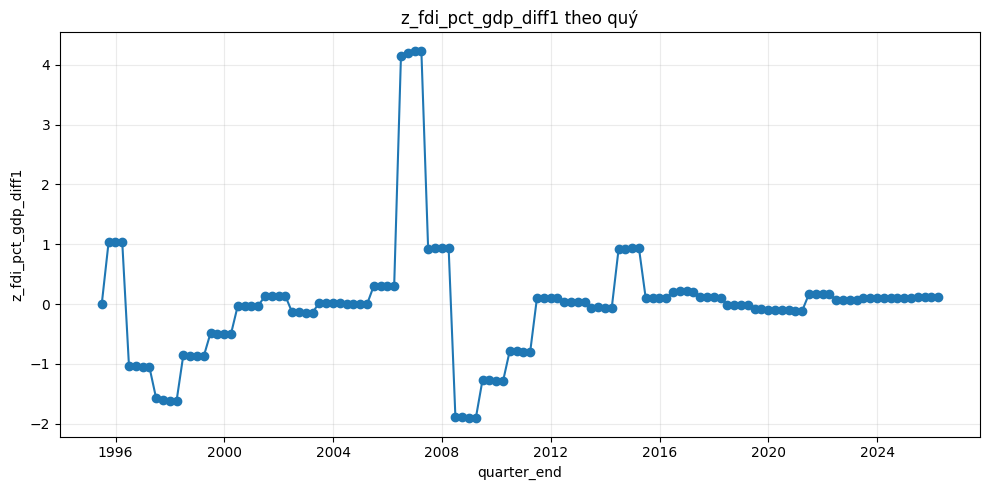

### Line plot: `z_fdi_pct_gdp_diff4`

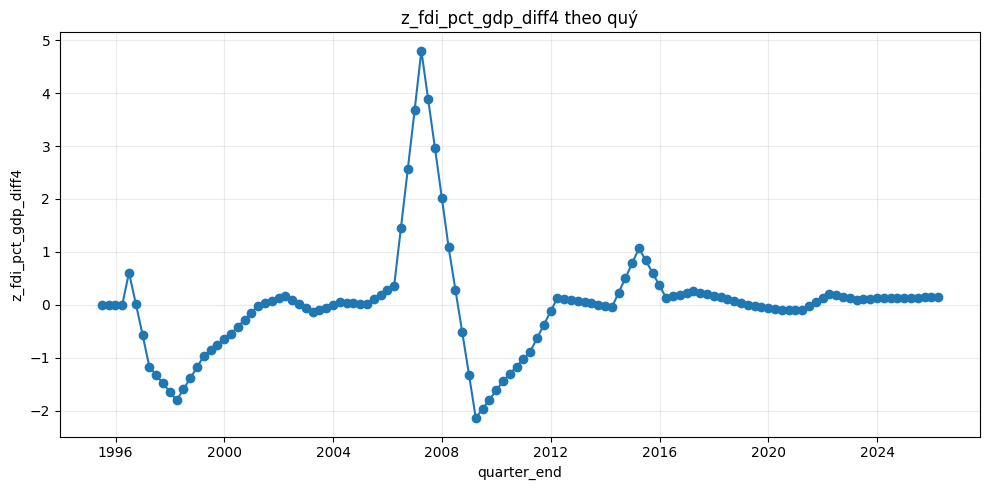

### Line plot: `z_fdi_pct_gdp_qoq_pct`

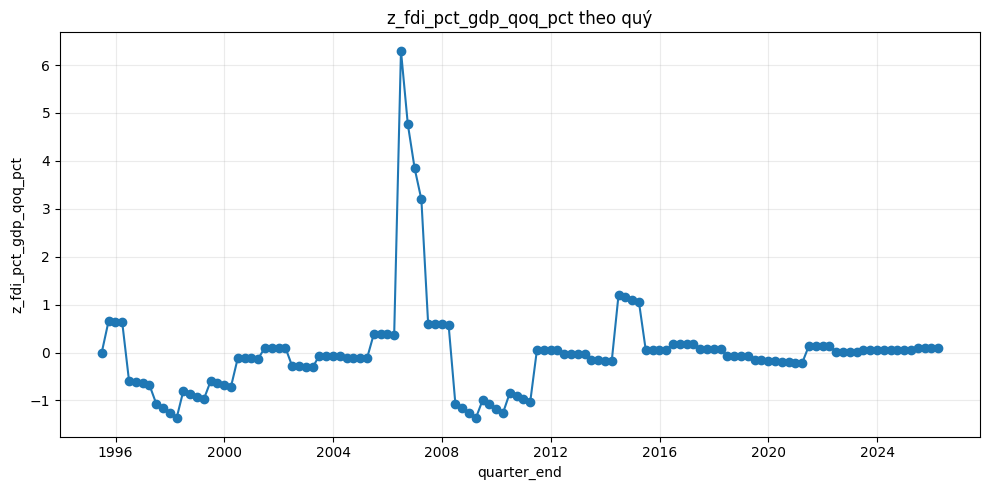

### Line plot: `z_fdi_pct_gdp_yoy_pct`

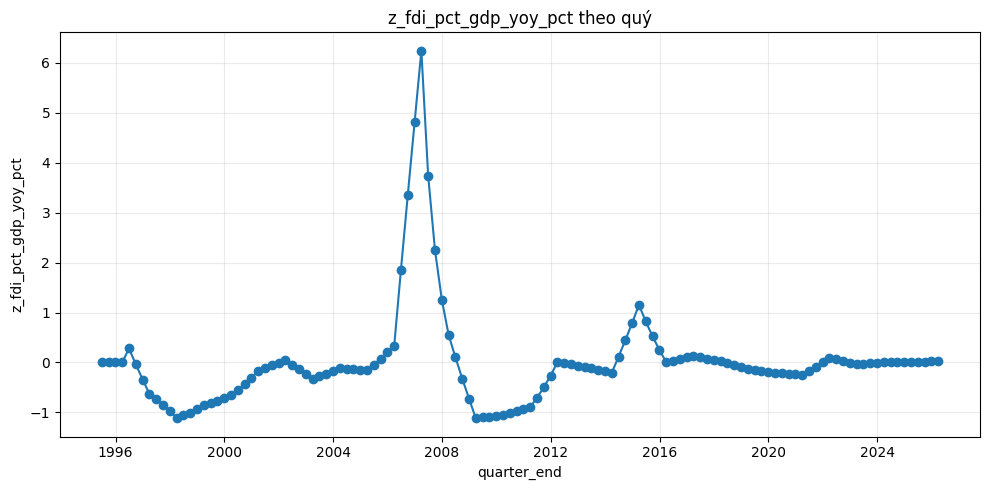

### Line plot: `z_investment_pct_gdp_lag1`

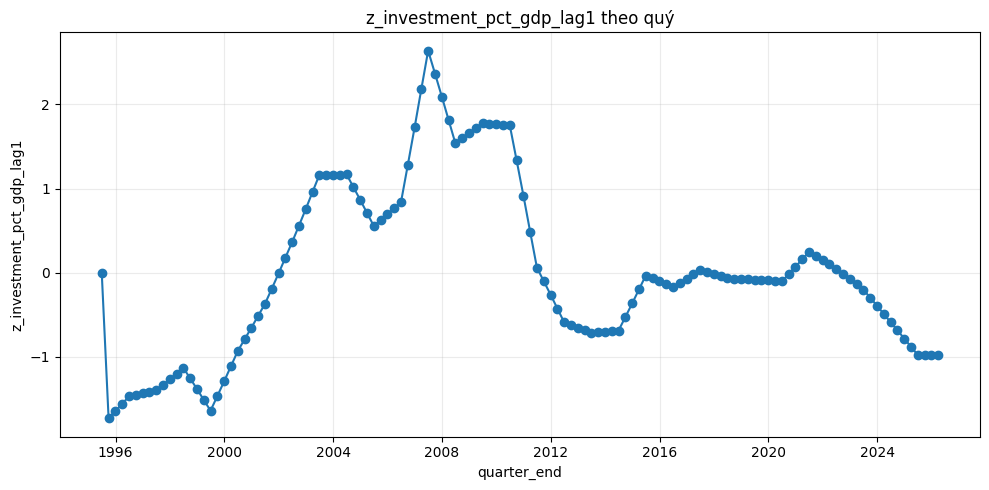

### Line plot: `z_investment_pct_gdp_lag4`

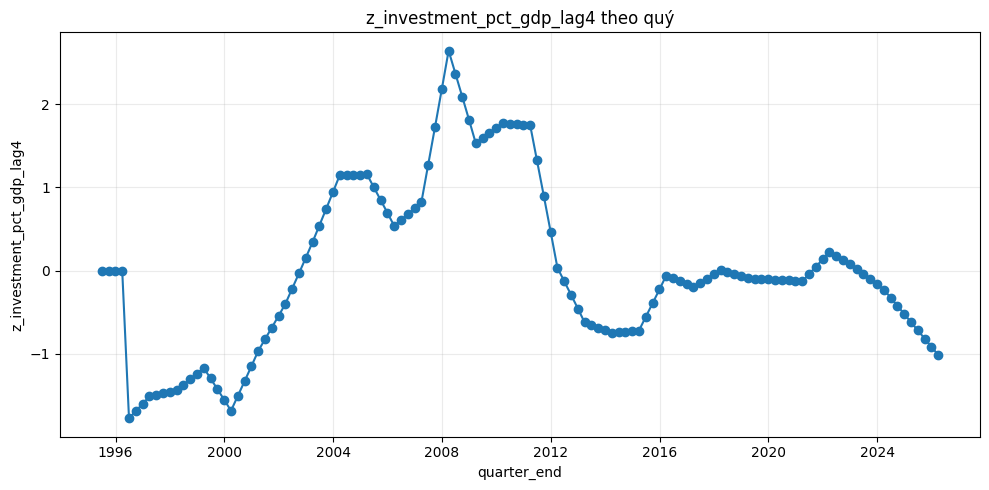

### Line plot: `z_investment_pct_gdp_diff1`

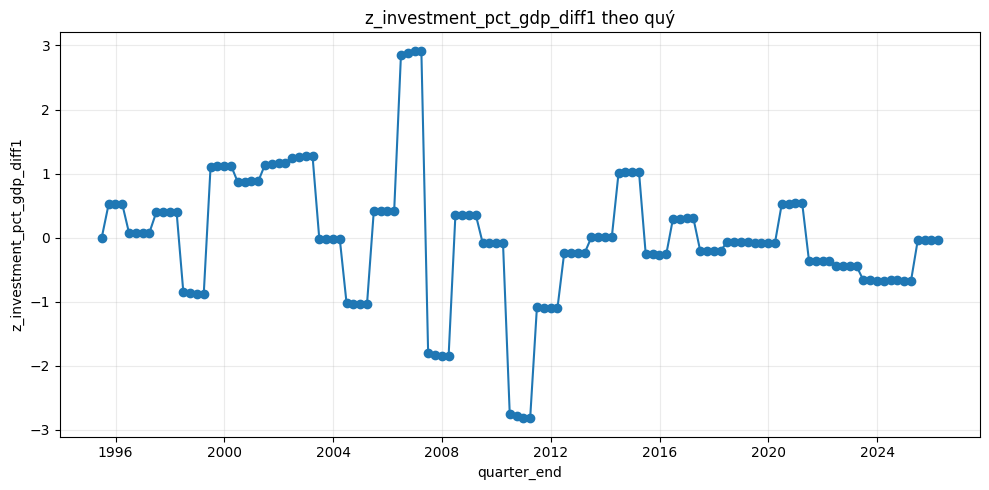

### Line plot: `z_investment_pct_gdp_diff4`

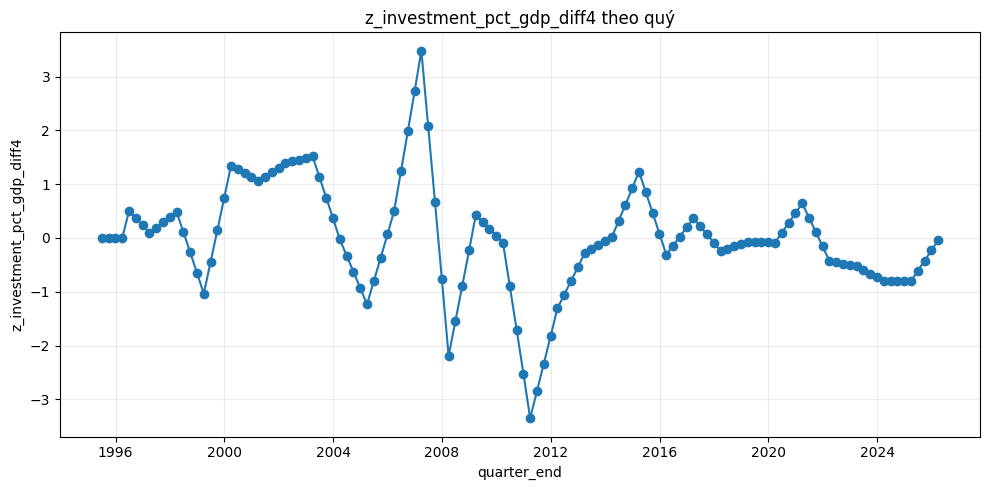

### Line plot: `z_investment_pct_gdp_qoq_pct`

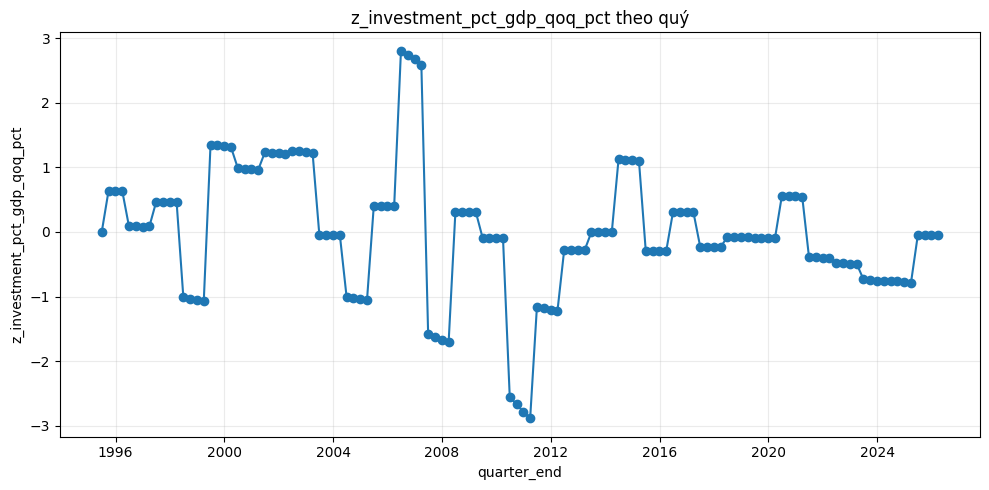

### Line plot: `z_investment_pct_gdp_yoy_pct`

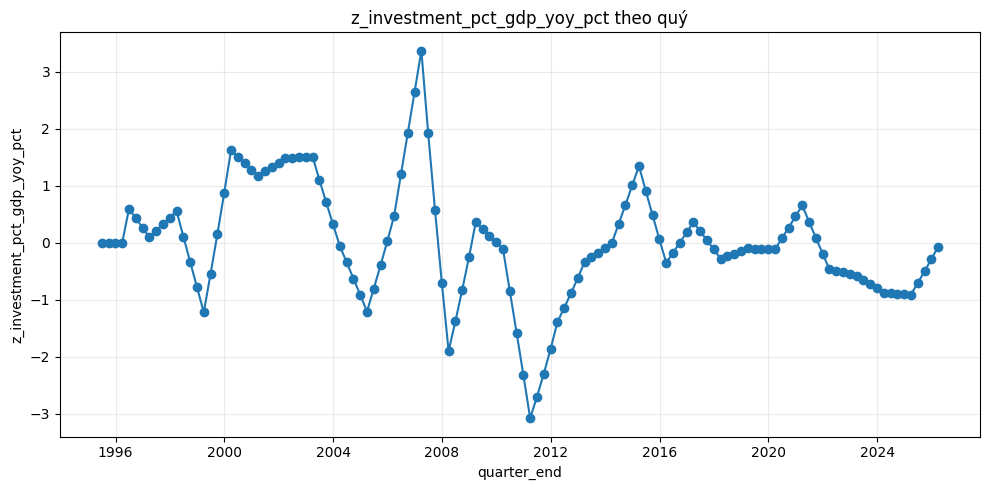

### Line plot: `z_export_pct_gdp_lag1`

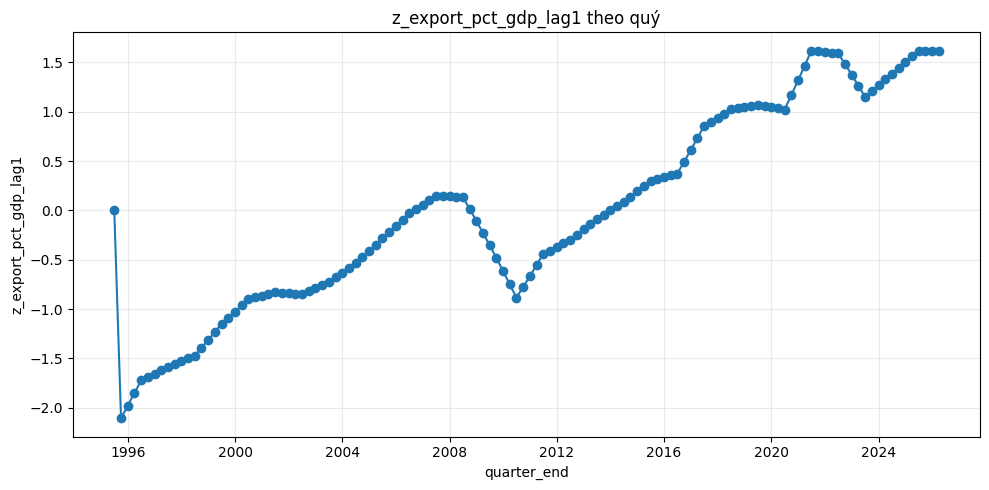

### Line plot: `z_export_pct_gdp_lag4`

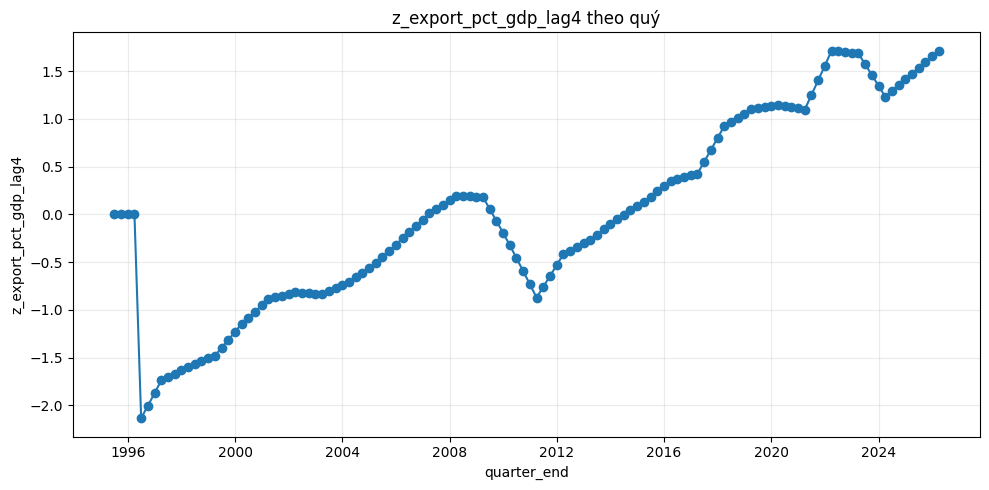

### Line plot: `z_export_pct_gdp_diff1`

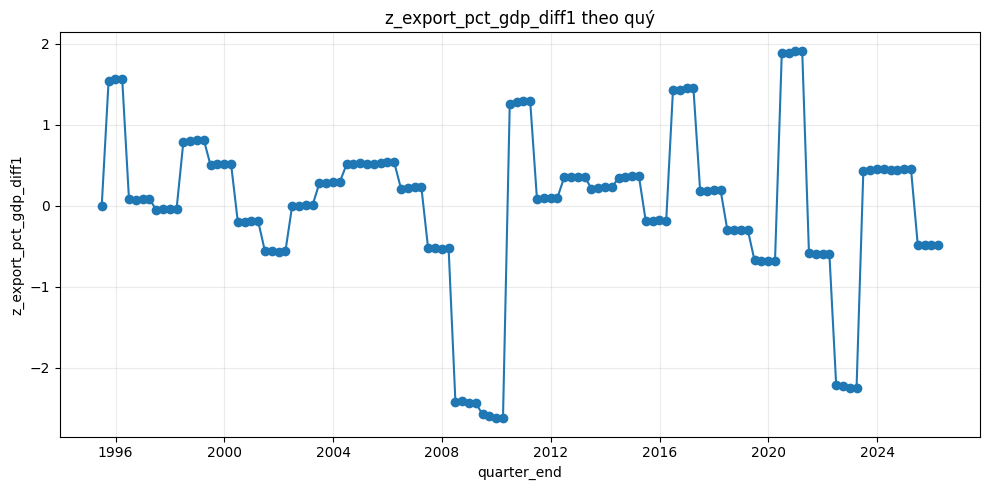

### Line plot: `z_export_pct_gdp_diff4`

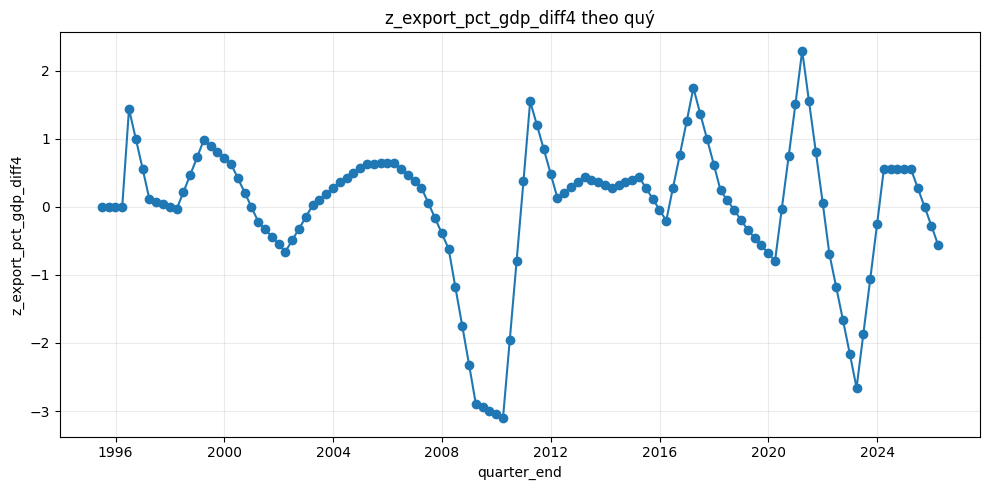

### Line plot: `z_export_pct_gdp_qoq_pct`

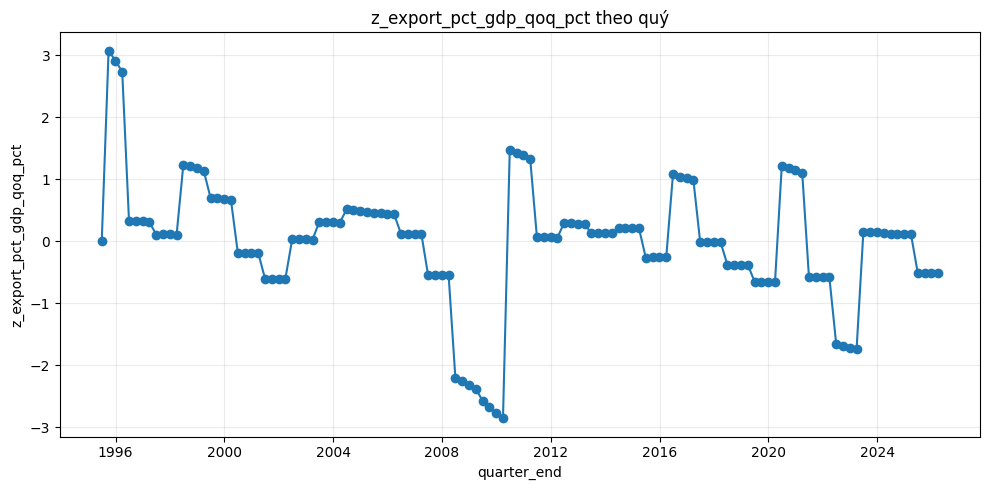

### Line plot: `z_export_pct_gdp_yoy_pct`

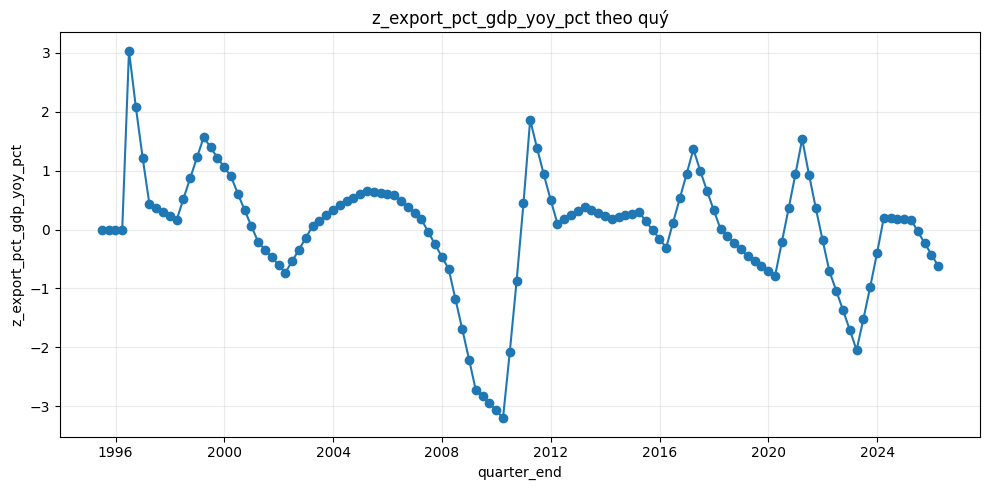

### Line plot: `z_unemployment_rate_lag1`

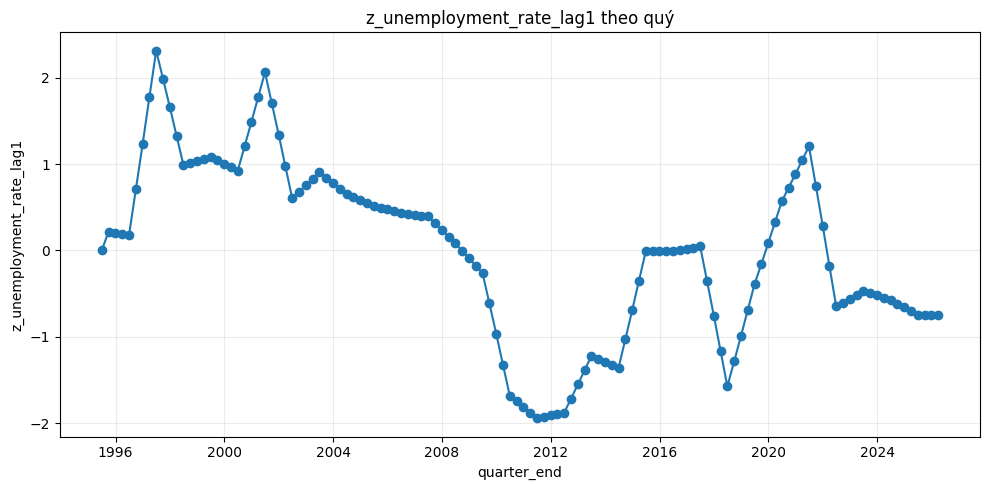

### Line plot: `z_unemployment_rate_lag4`

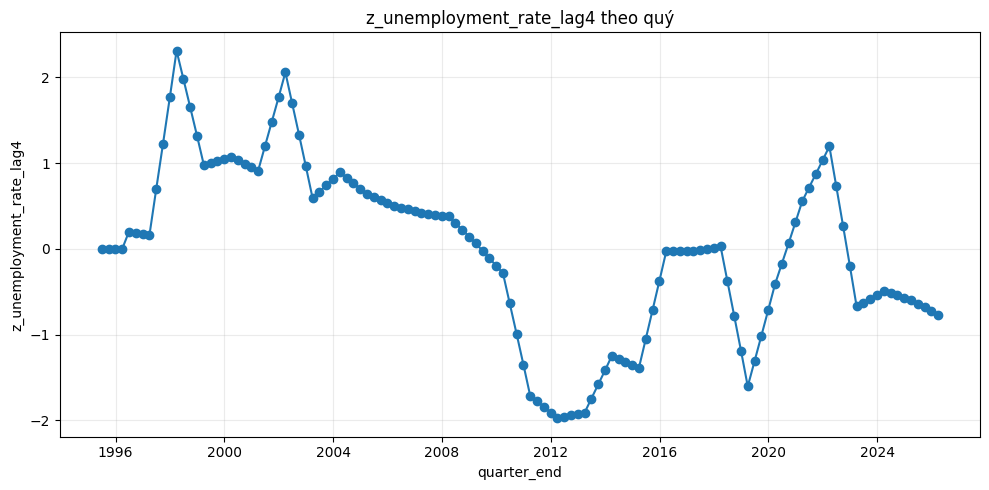

### Line plot: `z_unemployment_rate_diff1`

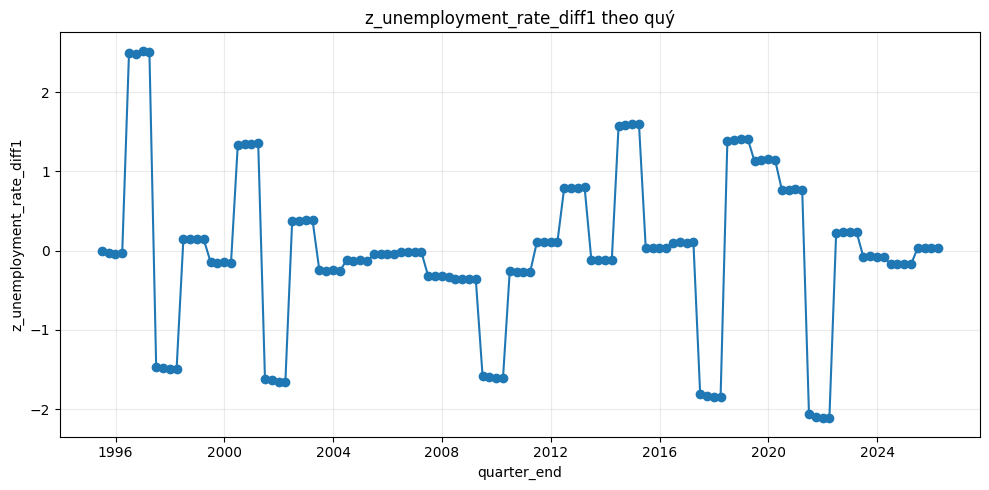

### Line plot: `z_unemployment_rate_diff4`

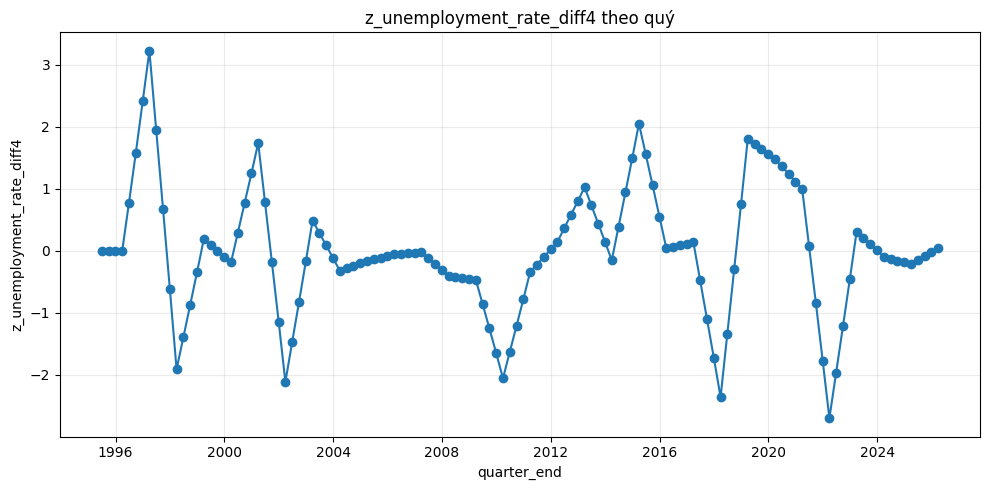

### Line plot: `z_unemployment_rate_qoq_pct`

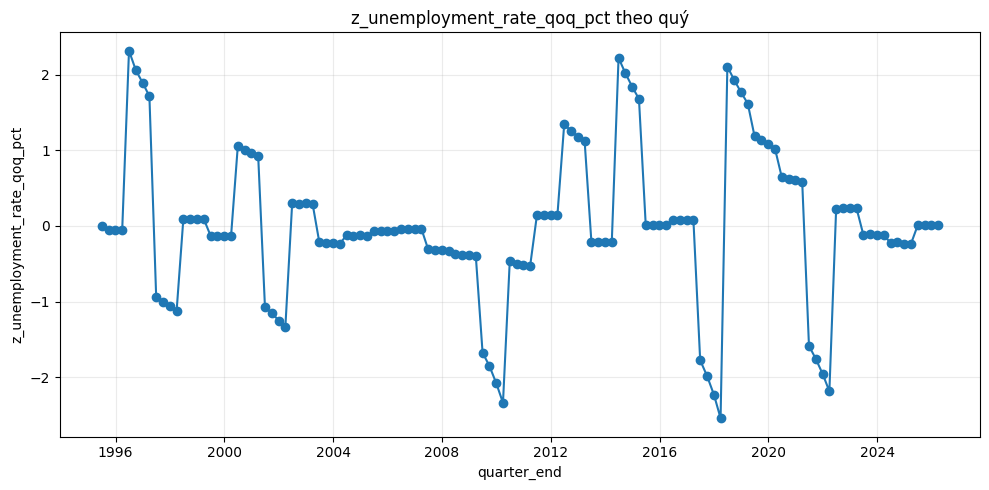

### Line plot: `z_unemployment_rate_yoy_pct`

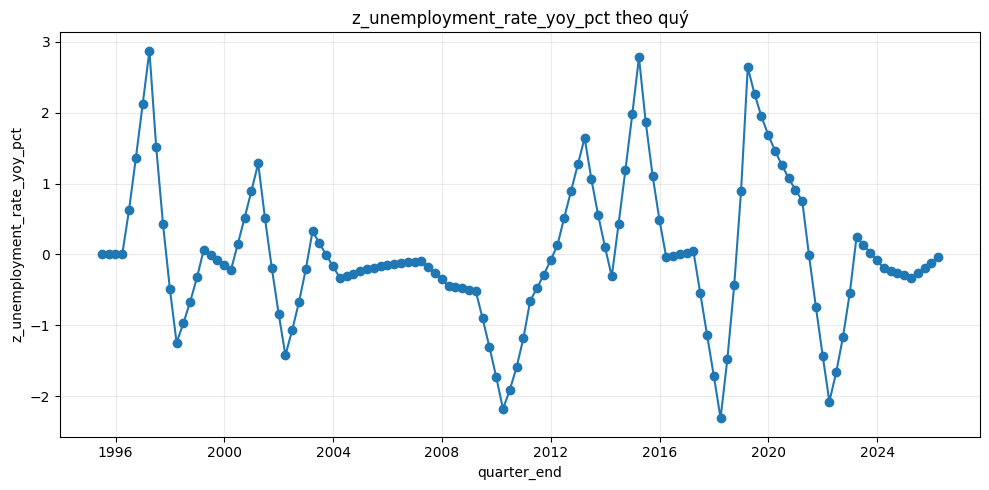

### Line plot: `z_gov_spending_pct_gdp_lag1`

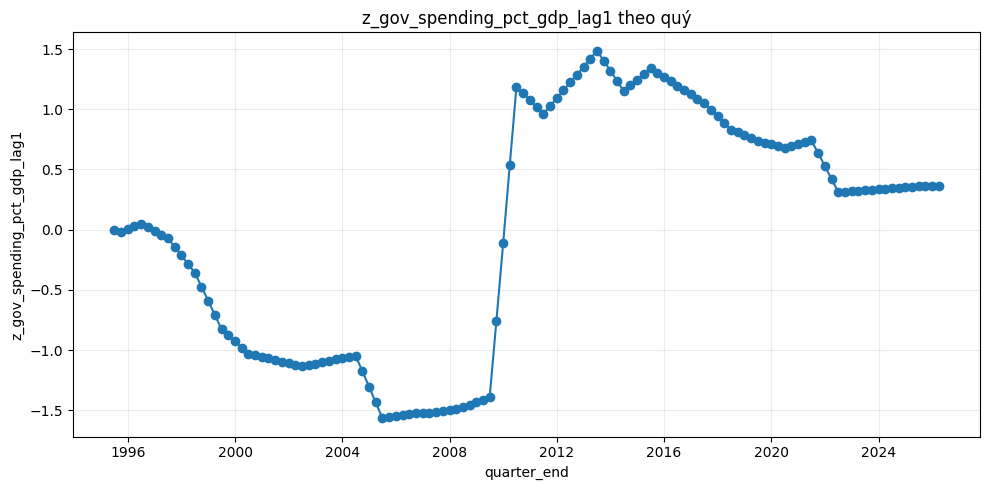

### Line plot: `z_gov_spending_pct_gdp_lag4`

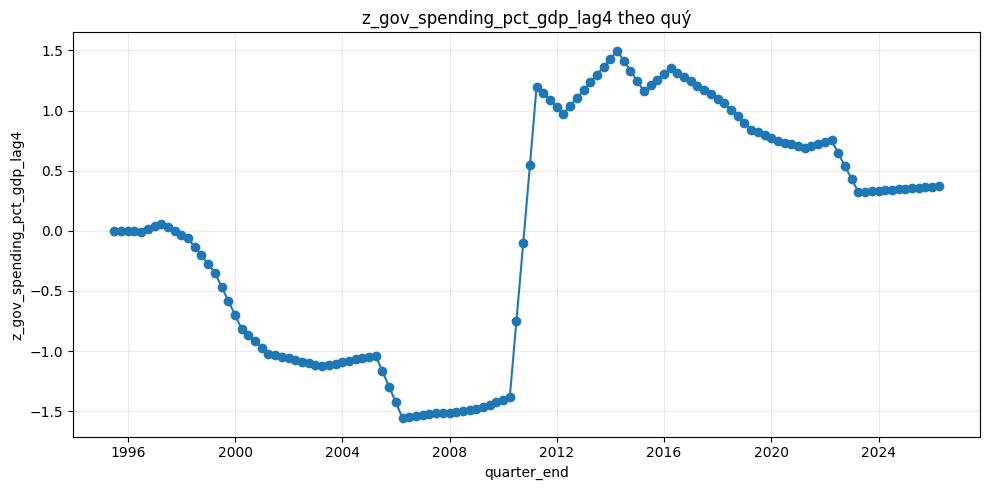

### Line plot: `z_gov_spending_pct_gdp_diff1`

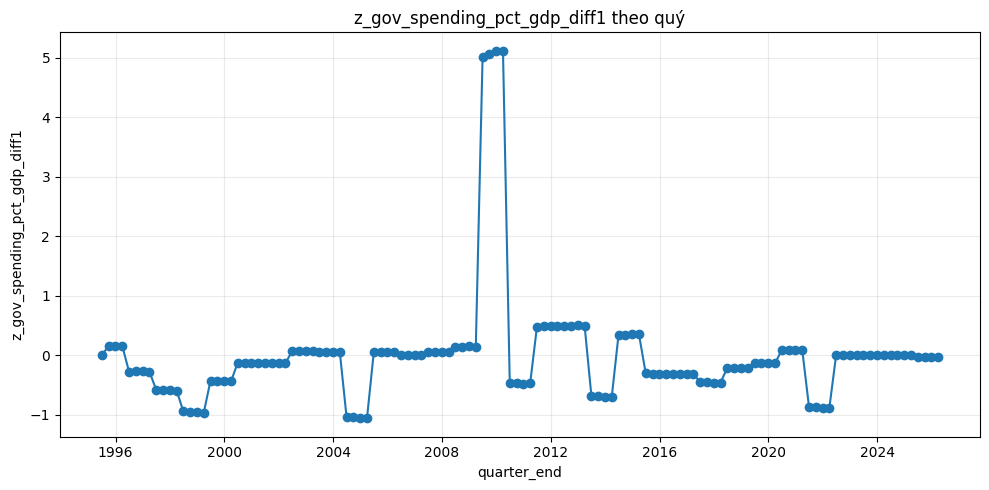

### Line plot: `z_gov_spending_pct_gdp_diff4`

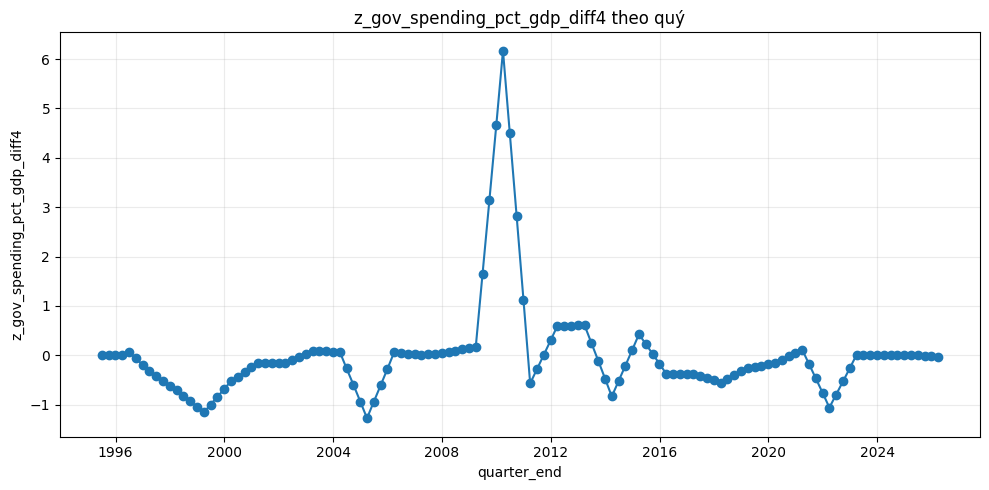

### Line plot: `z_gov_spending_pct_gdp_qoq_pct`

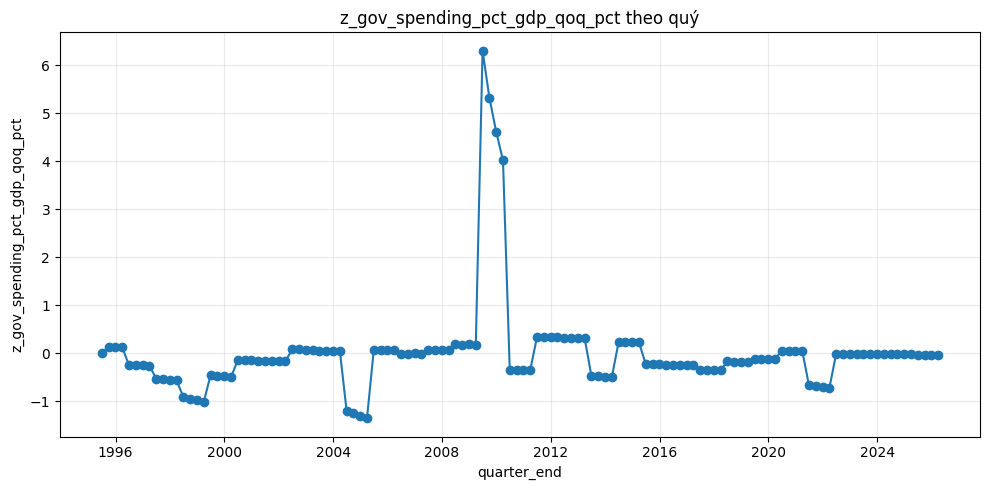

### Line plot: `z_gov_spending_pct_gdp_yoy_pct`

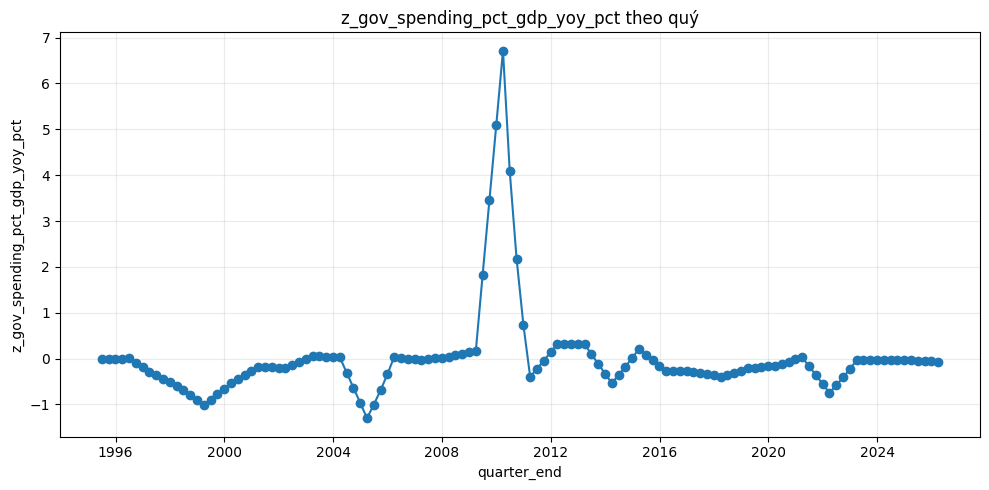

### Line plot: `z_log_gdp_raw_lag1`

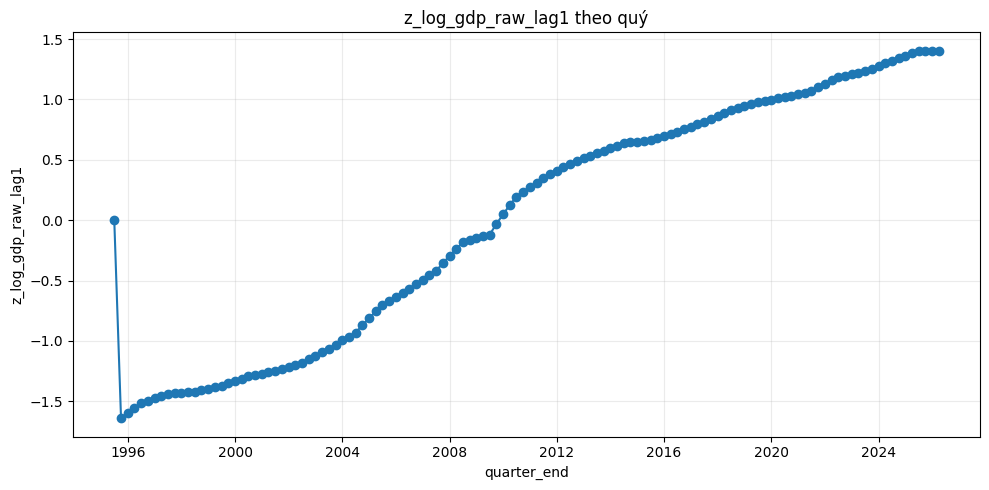

### Line plot: `z_log_gdp_raw_lag4`

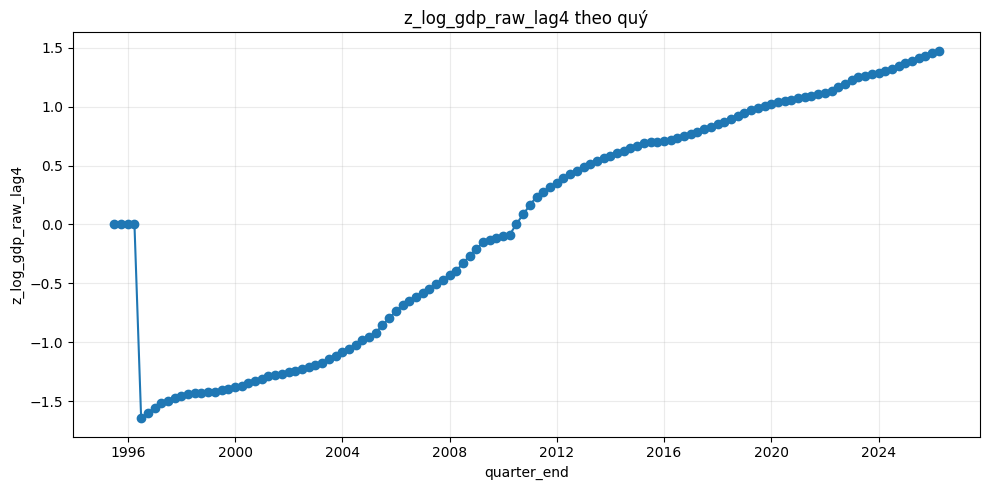

### Line plot: `z_log_gdp_raw_diff1`

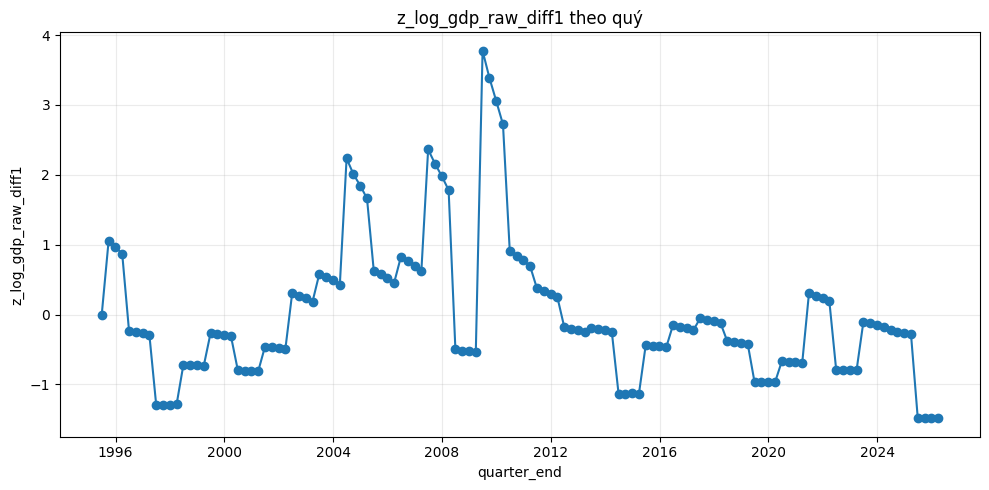

### Line plot: `z_log_gdp_raw_diff4`

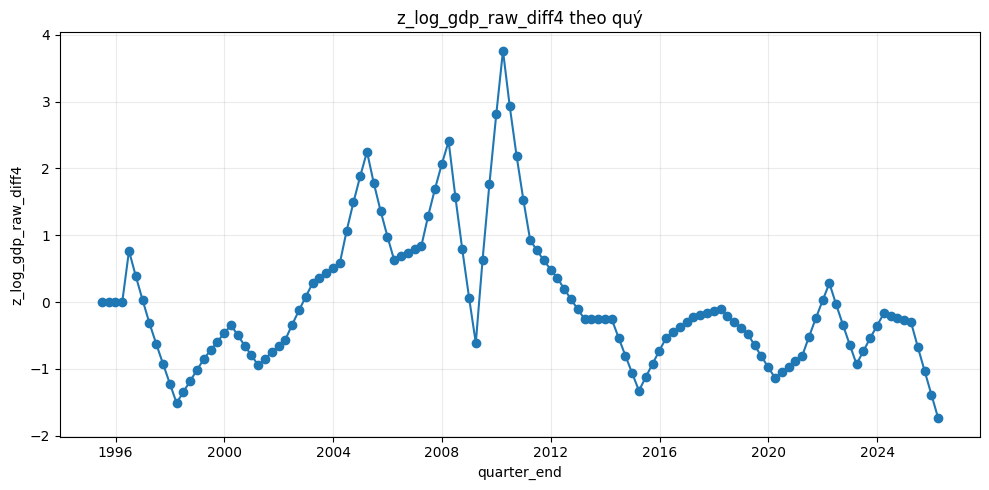

### Line plot: `z_log_gdp_raw_qoq_pct`

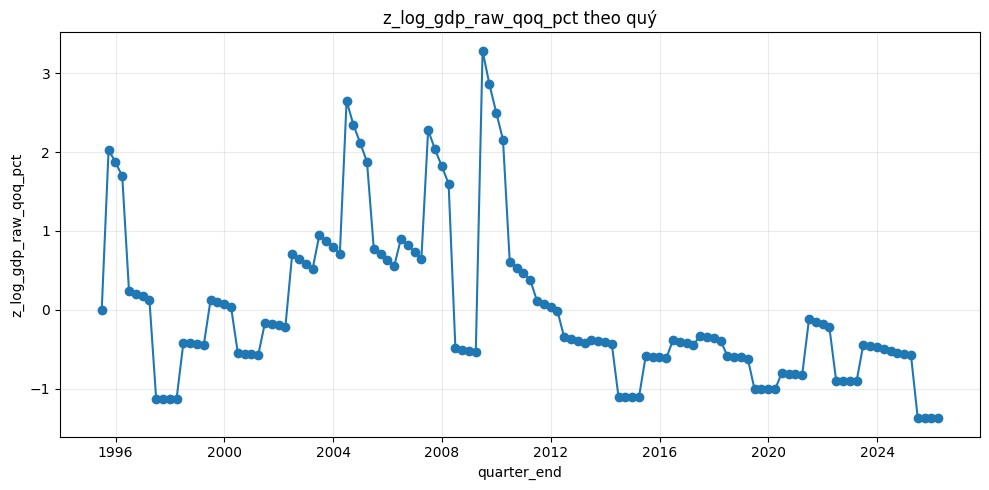

### Line plot: `z_log_gdp_raw_yoy_pct`

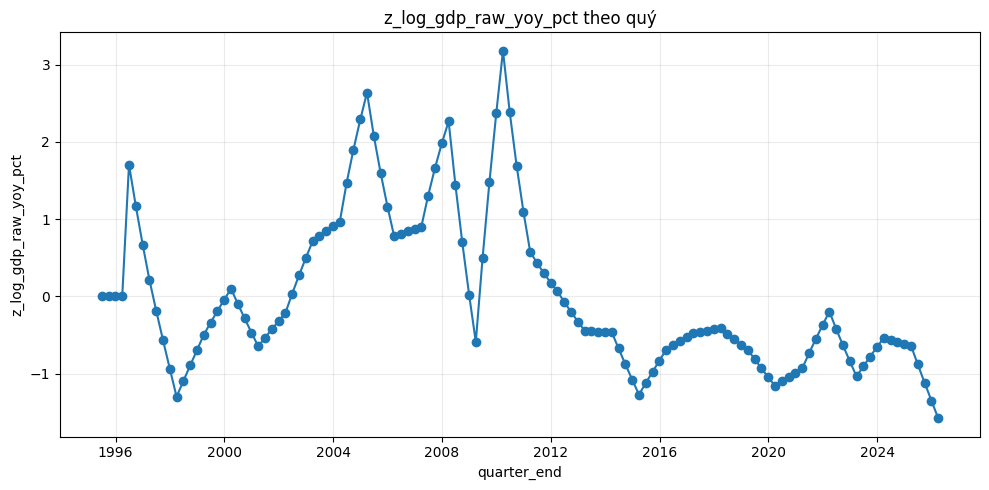

### Line plot: `z_log_log_gdp_raw`

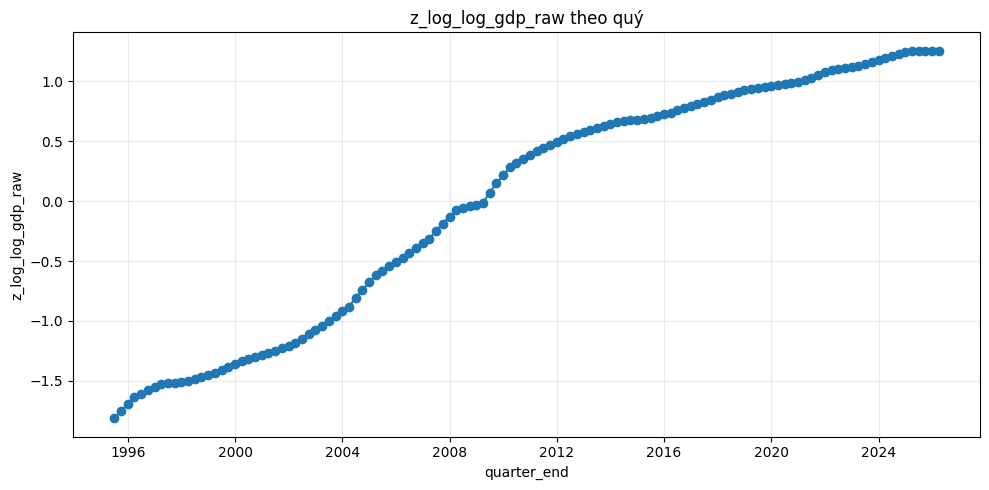

### Line plot: `z_log_fdi_pct_gdp_lag1`

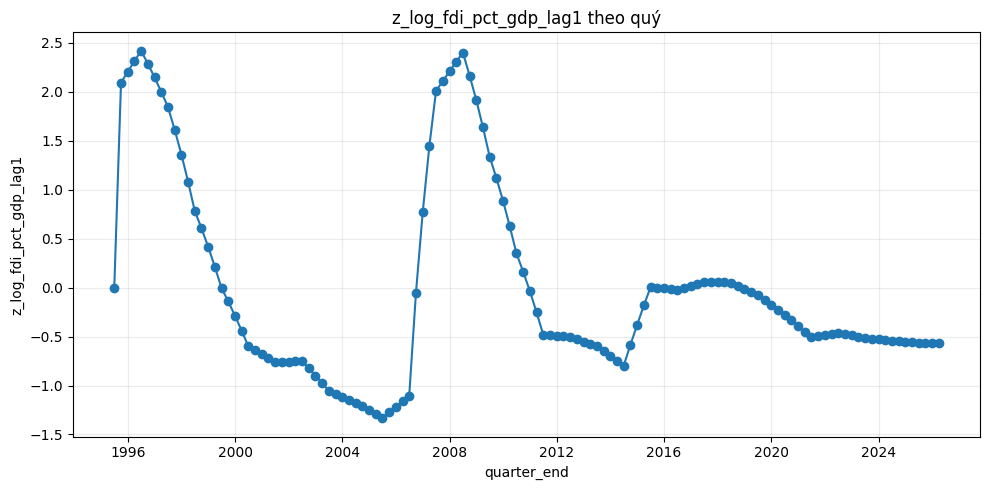

### Line plot: `z_log_fdi_pct_gdp_lag4`

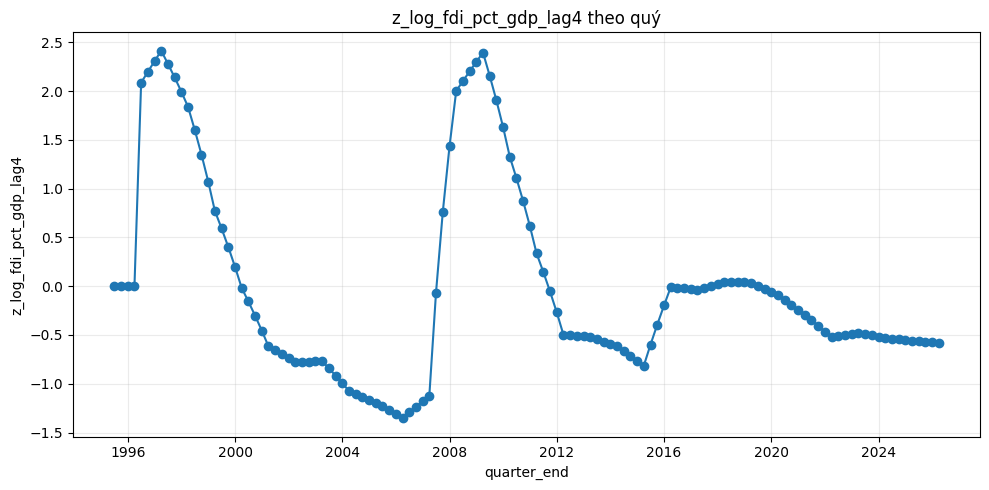

### Line plot: `z_log_fdi_pct_gdp_diff1`

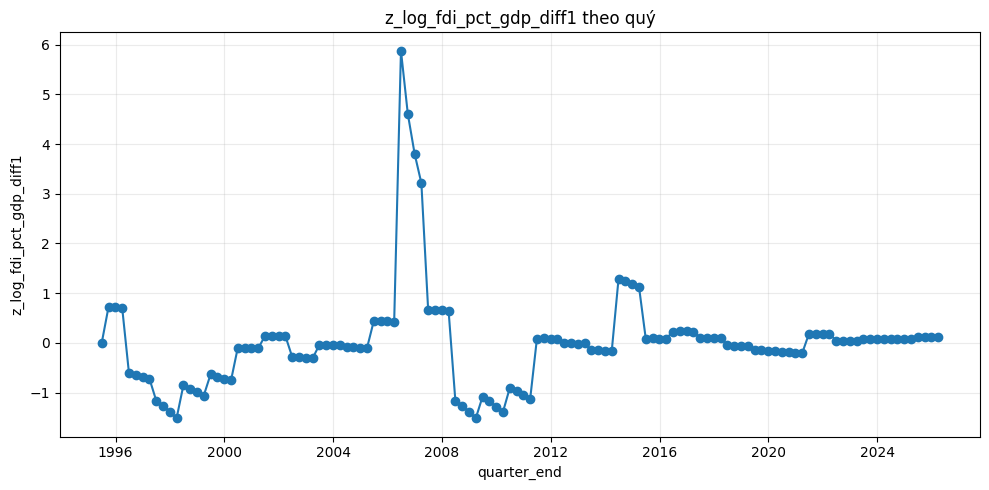

### Line plot: `z_log_fdi_pct_gdp_diff4`

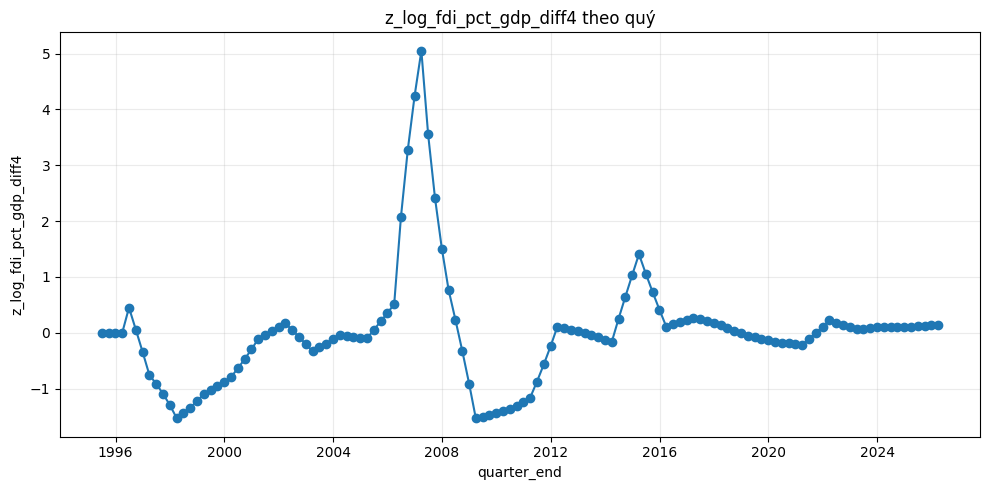

### Line plot: `z_log_fdi_pct_gdp_qoq_pct`

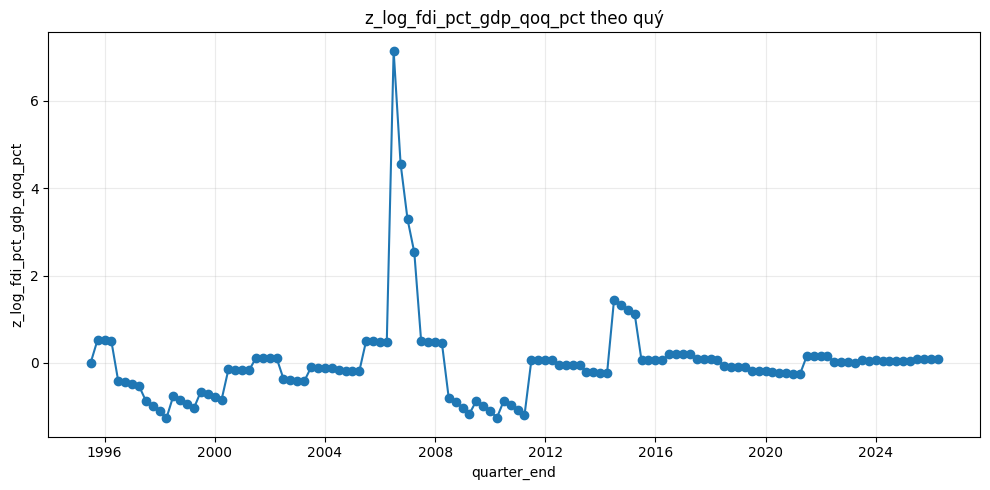

### Line plot: `z_log_fdi_pct_gdp_yoy_pct`

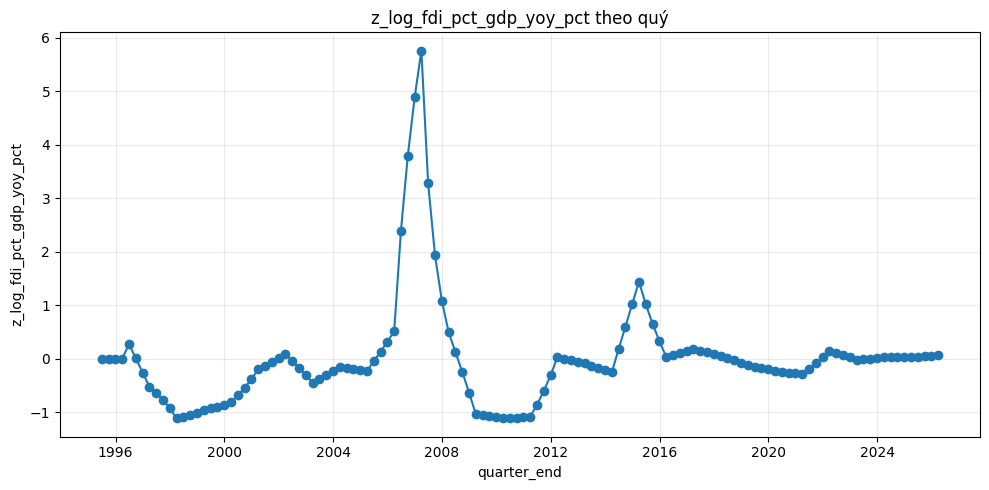

### Line plot: `z_log_log_fdi_pct_gdp`

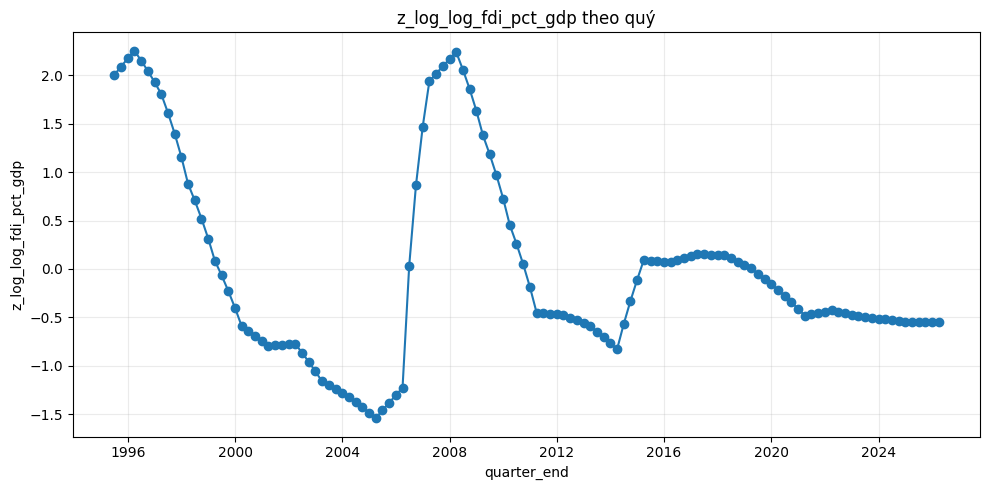

### Line plot: `z_log_investment_pct_gdp_lag1`

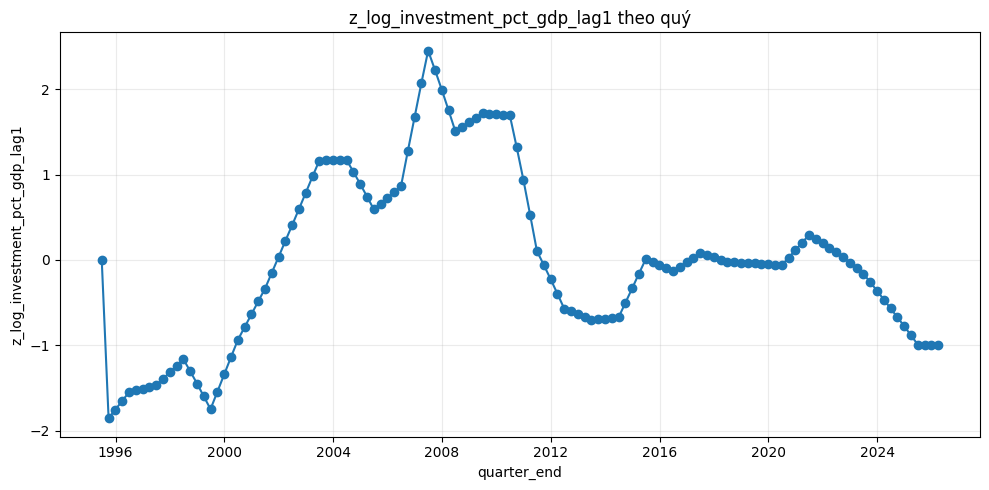

### Line plot: `z_log_investment_pct_gdp_lag4`

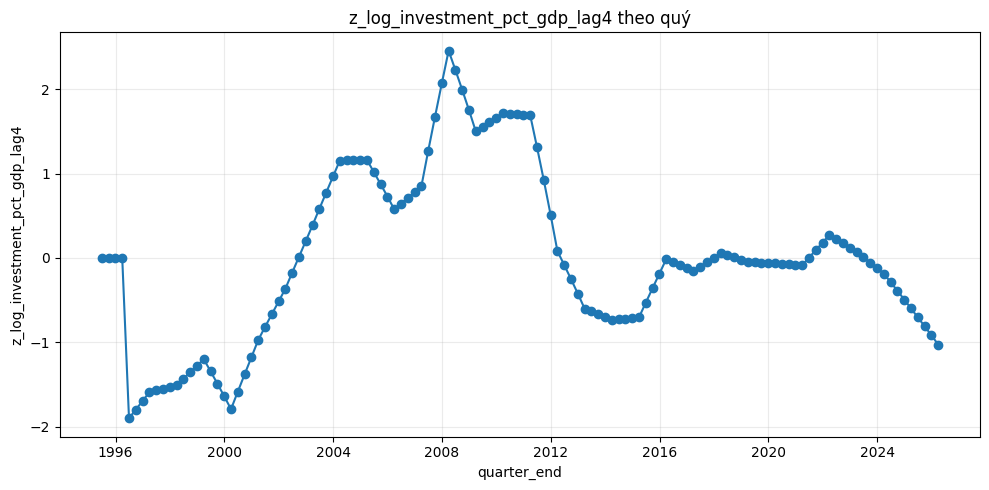

### Line plot: `z_log_investment_pct_gdp_diff1`

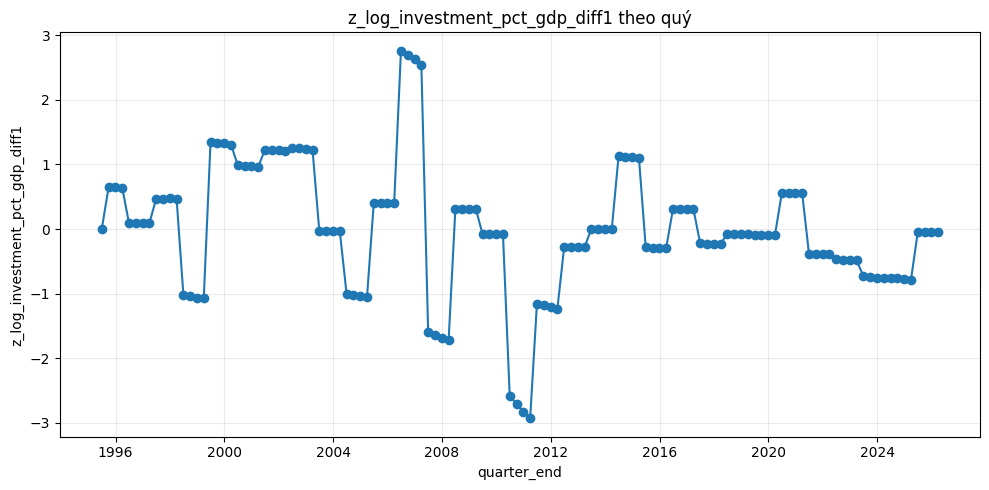

### Line plot: `z_log_investment_pct_gdp_diff4`

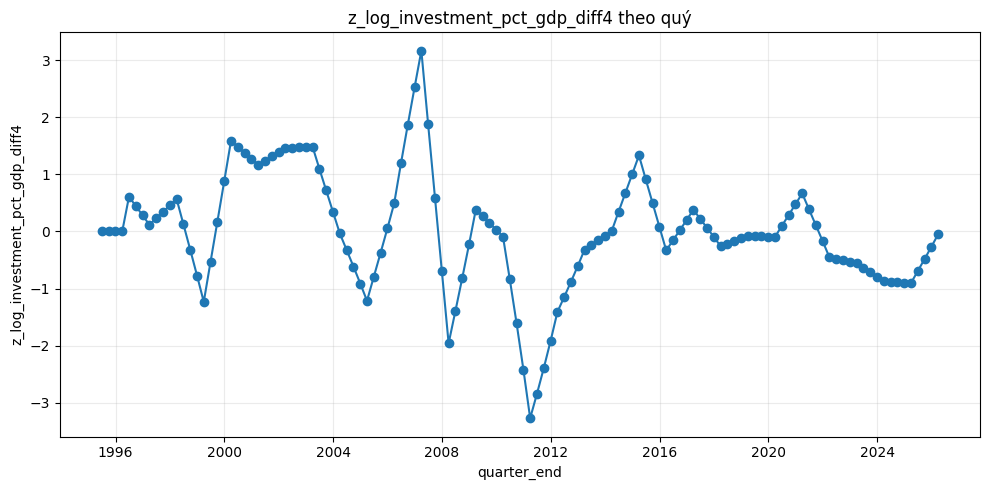

### Line plot: `z_log_investment_pct_gdp_qoq_pct`

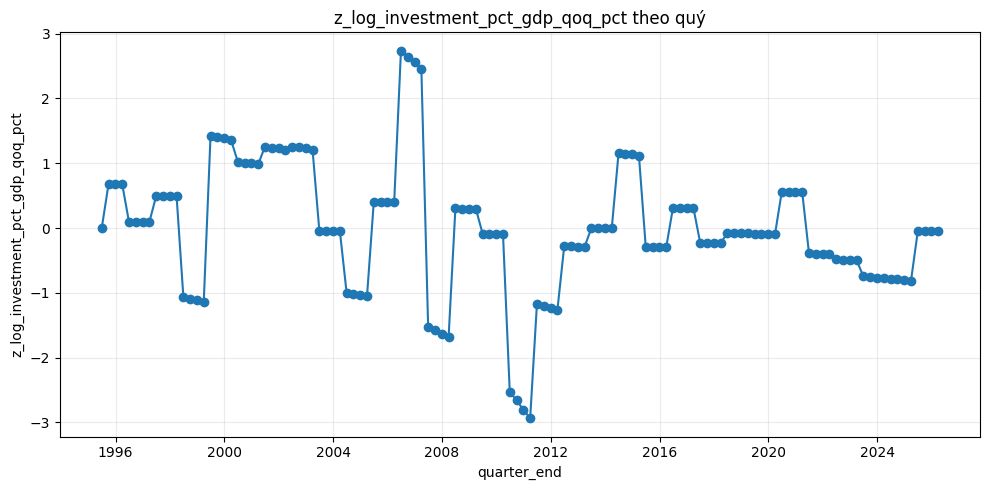

### Line plot: `z_log_investment_pct_gdp_yoy_pct`

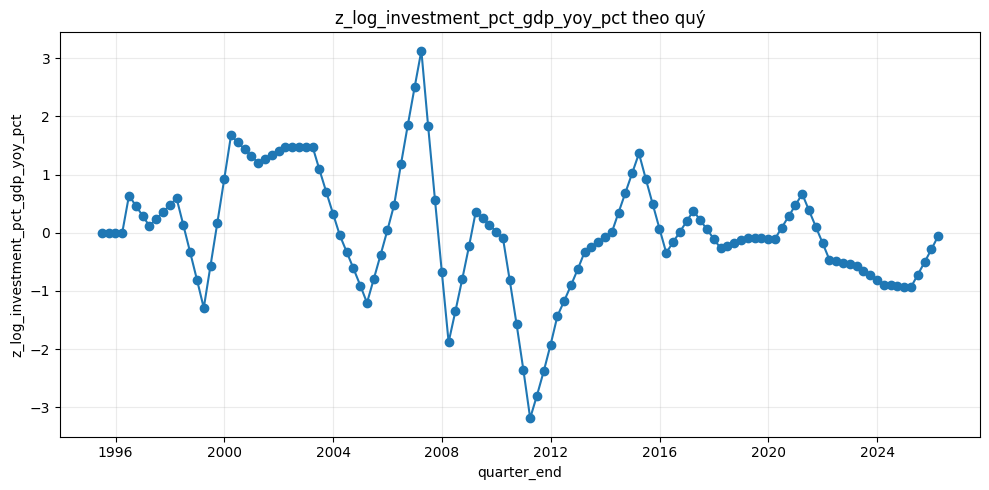

### Line plot: `z_log_log_investment_pct_gdp`

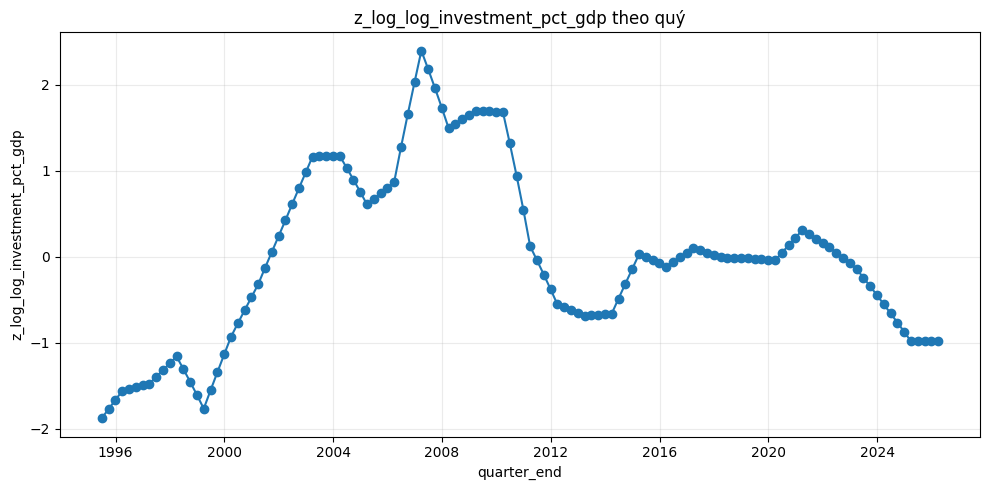

### Line plot: `z_log_export_pct_gdp_lag1`

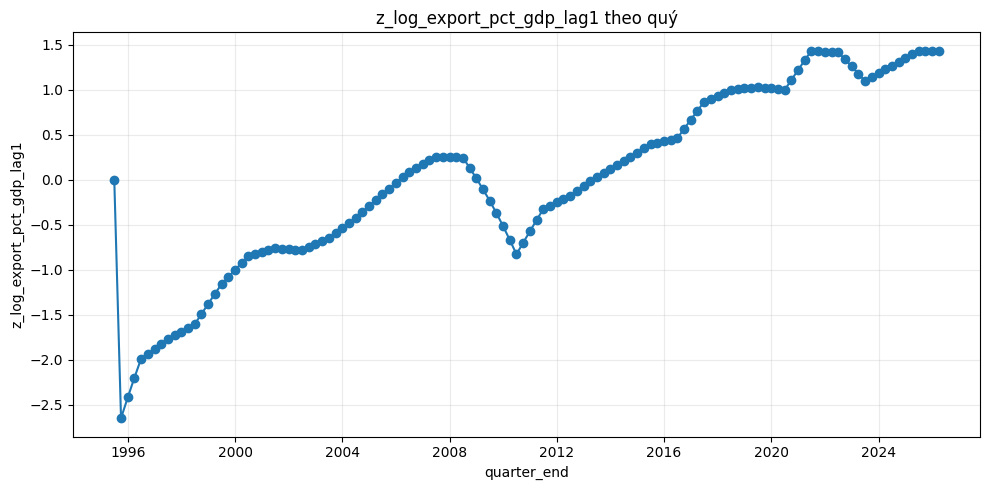

### Line plot: `z_log_export_pct_gdp_lag4`

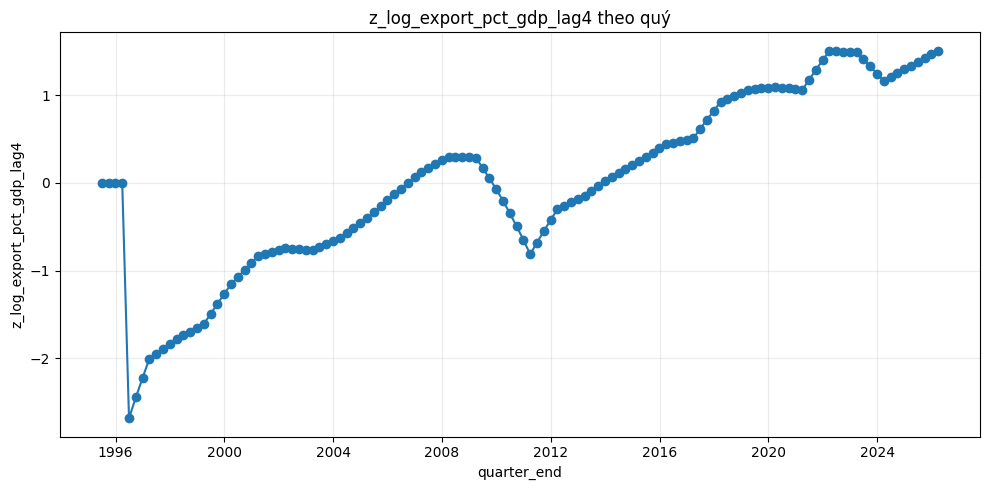

### Line plot: `z_log_export_pct_gdp_diff1`

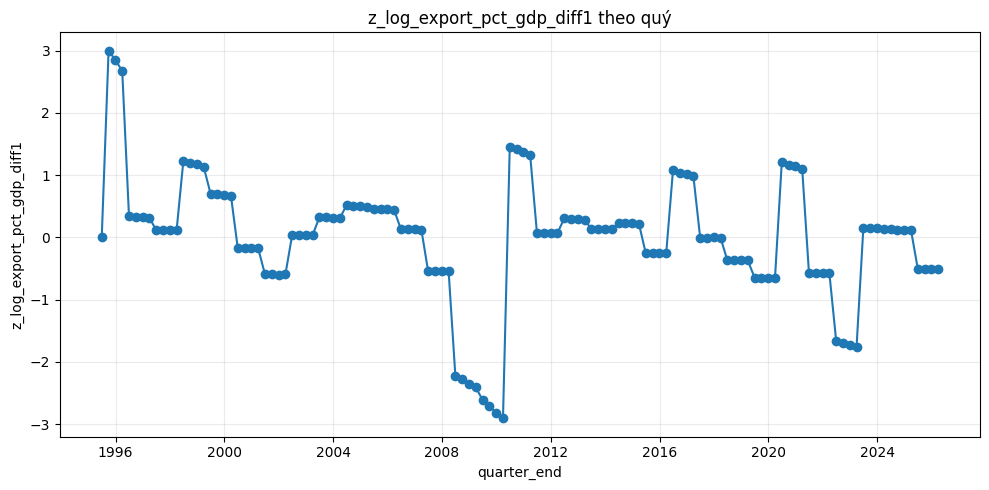

### Line plot: `z_log_export_pct_gdp_diff4`

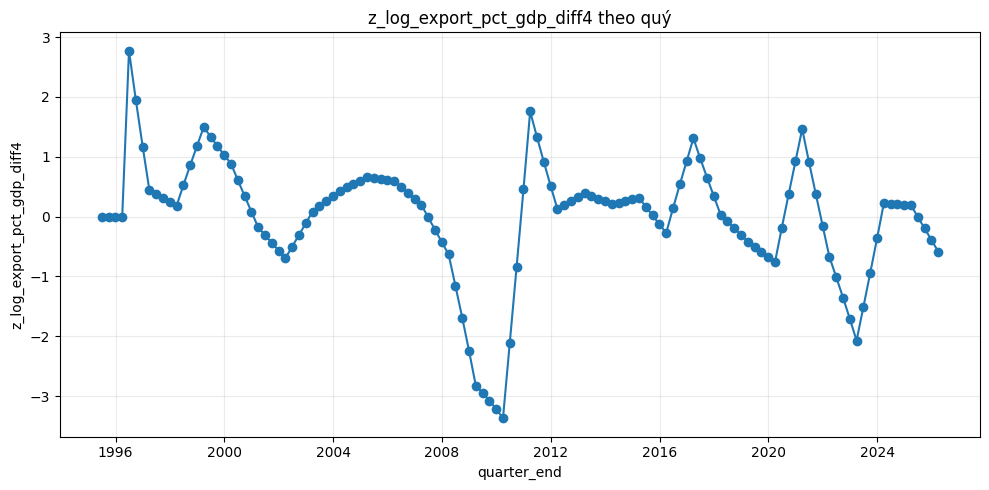

### Line plot: `z_log_export_pct_gdp_qoq_pct`

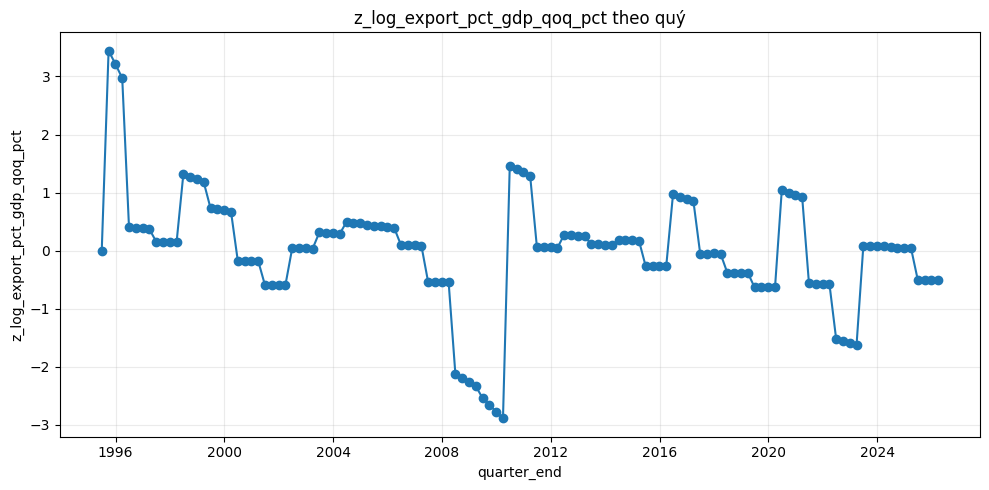

### Line plot: `z_log_export_pct_gdp_yoy_pct`

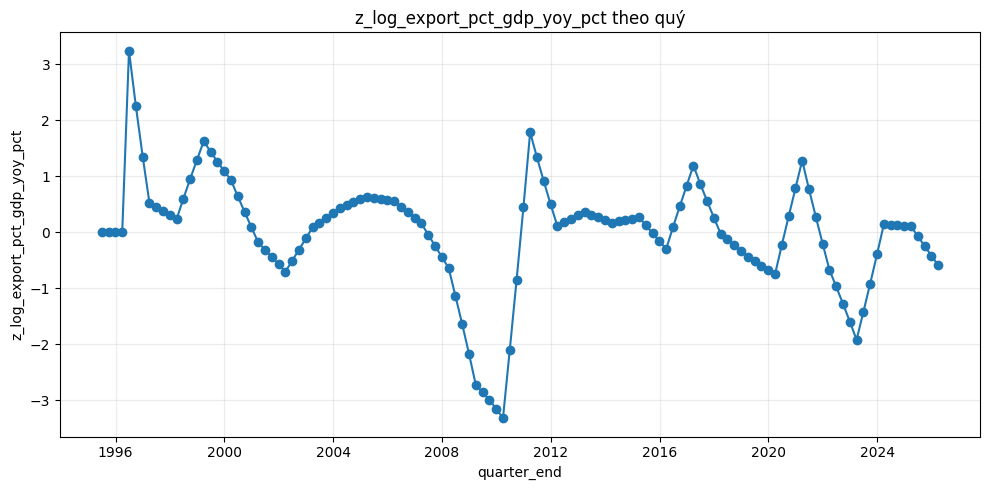

### Line plot: `z_log_log_export_pct_gdp`

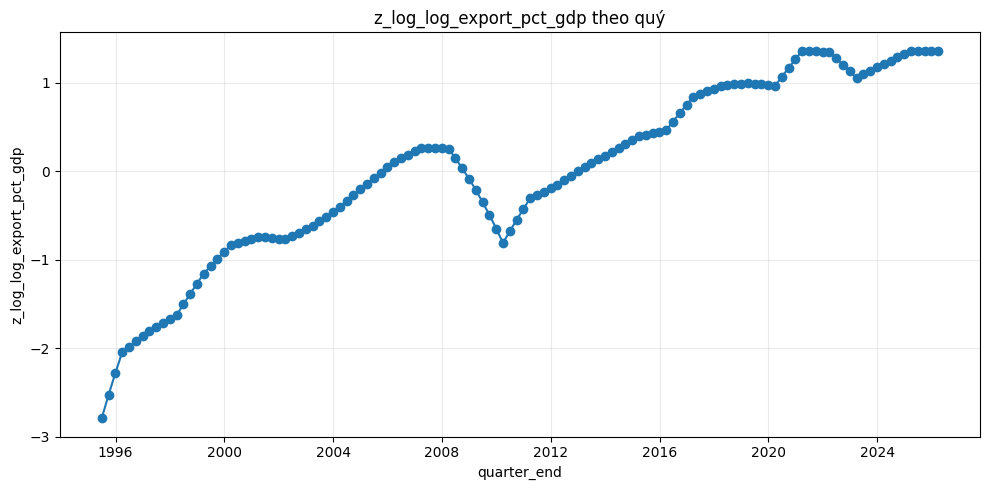

### Line plot: `z_log_gov_spending_pct_gdp_lag1`

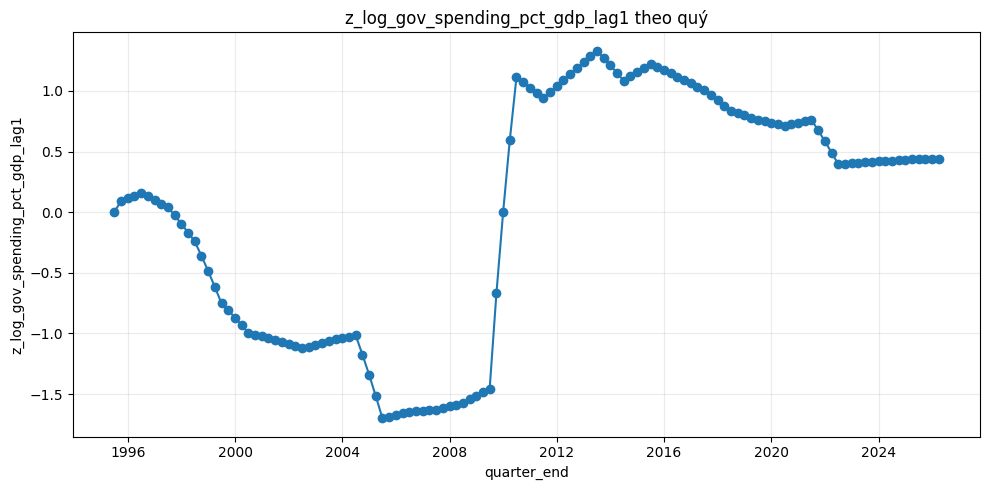

### Line plot: `z_log_gov_spending_pct_gdp_lag4`

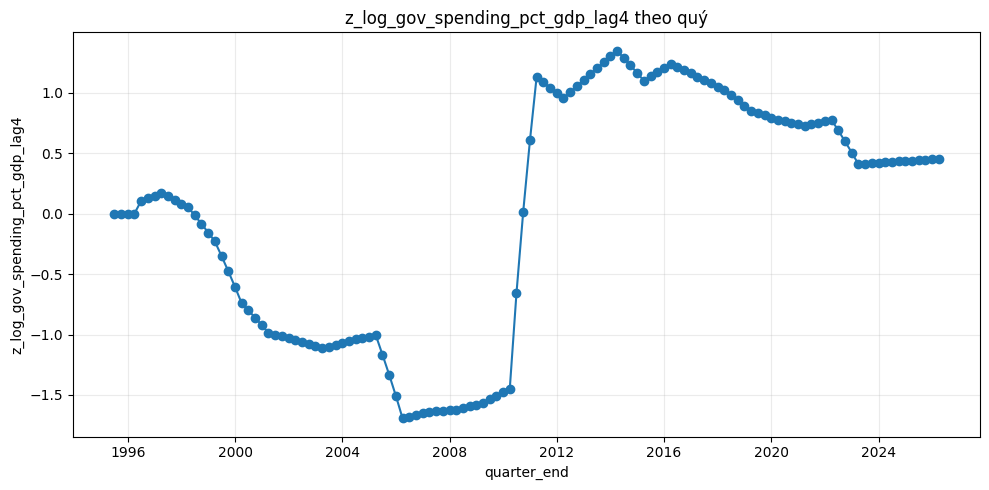

### Line plot: `z_log_gov_spending_pct_gdp_diff1`

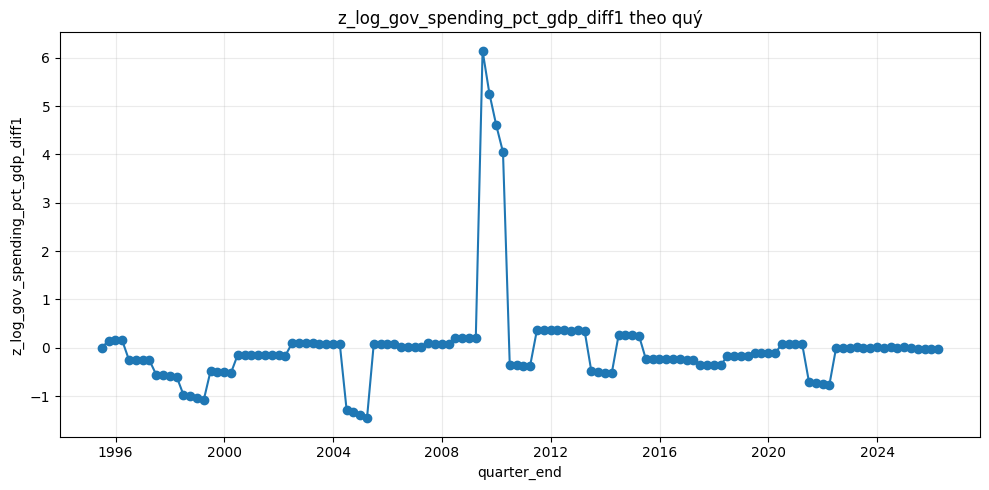

### Line plot: `z_log_gov_spending_pct_gdp_diff4`

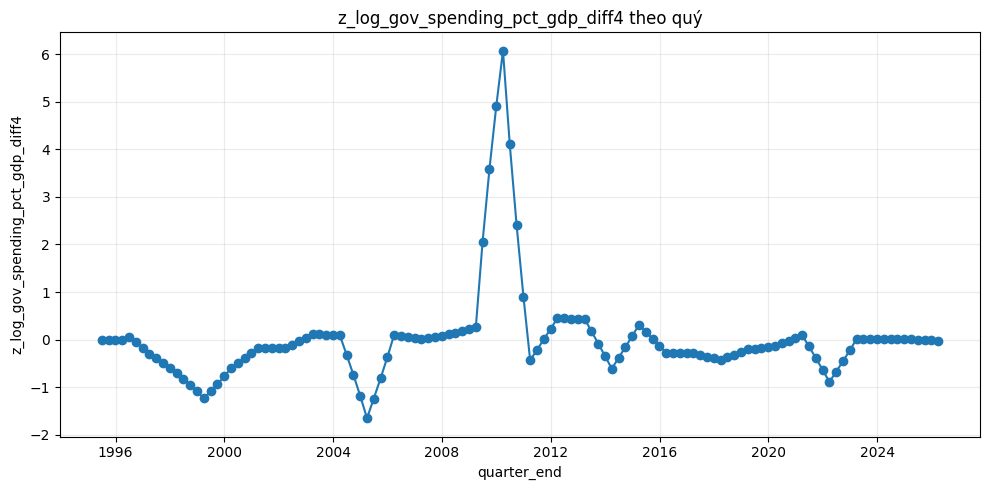

### Line plot: `z_log_gov_spending_pct_gdp_qoq_pct`

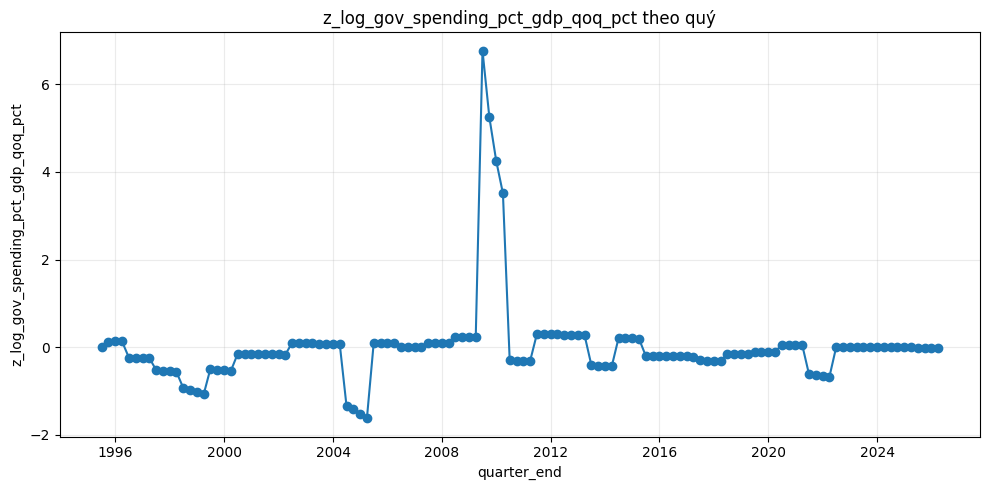

### Line plot: `z_log_gov_spending_pct_gdp_yoy_pct`

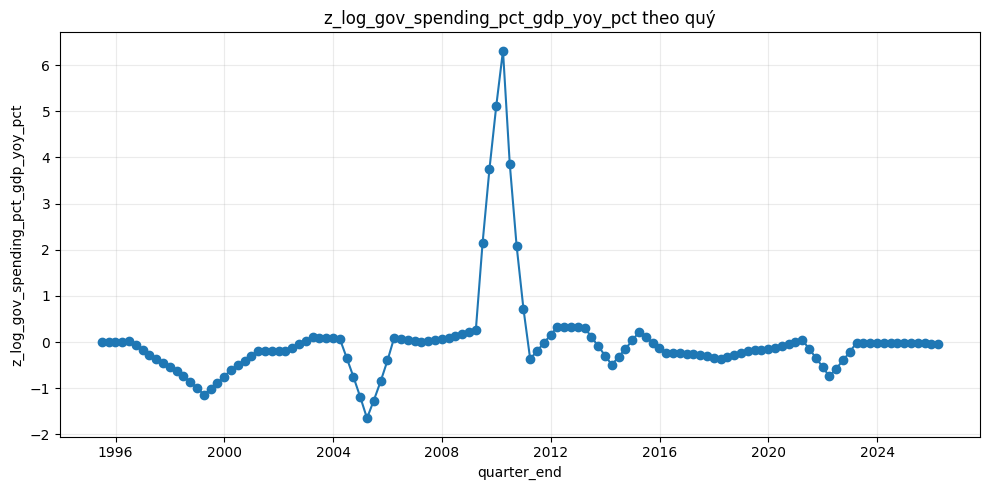

### Line plot: `z_log_log_gov_spending_pct_gdp`

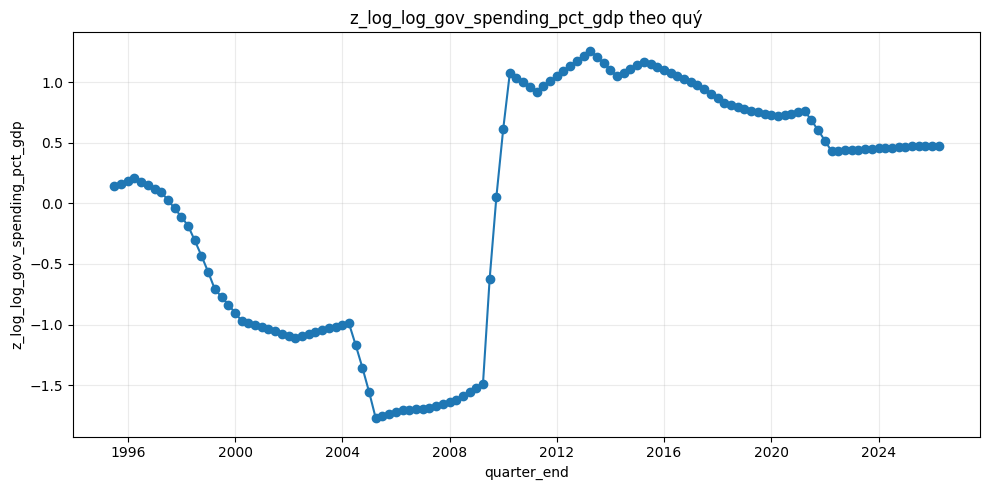

### Line plot: `z_real_interest_rate_lag1`

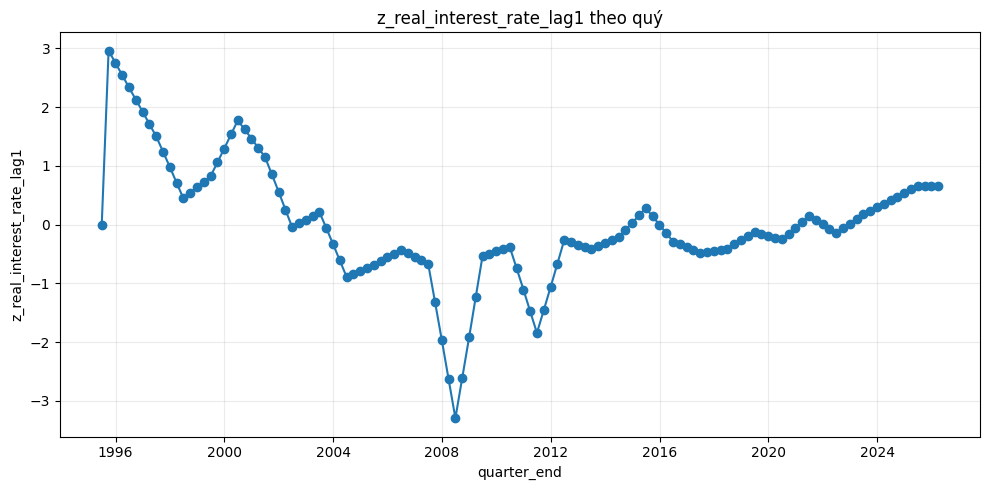

### Line plot: `z_real_interest_rate_lag4`

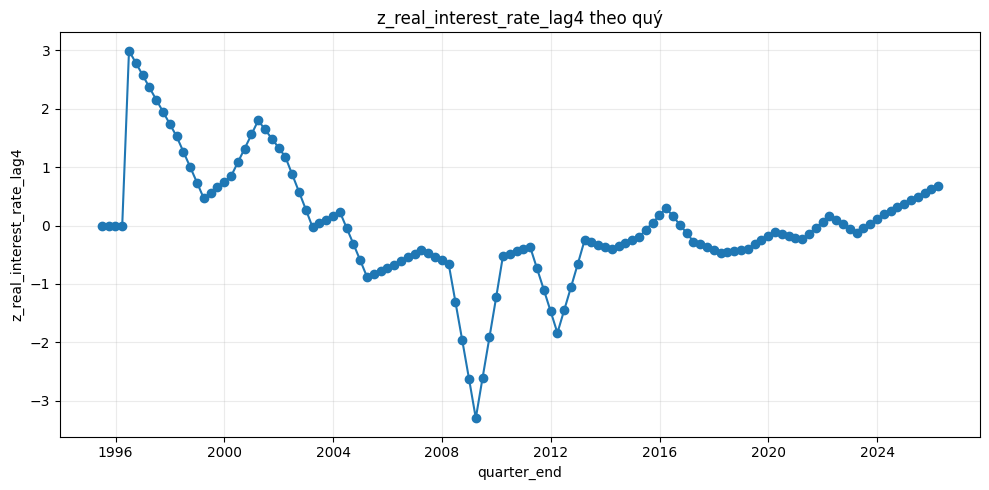

### Line plot: `z_real_interest_rate_diff1`

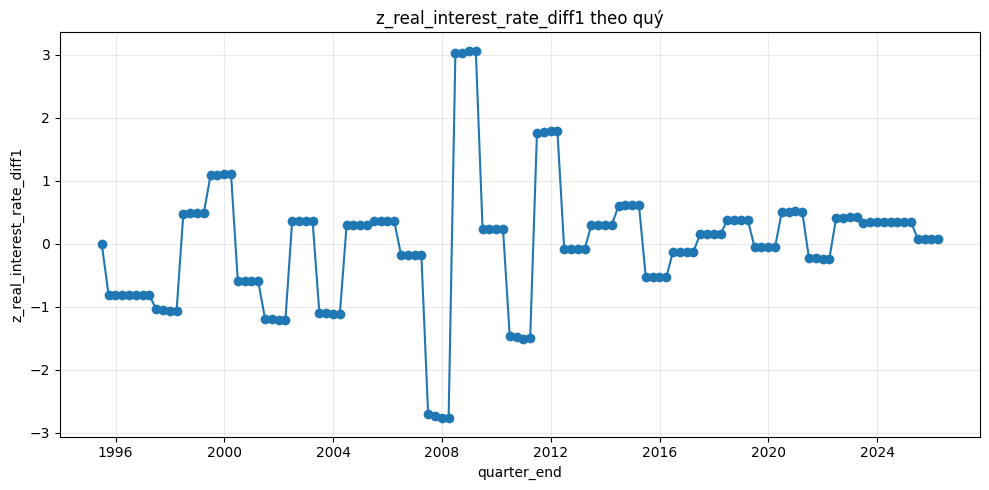

### Line plot: `z_real_interest_rate_diff4`

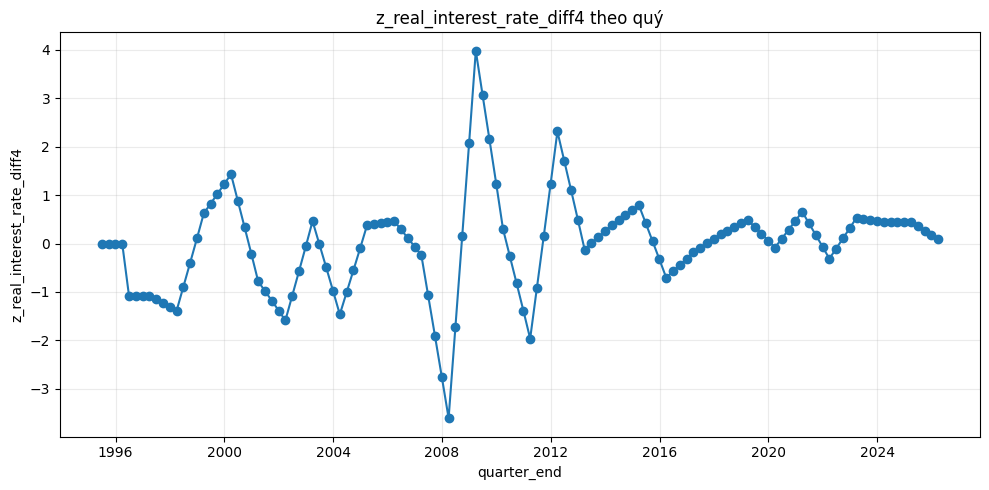

### Line plot: `z_n_comments_lag1`

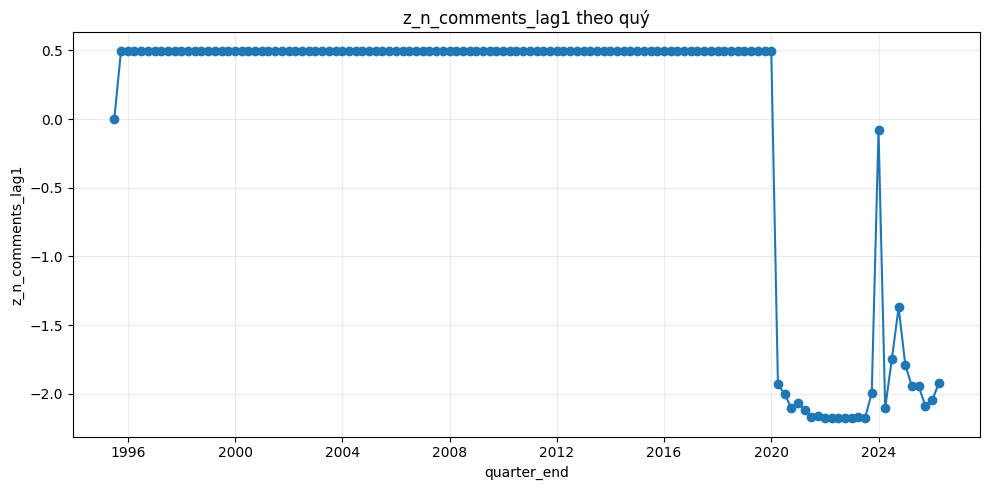

### Line plot: `z_n_comments_lag4`

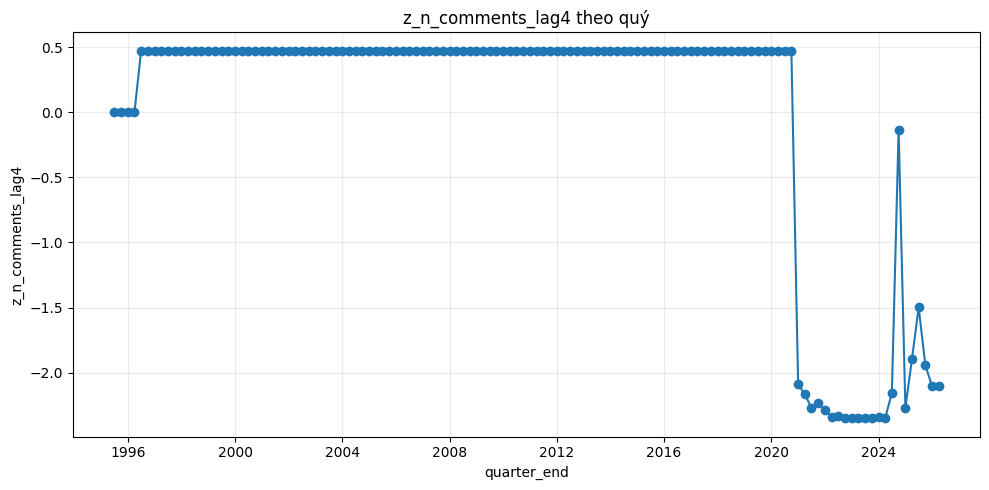

### Line plot: `z_n_comments_diff1`

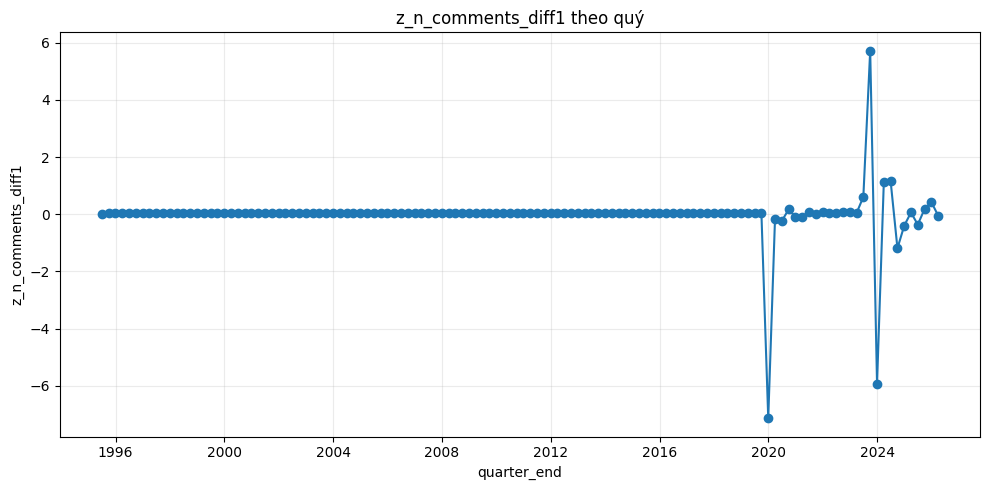

### Line plot: `z_n_comments_diff4`

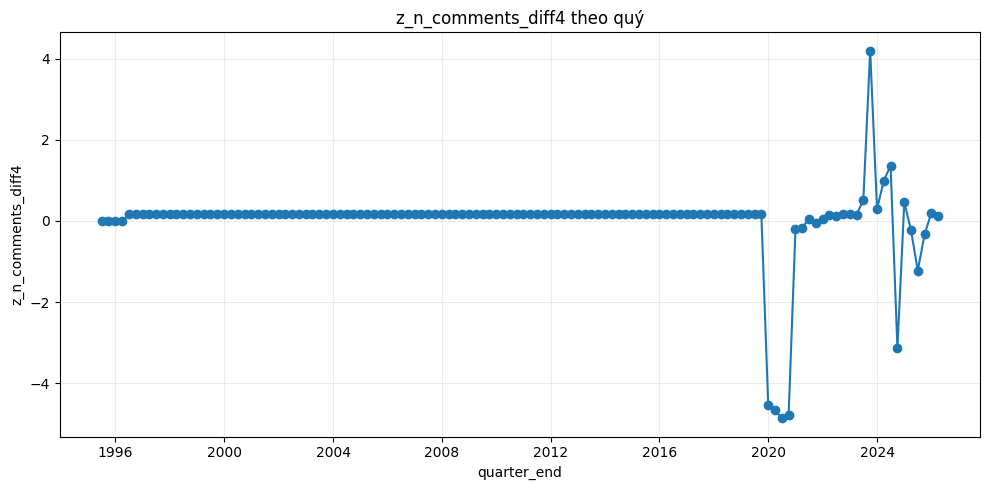

### Line plot: `z_n_comments_qoq_pct`

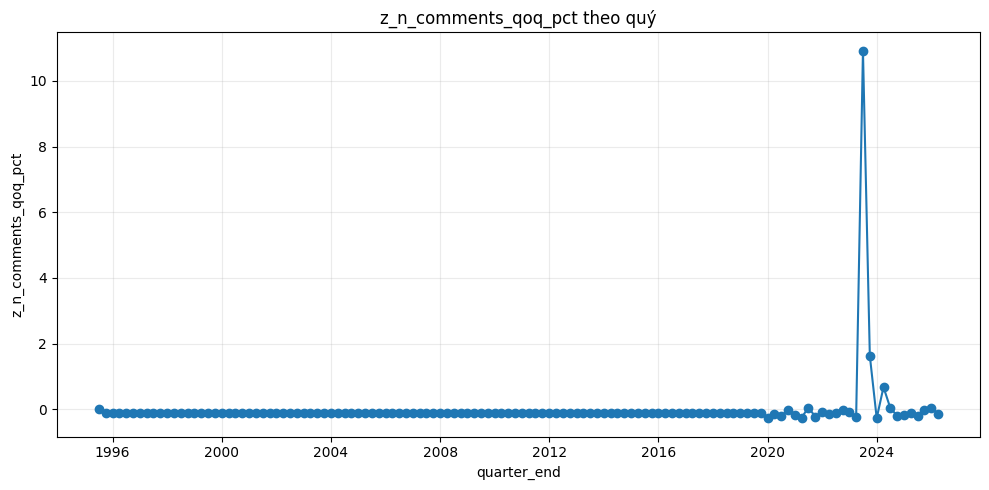

### Line plot: `z_n_comments_yoy_pct`

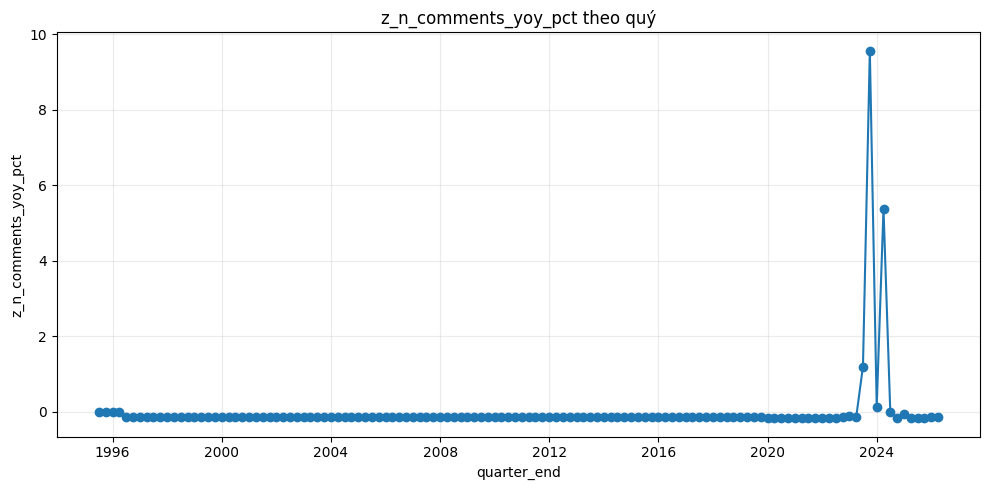

### Line plot: `z_n_unique_authors_lag1`

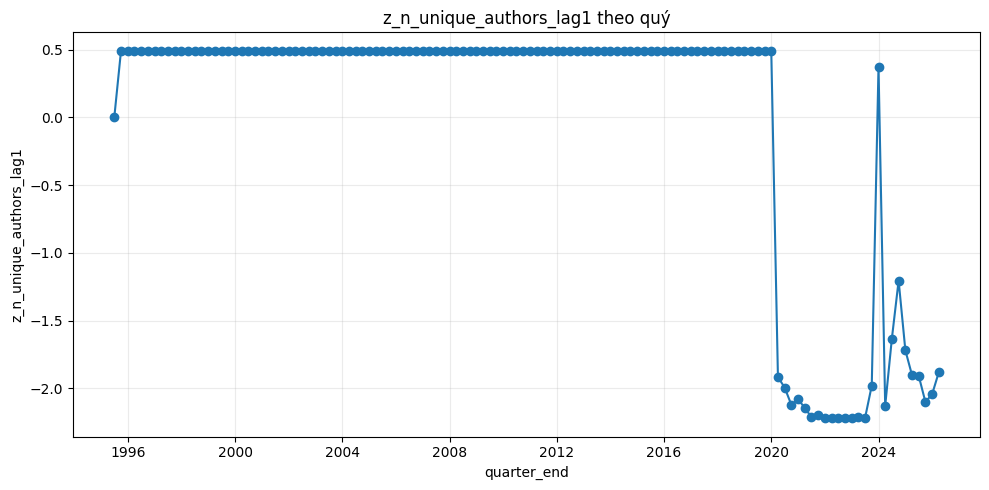

### Line plot: `z_n_unique_authors_lag4`

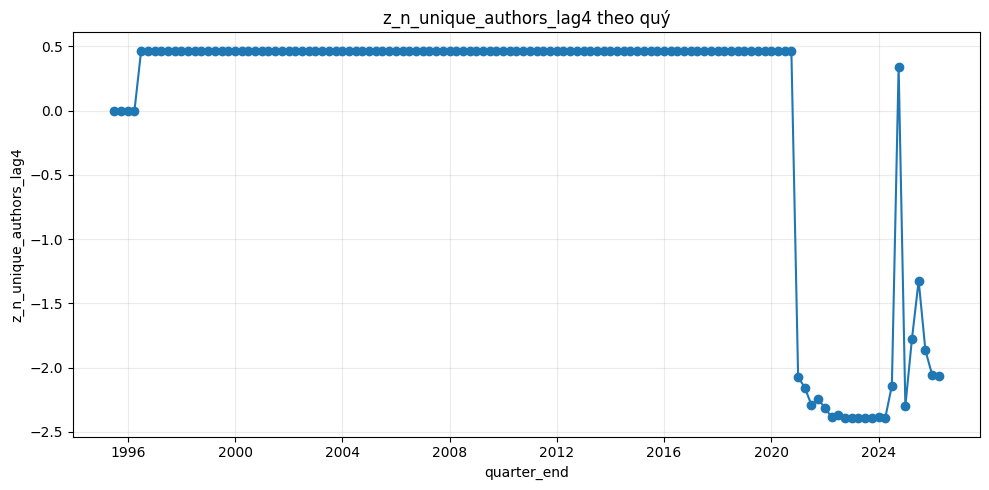

### Line plot: `z_n_unique_authors_diff1`

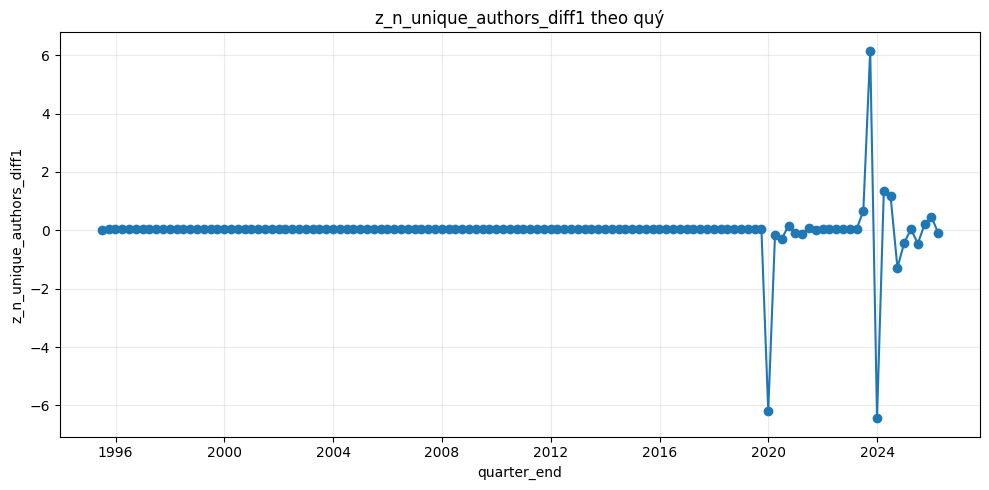

### Line plot: `z_n_unique_authors_diff4`

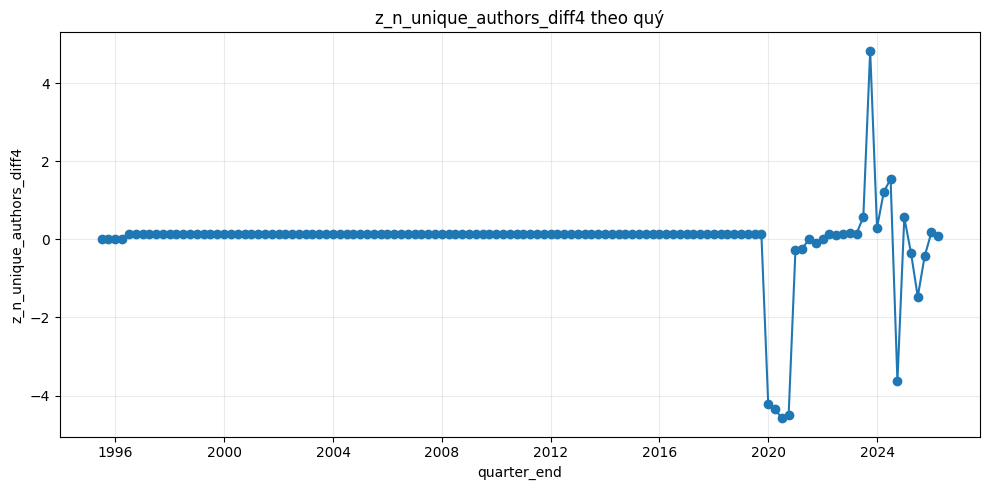

### Line plot: `z_n_unique_authors_qoq_pct`

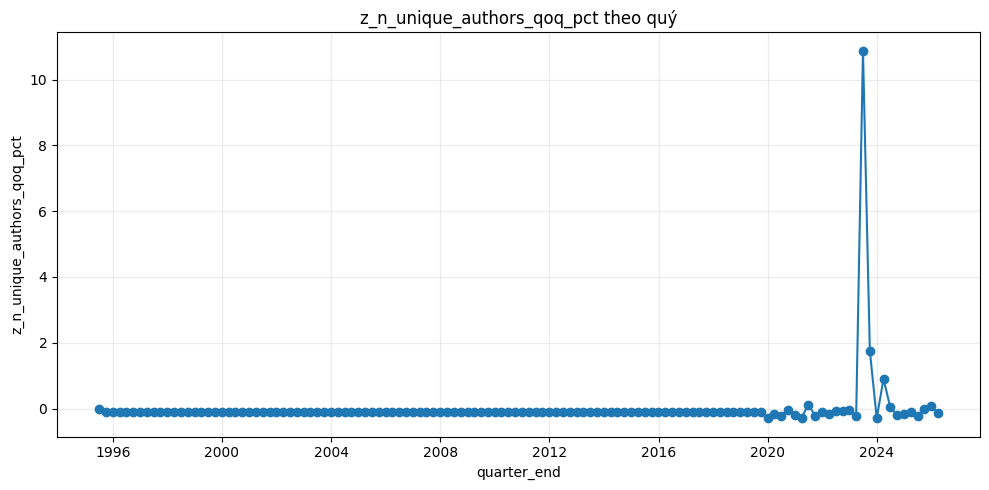

### Line plot: `z_n_unique_authors_yoy_pct`

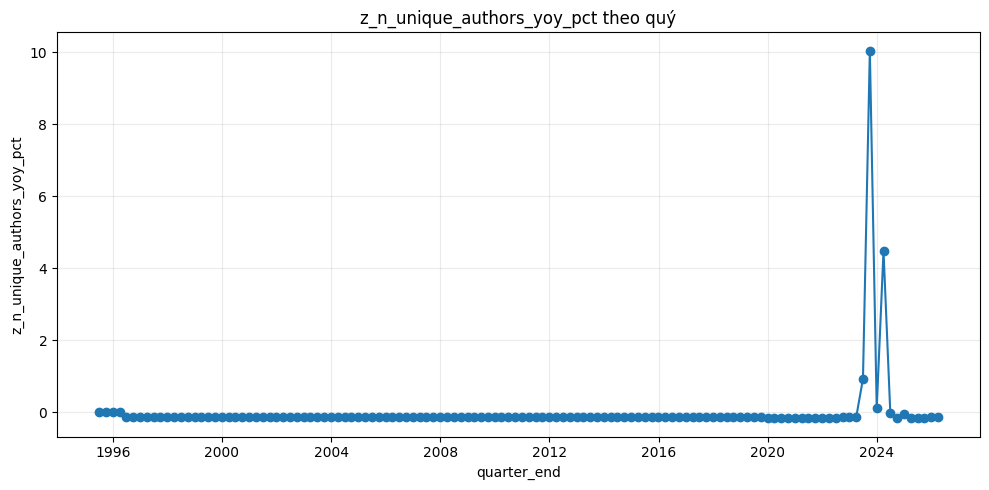

### Line plot: `z_like_sum_lag1`

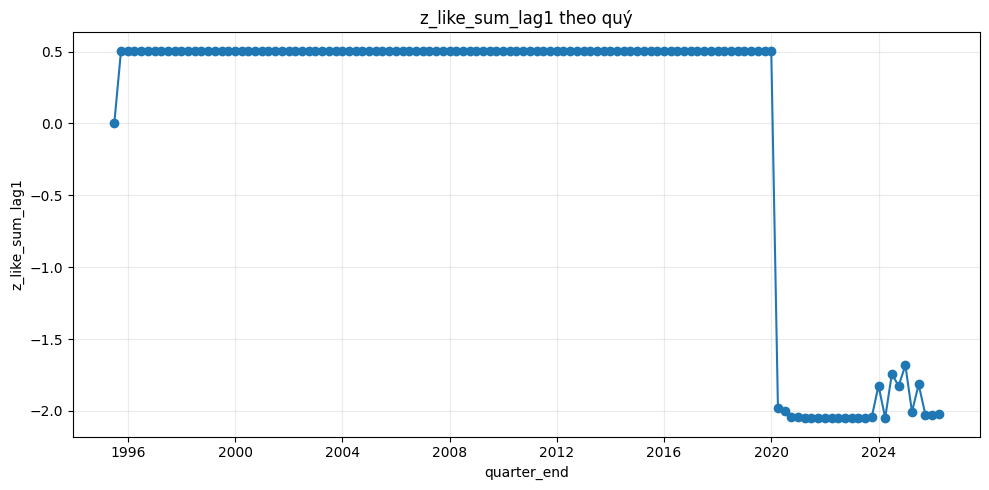

### Line plot: `z_like_sum_lag4`

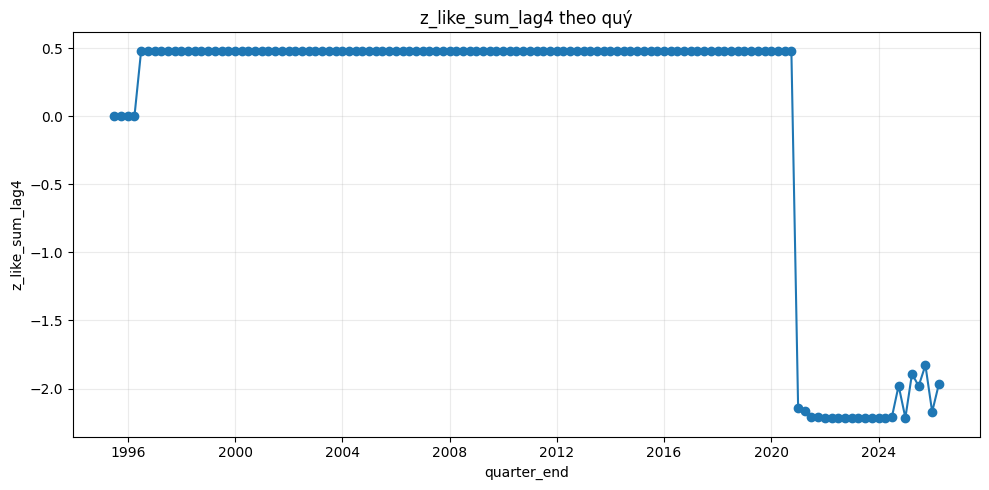

### Line plot: `z_like_sum_diff1`

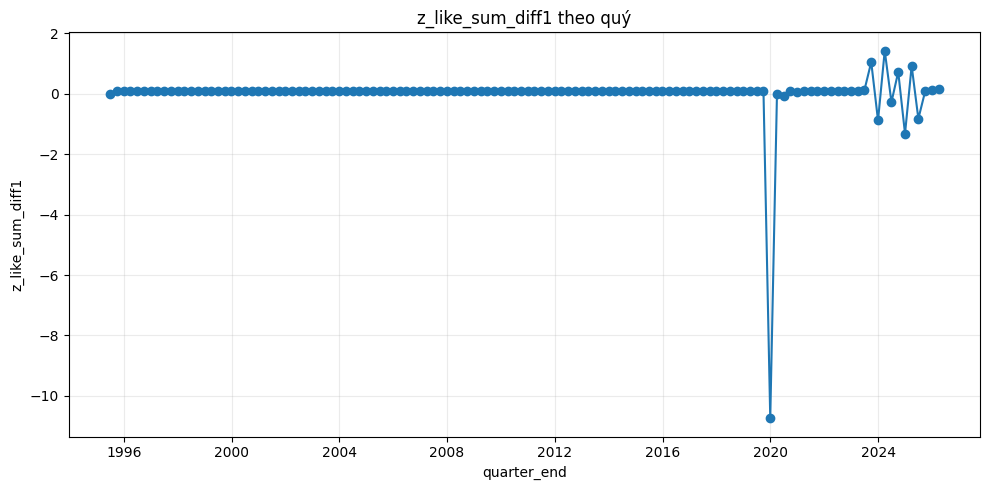

### Line plot: `z_like_sum_diff4`

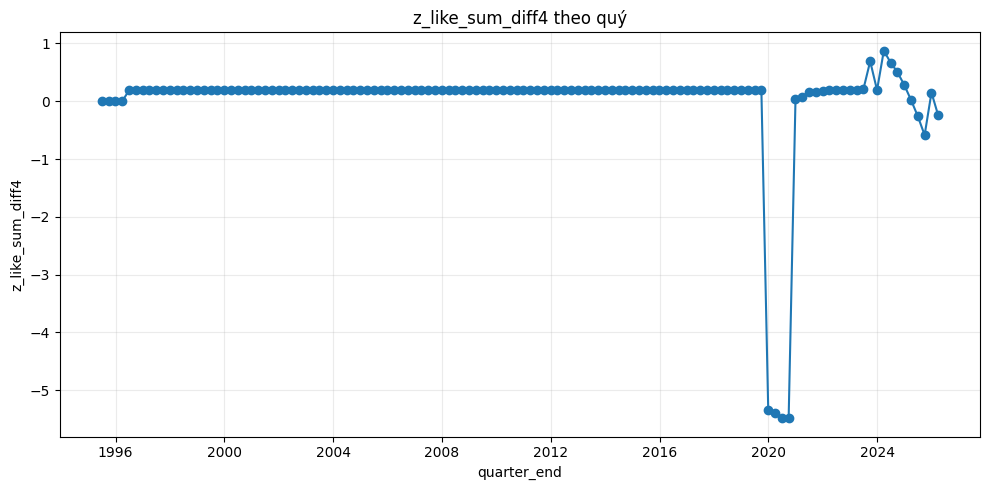

### Line plot: `z_like_mean_lag1`

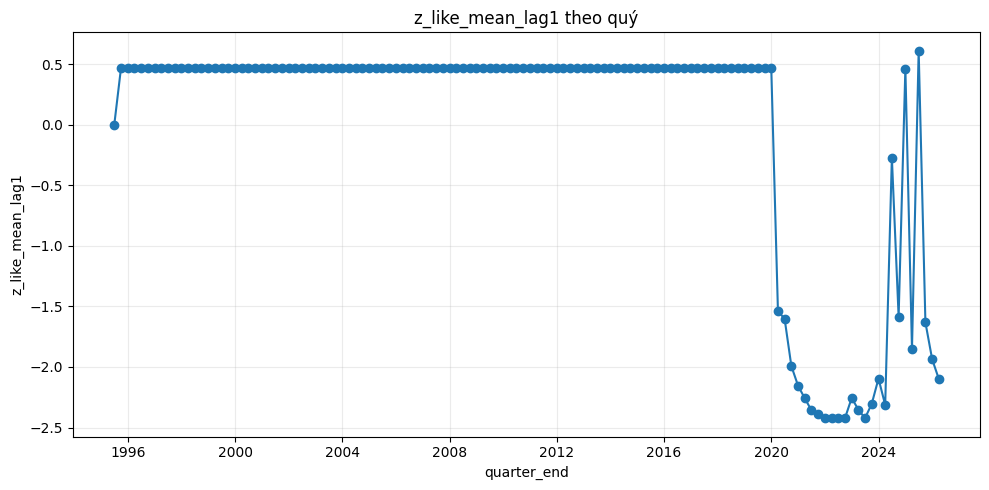

### Line plot: `z_like_mean_lag4`

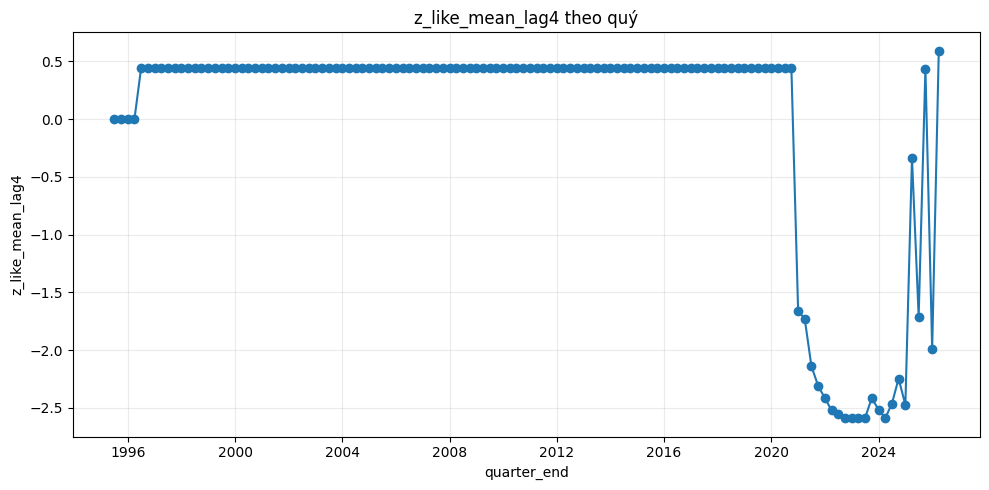

### Line plot: `z_like_mean_diff1`

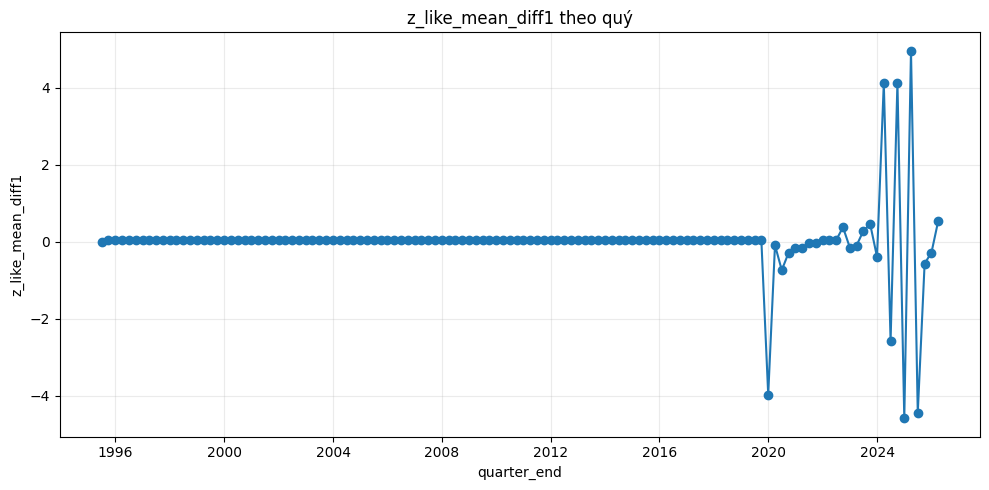

### Line plot: `z_like_mean_diff4`

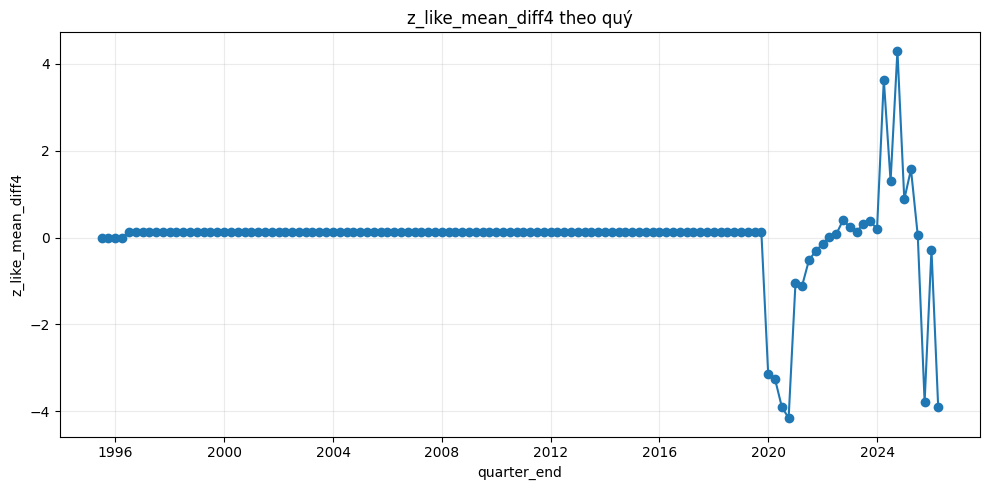

### Line plot: `z_avg_sentiment_lag1`

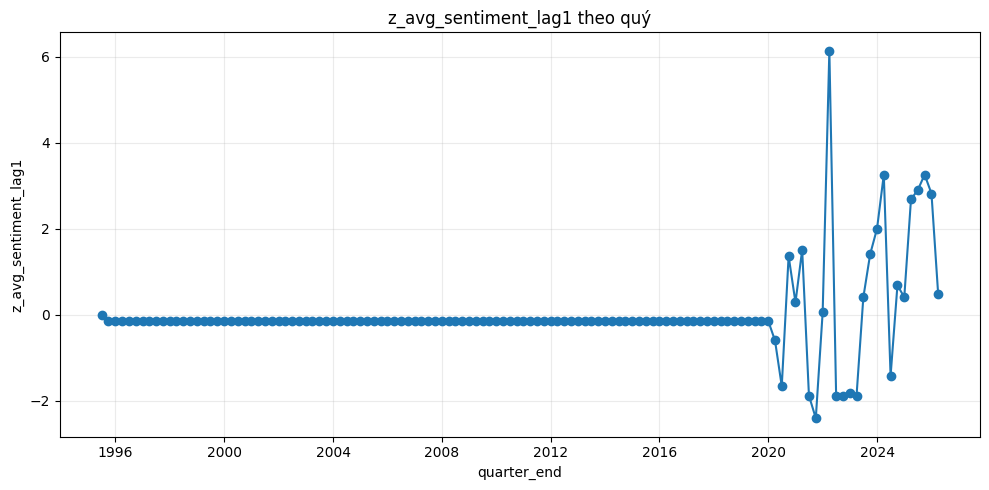

### Line plot: `z_avg_sentiment_lag4`

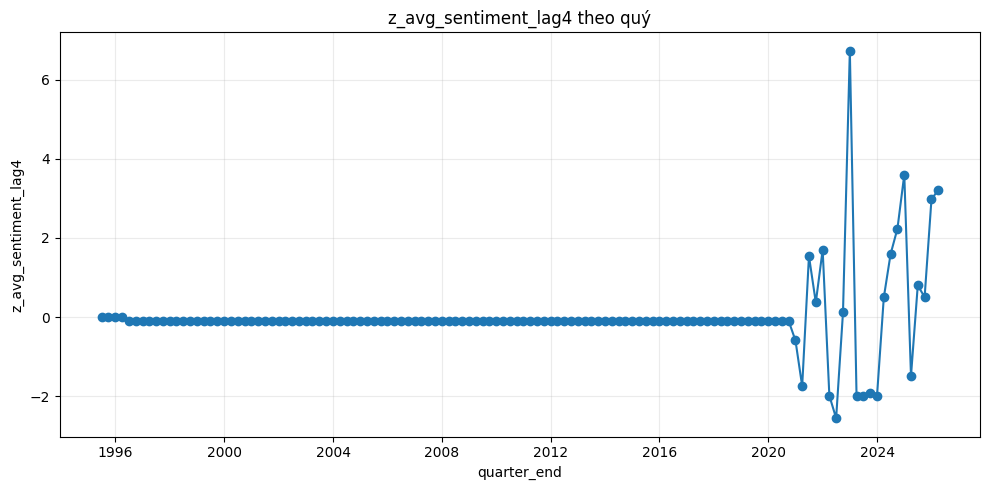

### Line plot: `z_avg_sentiment_diff1`

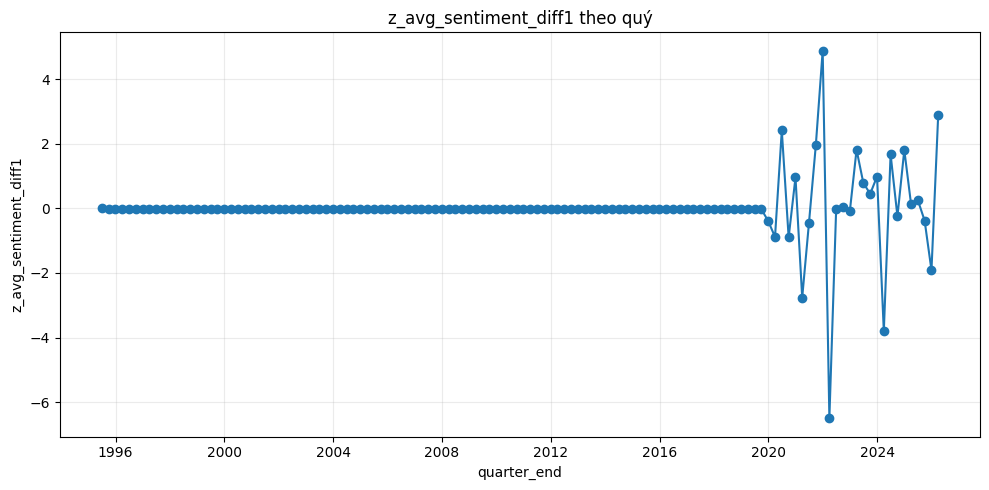

### Line plot: `z_avg_sentiment_diff4`

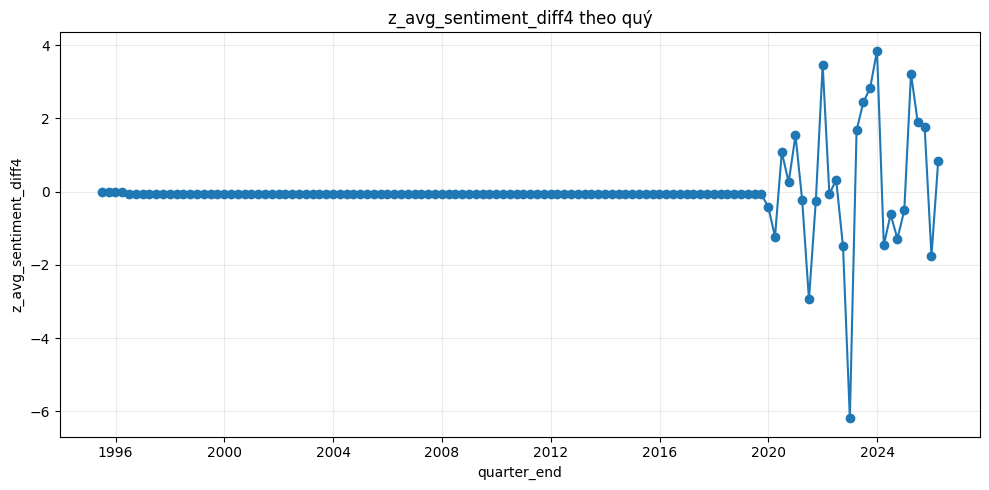

### Line plot: `z_median_sentiment_lag1`

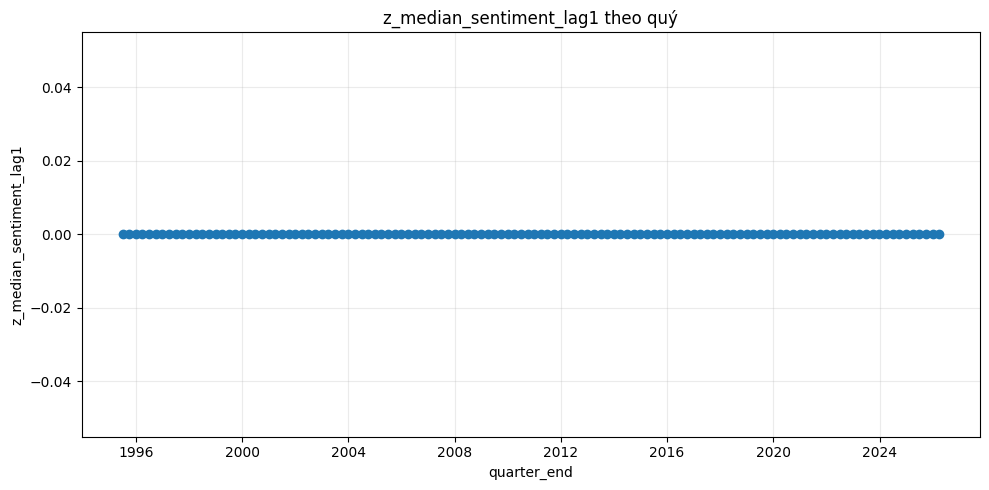

### Line plot: `z_median_sentiment_lag4`

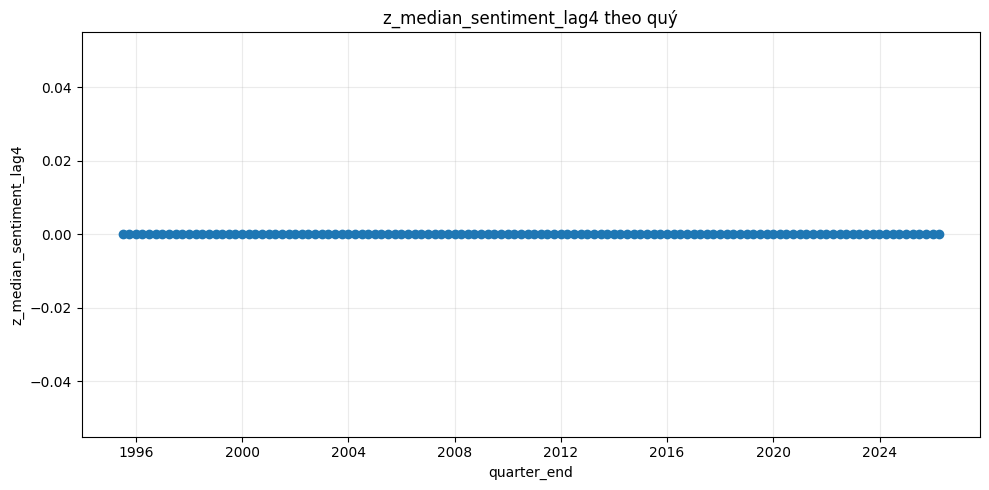

### Line plot: `z_median_sentiment_diff1`

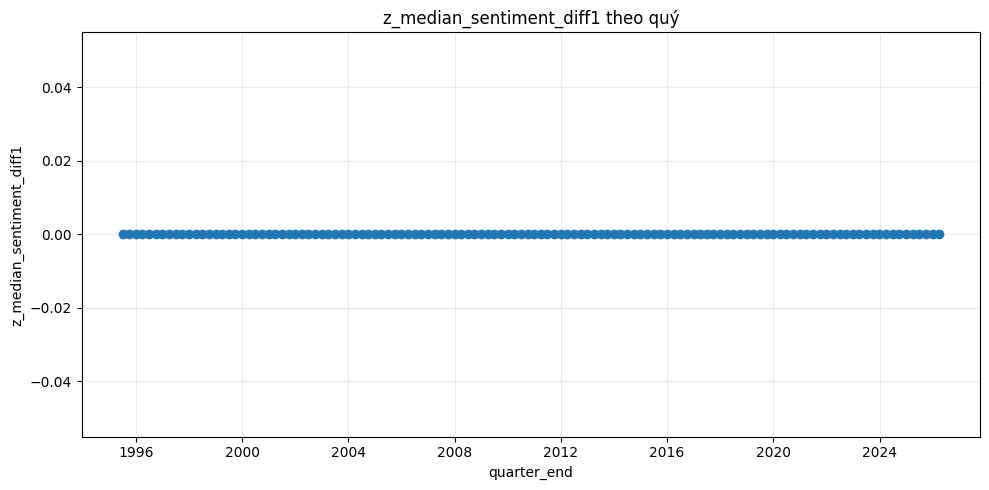

### Line plot: `z_median_sentiment_diff4`

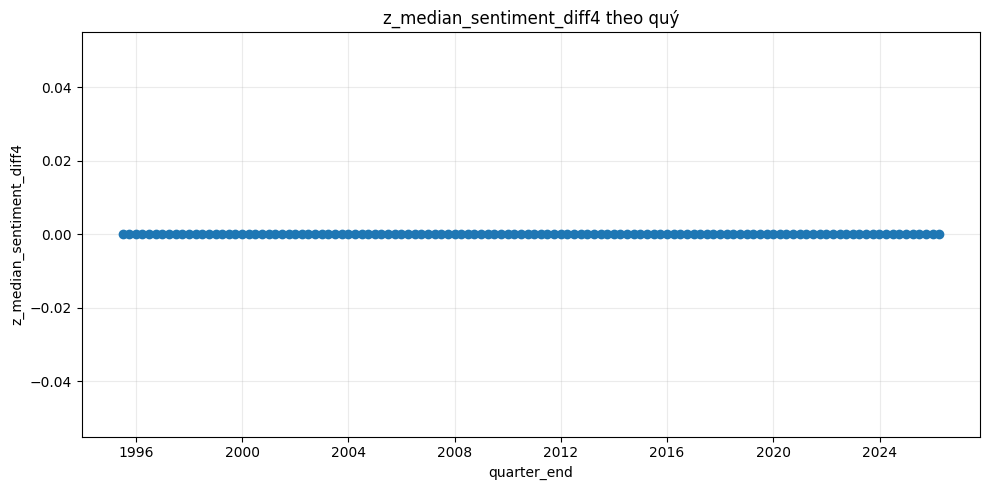

### Line plot: `z_std_sentiment_lag1`

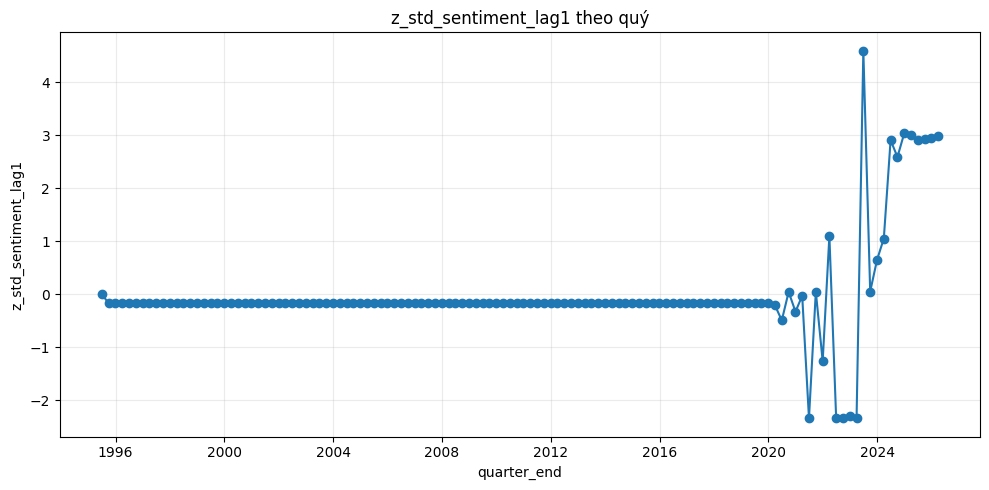

### Line plot: `z_std_sentiment_lag4`

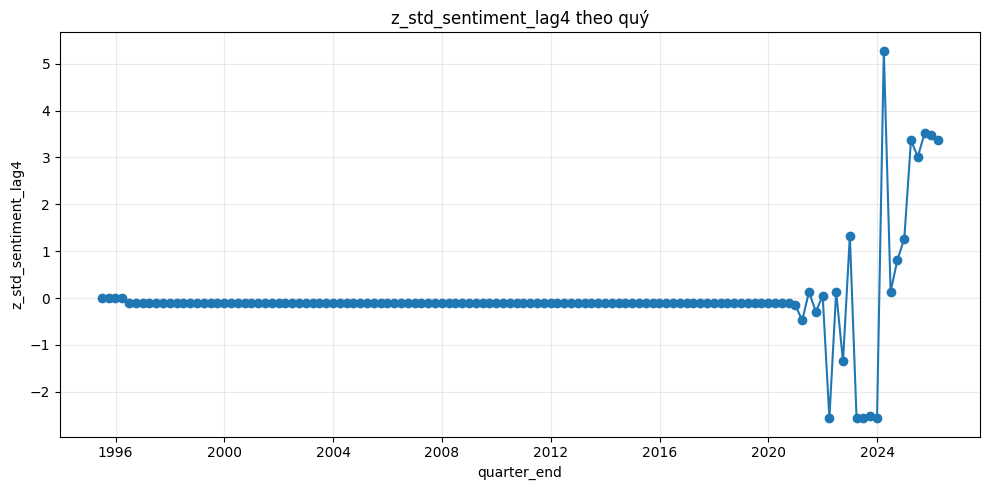

### Line plot: `z_std_sentiment_diff1`

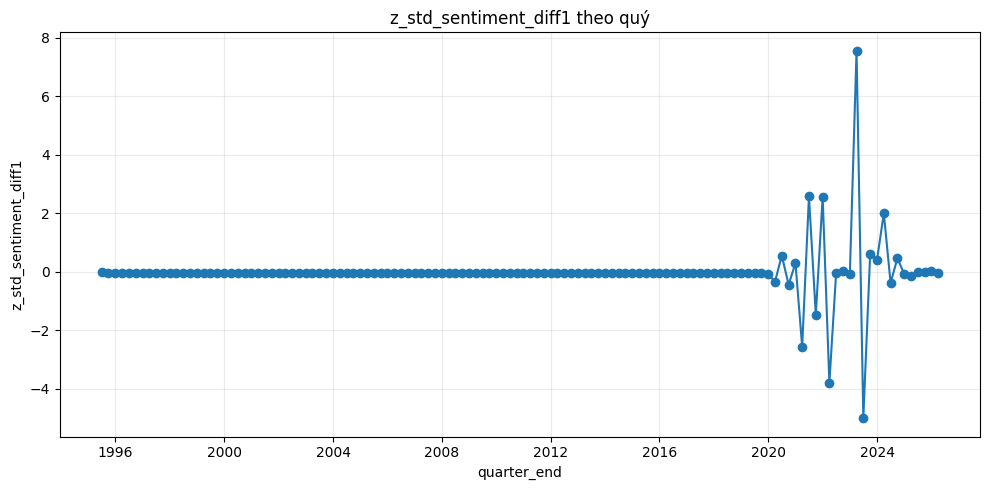

### Line plot: `z_std_sentiment_diff4`

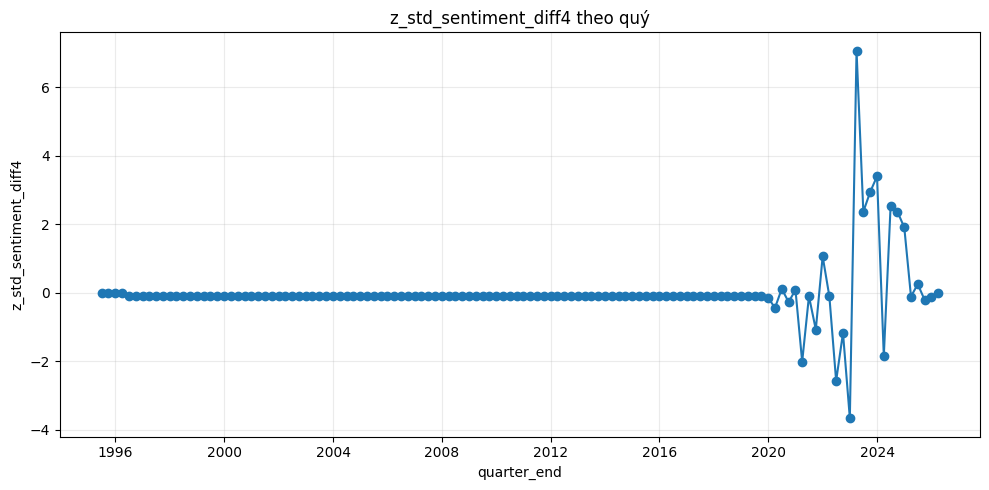

### Line plot: `z_positive_ratio_lag1`

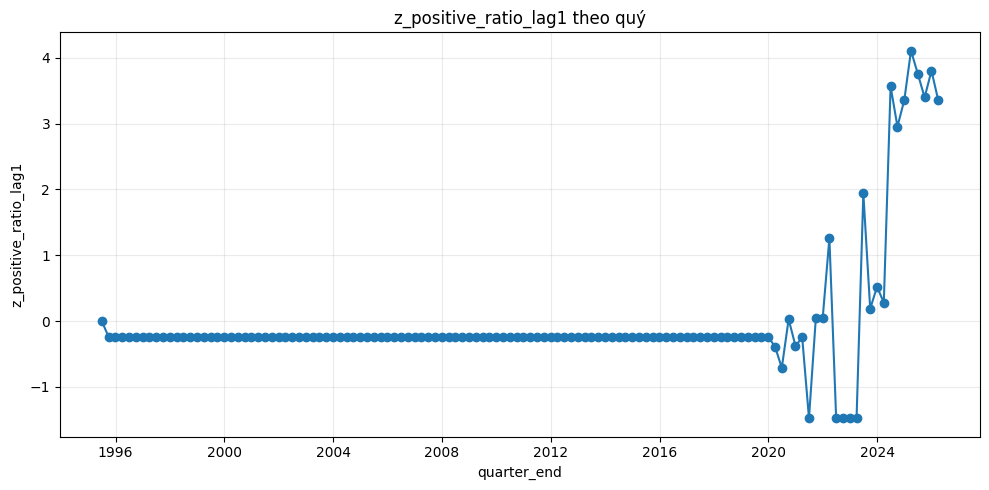

### Line plot: `z_positive_ratio_lag4`

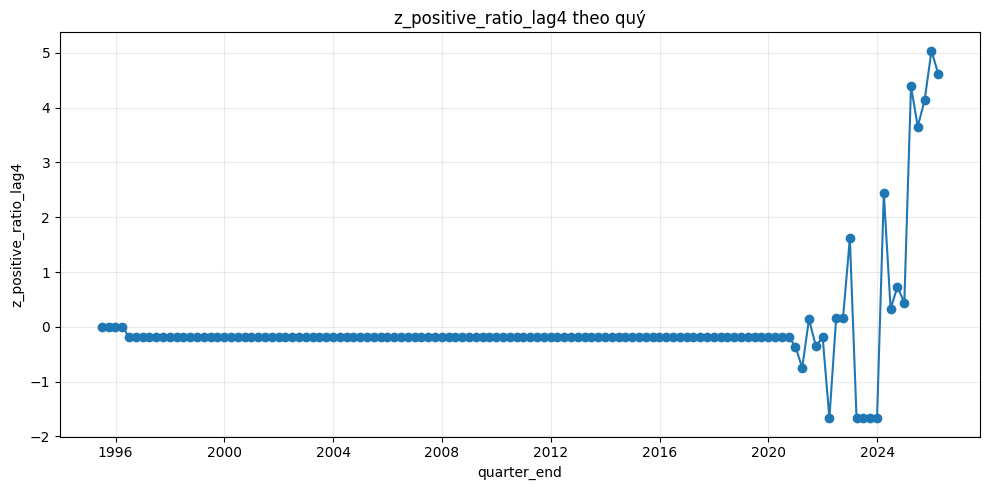

### Line plot: `z_positive_ratio_diff1`

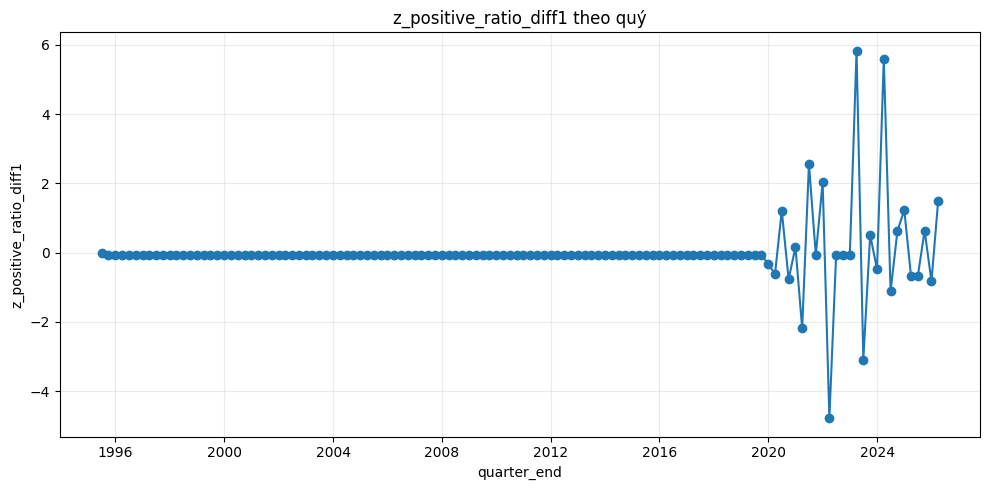

### Line plot: `z_positive_ratio_diff4`

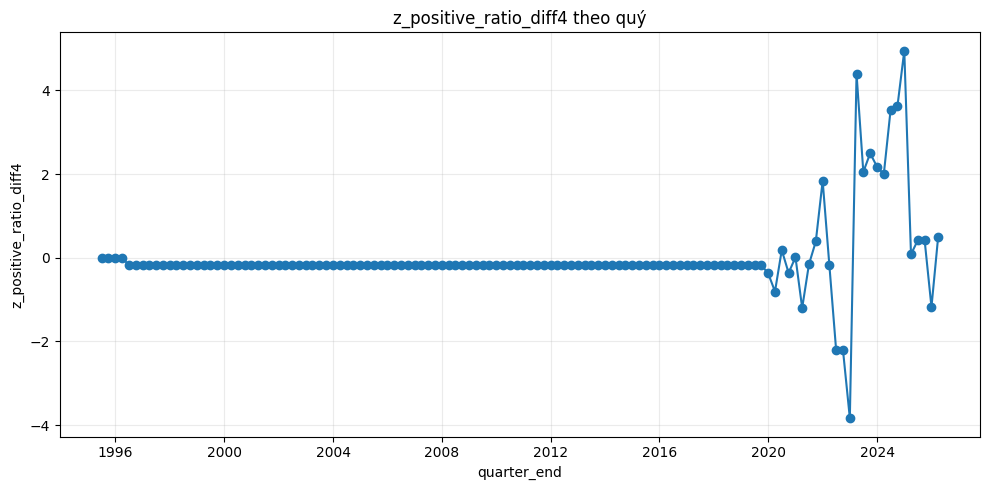

### Line plot: `z_negative_ratio_lag1`

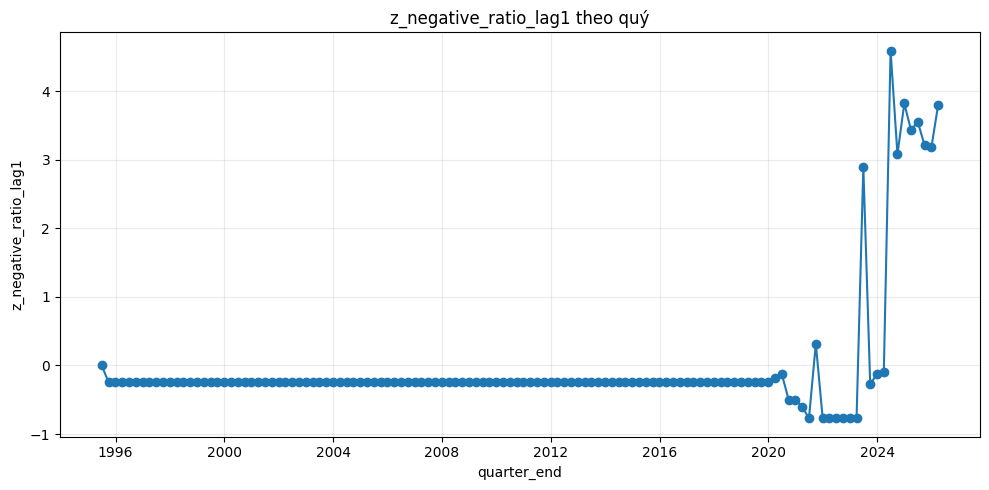

### Line plot: `z_negative_ratio_lag4`

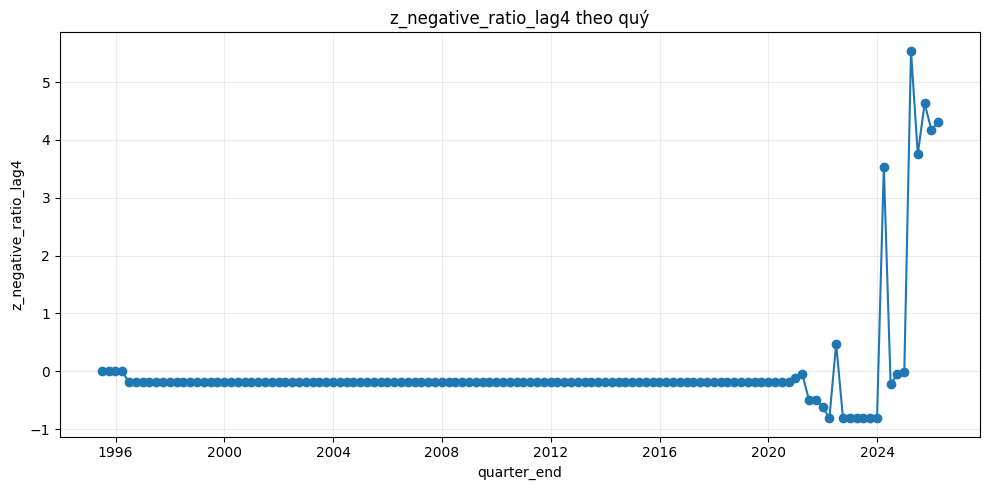

### Line plot: `z_negative_ratio_diff1`

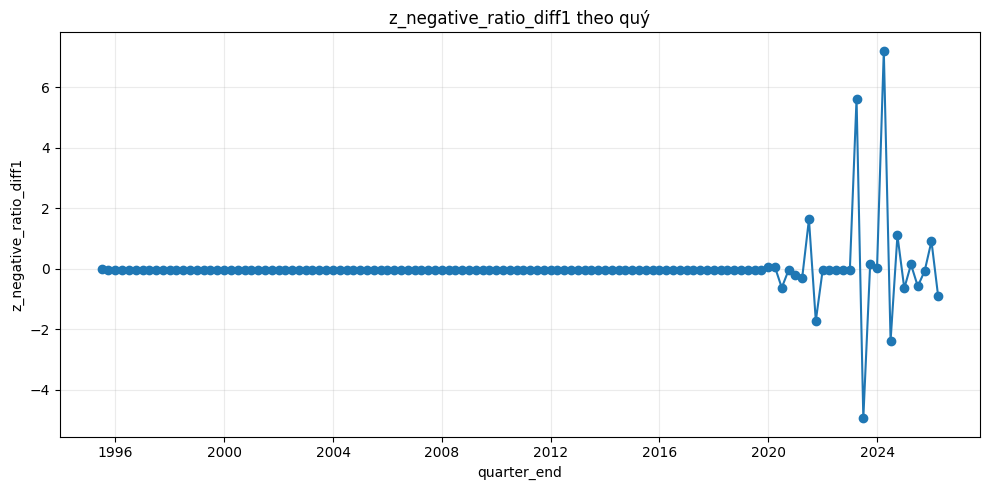

### Line plot: `z_negative_ratio_diff4`

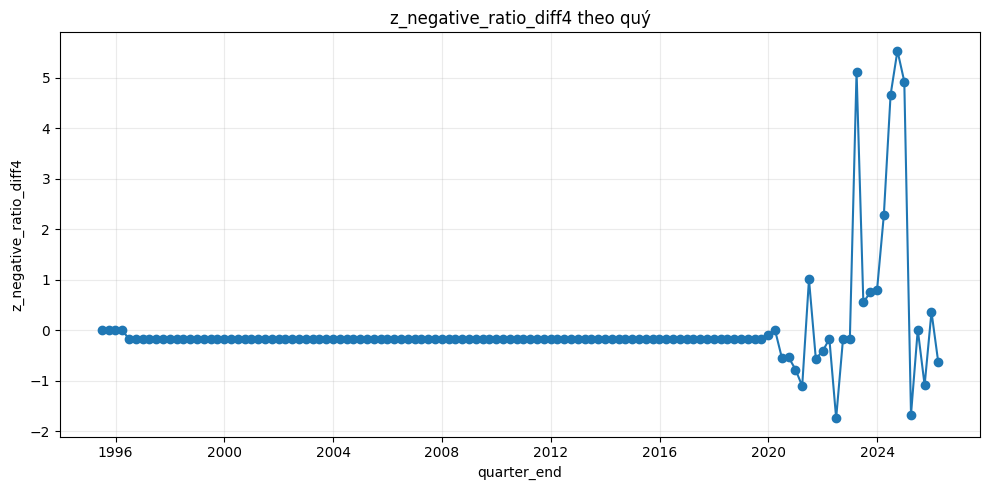

### Line plot: `z_neutral_ratio_lag1`

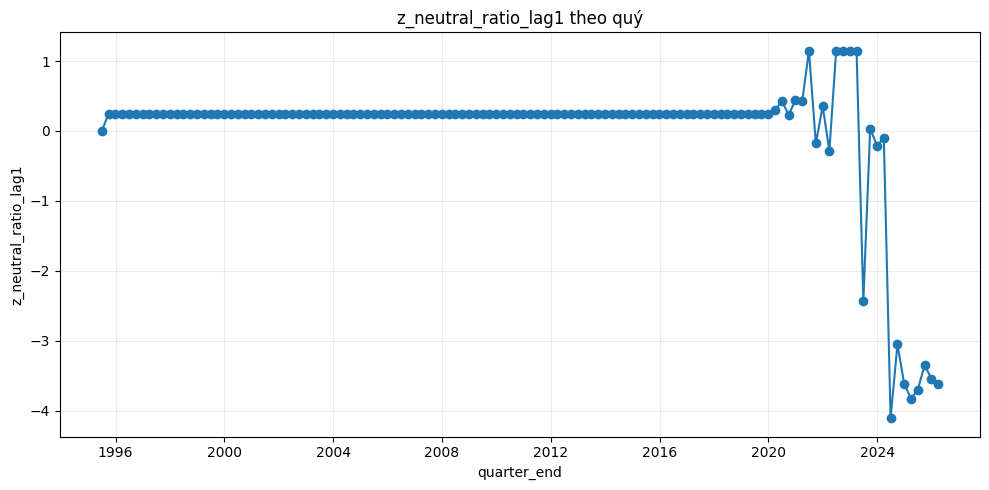

### Line plot: `z_neutral_ratio_lag4`

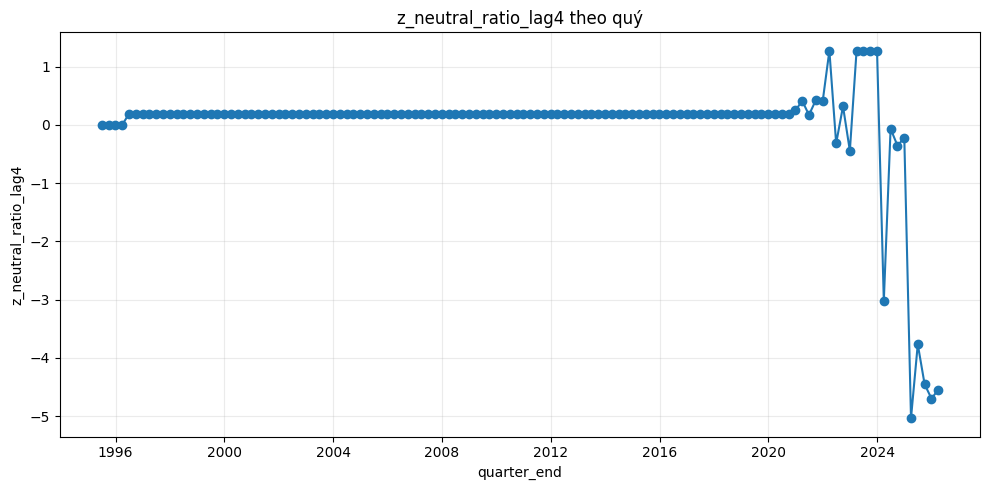

### Line plot: `z_neutral_ratio_diff1`

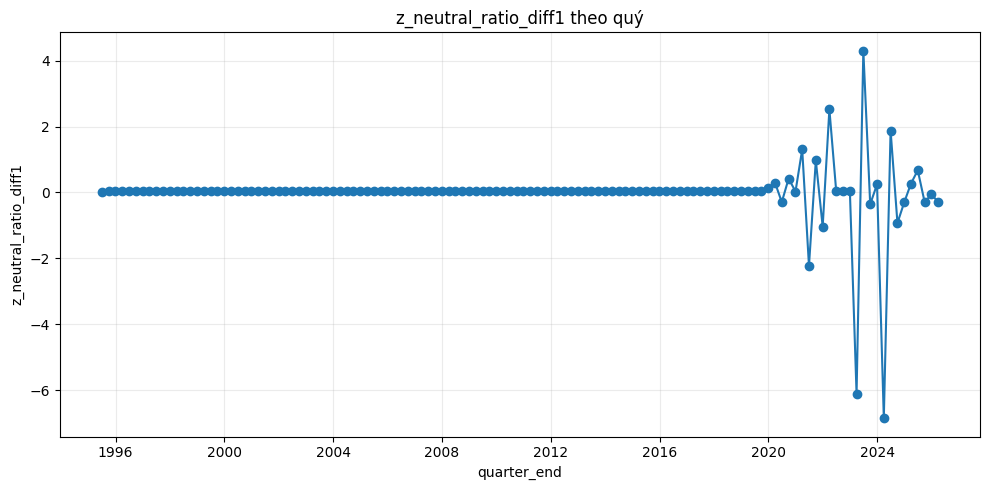

### Line plot: `z_neutral_ratio_diff4`

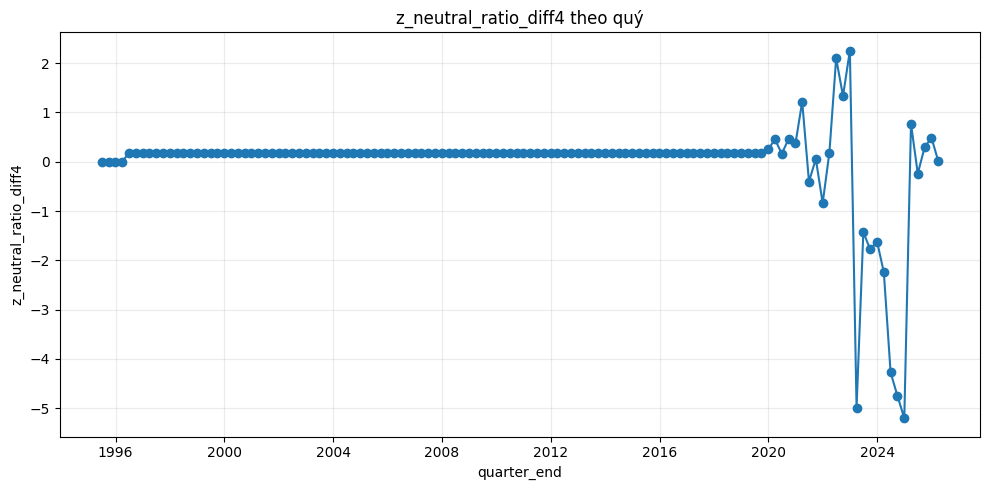

### Line plot: `z_neutral_ratio_qoq_pct`

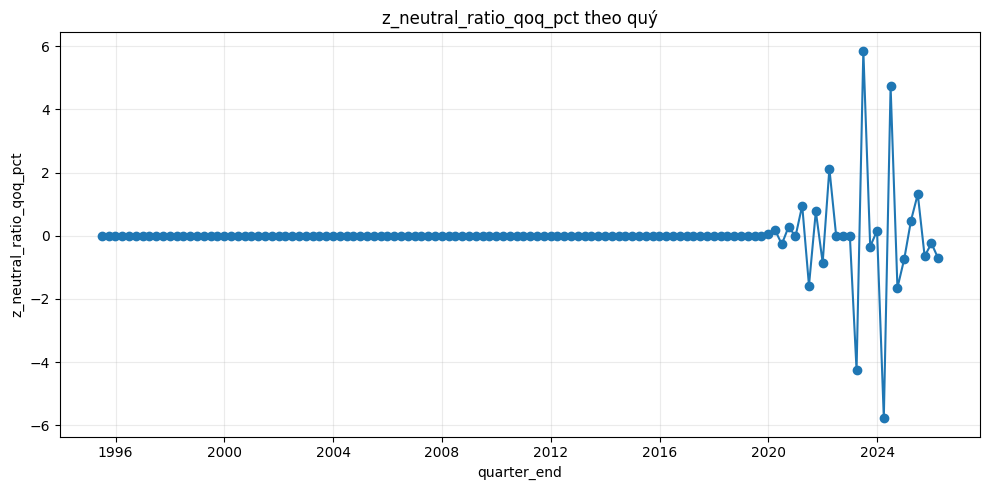

### Line plot: `z_neutral_ratio_yoy_pct`

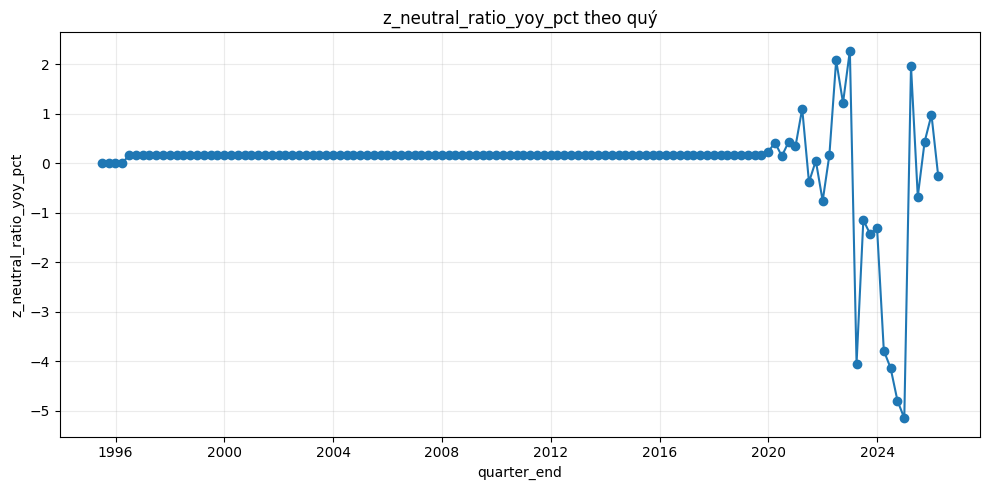

### Line plot: `z_net_sentiment_lag1`

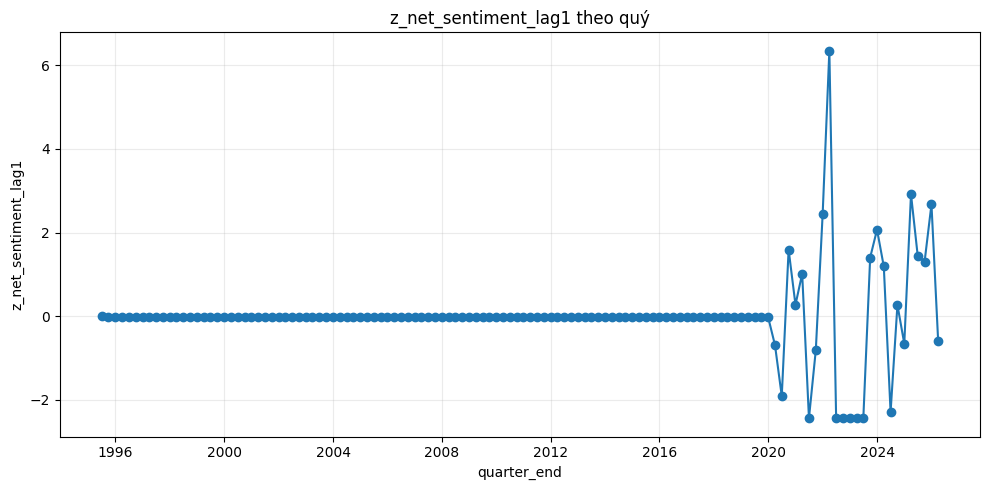

### Line plot: `z_net_sentiment_lag4`

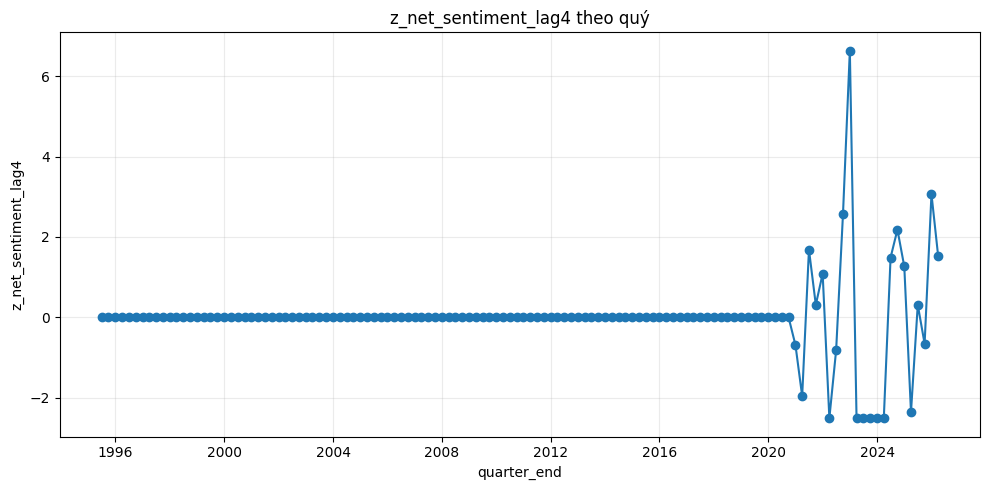

### Line plot: `z_net_sentiment_diff1`

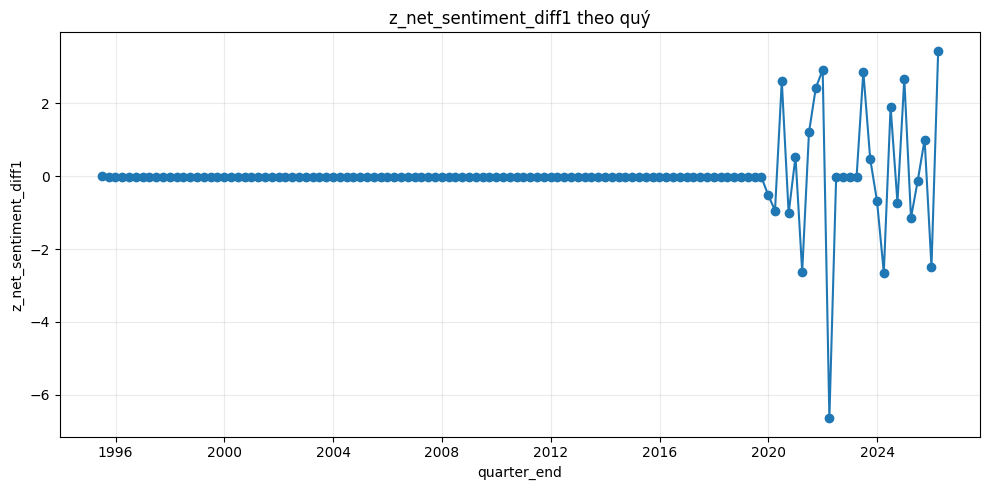

### Line plot: `z_net_sentiment_diff4`

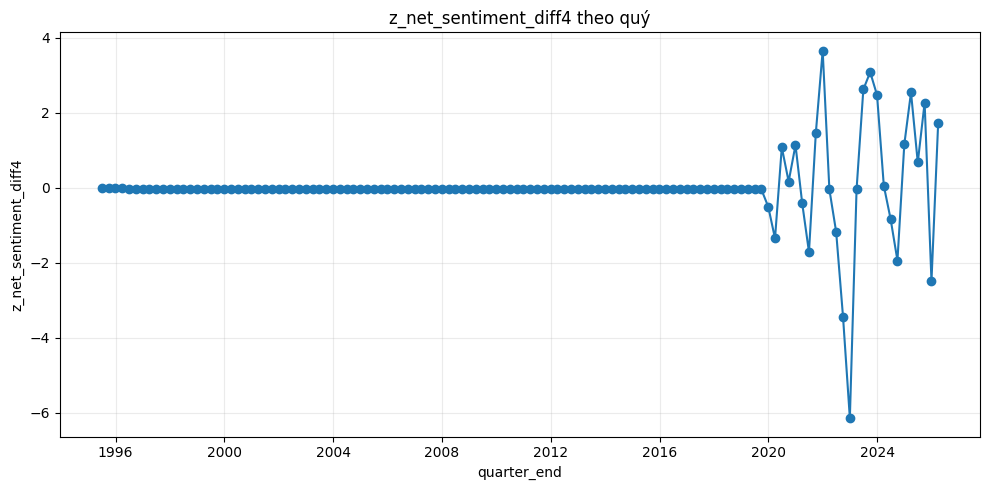

### Line plot: `z_weighted_sentiment_like_lag1`

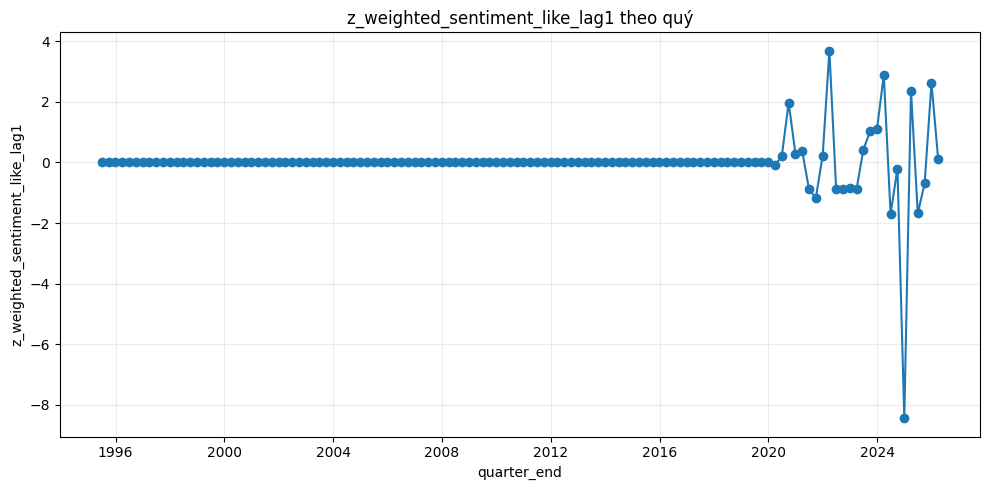

### Line plot: `z_weighted_sentiment_like_lag4`

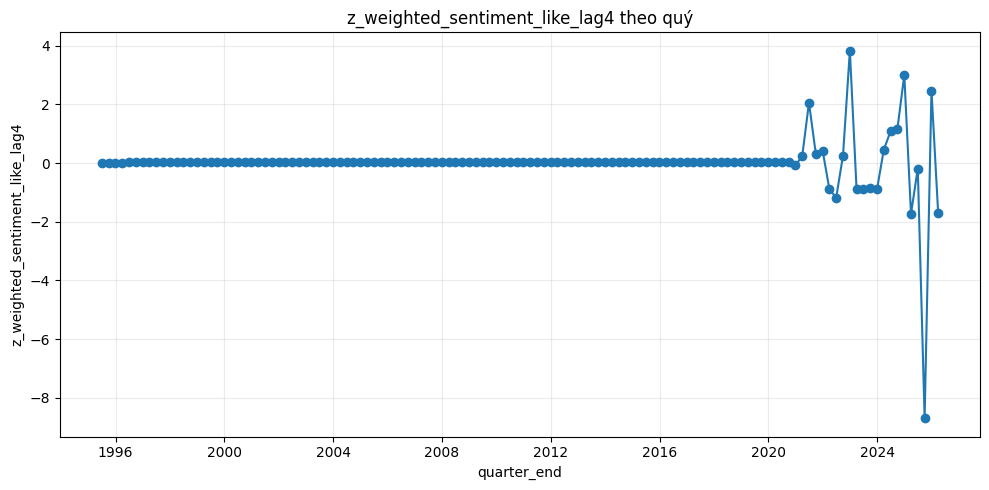

### Line plot: `z_weighted_sentiment_like_diff1`

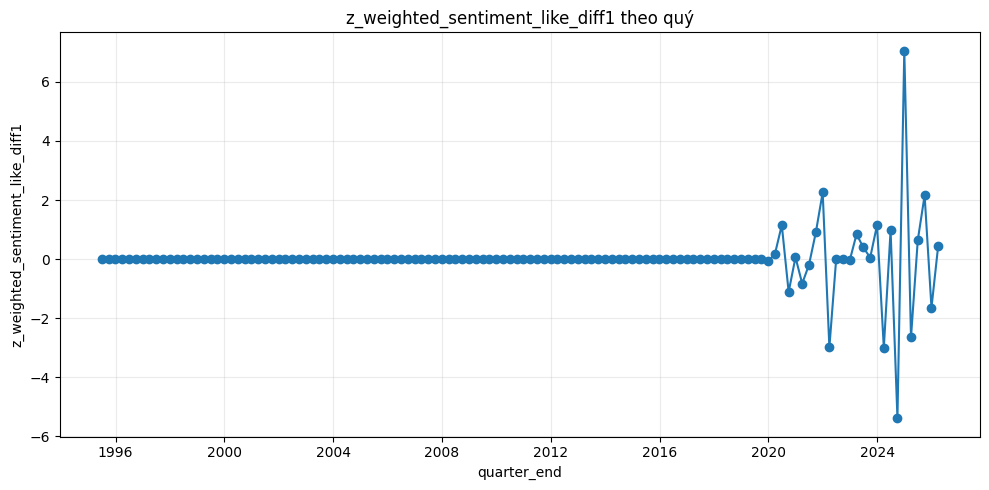

### Line plot: `z_weighted_sentiment_like_diff4`

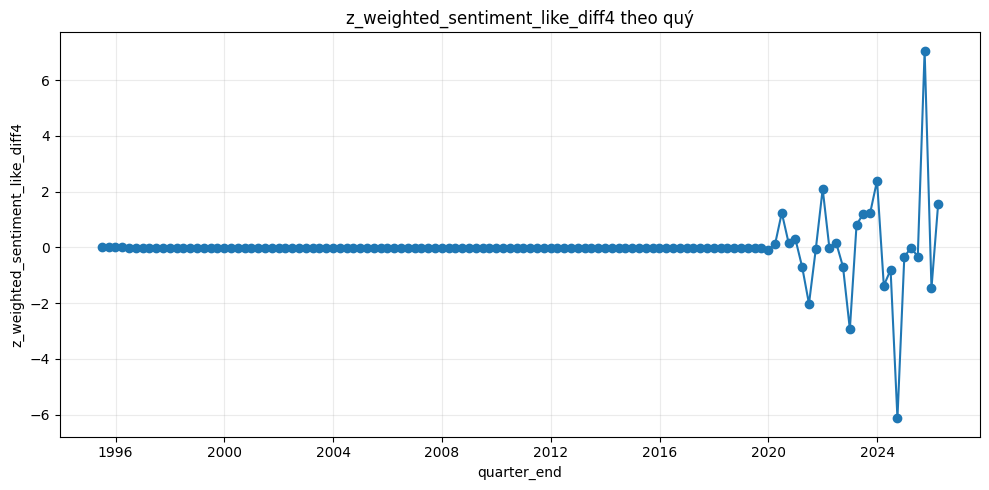

### Line plot: `z_p10_sentiment_lag1`

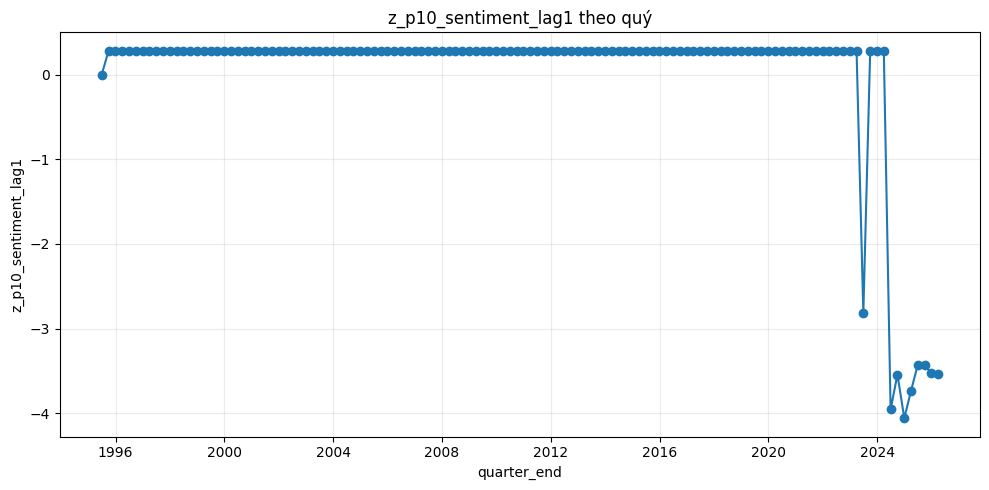

### Line plot: `z_p10_sentiment_lag4`

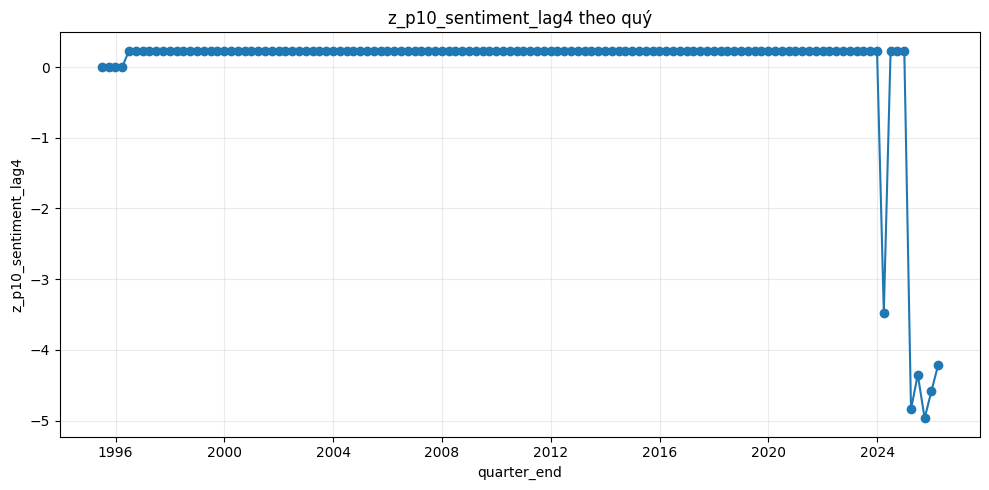

### Line plot: `z_p10_sentiment_diff1`

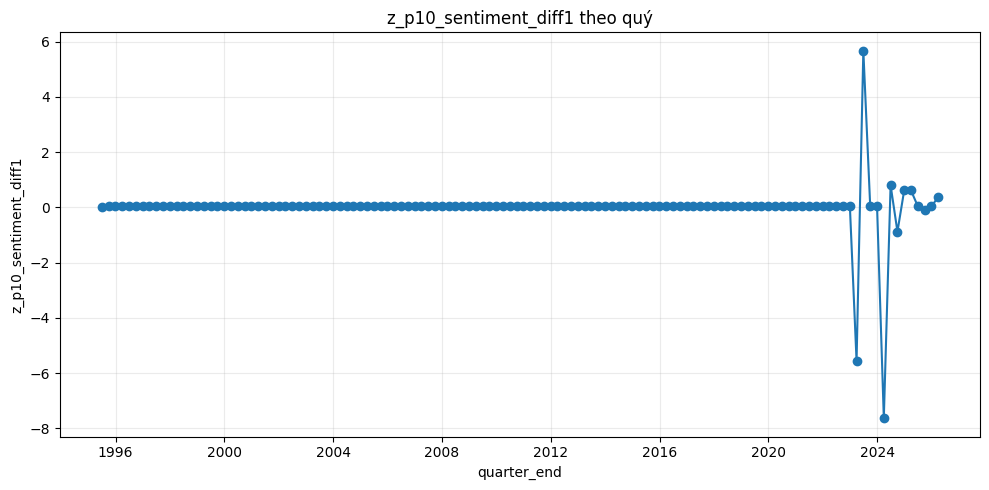

### Line plot: `z_p10_sentiment_diff4`

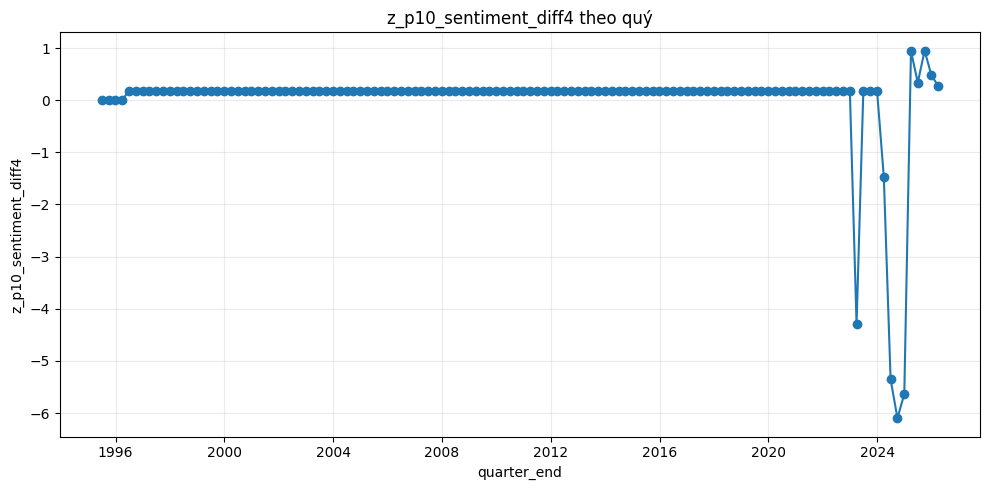

### Line plot: `z_p90_sentiment_lag1`

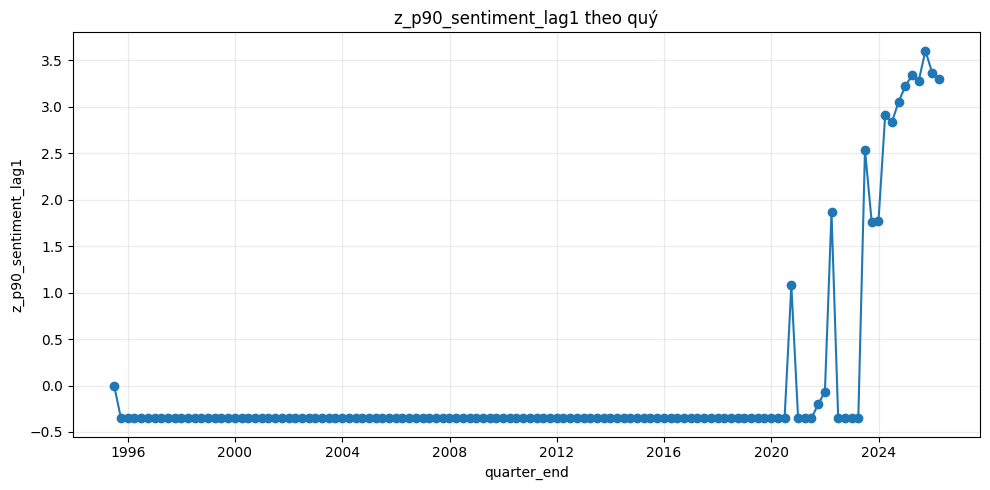

### Line plot: `z_p90_sentiment_lag4`

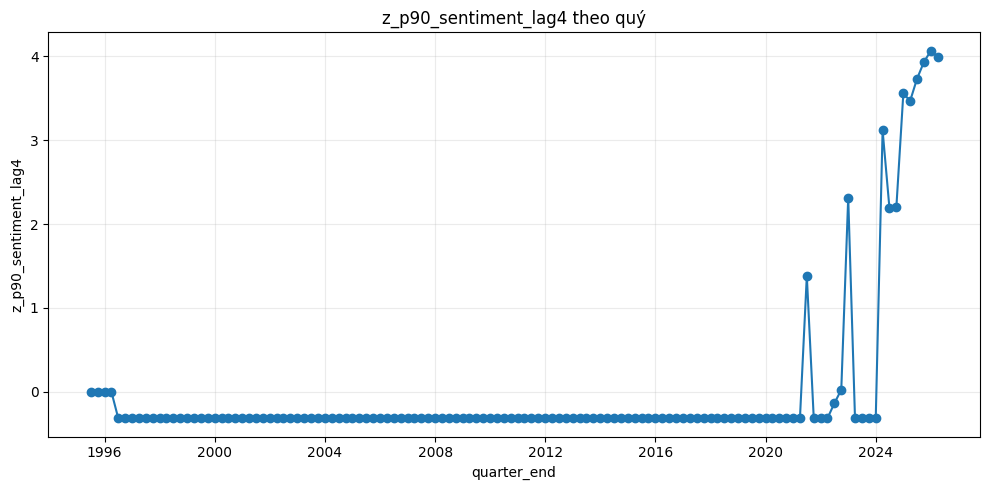

### Line plot: `z_p90_sentiment_diff1`

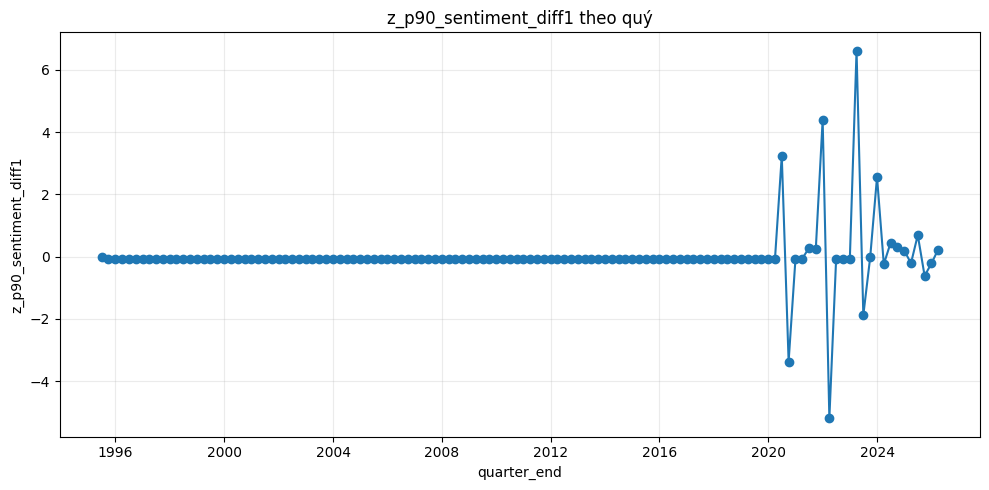

### Line plot: `z_p90_sentiment_diff4`

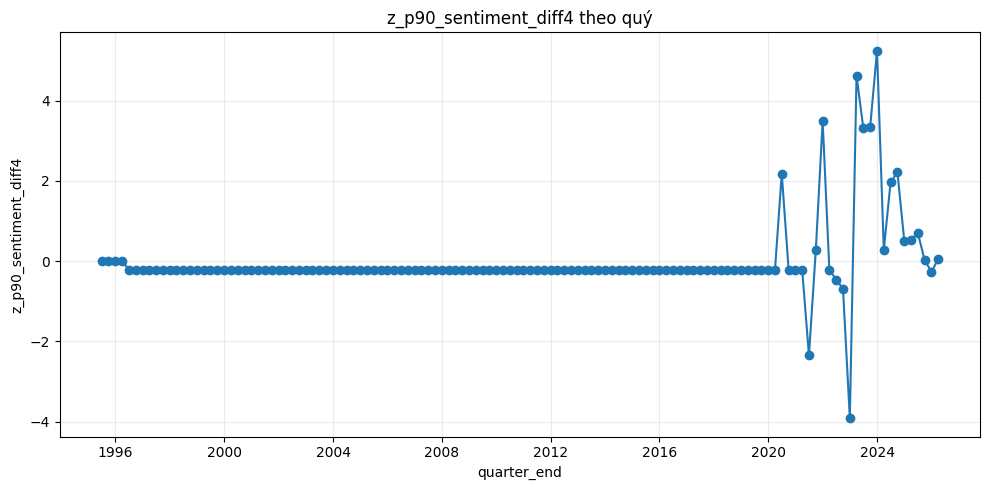

In [11]:

primary_candidates = {
    "gdp": [c for c in model_df_sorted.columns if "gdp" in c.lower() and not c.startswith("z_")],
    "cpi": [c for c in model_df_sorted.columns if any(k in c.lower() for k in ["cpi", "inflation"]) and not c.startswith("z_")],
    "rate": [c for c in model_df_sorted.columns if any(k in c.lower() for k in ["interest_rate", "real_interest_rate", "policy_rate"]) and not c.startswith("z_")],
    "sentiment": [c for c in model_df_sorted.columns if c in ["avg_sentiment", "net_sentiment", "weighted_sentiment_like"]],
}

if DISPLAY_ALL_LINE_PLOTS:
    cols_to_plot = num_cols
else:
    cols_to_plot = []
    for key in ["gdp", "cpi", "rate", "sentiment"]:
        if primary_candidates[key]:
            cols_to_plot.append(primary_candidates[key][0])

for c in cols_to_plot:
    display(Markdown(f"### Line plot: `{c}`"))
    plot_line_inline(
        model_df_sorted,
        x="quarter_end",
        y=c,
        outpath=PLOTS_DIR / f"line_{c}.png",
        title=f"{c} theo quý",
    )


## 12. Scatter plots chính

Phần này hiển thị trực tiếp các biểu đồ:
- GDP vs CPI/Inflation
- GDP vs Interest rate
- GDP vs Sentiment


### Scatter: `gdp_raw` vs `inflation`

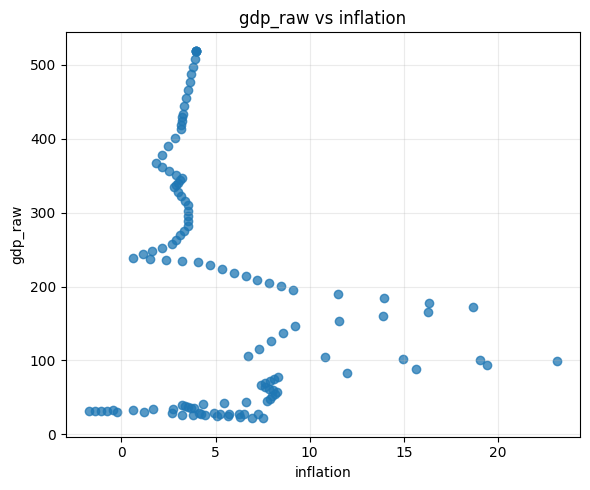

### Scatter: `gdp_raw` vs `interest_rate`

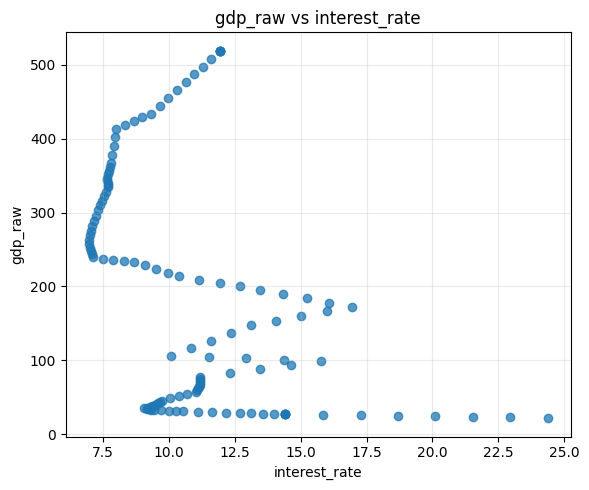

### Scatter: `gdp_raw` vs `avg_sentiment`

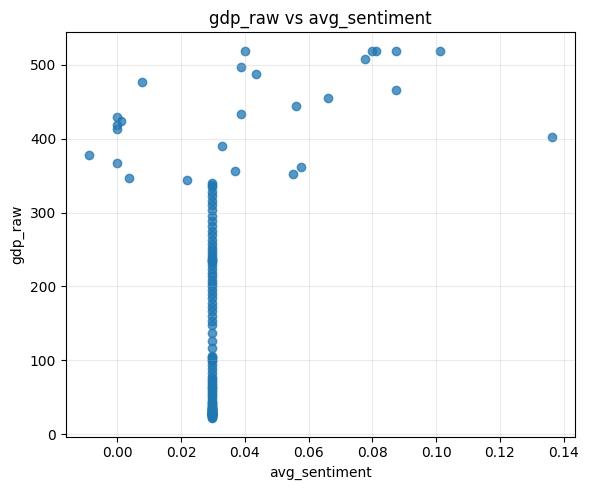

In [12]:

if primary_candidates["gdp"] and primary_candidates["cpi"]:
    x = primary_candidates["cpi"][0]
    y = primary_candidates["gdp"][0]
    display(Markdown(f"### Scatter: `{y}` vs `{x}`"))
    plot_scatter_inline(
        model_df_sorted,
        x=x,
        y=y,
        outpath=PLOTS_DIR / "scatter_gdp_vs_cpi.png",
        title=f"{y} vs {x}"
    )

if primary_candidates["gdp"] and primary_candidates["rate"]:
    x = primary_candidates["rate"][0]
    y = primary_candidates["gdp"][0]
    display(Markdown(f"### Scatter: `{y}` vs `{x}`"))
    plot_scatter_inline(
        model_df_sorted,
        x=x,
        y=y,
        outpath=PLOTS_DIR / "scatter_gdp_vs_rate.png",
        title=f"{y} vs {x}"
    )

if primary_candidates["gdp"] and primary_candidates["sentiment"]:
    x = primary_candidates["sentiment"][0]
    y = primary_candidates["gdp"][0]
    display(Markdown(f"### Scatter: `{y}` vs `{x}`"))
    plot_scatter_inline(
        model_df_sorted,
        x=x,
        y=y,
        outpath=PLOTS_DIR / "scatter_gdp_vs_sentiment.png",
        title=f"{y} vs {x}"
    )


## 13. Seasonal decomposition và hiển thị trực tiếp trong notebook

### Các biến sẽ decomposition

,column
0,gdp_raw
1,inflation
2,avg_sentiment


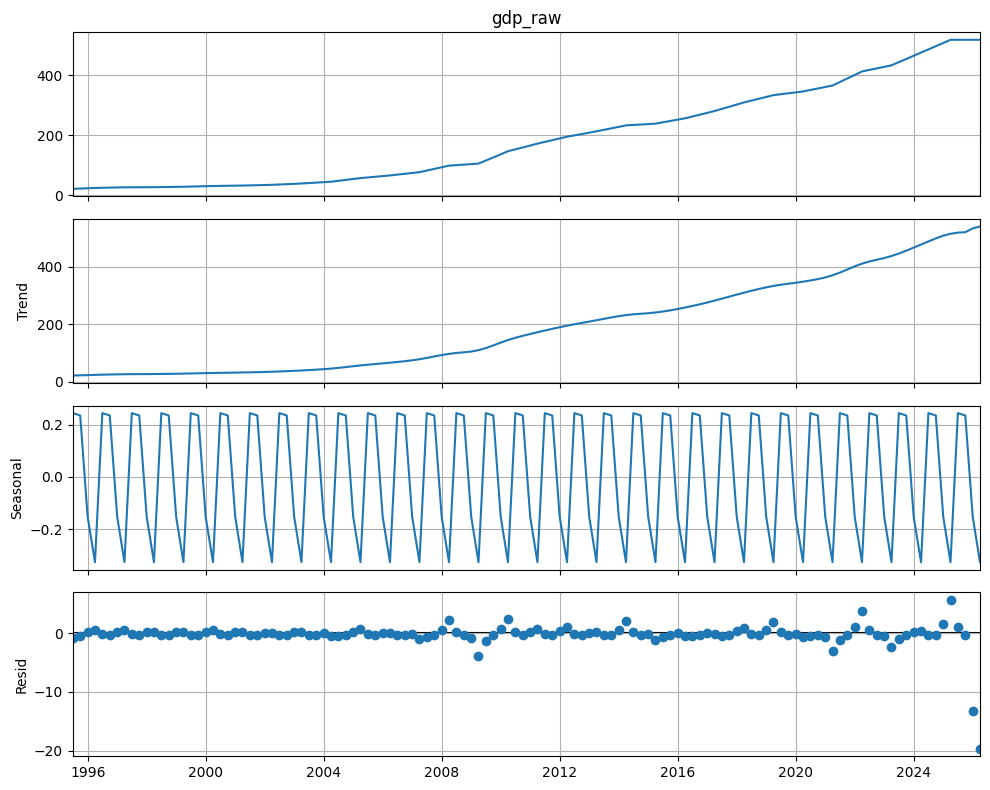

**Decomposition components for `gdp_raw`**

,quarter_end,observed,trend,seasonal,resid
quarter_end,,,,,
1995-06-30,1995-06-30,21.703,22.247462,0.244153,-0.788616
1995-09-30,1995-09-30,22.681,22.958437,0.235122,-0.512559
1995-12-31,1995-12-31,23.669,23.614750,-0.152867,0.207117
1996-03-31,1996-03-31,24.657,24.435000,-0.326408,0.548408
1996-06-30,1996-06-30,25.201,25.146125,0.244153,-0.189278
1996-09-30,1996-09-30,25.745,25.747625,0.235122,-0.237747
1996-12-31,1996-12-31,26.294,26.237625,-0.152867,0.209242
1997-03-31,1997-03-31,26.844,26.614250,-0.326408,0.556158
1997-06-30,1997-06-30,26.934,26.877125,0.244153,-0.187278


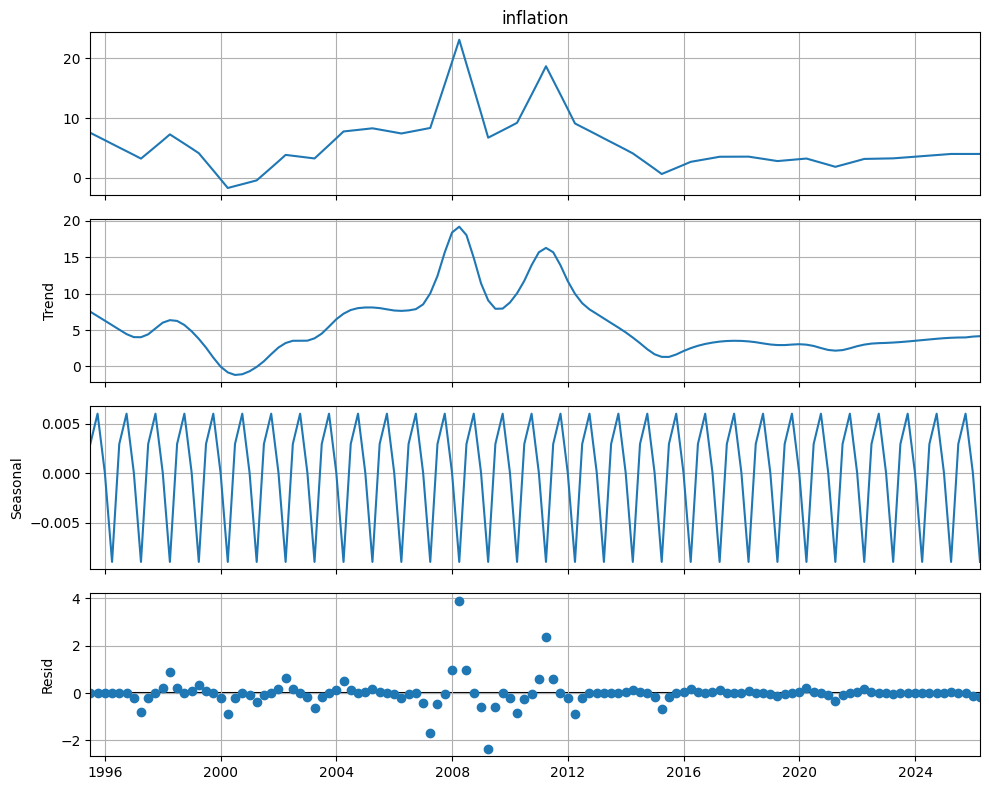

**Decomposition components for `inflation`**

,quarter_end,observed,trend,seasonal,resid
quarter_end,,,,,
1995-06-30,1995-06-30,7.527,7.527338,0.002940,-0.003278
1995-09-30,1995-09-30,6.914,6.911000,0.006008,-0.003008
1995-12-31,1995-12-31,6.295,6.294625,0.000028,0.000347
1996-03-31,1996-03-31,5.675,5.678375,-0.008976,0.005601
1996-06-30,1996-06-30,5.062,5.062000,0.002940,-0.002940
1996-09-30,1996-09-30,4.449,4.445625,0.006008,-0.002633
1996-12-31,1996-12-31,3.829,4.031000,0.000028,-0.202028
1997-03-31,1997-03-31,3.210,4.021000,-0.008976,-0.802024
1997-06-30,1997-06-30,4.210,4.419375,0.002940,-0.212315


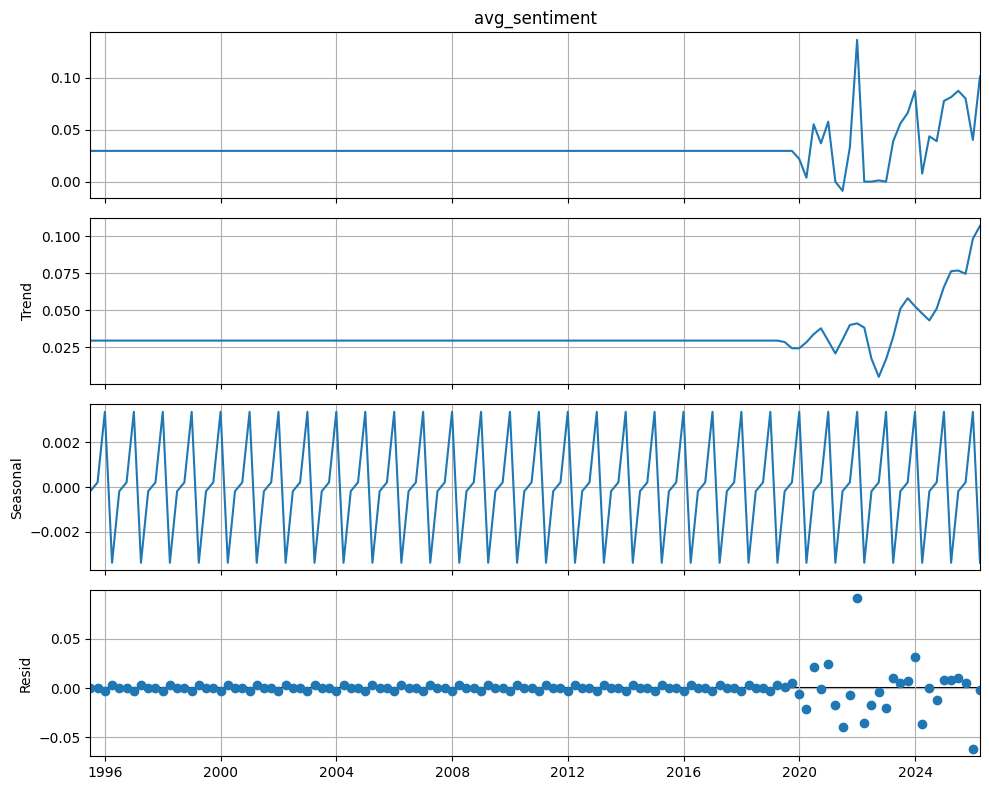

**Decomposition components for `avg_sentiment`**

,quarter_end,observed,trend,seasonal,resid
quarter_end,,,,,
1995-06-30,1995-06-30,0.029559,0.029559,-0.000188,0.000188
1995-09-30,1995-09-30,0.029559,0.029559,0.000209,-0.000209
1995-12-31,1995-12-31,0.029559,0.029559,0.003378,-0.003378
1996-03-31,1996-03-31,0.029559,0.029559,-0.003400,0.003400
1996-06-30,1996-06-30,0.029559,0.029559,-0.000188,0.000188
1996-09-30,1996-09-30,0.029559,0.029559,0.000209,-0.000209
1996-12-31,1996-12-31,0.029559,0.029559,0.003378,-0.003378
1997-03-31,1997-03-31,0.029559,0.029559,-0.003400,0.003400
1997-06-30,1997-06-30,0.029559,0.029559,-0.000188,0.000188


### Tóm tắt decomposition

,column,period,n_obs
0,gdp_raw,4,124
1,inflation,4,124
2,avg_sentiment,4,124


In [13]:

decomp_candidates = []
for key in ["gdp", "cpi", "sentiment"]:
    if primary_candidates[key]:
        decomp_candidates.append(primary_candidates[key][0])

display(Markdown("### Các biến sẽ decomposition"))
display(pd.DataFrame({"column": decomp_candidates}))

decomp_summary = run_decomposition_inline(
    model_df_sorted,
    date_col="quarter_end",
    cols=decomp_candidates,
    outdir=DECOMP_DIR,
    period=4,
    display_plots=DISPLAY_DECOMPOSITION_PLOTS,
)

if not decomp_summary.empty:
    decomp_summary.to_csv(EDA_DIR / "decomposition_summary.csv", index=False, encoding="utf-8-sig")
    display(Markdown("### Tóm tắt decomposition"))
    display(decomp_summary)


## 14. Hồi quy OLS sơ bộ (tuỳ chọn)

Cell này chỉ chạy nếu `RUN_BASELINE_OLS = True`.


In [14]:

ols_result = None
if RUN_BASELINE_OLS:
    ols_result = run_optional_baseline_ols(model_df_sorted, EDA_DIR)
    if ols_result is not None:
        coef_df, summary_text = ols_result
        display(Markdown("### Baseline OLS coefficients"))
        display(coef_df)

        display(Markdown("### Baseline OLS summary"))
        print(summary_text)
    else:
        print("Không chạy được OLS với bộ dữ liệu hiện tại.")
else:
    print("RUN_BASELINE_OLS = False nên bỏ qua bước OLS.")


RUN_BASELINE_OLS = False nên bỏ qua bước OLS.


## 15. Tổng kết output và hiển thị danh sách file đã sinh ra

In [15]:

summary = {
    "sentiment_raw_cleaned_csv": str((OUTDIR / "sentiment_raw_cleaned.csv").resolve()),
    "sentiment_monthly_cleaned_csv": str((OUTDIR / "sentiment_monthly_cleaned.csv").resolve()),
    "sentiment_quarterly_cleaned_by_topic_csv": str((OUTDIR / "sentiment_quarterly_cleaned_by_topic.csv").resolve()),
    "model_ready_quarterly_with_scaled_csv": str((OUTDIR / "model_ready_quarterly_with_scaled.csv").resolve()),
    "scaler_parameters_csv": str((OUTDIR / "scaler_parameters.csv").resolve()),
    "macro_quarterly_prepared_csv": str((OUTDIR / "macro_quarterly_prepared.csv").resolve()) if macro_q is not None else None,
    "eda_descriptive_stats_csv": str((EDA_DIR / "eda_descriptive_stats.csv").resolve()),
    "eda_correlation_matrix_csv": str((EDA_DIR / "eda_correlation_matrix.csv").resolve()),
    "stationarity_tests_csv": str((EDA_DIR / "stationarity_tests.csv").resolve()),
    "plots_dir": str(PLOTS_DIR.resolve()),
    "decomposition_dir": str(DECOMP_DIR.resolve()),
}

with open(OUTDIR / "final_summary.json", "w", encoding="utf-8") as f:
    json.dump(summary, f, ensure_ascii=False, indent=2)

display(Markdown("### Summary"))
print(json.dumps(summary, ensure_ascii=False, indent=2))

display(Markdown("### Danh sách file trong thư mục output"))
all_files = sorted([str(p.relative_to(OUTDIR)) for p in OUTDIR.rglob("*") if p.is_file()])
display(pd.DataFrame({"file": all_files}))


### Summary

{
  "sentiment_raw_cleaned_csv": "/Users/TranAnh/Documents/Data_file_NCKH/cleaned_public_sentiment_quarterly_notebook/sentiment_raw_cleaned.csv",
  "sentiment_monthly_cleaned_csv": "/Users/TranAnh/Documents/Data_file_NCKH/cleaned_public_sentiment_quarterly_notebook/sentiment_monthly_cleaned.csv",
  "sentiment_quarterly_cleaned_by_topic_csv": "/Users/TranAnh/Documents/Data_file_NCKH/cleaned_public_sentiment_quarterly_notebook/sentiment_quarterly_cleaned_by_topic.csv",
  "model_ready_quarterly_with_scaled_csv": "/Users/TranAnh/Documents/Data_file_NCKH/cleaned_public_sentiment_quarterly_notebook/model_ready_quarterly_with_scaled.csv",
  "scaler_parameters_csv": "/Users/TranAnh/Documents/Data_file_NCKH/cleaned_public_sentiment_quarterly_notebook/scaler_parameters.csv",
  "macro_quarterly_prepared_csv": "/Users/TranAnh/Documents/Data_file_NCKH/cleaned_public_sentiment_quarterly_notebook/macro_quarterly_prepared.csv",
  "eda_descriptive_stats_csv": "/Users/TranAnh/Documents/Data_file_NCKH/cl

### Danh sách file trong thư mục output

,file
0,eda/decomposition/decompose_avg_sentiment.csv
1,eda/decomposition/decompose_avg_sentiment.png
2,eda/decomposition/decompose_gdp_raw.csv
3,eda/decomposition/decompose_gdp_raw.png
4,eda/decomposition/decompose_inflation.csv
...,...
366,model_ready_quarterly_with_scaled.csv
367,scaler_parameters.csv
368,sentiment_monthly_cleaned.csv
369,sentiment_quarterly_cleaned_by_topic.csv
